<a href="https://colab.research.google.com/github/riti-agarwal/SURF/blob/main/synthetic_time_series.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

file to generate and plot the synthetic time series using the given formula:
A sin (2Πx/p)

Using numpy.uniform to generate uniform distribution of A values:

In [ ]:
import random
import numpy as np
tempA = np.random.uniform(0,1,40)
A = tempA.tolist()
print (A)
print (len(A))

[0.7341887842898309, 0.9618472685642518, 0.09235973253225593, 0.11015148461223456, 0.6699551267207918, 0.5466151487989748, 0.6208872033065532, 0.1454041565485652, 0.2640205378551411, 0.695695696905578, 0.4110552536509001, 0.9232859957749534, 0.1837150830063431, 0.5514565707541761, 0.9506762125314567, 0.6186389620149111, 0.052581854846774245, 0.5122888649433208, 0.7274667338367685, 0.0304166043768771, 0.35630021699698866, 0.6672464774217824, 0.6378255196735526, 0.802160434572809, 0.13966637936931614, 0.8698054264400497, 0.3569978141861371, 0.5432738428996361, 0.23914196171242796, 0.5980348229767398, 0.5871015846452559, 0.17866047466599155, 0.644326593466421, 0.0650662328556626, 0.5842001621526641, 0.18669998617636008, 0.27742760019818113, 0.08524332007800128, 0.5652853120695707, 0.135823601693831]
40


Using numpy.uniform to generate uniform distribution of p values:

In [ ]:
tempP = np.random.uniform(0.5,10,40)
P = tempP.tolist()
print (P)
print (len(P))

[8.194623871954693, 2.3036367804927718, 1.2035918008088111, 1.5705126045498792, 7.4247100908357755, 8.52990283894153, 5.772189436735123, 8.242338166992182, 8.711166880825903, 8.267359978325409, 7.4438020863412735, 5.260529601774614, 2.487376983726617, 4.015881995135625, 7.535972609561831, 6.815869462692696, 9.293496066415358, 6.217184172314832, 1.873831158686912, 7.0917539591113306, 2.376990227595586, 7.293389344928906, 5.5665673500704935, 1.8900711189866033, 2.283823858465487, 4.768707313316914, 5.731174188467509, 3.211679914138899, 3.131554019944205, 6.292016615037019, 6.810669294160953, 9.226221287823096, 5.43629331754575, 0.647581206712176, 9.136639671651537, 1.173956202164797, 1.7998002292161523, 5.618249699107195, 4.65538127208465, 4.502285010920291]
40


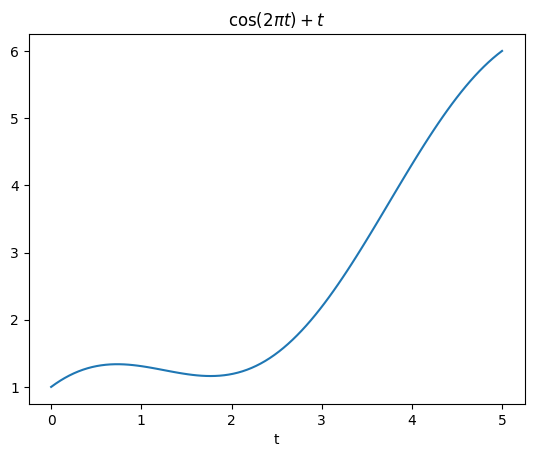

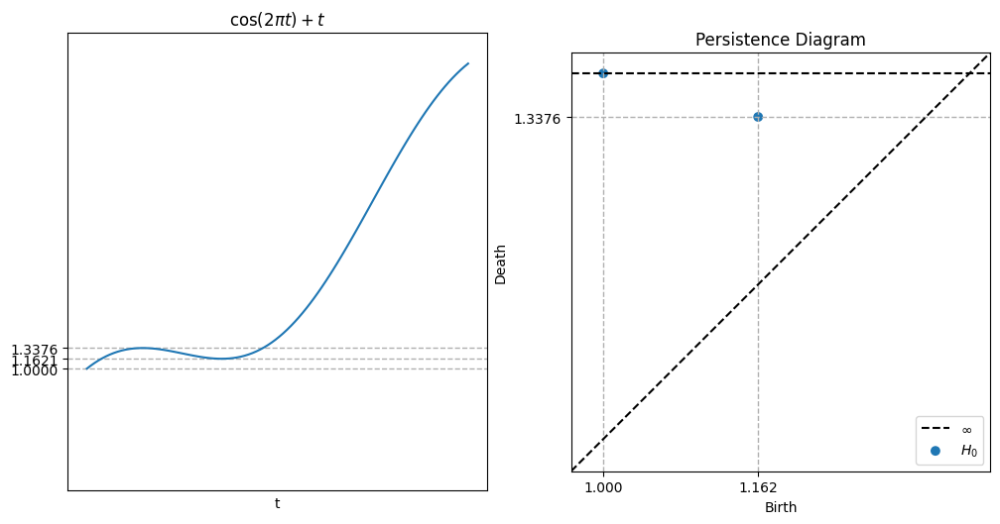

In [ ]:
"""
!pip install ripser
!pip install persim
!pip install scipy
"""

import numpy as np
import matplotlib.pyplot as plt
from scipy import sparse
import time

from ripser import ripser
from persim import plot_diagrams

N = 100 #The number of points
t = np.linspace(0, 5, N)
x = np.cos(2*np.pi*t/5) + t

plt.plot(t, x)
plt.title("$\\cos(2 \pi t) + t$")
plt.xlabel("t")

# Add edges between adjacent points in the time series, with the "distance"
# along the edge equal to the max value of the points it connects
I = np.arange(N-1)
J = np.arange(1, N)
V = np.maximum(x[0:-1], x[1::])
# Add vertex birth times along the diagonal of the distance matrix
I = np.concatenate((I, np.arange(N)))
J = np.concatenate((J, np.arange(N)))
V = np.concatenate((V, x))
#Create the sparse distance matrix
D = sparse.coo_matrix((V, (I, J)), shape=(N, N)).tocsr()
dgm0 = ripser(D, maxdim=0, distance_matrix=True)['dgms'][0]
dgm0 = dgm0[dgm0[:, 1]-dgm0[:, 0] > 1e-3, :]
allgrid = np.unique(dgm0.flatten())
allgrid = allgrid[allgrid < np.inf]
xs = np.unique(dgm0[:, 0])
ys = np.unique(dgm0[:, 1])
ys = ys[ys < np.inf]

#Plot the time series and the persistence diagram
plt.figure(figsize=(12, 6))
ylims = [-1, 6.5]
plt.subplot(121)
plt.plot(t, x)
ax = plt.gca()
ax.set_yticks(allgrid)
ax.set_xticks([])
plt.ylim(ylims)
plt.grid(linewidth=1, linestyle='--')
plt.title("$\\cos(2 \pi t) + t$")
plt.xlabel("t")

plt.subplot(122)
ax = plt.gca()
ax.set_yticks(ys)
ax.set_xticks(xs)
plt.ylim(ylims)
plt.grid(linewidth=1, linestyle='--')
plot_diagrams(dgm0, size=50)
plt.title("Persistence Diagram")


plt.show()

Using numpy.sin to actually get the x,y values when plotted for a specific value of A and p:

number of points are:  67
new


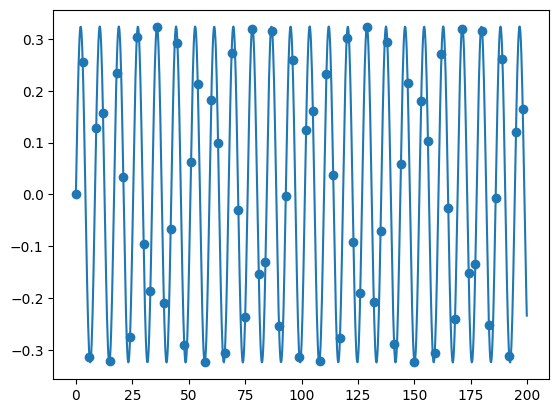

I is:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65]
J is:  [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66]
V is:  [ 0.25628738  0.25628738  0.12742865  0.15767222  0.15767222  0.23431859
  0.23431859  0.03364375  0.30344149  0.30344149 -0.09580736  0.32365624
  0.32365624 -0.06692375  0.29170468  0.29170468  0.06315023  0.21273669
  0.21273669  0.18304578  0.18304578  0.09948019  0.27343834  0.27343834
 -0.02981034  0.31975861  0.31975861 -0.13096108  0.31454078  0.31454078
 -0.00385185  0.25862584  0.25862584  0.12387821  0.16102606  0.16102606
  0.23164182  0.23164182  0.0374724   0.30206982  0.30206982 -0.09212099
  0.32381076  0.32381076 -0.07068781  0.29336048  0.29336048  0.

/usr/local/lib/python3.7/dist-packages/persim/visuals.py:155: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim([x_down, x_up])
/usr/local/lib/python3.7/dist-packages/persim/visuals.py:156: UserWarning: Attempting to set identical bottom == top == 0.0 results in singular transformations; automatically expanding.
  ax.set_ylim([y_down, y_up])


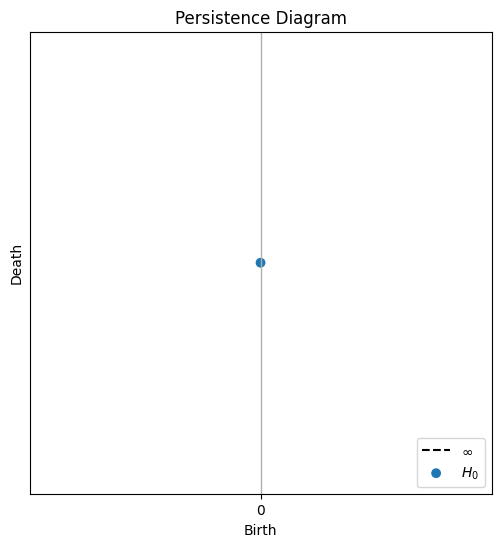

'\nimport ripser \nnumpy_x = np.array(x)\nnumpy_new_y = np.array(new_y)\nrips = Rips(maxdim = 2)\nw = 3\nn = len(numpy_new_y) - (2*w)+1\nwasserstein_dists = np.zeros((n, 1))\nfor i in range(n):\n  dgm1 = rips.fit_transform(r[i:i+w])\n  dgm2 = rips.fit_transform(r[i+w+1:i+(2*w)+1])\n  wasserstein_dists[i] = persim.wasserstein(dgm1[0], dgm2[0], matching = False)\n\n\n# plot wasserstein distances over time\nplt.figure(figsize=(18, 8), dpi=80)\nplt.rcParams.update({\'font.size\': 16})\n\nplt.plot(raw_data.index[w:n+w],wasserstein_dists)\nplt.plot(raw_data.index[w:n+w],df_close.iloc[w:n+w,0]/max(df_close.iloc[w:n+w,0]))\nplt.plot([raw_data.index[536], raw_data.index[536]], [0, 1], \'r--\')\nplt.legend([\'wasserstein distances\', \'S&P 500 (scaled)\', \'Crash of 2020\'])\nplt.xlabel(\'Date\')\nplt.title(\'Homology Changes Predicted Crash??\')\n\nplt.savefig("homology_example_Homology-Changes-Predicted-Crash??.png", dpi=\'figure\', format=None, metadata=None,\n        bbox_inches=None, pad_in

In [ ]:
"""
!pip install ripser
!pip install persim
!pip install scipy
"""

import numpy as np
import matplotlib.pyplot as plt
from scipy import sparse
import time

from ripser import ripser
from persim import plot_diagrams

x = []
y = []
z = []
for i in range(0,200):
  if (i%3 == 0):
    x.append(i)
N = len(x)
print ("number of points are: ", N)

for i in range(0,1000):
    z.append(200*i/1000)

tempY = np.sin(np.array(x)*2*np.pi/8.456)
#np.sin(np.array(x)*2*np.pi);

y = tempY.tolist()
new_y = [k * 0.324 for k in y]
print ("new")

tempY2 = np.sin(np.array(z)*2*np.pi/8.456);
y2 = tempY2.tolist()
new_y2 = [k * 0.324 for k in y2]
#temp_time = np.arange(0, , 2);
#time = temp_time.tolist()

#print ("length of z is: ", len(z))
#print ("length of y is: ", len(new_y))
#print (z)
#print (new_y)


plt.plot(z,new_y2)
plt.scatter(x,new_y)
#plt.plot(x,new_y)
plt.show()


I = np.arange(N-1)
J = np.arange(1, N)
V = np.maximum(new_y[0:-1], new_y[1::])
print ("I is: ",I)
print ("J is: ",J)
print ("V is: ",V)

I = np.concatenate((I, np.arange(N)))
J = np.concatenate((J, np.arange(N)))
V = np.concatenate((V, x))

D = sparse.coo_matrix((V, (I, J)), shape=(N, N)).tocsr()
print ("D is: ",D)
#problem in calculatiing dgm0
dgm0 = ripser(D, maxdim=0, distance_matrix=True)['dgms'][0]
dgm0 = dgm0[dgm0[:, 1]-dgm0[:, 0] > 1e-10, :]
print ("dgm0 is: ",dgm0)
#problem ends
allgrid = np.unique(dgm0.flatten())
allgrid = allgrid[allgrid < np.inf]
xs = np.unique(dgm0[:, 0])
ys = np.unique(dgm0[:, 1])
ys = ys[ys < np.inf]


plt.figure(figsize=(12, 6))
ylims = [-1, 1]
#plt.subplot(121)
#plt.scatter(x,new_y)
#ax = plt.gca()
#ax.set_yticks(allgrid)
#ax.set_xticks([])
#plt.ylim(ylims)
#plt.grid(linewidth=1, linestyle='--')
#plt.title("time series stuff")
#plt.xlabel("x")


#plt.subplot(122)
ax = plt.gca()
ax.set_yticks(ys)
ax.set_xticks(xs)
plt.ylim(ylims)
plt.grid(linewidth=1, linestyle='-')
plot_diagrams(dgm0, size=50)
plt.title("Persistence Diagram")


plt.show()



"""
import ripser
numpy_x = np.array(x)
numpy_new_y = np.array(new_y)
rips = Rips(maxdim = 2)
w = 3
n = len(numpy_new_y) - (2*w)+1
wasserstein_dists = np.zeros((n, 1))
for i in range(n):
  dgm1 = rips.fit_transform(r[i:i+w])
  dgm2 = rips.fit_transform(r[i+w+1:i+(2*w)+1])
  wasserstein_dists[i] = persim.wasserstein(dgm1[0], dgm2[0], matching = False)


# plot wasserstein distances over time
plt.figure(figsize=(18, 8), dpi=80)
plt.rcParams.update({'font.size': 16})

plt.plot(raw_data.index[w:n+w],wasserstein_dists)
plt.plot(raw_data.index[w:n+w],df_close.iloc[w:n+w,0]/max(df_close.iloc[w:n+w,0]))
plt.plot([raw_data.index[536], raw_data.index[536]], [0, 1], 'r--')
plt.legend(['wasserstein distances', 'S&P 500 (scaled)', 'Crash of 2020'])
plt.xlabel('Date')
plt.title('Homology Changes Predicted Crash??')

plt.savefig("homology_example_Homology-Changes-Predicted-Crash??.png", dpi='figure', format=None, metadata=None,
        bbox_inches=None, pad_inches=0.1,
        facecolor='white', edgecolor='auto')
"""





Final time series generation

length of x is:  67
length of y is:  67


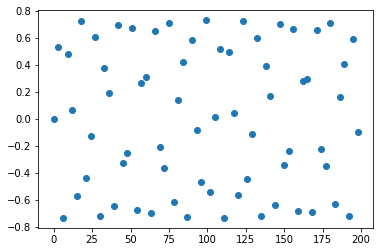

length of x is:  67
length of y is:  67


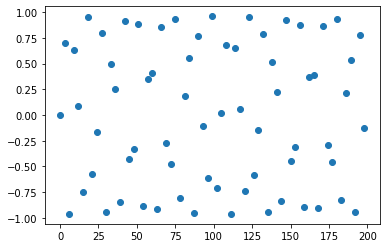

length of x is:  67
length of y is:  67


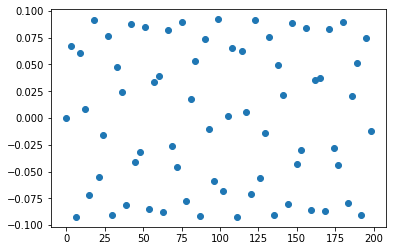

length of x is:  67
length of y is:  67


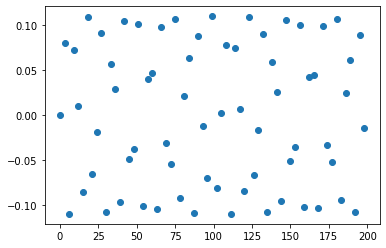

length of x is:  67
length of y is:  67


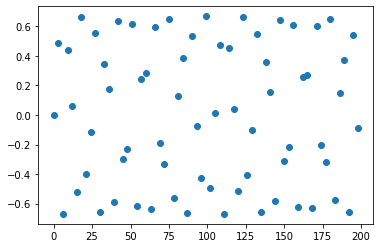

length of x is:  67
length of y is:  67


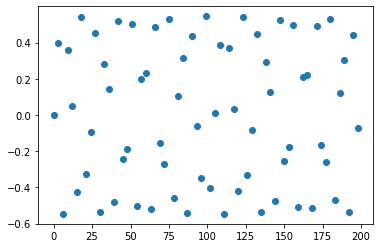

length of x is:  67
length of y is:  67


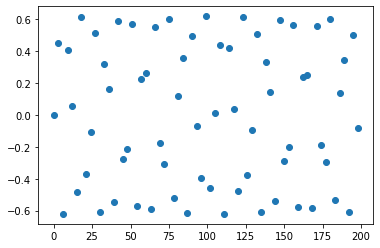

length of x is:  67
length of y is:  67


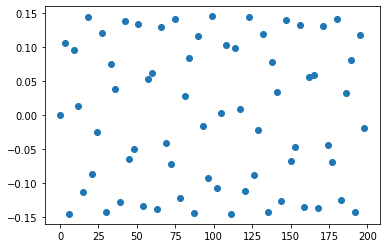

length of x is:  67
length of y is:  67


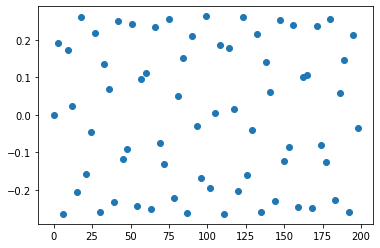

length of x is:  67
length of y is:  67


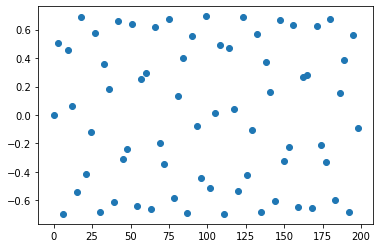

length of x is:  67
length of y is:  67


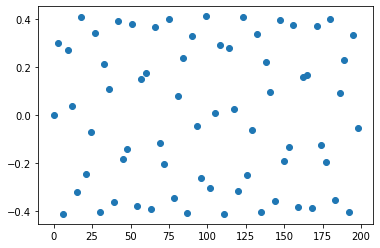

length of x is:  67
length of y is:  67


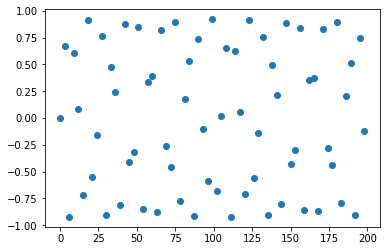

length of x is:  67
length of y is:  67


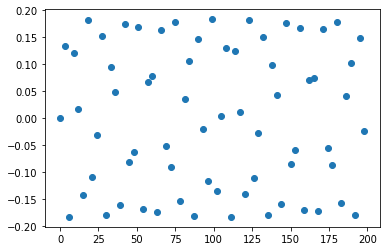

length of x is:  67
length of y is:  67


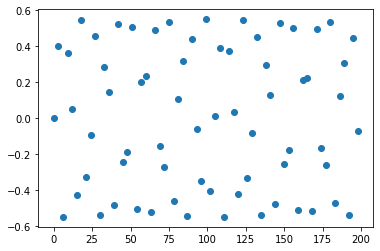

length of x is:  67
length of y is:  67


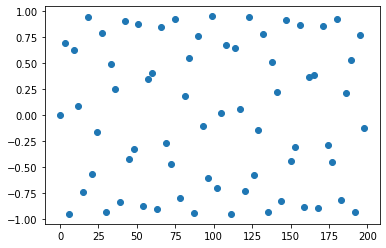

length of x is:  67
length of y is:  67


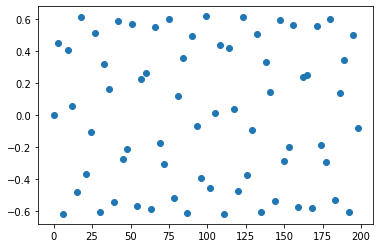

length of x is:  67
length of y is:  67


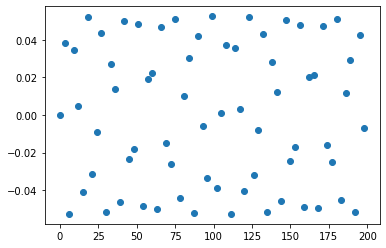

length of x is:  67
length of y is:  67


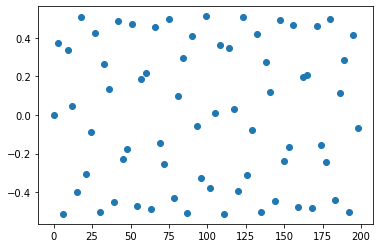

length of x is:  67
length of y is:  67


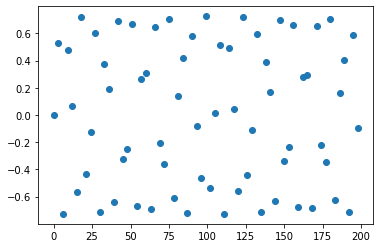

length of x is:  67
length of y is:  67


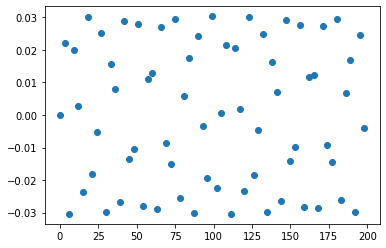

length of x is:  67
length of y is:  67


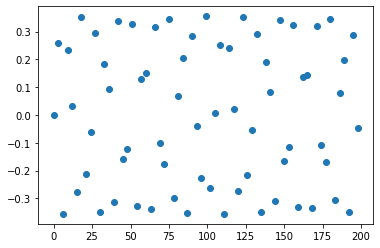

length of x is:  67
length of y is:  67


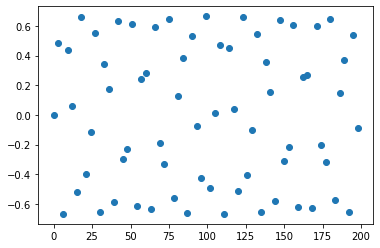

length of x is:  67
length of y is:  67


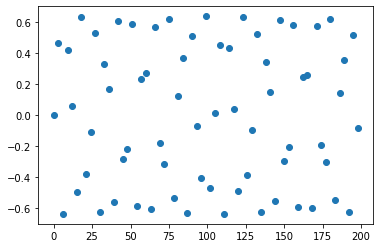

length of x is:  67
length of y is:  67


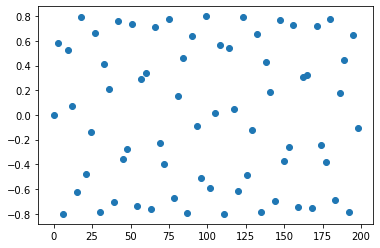

length of x is:  67
length of y is:  67


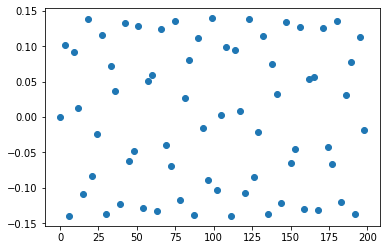

length of x is:  67
length of y is:  67


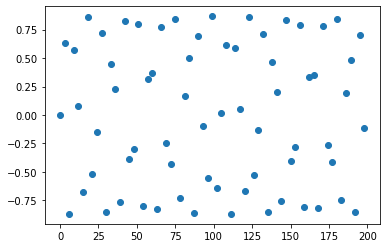

length of x is:  67
length of y is:  67


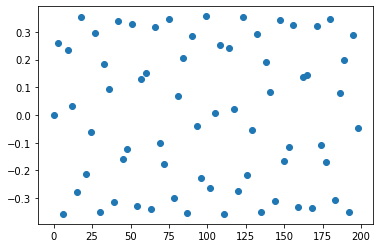

length of x is:  67
length of y is:  67


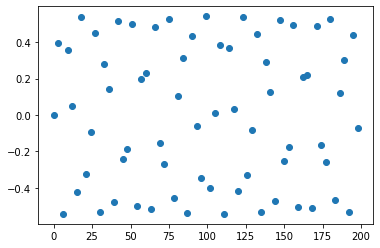

length of x is:  67
length of y is:  67


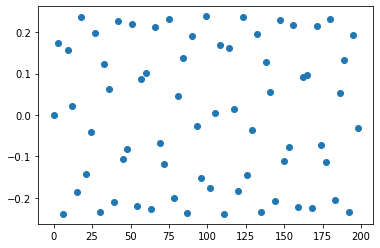

length of x is:  67
length of y is:  67


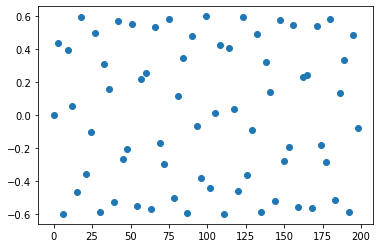

length of x is:  67
length of y is:  67


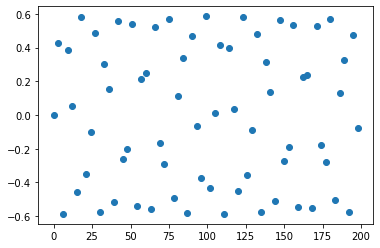

length of x is:  67
length of y is:  67


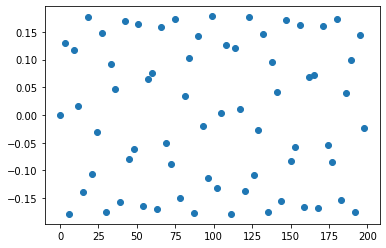

length of x is:  67
length of y is:  67


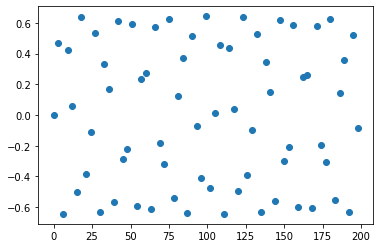

length of x is:  67
length of y is:  67


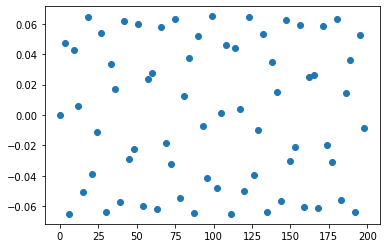

length of x is:  67
length of y is:  67


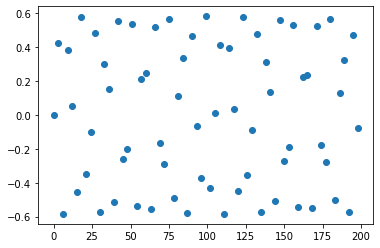

length of x is:  67
length of y is:  67


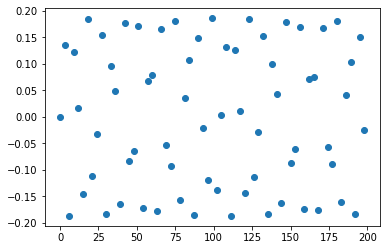

length of x is:  67
length of y is:  67


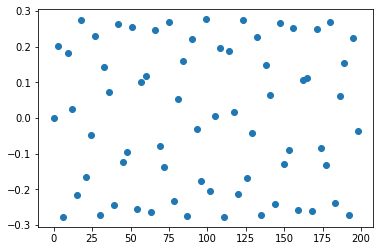

length of x is:  67
length of y is:  67


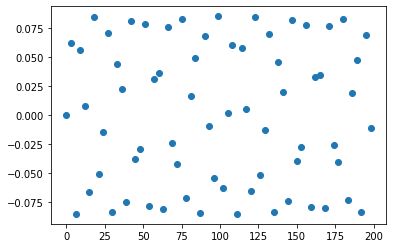

length of x is:  67
length of y is:  67


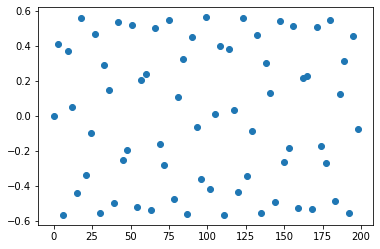

length of x is:  67
length of y is:  67


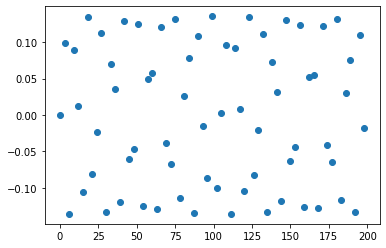

length of x is:  67
length of y is:  67


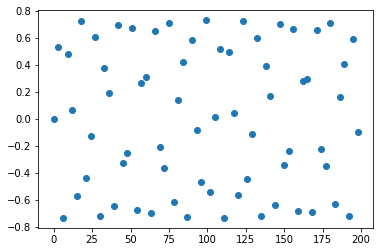

length of x is:  67
length of y is:  67


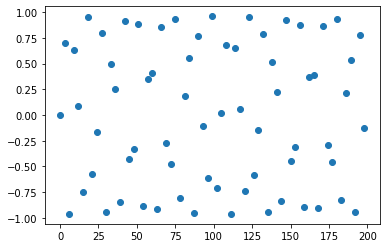

length of x is:  67
length of y is:  67


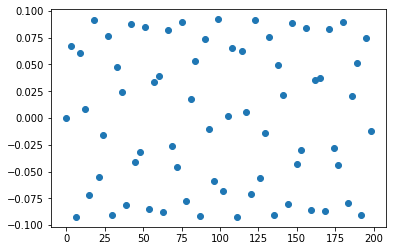

length of x is:  67
length of y is:  67


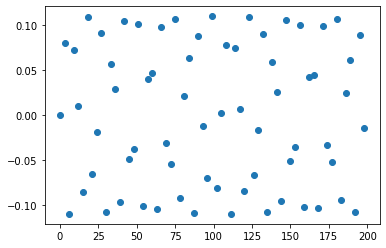

length of x is:  67
length of y is:  67


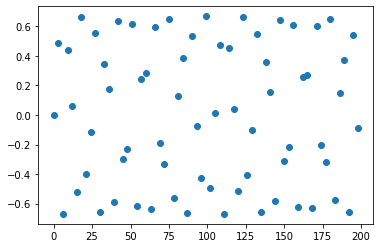

length of x is:  67
length of y is:  67


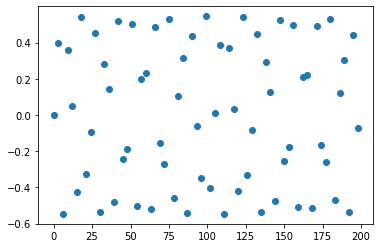

length of x is:  67
length of y is:  67


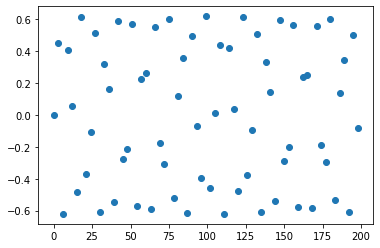

length of x is:  67
length of y is:  67


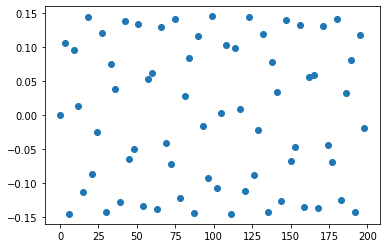

length of x is:  67
length of y is:  67


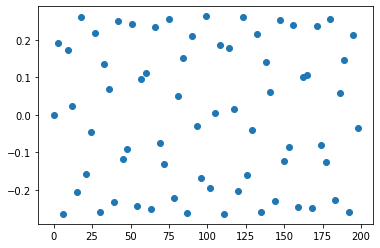

length of x is:  67
length of y is:  67


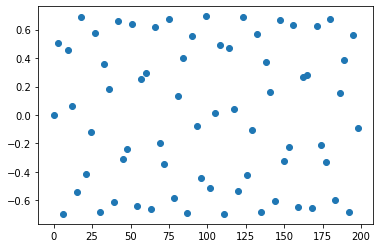

length of x is:  67
length of y is:  67


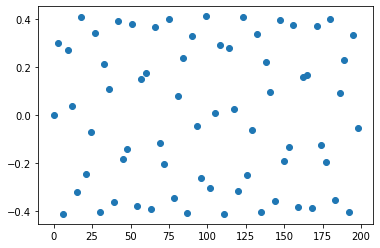

length of x is:  67
length of y is:  67


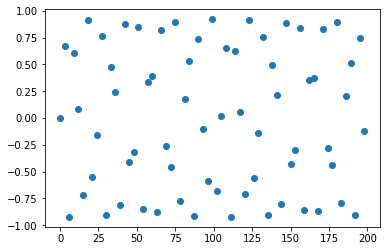

length of x is:  67
length of y is:  67


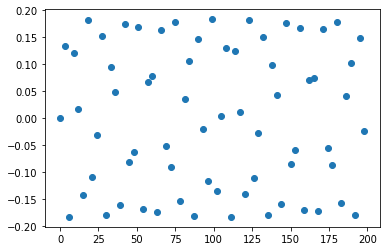

length of x is:  67
length of y is:  67


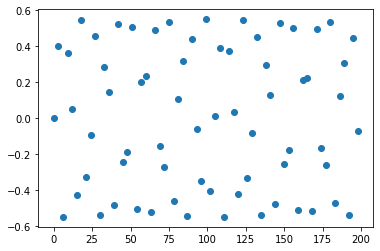

length of x is:  67
length of y is:  67


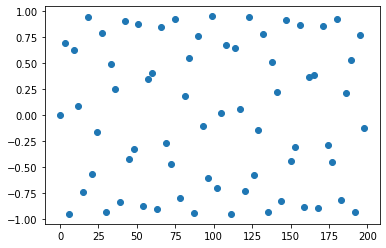

length of x is:  67
length of y is:  67


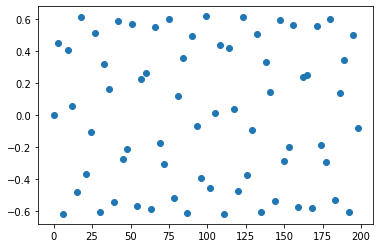

length of x is:  67
length of y is:  67


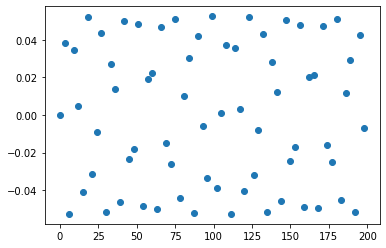

length of x is:  67
length of y is:  67


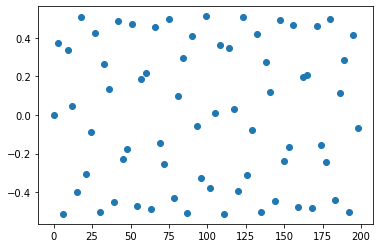

length of x is:  67
length of y is:  67


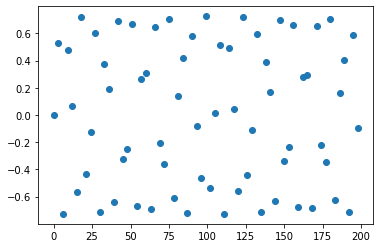

length of x is:  67
length of y is:  67


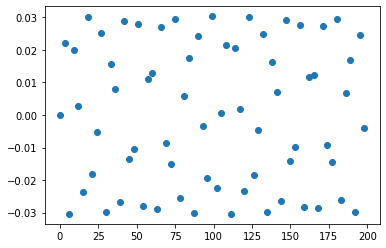

length of x is:  67
length of y is:  67


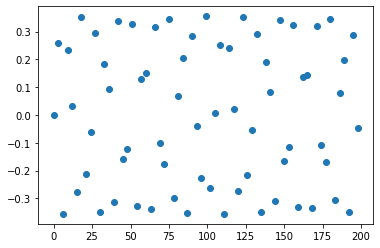

length of x is:  67
length of y is:  67


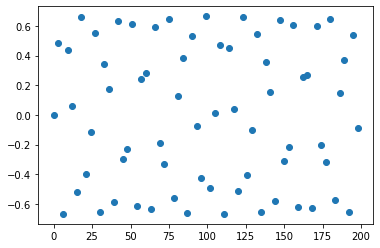

length of x is:  67
length of y is:  67


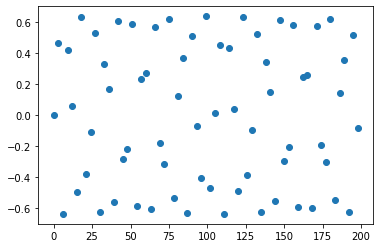

length of x is:  67
length of y is:  67


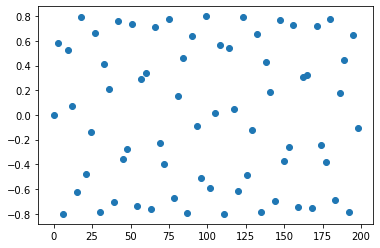

length of x is:  67
length of y is:  67


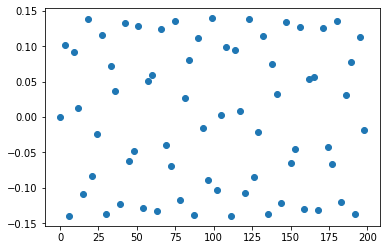

length of x is:  67
length of y is:  67


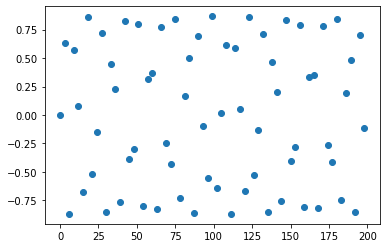

length of x is:  67
length of y is:  67


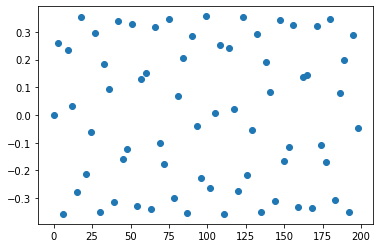

length of x is:  67
length of y is:  67


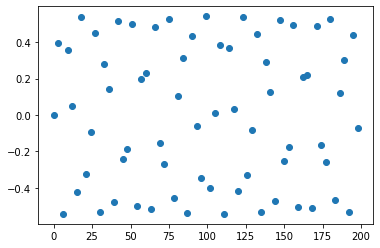

length of x is:  67
length of y is:  67


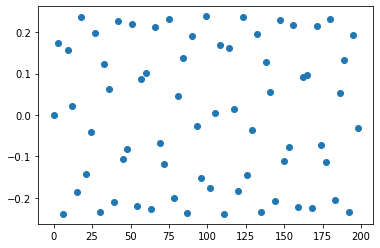

length of x is:  67
length of y is:  67


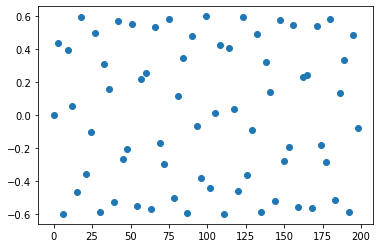

length of x is:  67
length of y is:  67


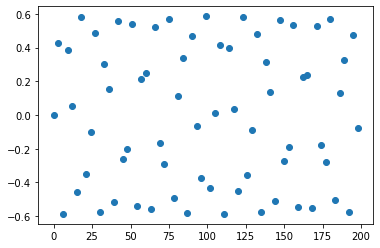

length of x is:  67
length of y is:  67


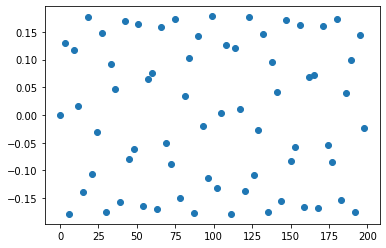

length of x is:  67
length of y is:  67


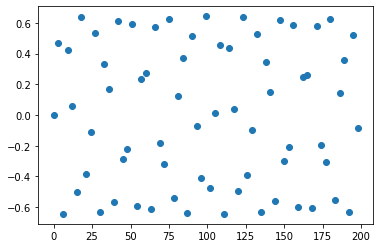

length of x is:  67
length of y is:  67


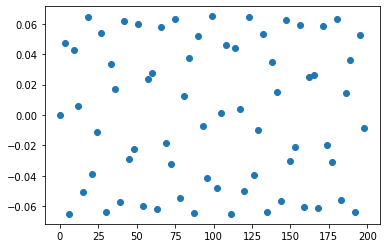

length of x is:  67
length of y is:  67


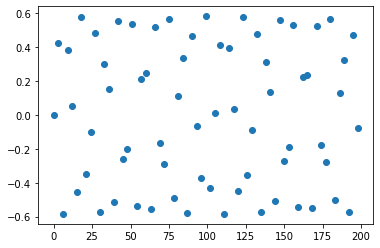

length of x is:  67
length of y is:  67


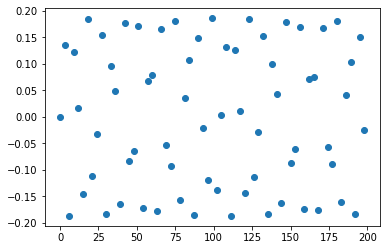

length of x is:  67
length of y is:  67


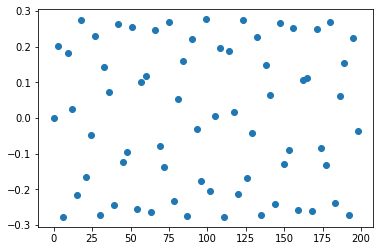

length of x is:  67
length of y is:  67


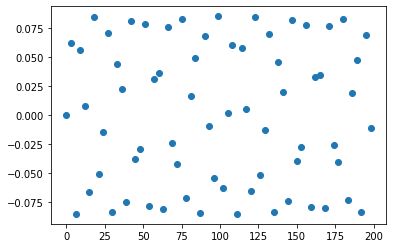

length of x is:  67
length of y is:  67


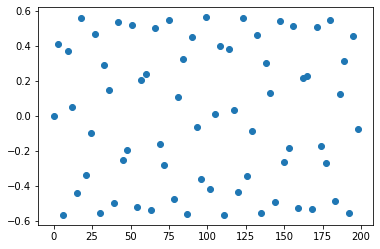

length of x is:  67
length of y is:  67


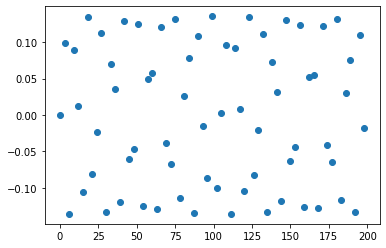

length of x is:  67
length of y is:  67


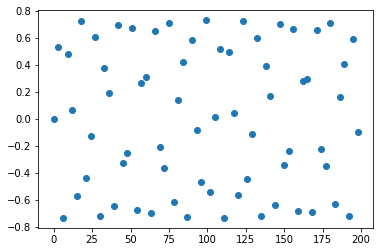

length of x is:  67
length of y is:  67


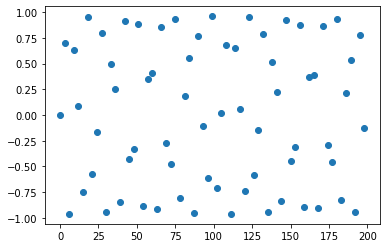

length of x is:  67
length of y is:  67


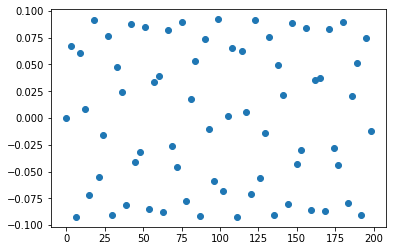

length of x is:  67
length of y is:  67


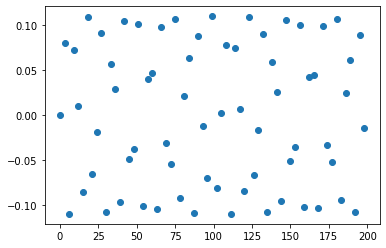

length of x is:  67
length of y is:  67


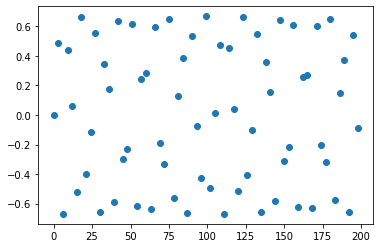

length of x is:  67
length of y is:  67


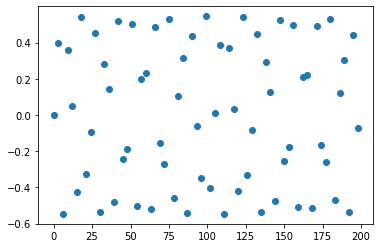

length of x is:  67
length of y is:  67


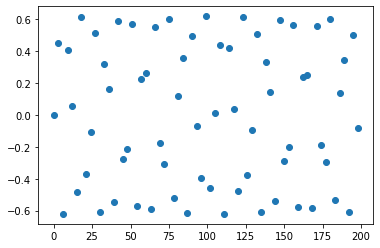

length of x is:  67
length of y is:  67


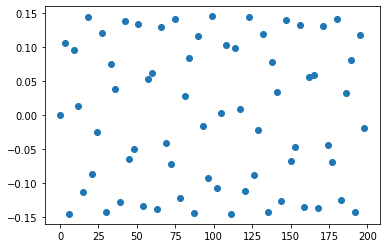

length of x is:  67
length of y is:  67


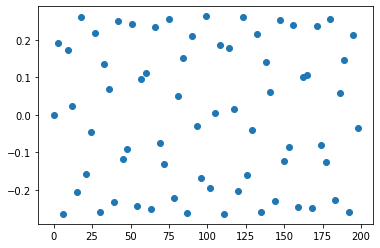

length of x is:  67
length of y is:  67


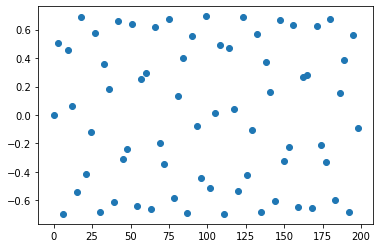

length of x is:  67
length of y is:  67


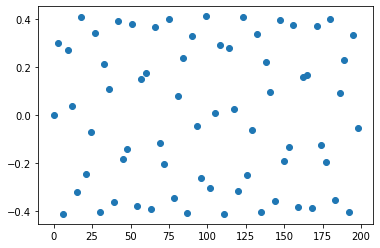

length of x is:  67
length of y is:  67


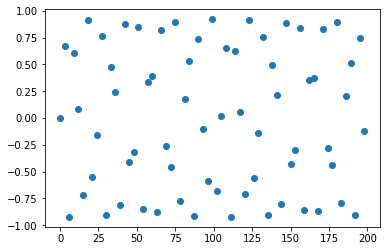

length of x is:  67
length of y is:  67


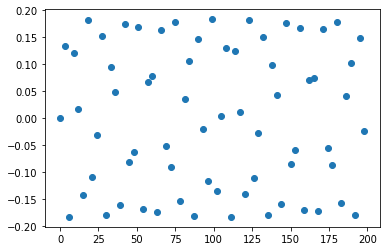

length of x is:  67
length of y is:  67


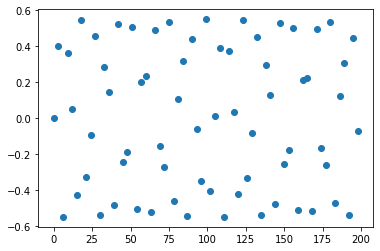

length of x is:  67
length of y is:  67


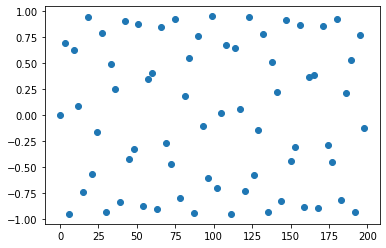

length of x is:  67
length of y is:  67


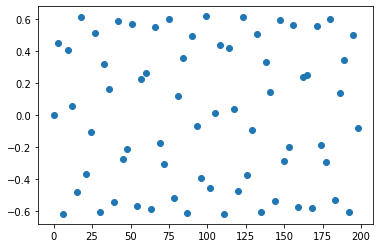

length of x is:  67
length of y is:  67


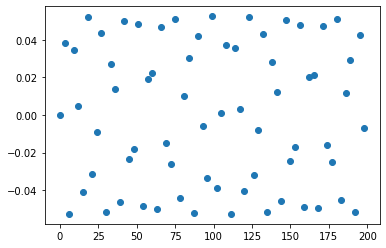

length of x is:  67
length of y is:  67


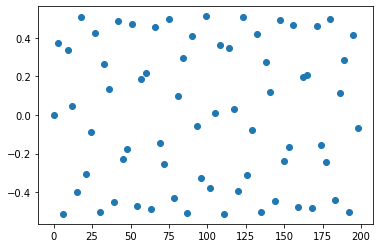

length of x is:  67
length of y is:  67


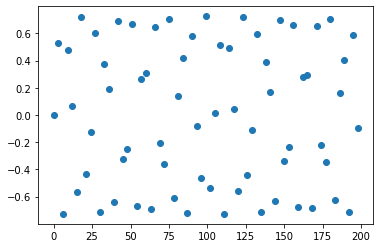

length of x is:  67
length of y is:  67


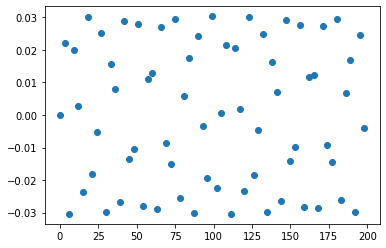

length of x is:  67
length of y is:  67


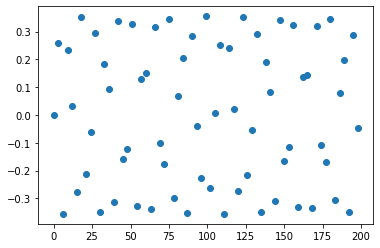

length of x is:  67
length of y is:  67


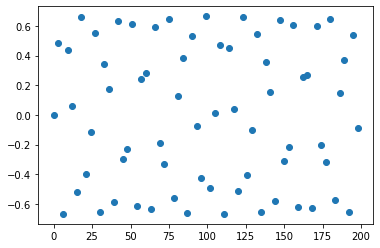

length of x is:  67
length of y is:  67


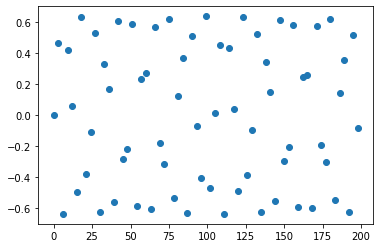

length of x is:  67
length of y is:  67


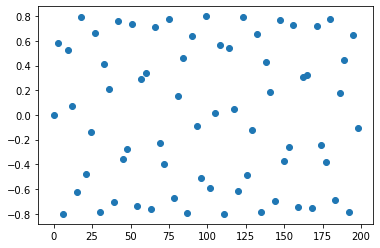

length of x is:  67
length of y is:  67


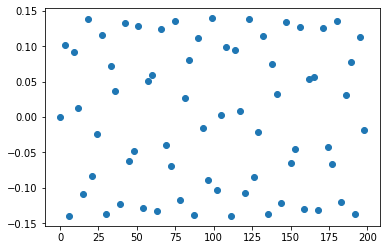

length of x is:  67
length of y is:  67


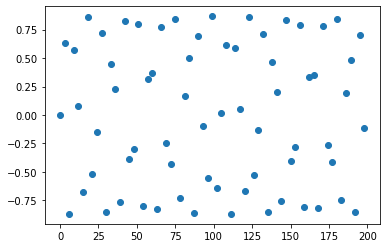

length of x is:  67
length of y is:  67


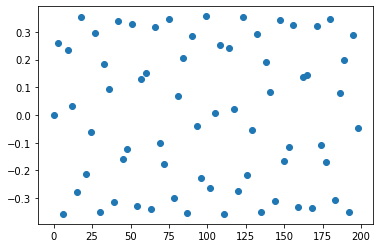

length of x is:  67
length of y is:  67


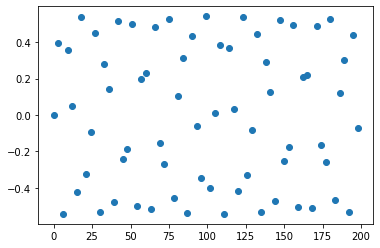

length of x is:  67
length of y is:  67


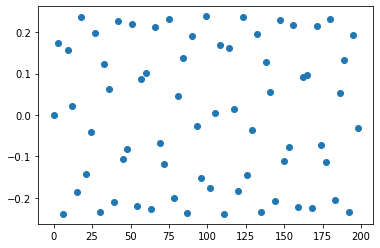

length of x is:  67
length of y is:  67


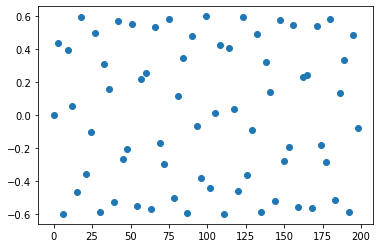

length of x is:  67
length of y is:  67


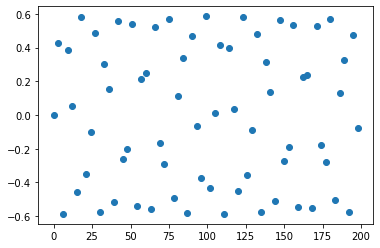

length of x is:  67
length of y is:  67


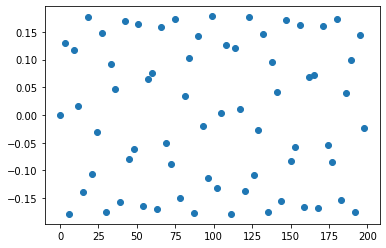

length of x is:  67
length of y is:  67


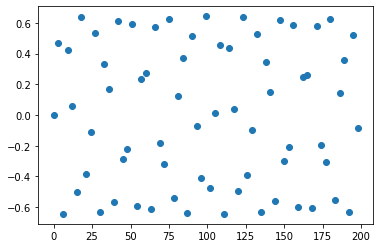

length of x is:  67
length of y is:  67


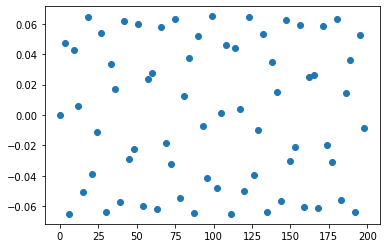

length of x is:  67
length of y is:  67


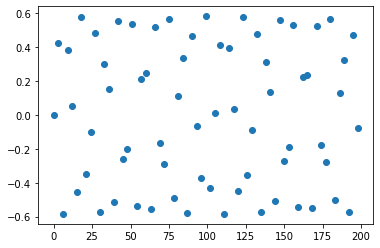

length of x is:  67
length of y is:  67


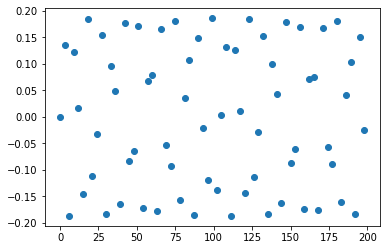

length of x is:  67
length of y is:  67


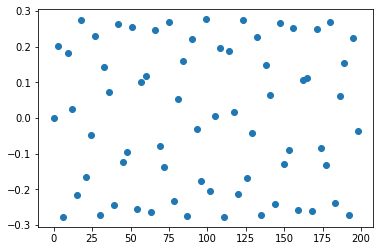

length of x is:  67
length of y is:  67


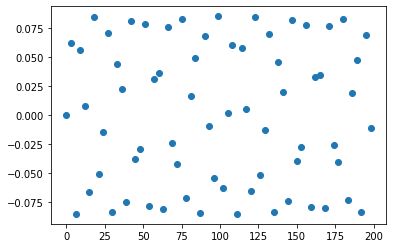

length of x is:  67
length of y is:  67


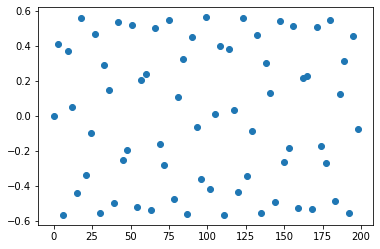

length of x is:  67
length of y is:  67


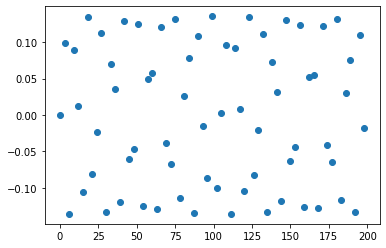

length of x is:  67
length of y is:  67


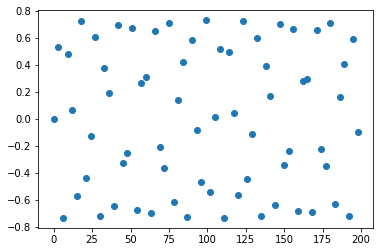

length of x is:  67
length of y is:  67


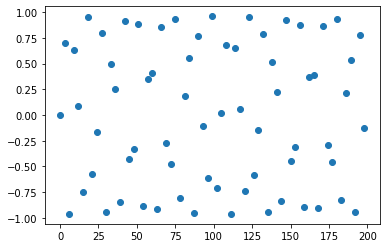

length of x is:  67
length of y is:  67


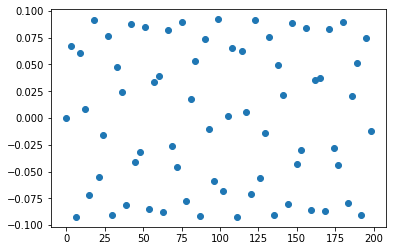

length of x is:  67
length of y is:  67


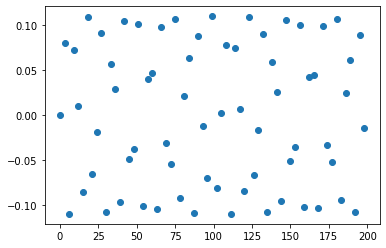

length of x is:  67
length of y is:  67


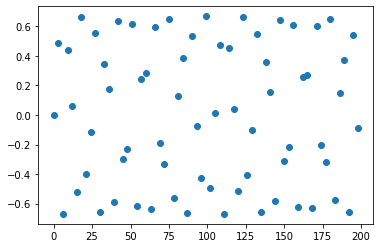

length of x is:  67
length of y is:  67


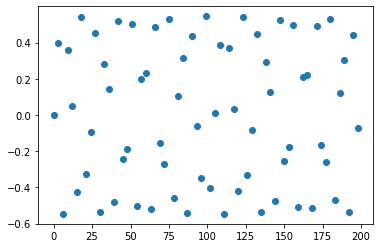

length of x is:  67
length of y is:  67


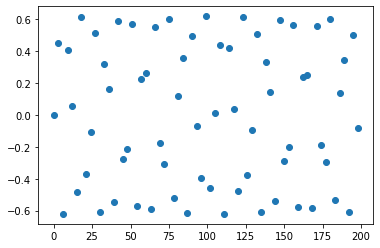

length of x is:  67
length of y is:  67


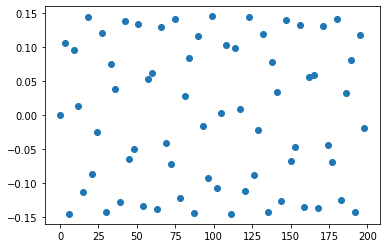

length of x is:  67
length of y is:  67


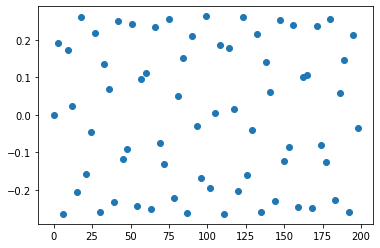

length of x is:  67
length of y is:  67


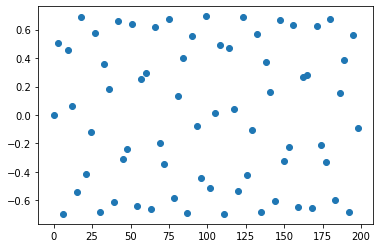

length of x is:  67
length of y is:  67


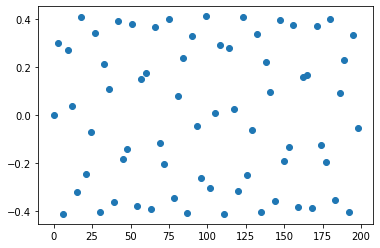

length of x is:  67
length of y is:  67


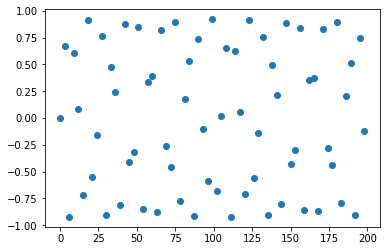

length of x is:  67
length of y is:  67


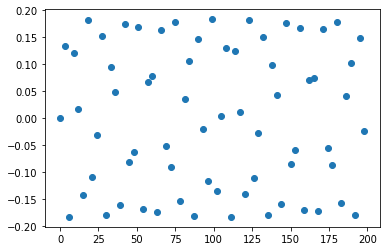

length of x is:  67
length of y is:  67


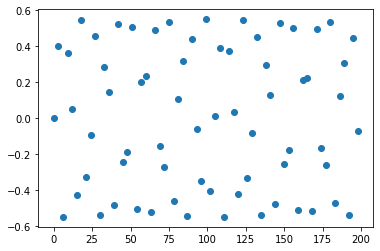

length of x is:  67
length of y is:  67


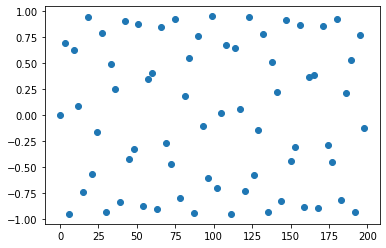

length of x is:  67
length of y is:  67


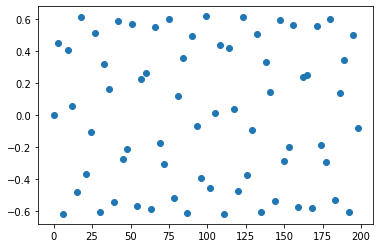

length of x is:  67
length of y is:  67


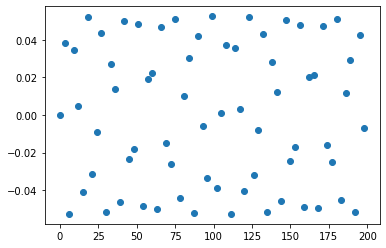

length of x is:  67
length of y is:  67


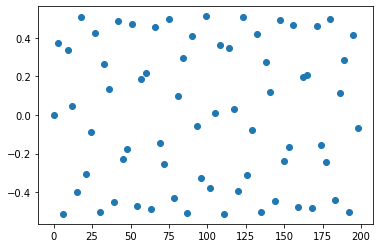

length of x is:  67
length of y is:  67


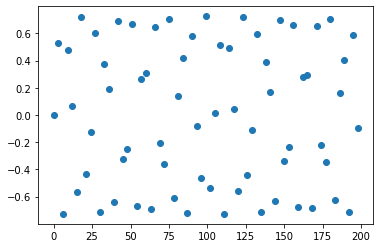

length of x is:  67
length of y is:  67


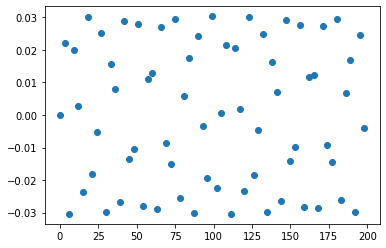

length of x is:  67
length of y is:  67


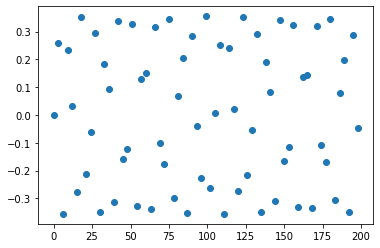

length of x is:  67
length of y is:  67


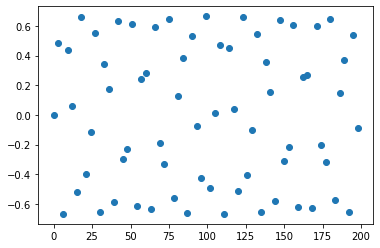

length of x is:  67
length of y is:  67


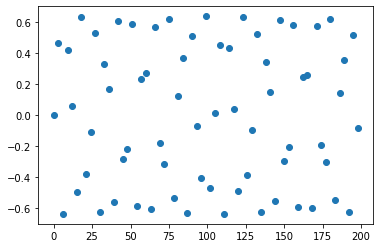

length of x is:  67
length of y is:  67


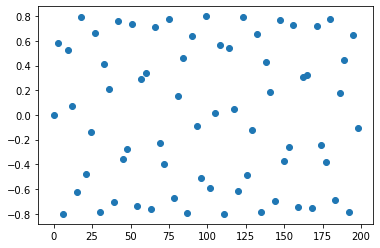

length of x is:  67
length of y is:  67


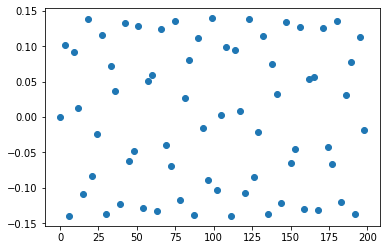

length of x is:  67
length of y is:  67


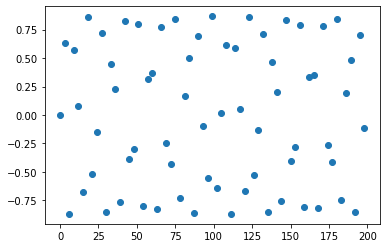

length of x is:  67
length of y is:  67


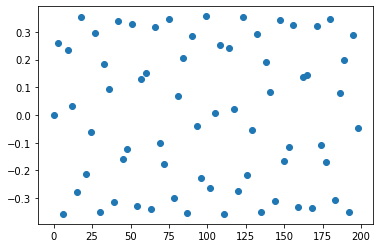

length of x is:  67
length of y is:  67


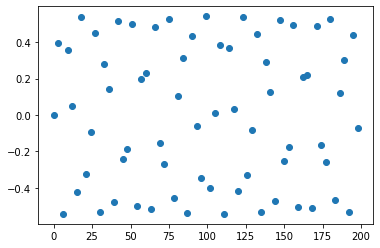

length of x is:  67
length of y is:  67


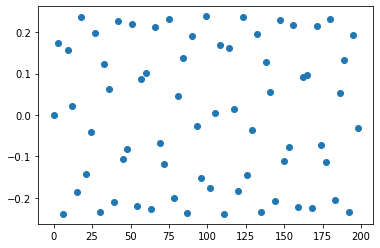

length of x is:  67
length of y is:  67


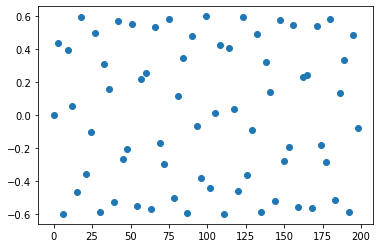

length of x is:  67
length of y is:  67


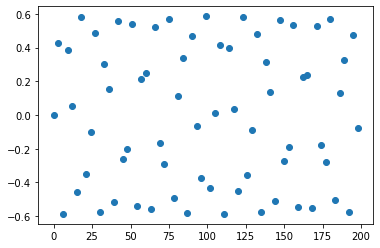

length of x is:  67
length of y is:  67


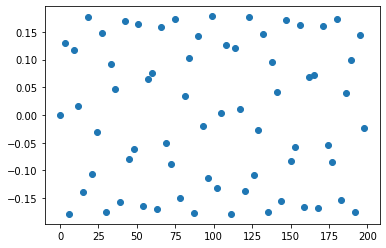

length of x is:  67
length of y is:  67


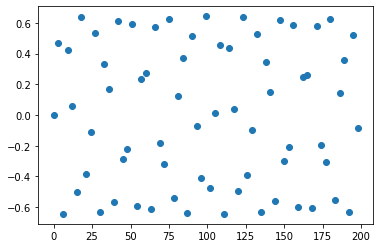

length of x is:  67
length of y is:  67


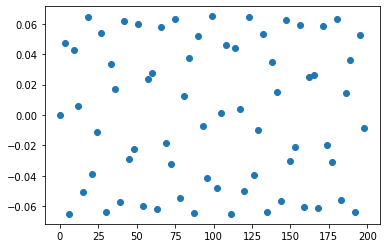

length of x is:  67
length of y is:  67


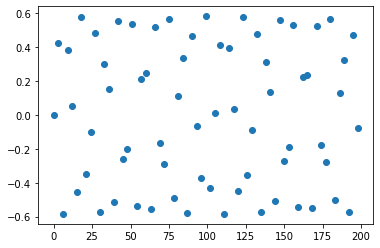

length of x is:  67
length of y is:  67


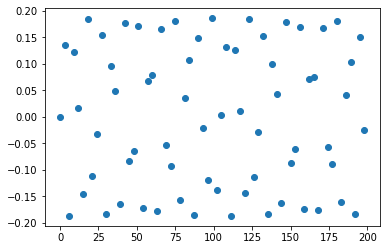

length of x is:  67
length of y is:  67


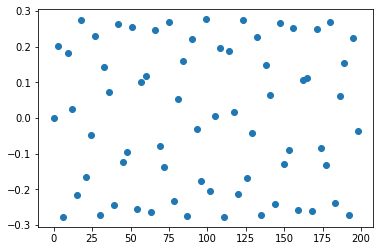

length of x is:  67
length of y is:  67


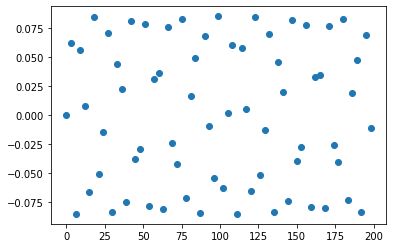

length of x is:  67
length of y is:  67


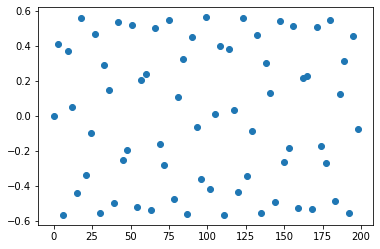

length of x is:  67
length of y is:  67


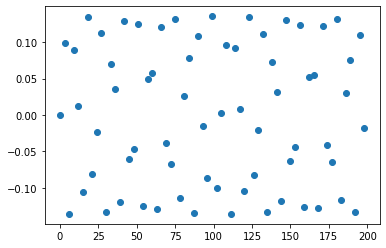

length of x is:  67
length of y is:  67


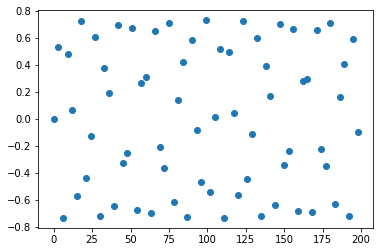

length of x is:  67
length of y is:  67


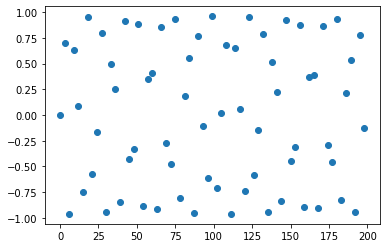

length of x is:  67
length of y is:  67


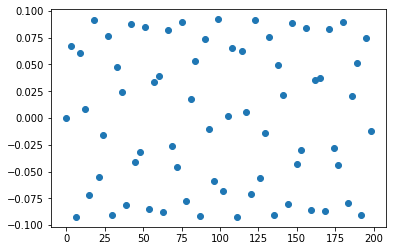

length of x is:  67
length of y is:  67


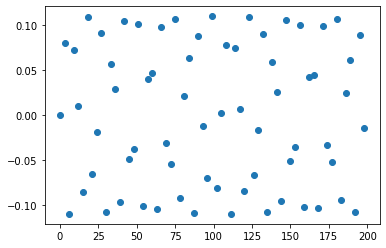

length of x is:  67
length of y is:  67


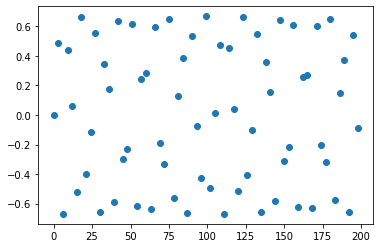

length of x is:  67
length of y is:  67


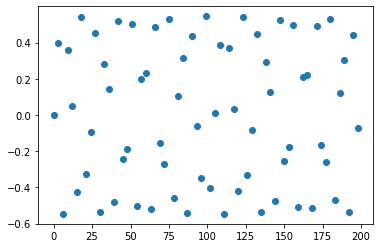

length of x is:  67
length of y is:  67


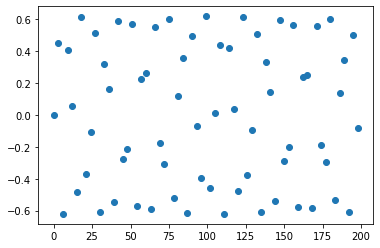

length of x is:  67
length of y is:  67


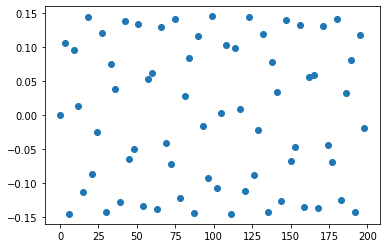

length of x is:  67
length of y is:  67


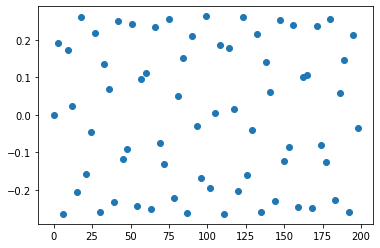

length of x is:  67
length of y is:  67


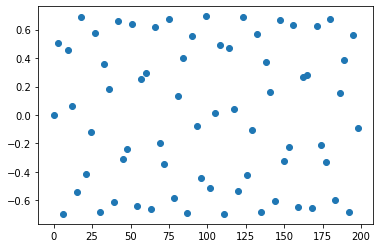

length of x is:  67
length of y is:  67


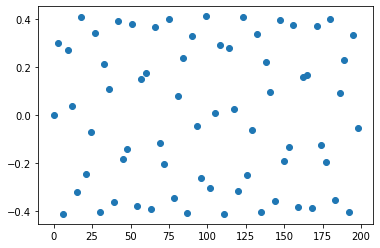

length of x is:  67
length of y is:  67


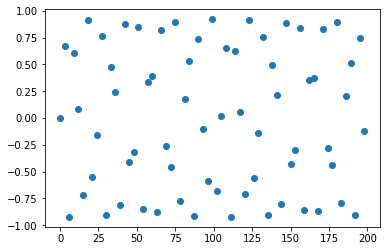

length of x is:  67
length of y is:  67


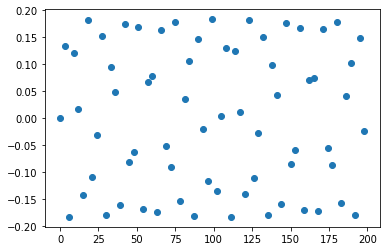

length of x is:  67
length of y is:  67


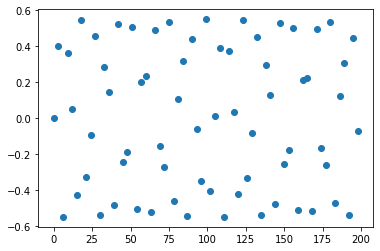

length of x is:  67
length of y is:  67


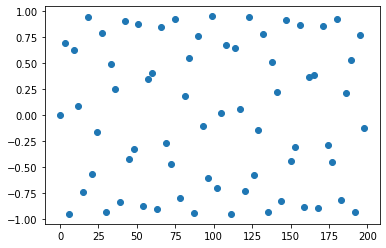

length of x is:  67
length of y is:  67


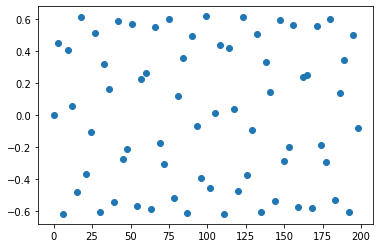

length of x is:  67
length of y is:  67


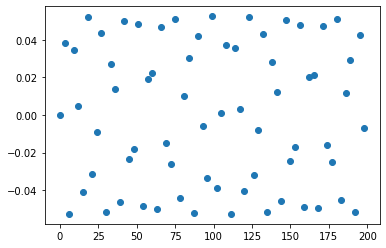

length of x is:  67
length of y is:  67


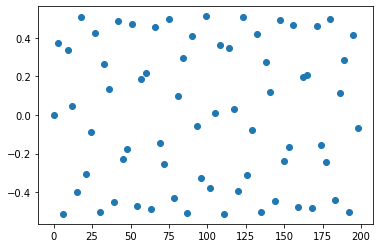

length of x is:  67
length of y is:  67


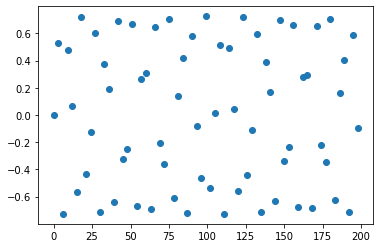

length of x is:  67
length of y is:  67


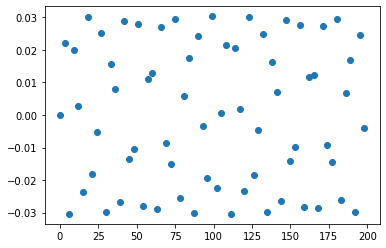

length of x is:  67
length of y is:  67


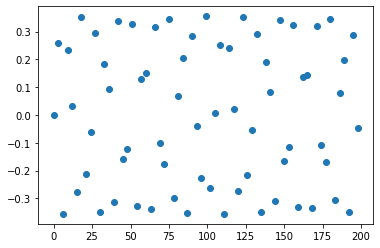

length of x is:  67
length of y is:  67


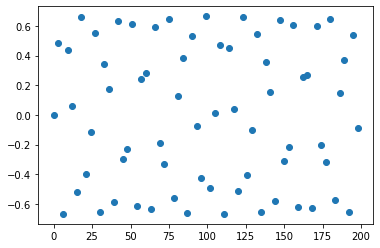

length of x is:  67
length of y is:  67


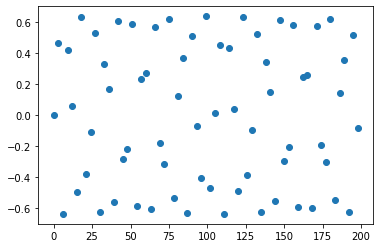

length of x is:  67
length of y is:  67


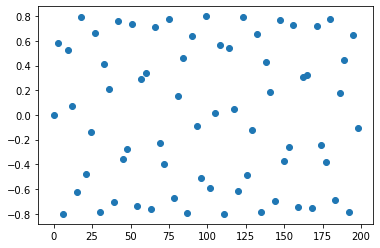

length of x is:  67
length of y is:  67


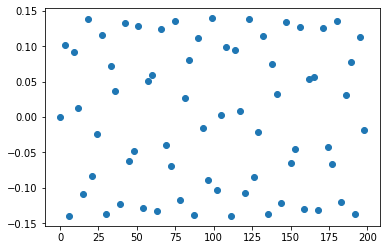

length of x is:  67
length of y is:  67


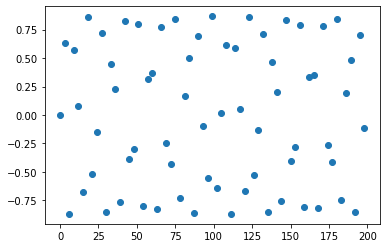

length of x is:  67
length of y is:  67


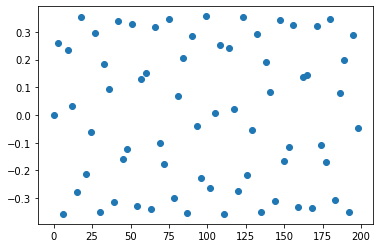

length of x is:  67
length of y is:  67


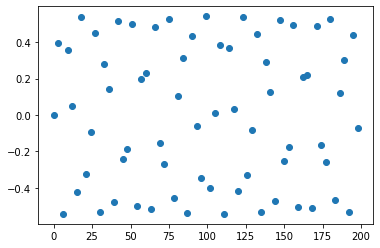

length of x is:  67
length of y is:  67


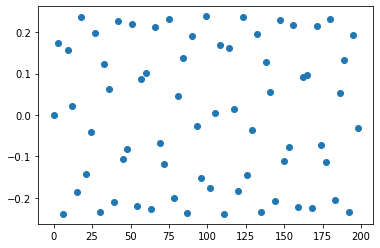

length of x is:  67
length of y is:  67


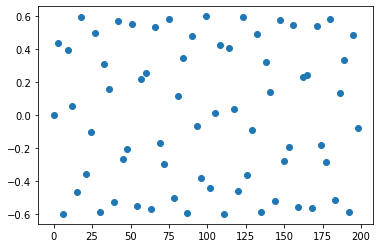

length of x is:  67
length of y is:  67


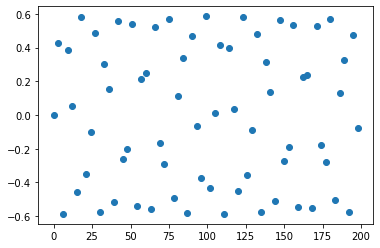

length of x is:  67
length of y is:  67


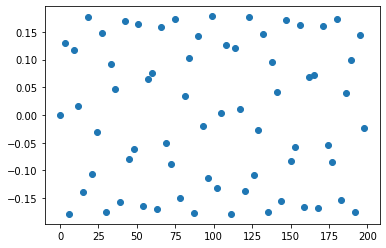

length of x is:  67
length of y is:  67


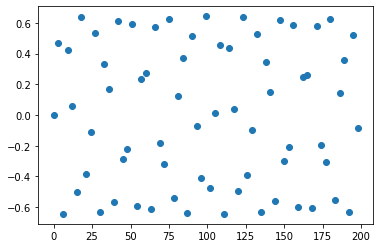

length of x is:  67
length of y is:  67


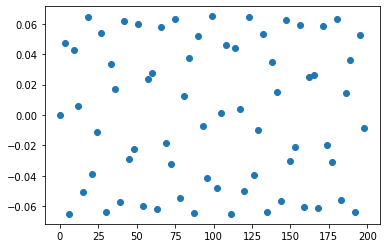

length of x is:  67
length of y is:  67


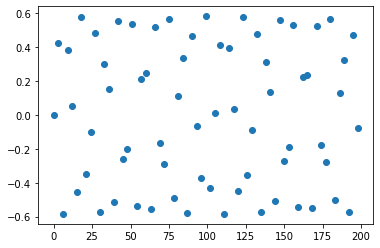

length of x is:  67
length of y is:  67


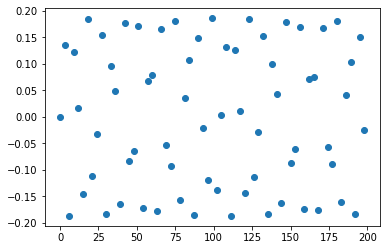

length of x is:  67
length of y is:  67


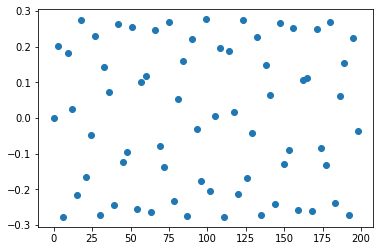

length of x is:  67
length of y is:  67


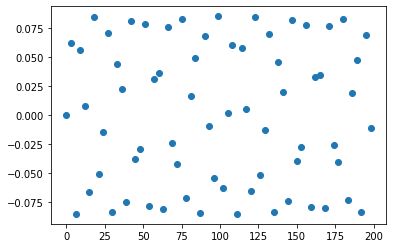

length of x is:  67
length of y is:  67


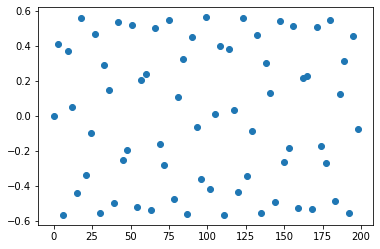

length of x is:  67
length of y is:  67


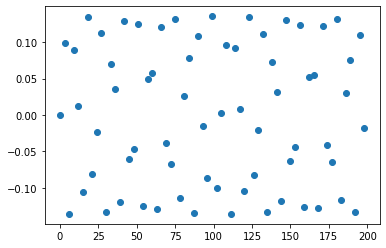

length of x is:  67
length of y is:  67


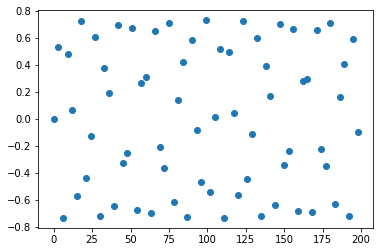

length of x is:  67
length of y is:  67


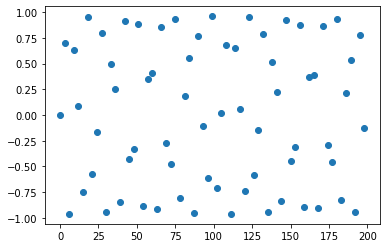

length of x is:  67
length of y is:  67


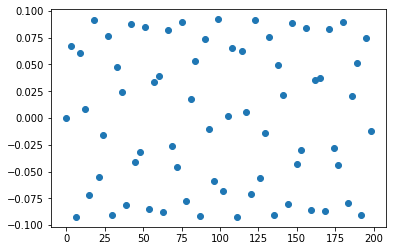

length of x is:  67
length of y is:  67


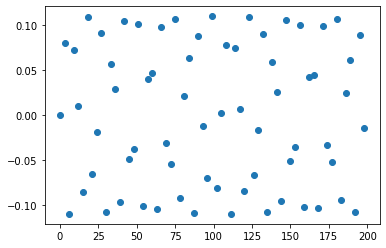

length of x is:  67
length of y is:  67


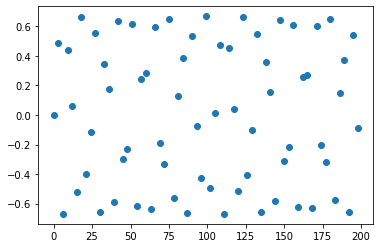

length of x is:  67
length of y is:  67


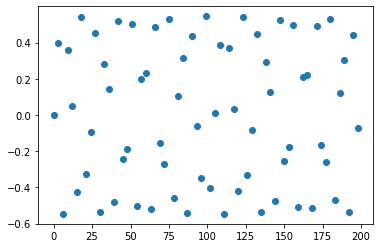

length of x is:  67
length of y is:  67


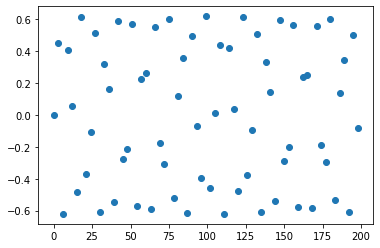

length of x is:  67
length of y is:  67


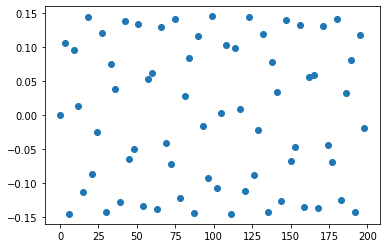

length of x is:  67
length of y is:  67


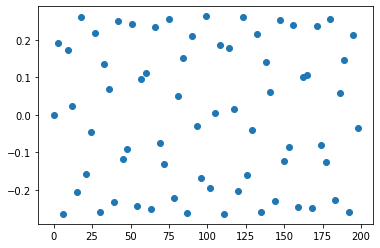

length of x is:  67
length of y is:  67


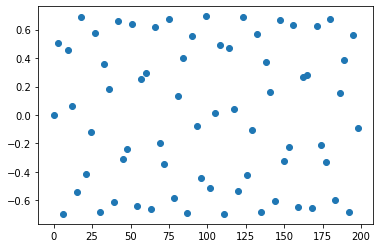

length of x is:  67
length of y is:  67


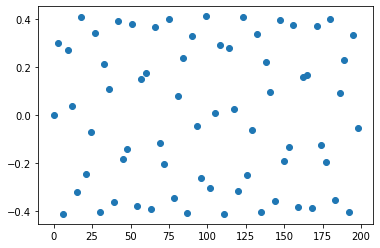

length of x is:  67
length of y is:  67


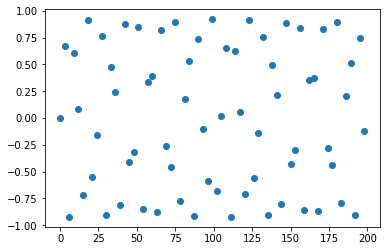

length of x is:  67
length of y is:  67


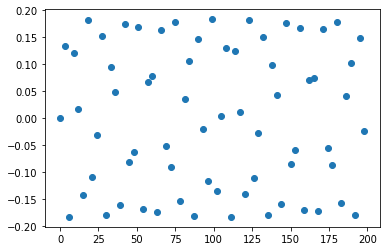

length of x is:  67
length of y is:  67


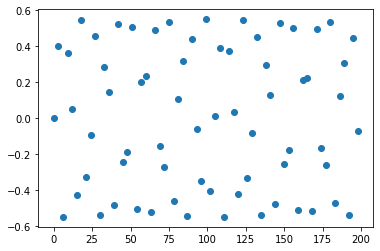

length of x is:  67
length of y is:  67


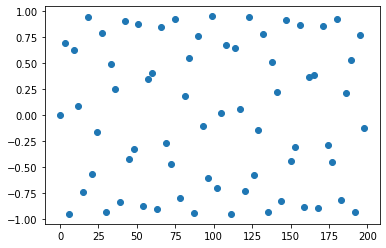

length of x is:  67
length of y is:  67


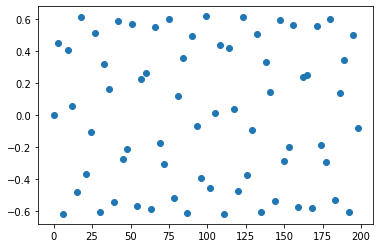

length of x is:  67
length of y is:  67


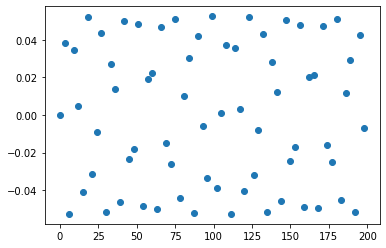

length of x is:  67
length of y is:  67


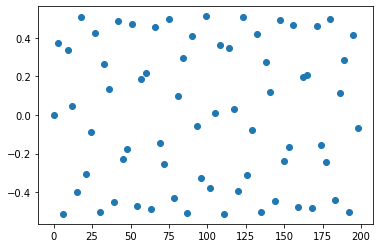

length of x is:  67
length of y is:  67


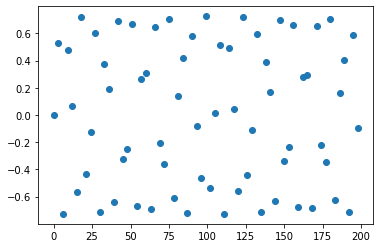

length of x is:  67
length of y is:  67


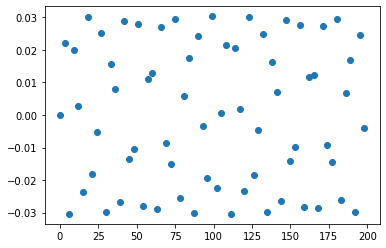

length of x is:  67
length of y is:  67


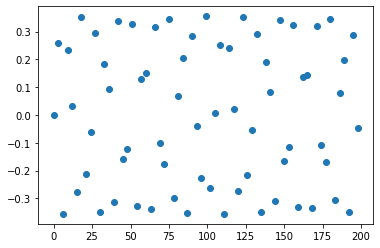

length of x is:  67
length of y is:  67


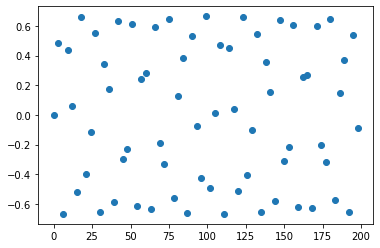

length of x is:  67
length of y is:  67


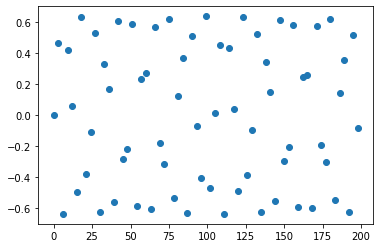

length of x is:  67
length of y is:  67


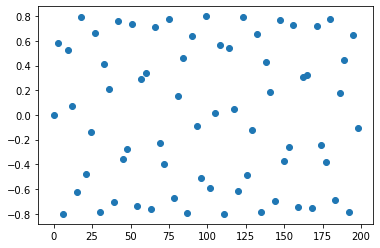

length of x is:  67
length of y is:  67


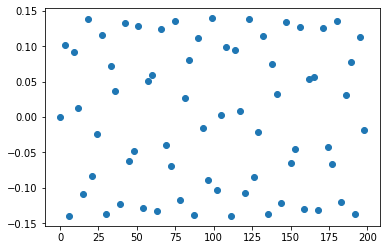

length of x is:  67
length of y is:  67


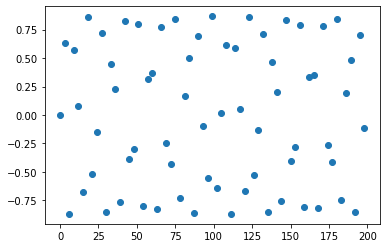

length of x is:  67
length of y is:  67


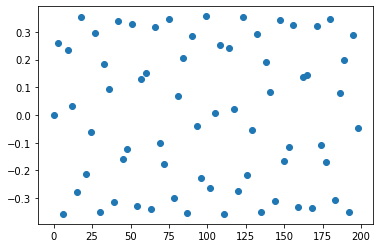

length of x is:  67
length of y is:  67


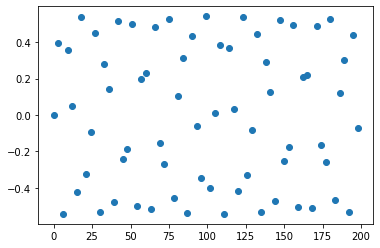

length of x is:  67
length of y is:  67


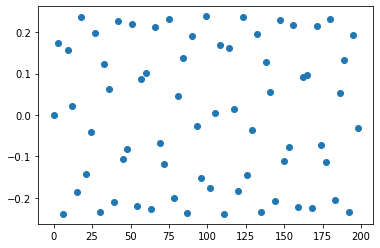

length of x is:  67
length of y is:  67


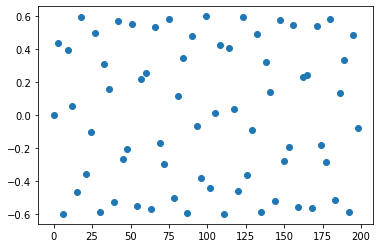

length of x is:  67
length of y is:  67


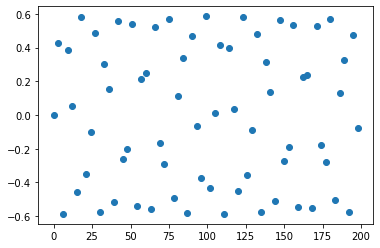

length of x is:  67
length of y is:  67


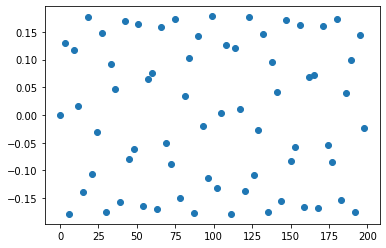

length of x is:  67
length of y is:  67


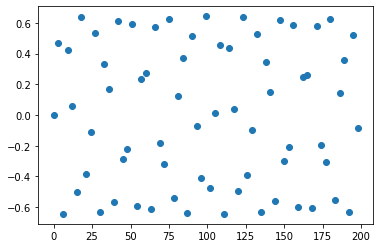

length of x is:  67
length of y is:  67


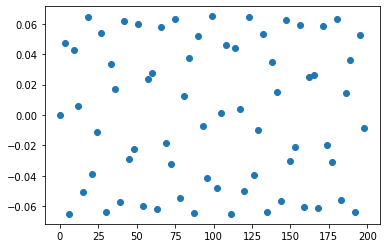

length of x is:  67
length of y is:  67


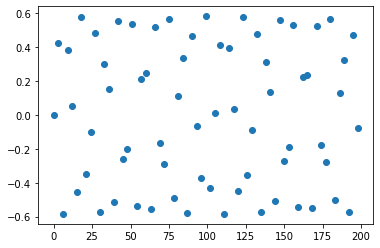

length of x is:  67
length of y is:  67


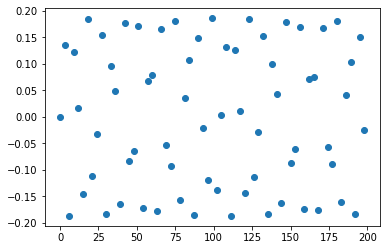

length of x is:  67
length of y is:  67


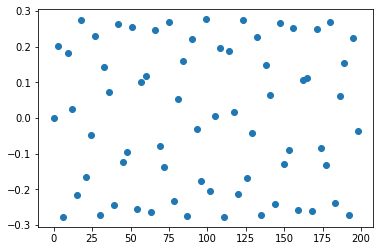

length of x is:  67
length of y is:  67


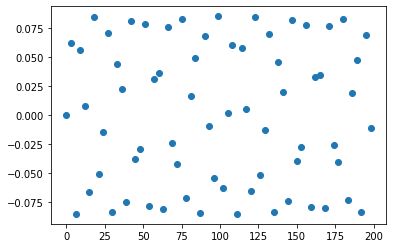

length of x is:  67
length of y is:  67


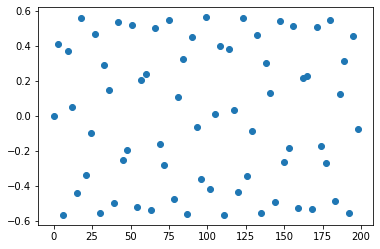

length of x is:  67
length of y is:  67


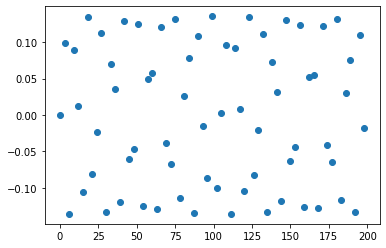

length of x is:  67
length of y is:  67


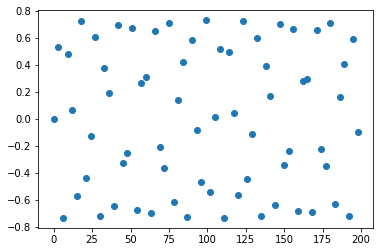

length of x is:  67
length of y is:  67


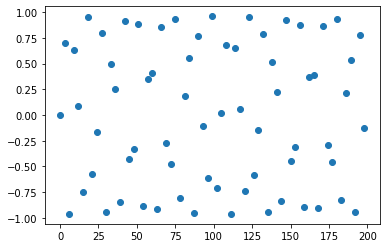

length of x is:  67
length of y is:  67


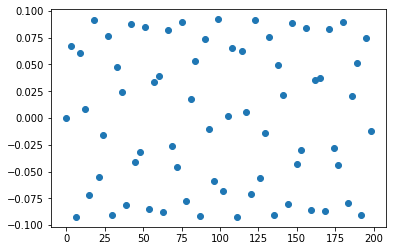

length of x is:  67
length of y is:  67


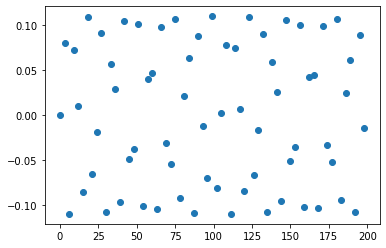

length of x is:  67
length of y is:  67


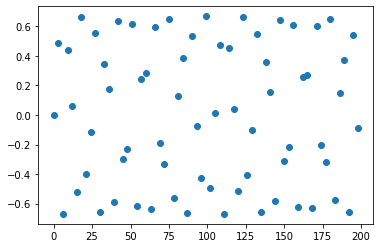

length of x is:  67
length of y is:  67


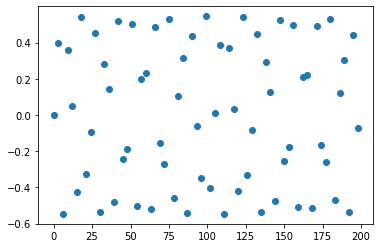

length of x is:  67
length of y is:  67


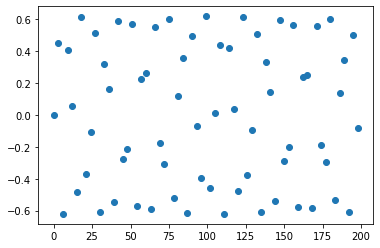

length of x is:  67
length of y is:  67


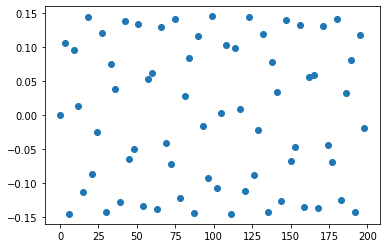

length of x is:  67
length of y is:  67


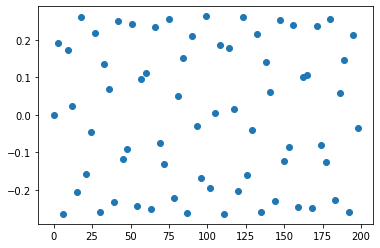

length of x is:  67
length of y is:  67


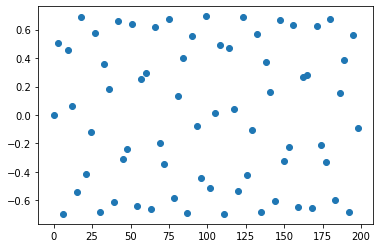

length of x is:  67
length of y is:  67


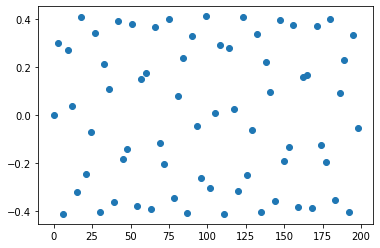

length of x is:  67
length of y is:  67


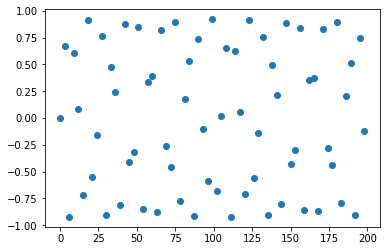

length of x is:  67
length of y is:  67


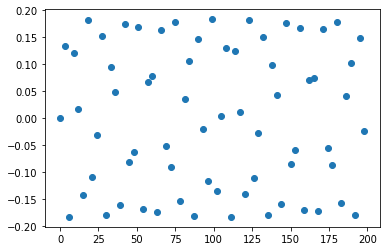

length of x is:  67
length of y is:  67


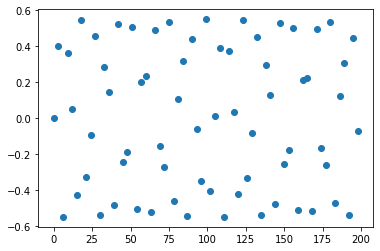

length of x is:  67
length of y is:  67


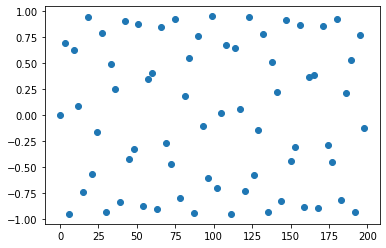

length of x is:  67
length of y is:  67


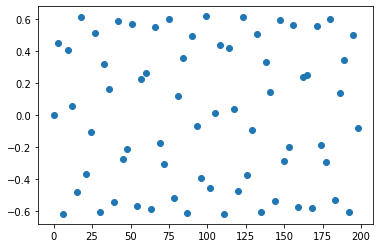

length of x is:  67
length of y is:  67


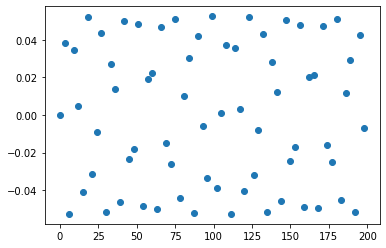

length of x is:  67
length of y is:  67


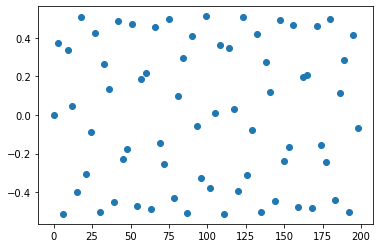

length of x is:  67
length of y is:  67


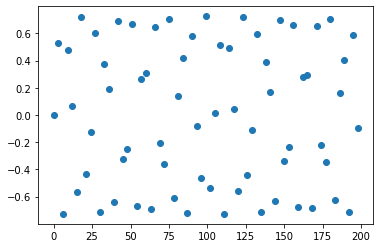

length of x is:  67
length of y is:  67


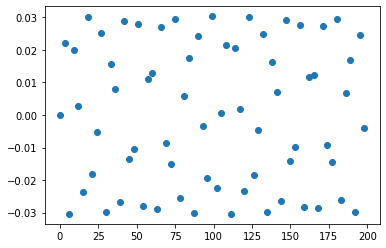

length of x is:  67
length of y is:  67


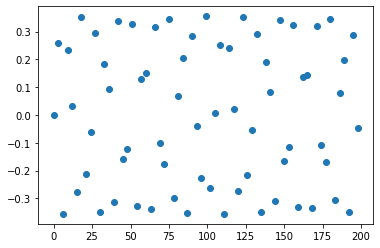

length of x is:  67
length of y is:  67


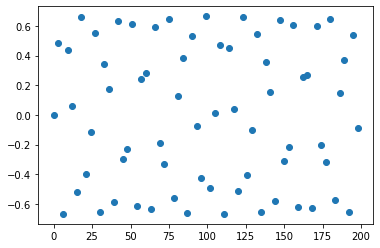

length of x is:  67
length of y is:  67


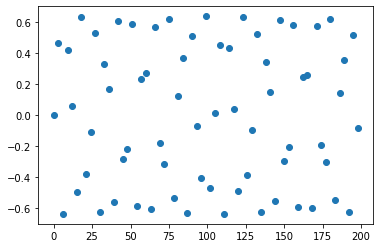

length of x is:  67
length of y is:  67


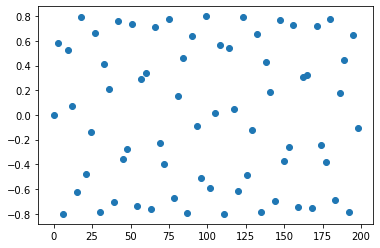

length of x is:  67
length of y is:  67


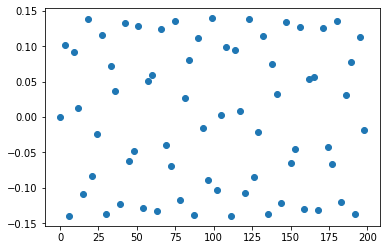

length of x is:  67
length of y is:  67


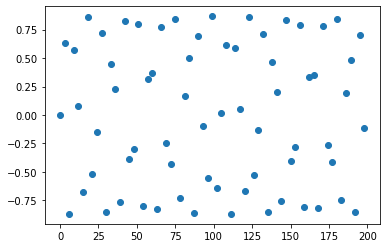

length of x is:  67
length of y is:  67


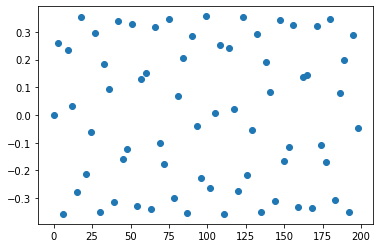

length of x is:  67
length of y is:  67


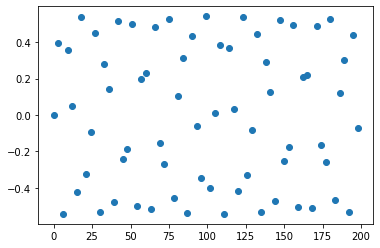

length of x is:  67
length of y is:  67


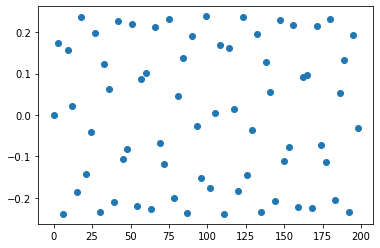

length of x is:  67
length of y is:  67


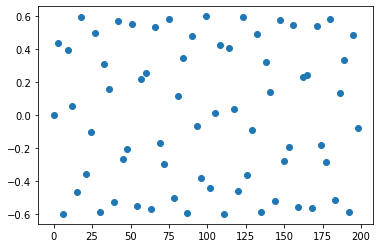

length of x is:  67
length of y is:  67


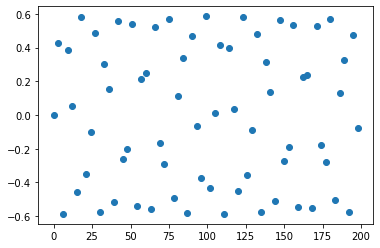

length of x is:  67
length of y is:  67


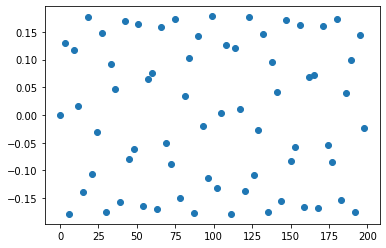

length of x is:  67
length of y is:  67


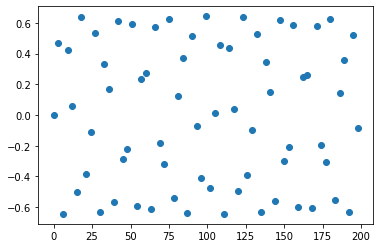

length of x is:  67
length of y is:  67


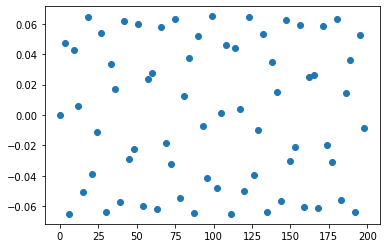

length of x is:  67
length of y is:  67


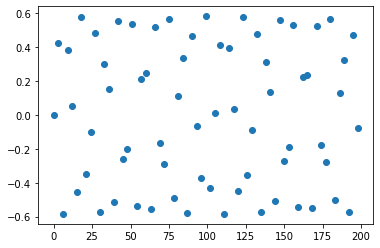

length of x is:  67
length of y is:  67


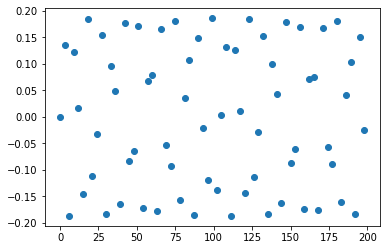

length of x is:  67
length of y is:  67


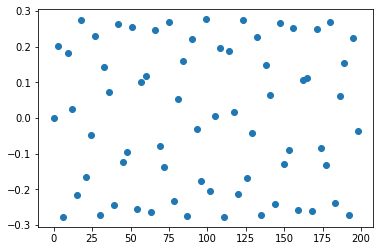

length of x is:  67
length of y is:  67


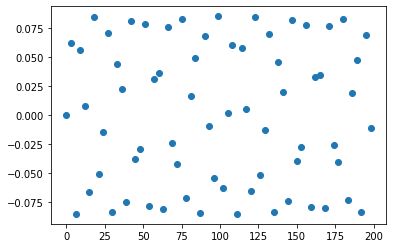

length of x is:  67
length of y is:  67


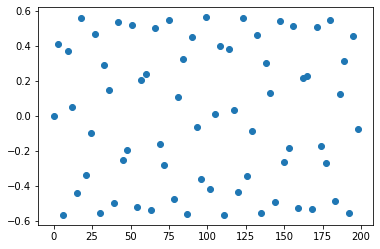

length of x is:  67
length of y is:  67


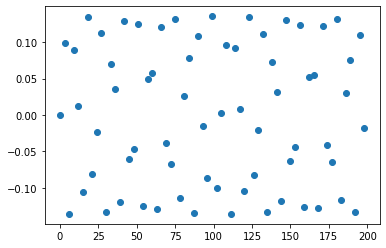

length of x is:  67
length of y is:  67


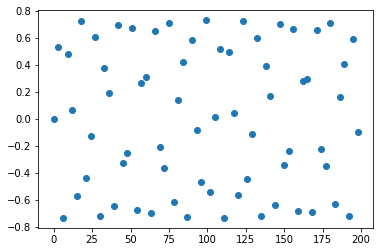

length of x is:  67
length of y is:  67


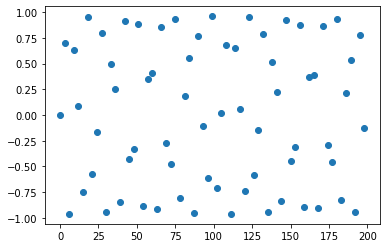

length of x is:  67
length of y is:  67


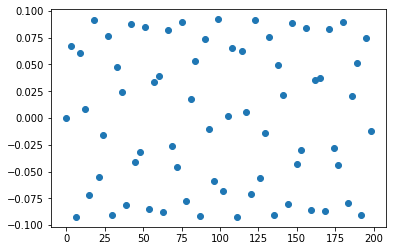

length of x is:  67
length of y is:  67


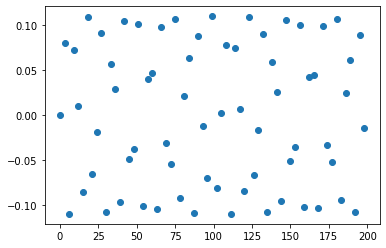

length of x is:  67
length of y is:  67


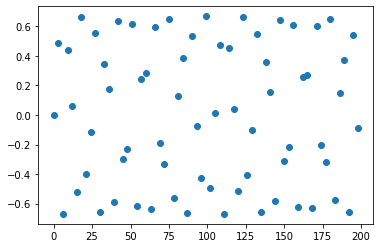

length of x is:  67
length of y is:  67


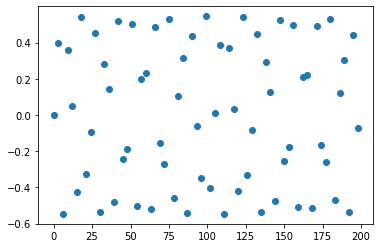

length of x is:  67
length of y is:  67


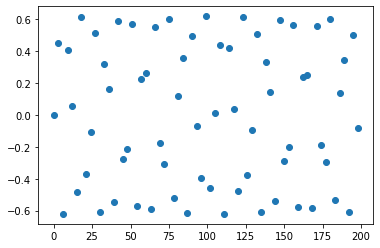

length of x is:  67
length of y is:  67


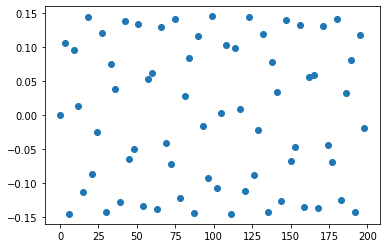

length of x is:  67
length of y is:  67


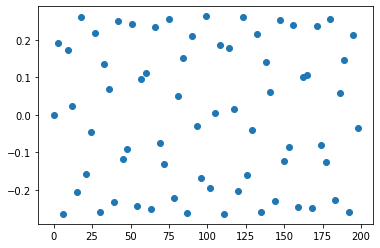

length of x is:  67
length of y is:  67


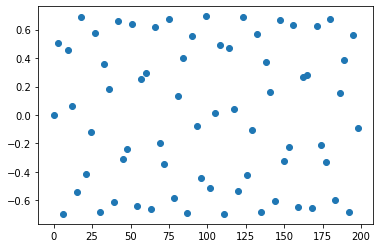

length of x is:  67
length of y is:  67


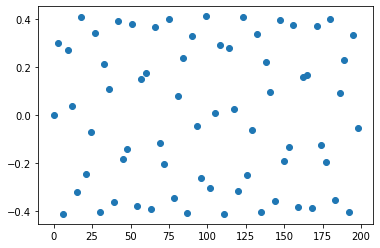

length of x is:  67
length of y is:  67


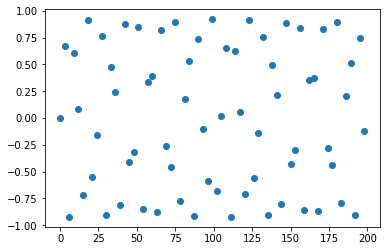

length of x is:  67
length of y is:  67


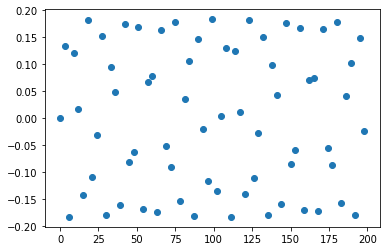

length of x is:  67
length of y is:  67


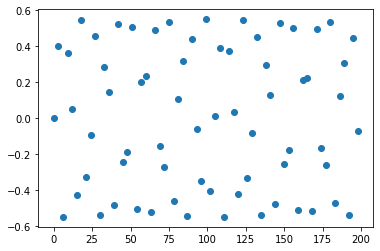

length of x is:  67
length of y is:  67


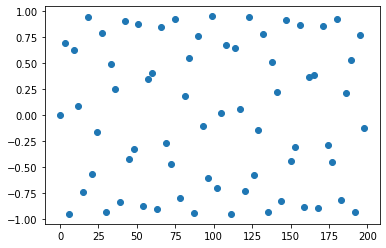

length of x is:  67
length of y is:  67


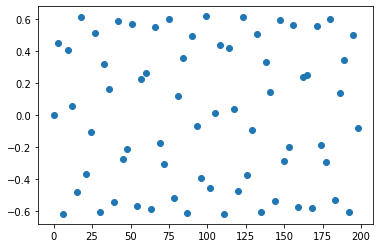

length of x is:  67
length of y is:  67


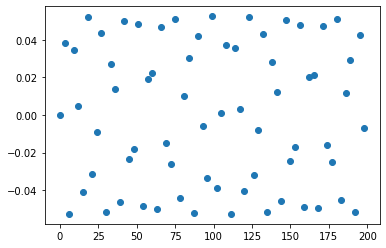

length of x is:  67
length of y is:  67


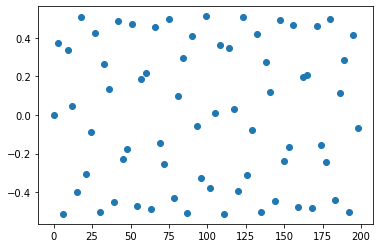

length of x is:  67
length of y is:  67


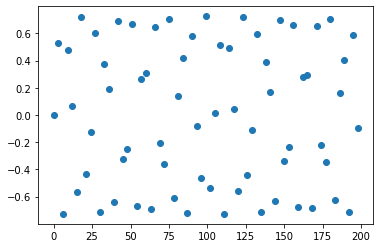

length of x is:  67
length of y is:  67


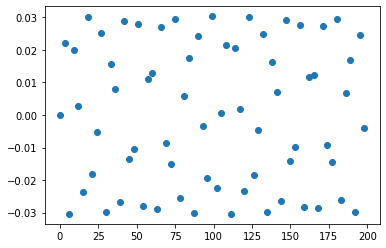

length of x is:  67
length of y is:  67


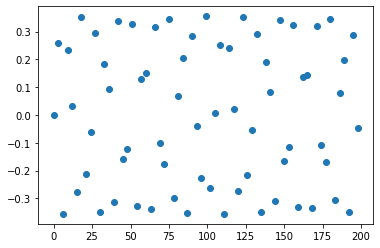

length of x is:  67
length of y is:  67


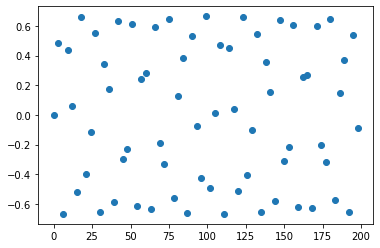

length of x is:  67
length of y is:  67


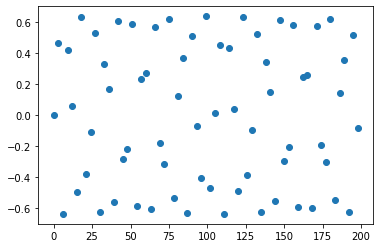

length of x is:  67
length of y is:  67


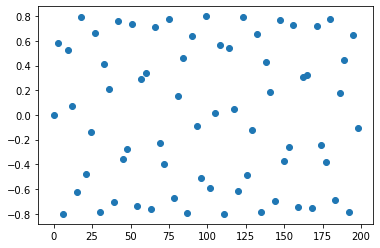

length of x is:  67
length of y is:  67


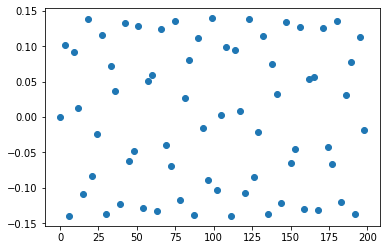

length of x is:  67
length of y is:  67


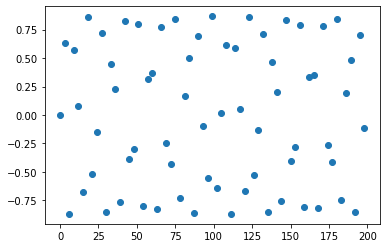

length of x is:  67
length of y is:  67


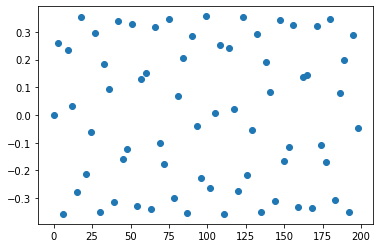

length of x is:  67
length of y is:  67


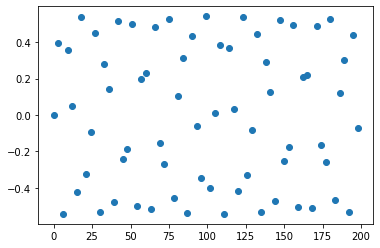

length of x is:  67
length of y is:  67


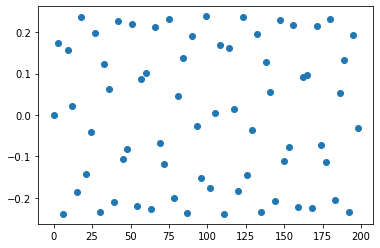

length of x is:  67
length of y is:  67


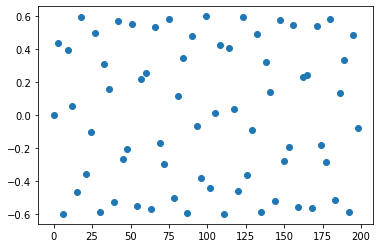

length of x is:  67
length of y is:  67


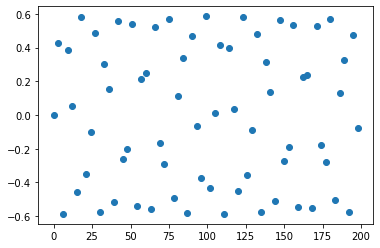

length of x is:  67
length of y is:  67


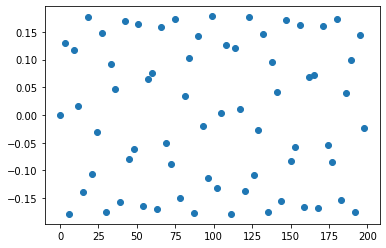

length of x is:  67
length of y is:  67


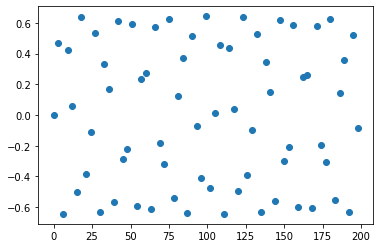

length of x is:  67
length of y is:  67


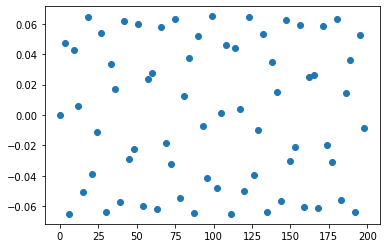

length of x is:  67
length of y is:  67


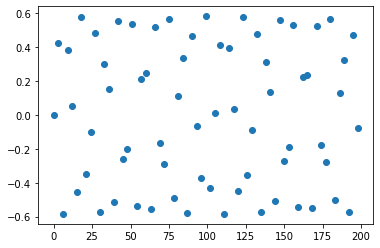

length of x is:  67
length of y is:  67


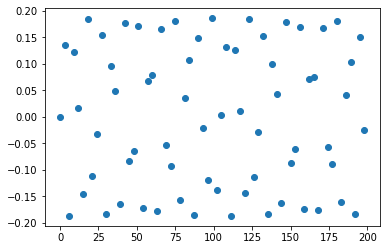

length of x is:  67
length of y is:  67


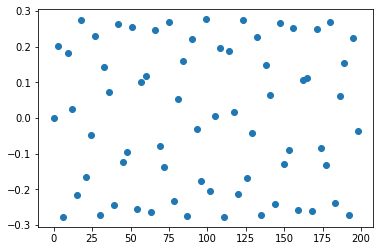

length of x is:  67
length of y is:  67


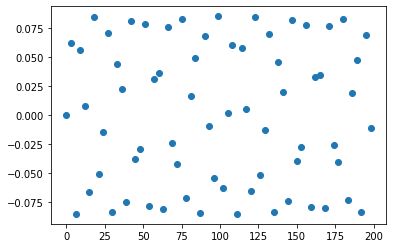

length of x is:  67
length of y is:  67


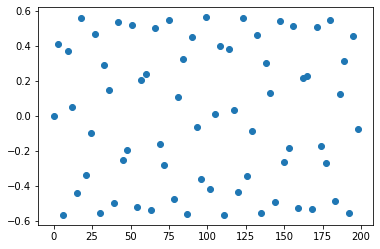

length of x is:  67
length of y is:  67


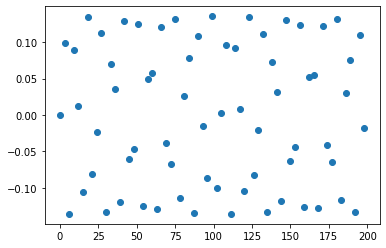

length of x is:  67
length of y is:  67


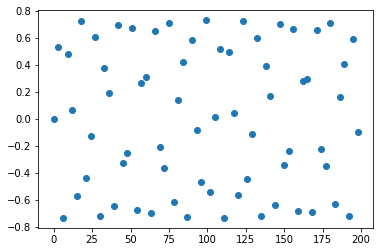

length of x is:  67
length of y is:  67


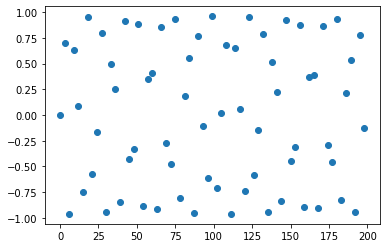

length of x is:  67
length of y is:  67


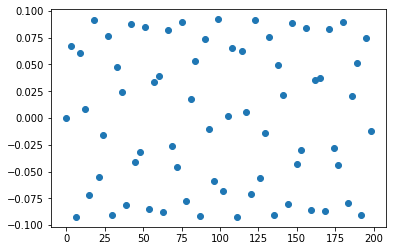

length of x is:  67
length of y is:  67


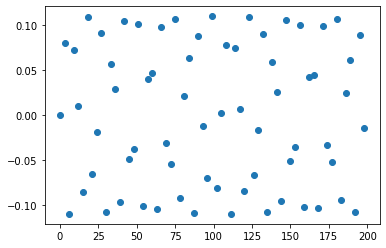

length of x is:  67
length of y is:  67


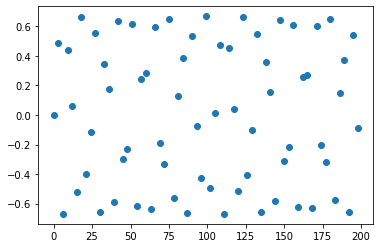

length of x is:  67
length of y is:  67


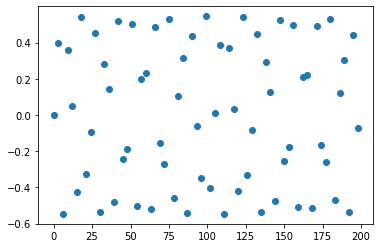

length of x is:  67
length of y is:  67


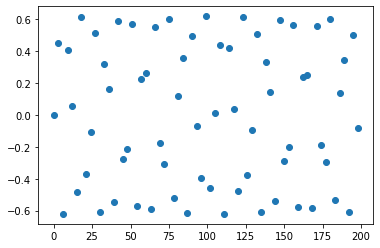

length of x is:  67
length of y is:  67


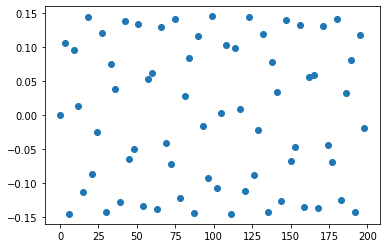

length of x is:  67
length of y is:  67


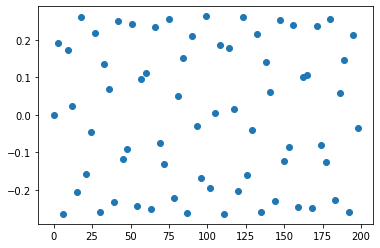

length of x is:  67
length of y is:  67


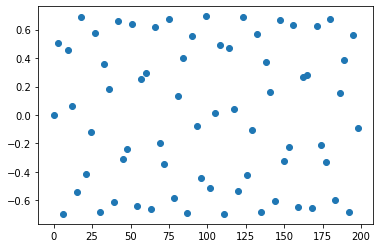

length of x is:  67
length of y is:  67


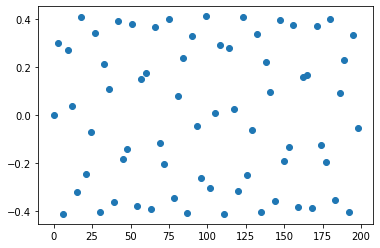

length of x is:  67
length of y is:  67


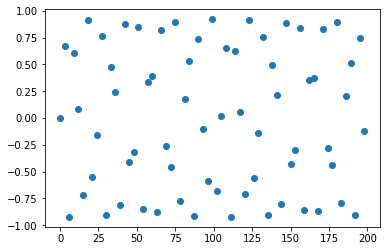

length of x is:  67
length of y is:  67


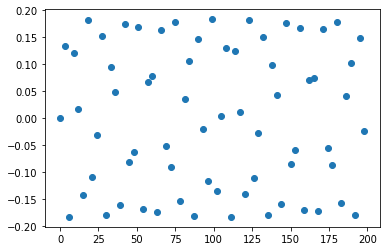

length of x is:  67
length of y is:  67


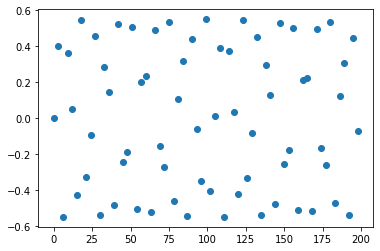

length of x is:  67
length of y is:  67


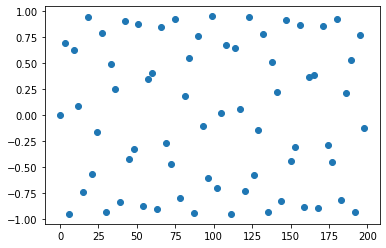

length of x is:  67
length of y is:  67


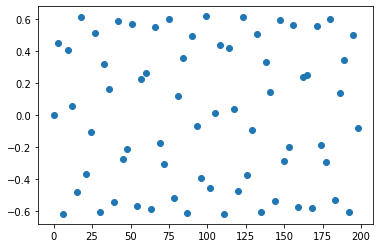

length of x is:  67
length of y is:  67


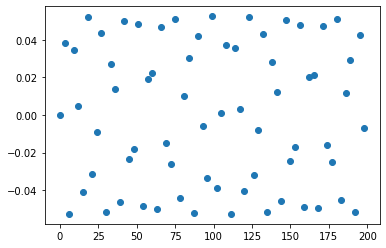

length of x is:  67
length of y is:  67


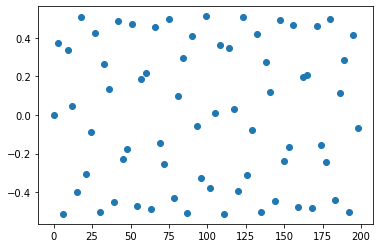

length of x is:  67
length of y is:  67


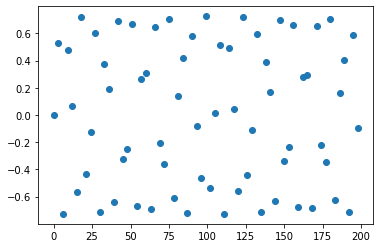

length of x is:  67
length of y is:  67


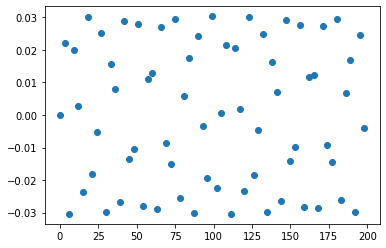

length of x is:  67
length of y is:  67


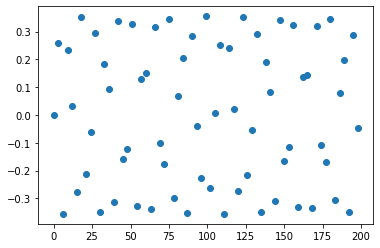

length of x is:  67
length of y is:  67


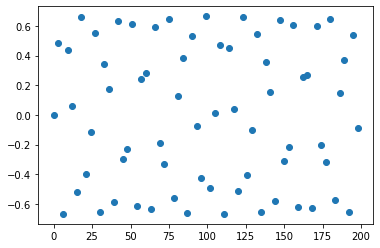

length of x is:  67
length of y is:  67


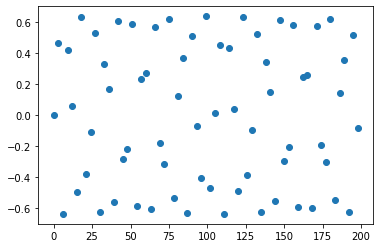

length of x is:  67
length of y is:  67


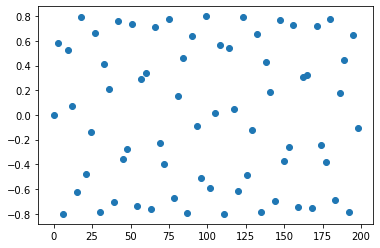

length of x is:  67
length of y is:  67


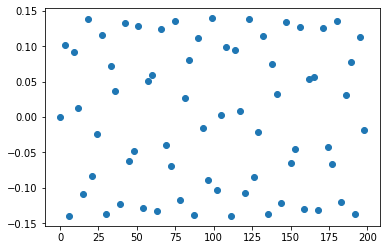

length of x is:  67
length of y is:  67


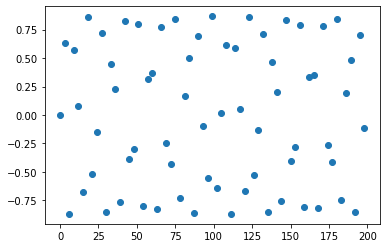

length of x is:  67
length of y is:  67


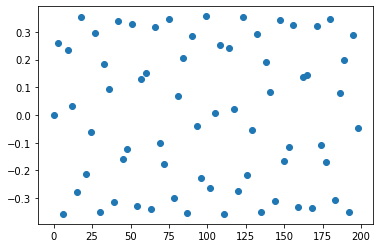

length of x is:  67
length of y is:  67


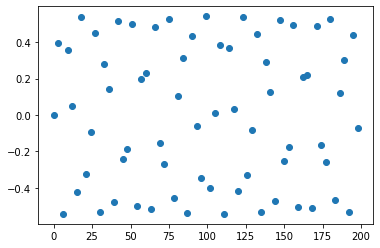

length of x is:  67
length of y is:  67


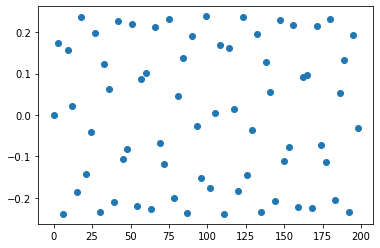

length of x is:  67
length of y is:  67


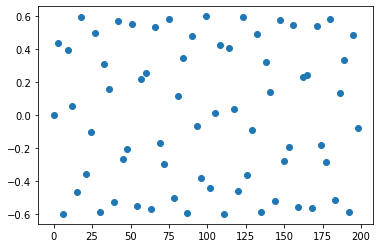

length of x is:  67
length of y is:  67


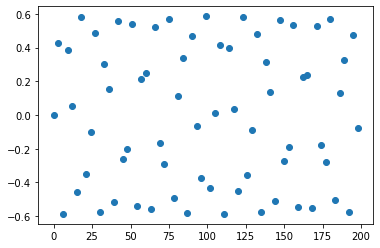

length of x is:  67
length of y is:  67


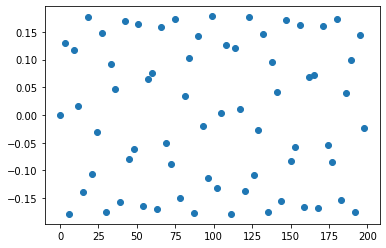

length of x is:  67
length of y is:  67


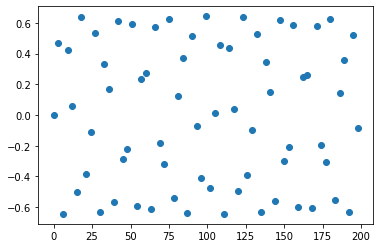

length of x is:  67
length of y is:  67


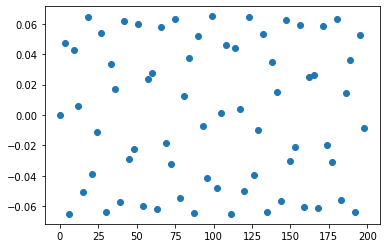

length of x is:  67
length of y is:  67


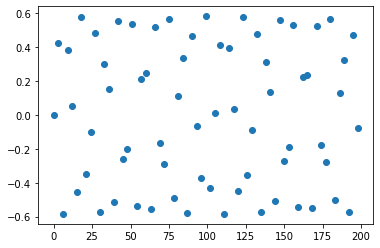

length of x is:  67
length of y is:  67


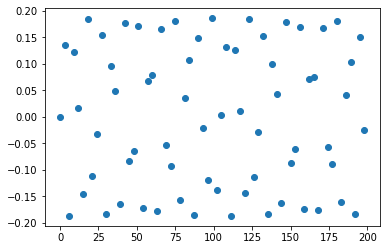

length of x is:  67
length of y is:  67


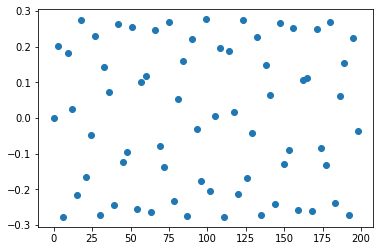

length of x is:  67
length of y is:  67


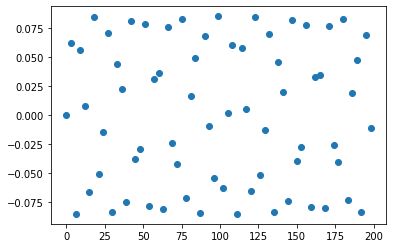

length of x is:  67
length of y is:  67


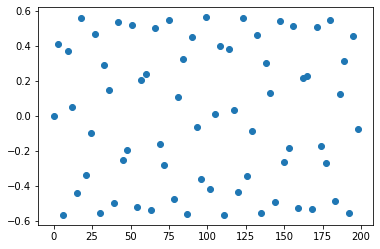

length of x is:  67
length of y is:  67


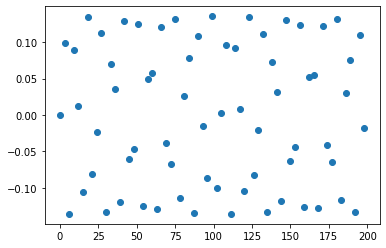

length of x is:  67
length of y is:  67


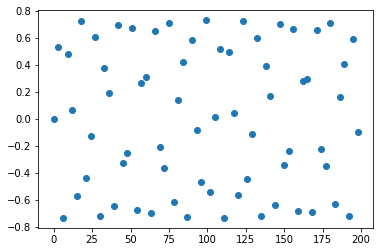

length of x is:  67
length of y is:  67


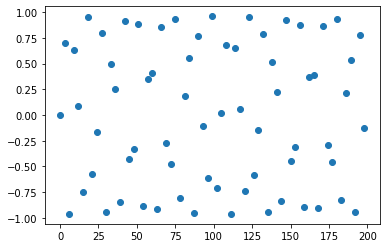

length of x is:  67
length of y is:  67


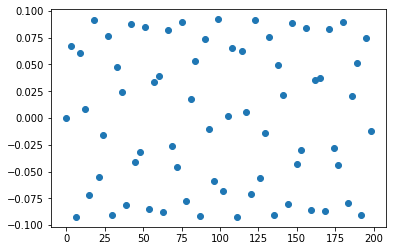

length of x is:  67
length of y is:  67


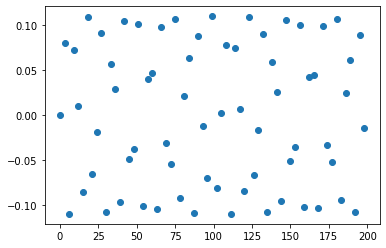

length of x is:  67
length of y is:  67


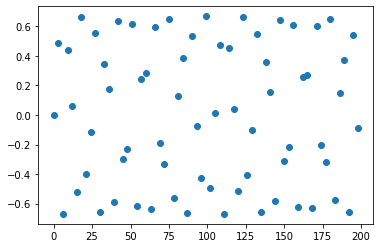

length of x is:  67
length of y is:  67


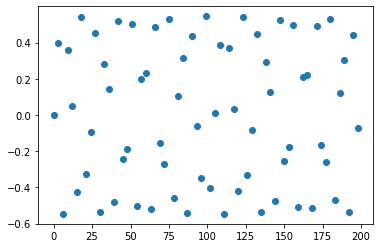

length of x is:  67
length of y is:  67


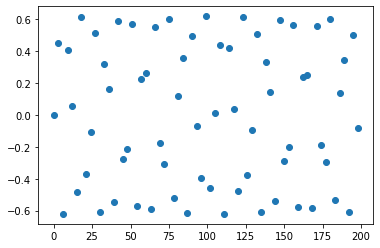

length of x is:  67
length of y is:  67


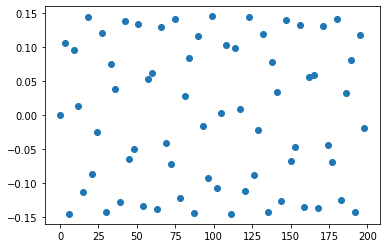

length of x is:  67
length of y is:  67


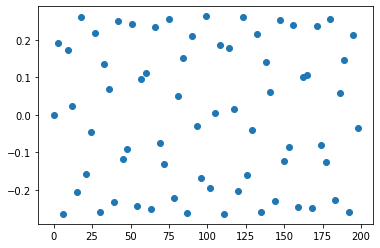

length of x is:  67
length of y is:  67


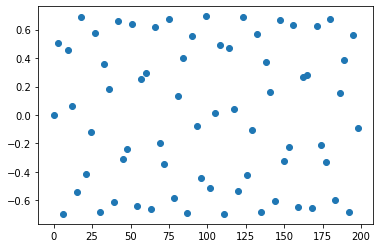

length of x is:  67
length of y is:  67


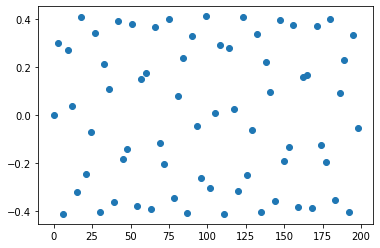

length of x is:  67
length of y is:  67


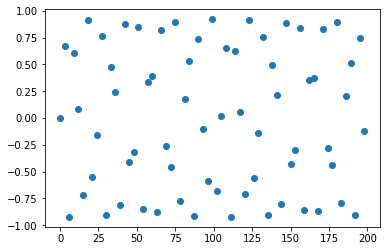

length of x is:  67
length of y is:  67


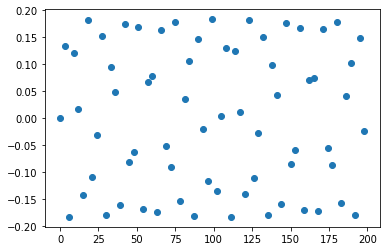

length of x is:  67
length of y is:  67


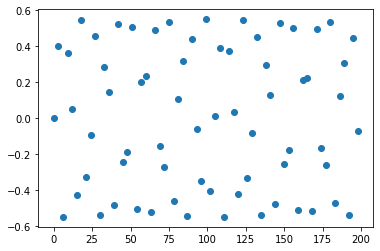

length of x is:  67
length of y is:  67


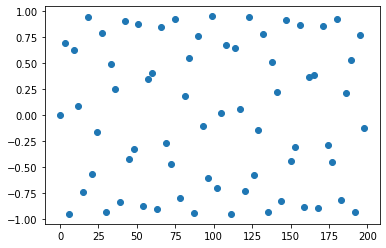

length of x is:  67
length of y is:  67


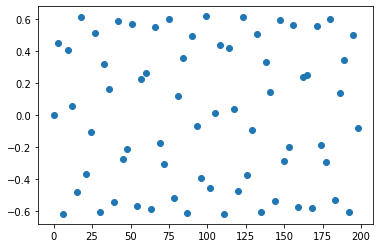

length of x is:  67
length of y is:  67


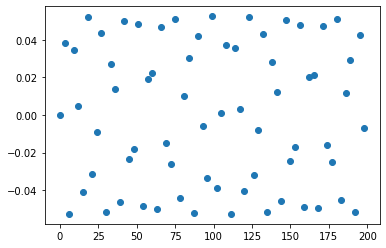

length of x is:  67
length of y is:  67


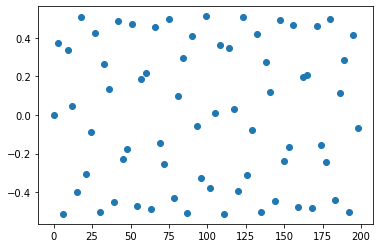

length of x is:  67
length of y is:  67


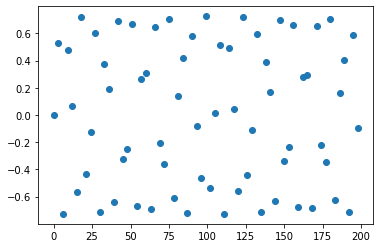

length of x is:  67
length of y is:  67


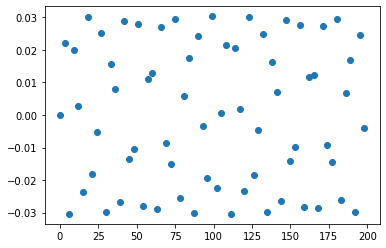

length of x is:  67
length of y is:  67


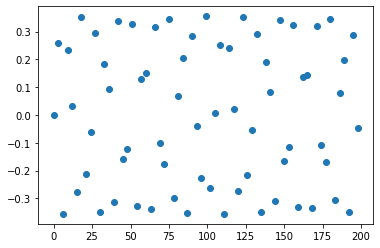

length of x is:  67
length of y is:  67


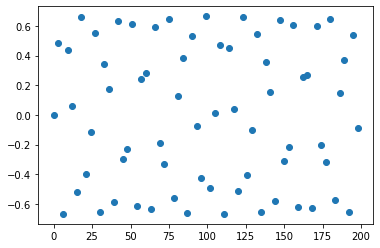

length of x is:  67
length of y is:  67


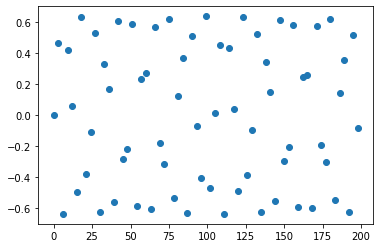

length of x is:  67
length of y is:  67


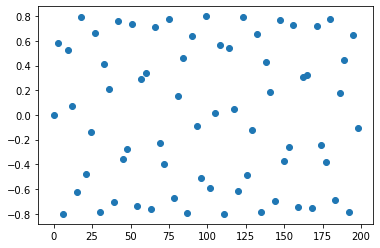

length of x is:  67
length of y is:  67


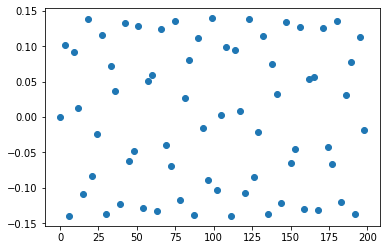

length of x is:  67
length of y is:  67


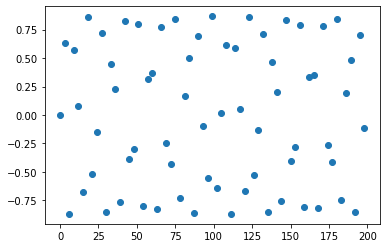

length of x is:  67
length of y is:  67


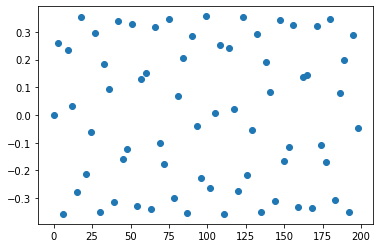

length of x is:  67
length of y is:  67


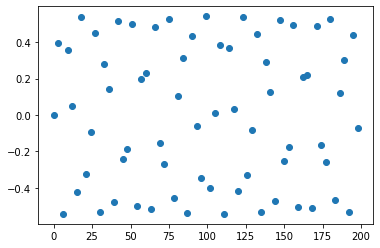

length of x is:  67
length of y is:  67


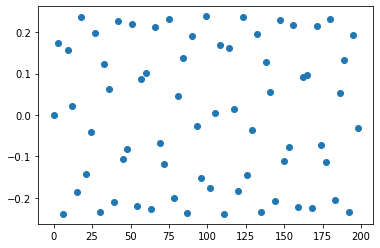

length of x is:  67
length of y is:  67


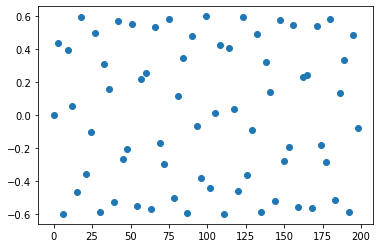

length of x is:  67
length of y is:  67


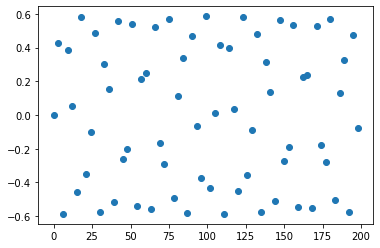

length of x is:  67
length of y is:  67


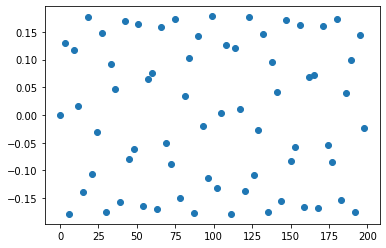

length of x is:  67
length of y is:  67


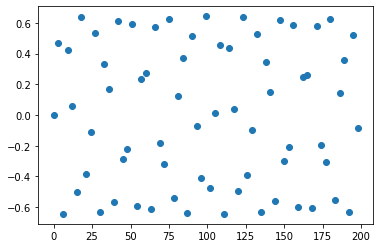

length of x is:  67
length of y is:  67


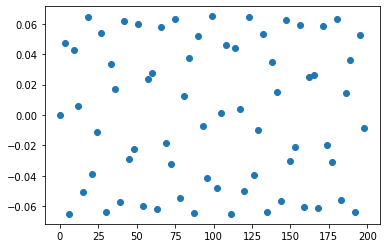

length of x is:  67
length of y is:  67


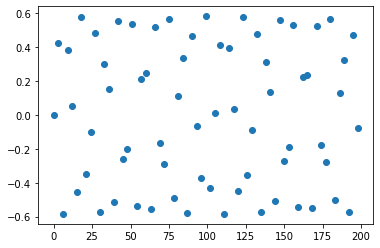

length of x is:  67
length of y is:  67


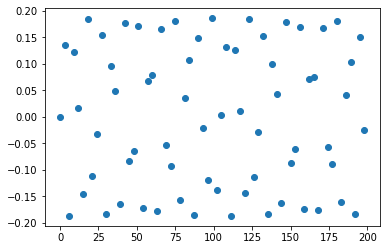

length of x is:  67
length of y is:  67


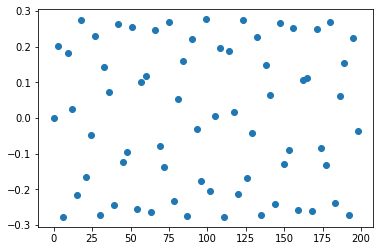

length of x is:  67
length of y is:  67


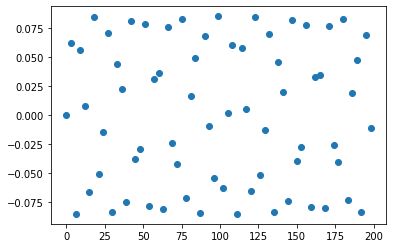

length of x is:  67
length of y is:  67


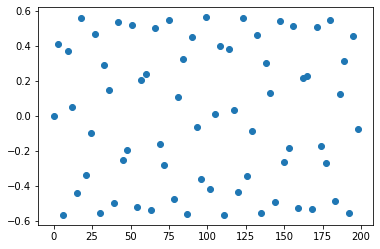

length of x is:  67
length of y is:  67


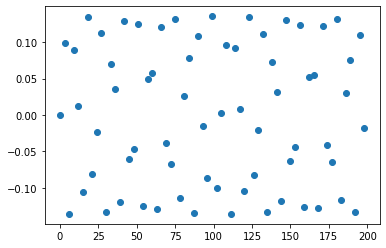

length of x is:  67
length of y is:  67


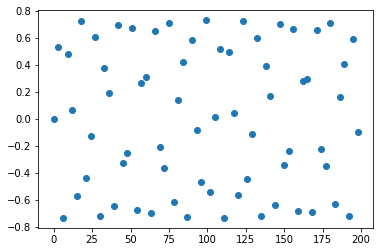

length of x is:  67
length of y is:  67


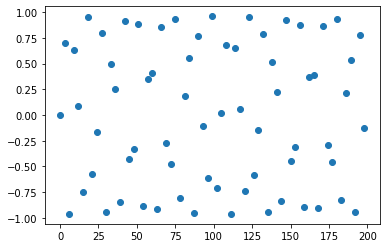

length of x is:  67
length of y is:  67


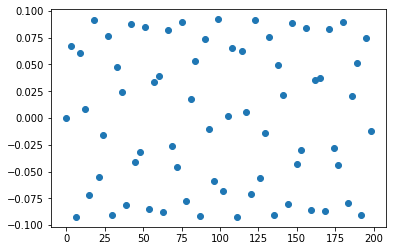

length of x is:  67
length of y is:  67


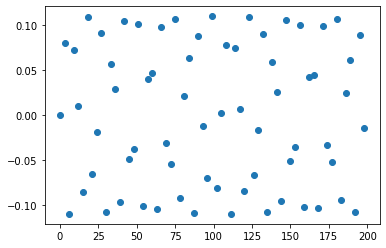

length of x is:  67
length of y is:  67


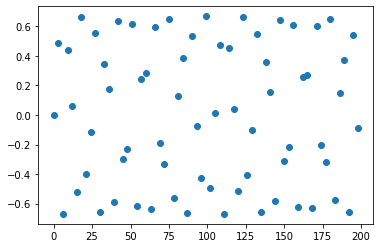

length of x is:  67
length of y is:  67


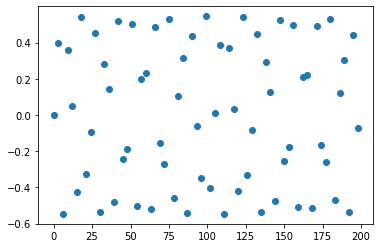

length of x is:  67
length of y is:  67


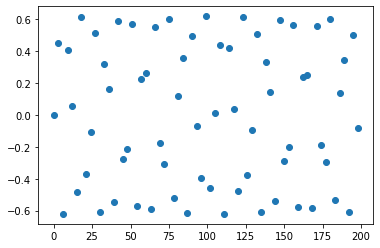

length of x is:  67
length of y is:  67


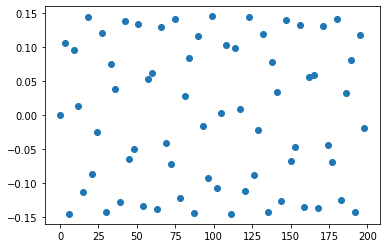

length of x is:  67
length of y is:  67


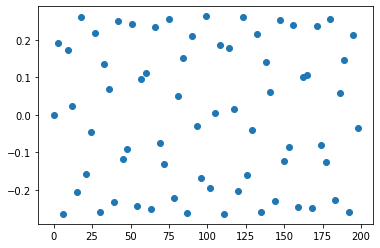

length of x is:  67
length of y is:  67


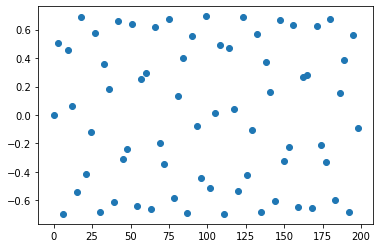

length of x is:  67
length of y is:  67


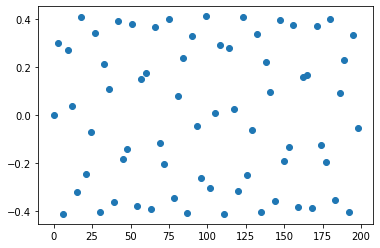

length of x is:  67
length of y is:  67


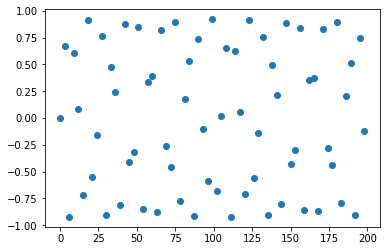

length of x is:  67
length of y is:  67


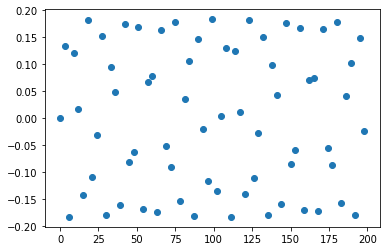

length of x is:  67
length of y is:  67


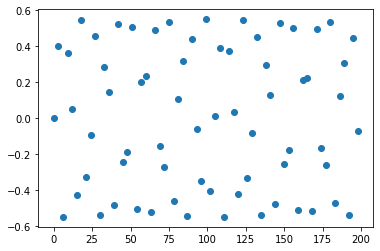

length of x is:  67
length of y is:  67


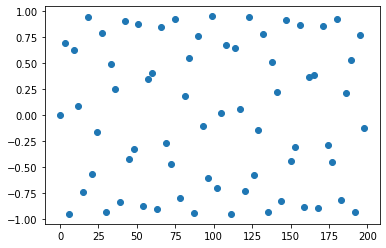

length of x is:  67
length of y is:  67


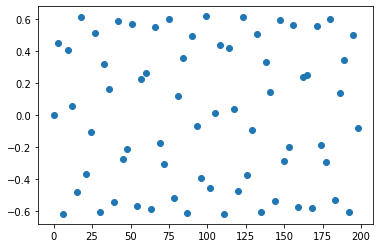

length of x is:  67
length of y is:  67


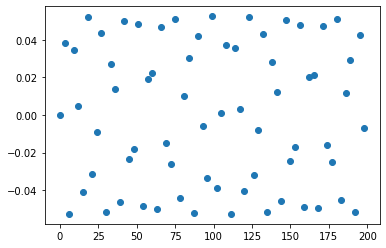

length of x is:  67
length of y is:  67


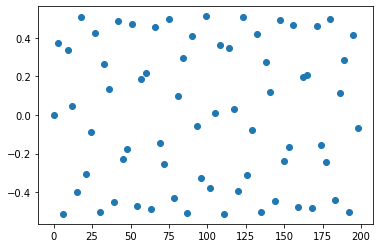

length of x is:  67
length of y is:  67


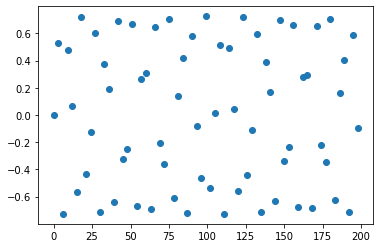

length of x is:  67
length of y is:  67


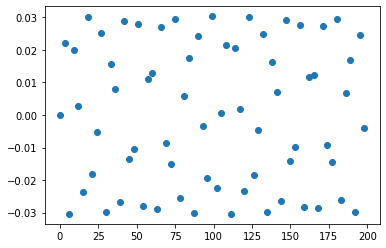

length of x is:  67
length of y is:  67


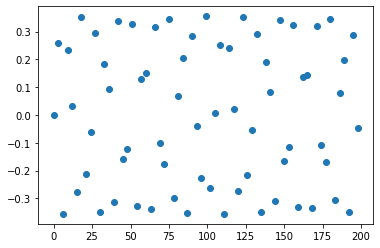

length of x is:  67
length of y is:  67


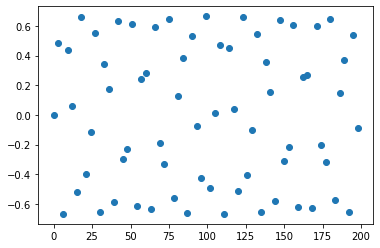

length of x is:  67
length of y is:  67


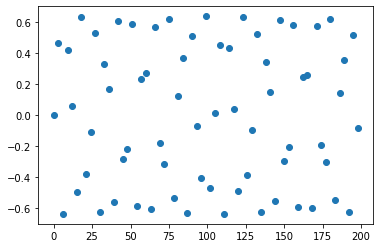

length of x is:  67
length of y is:  67


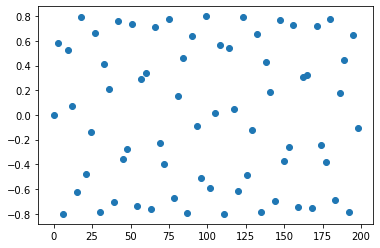

length of x is:  67
length of y is:  67


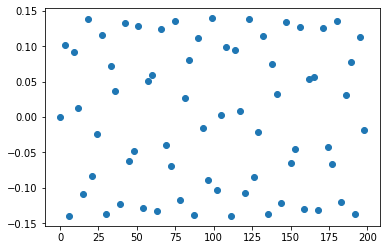

length of x is:  67
length of y is:  67


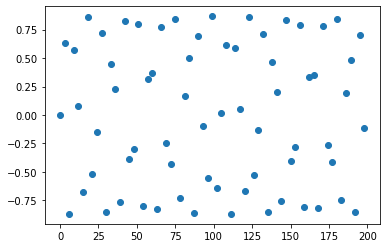

length of x is:  67
length of y is:  67


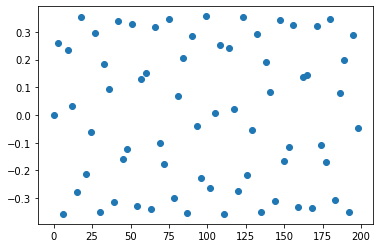

length of x is:  67
length of y is:  67


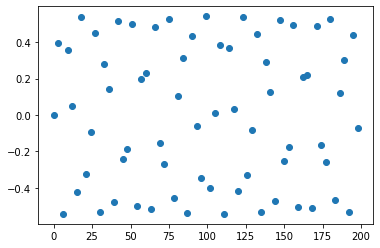

length of x is:  67
length of y is:  67


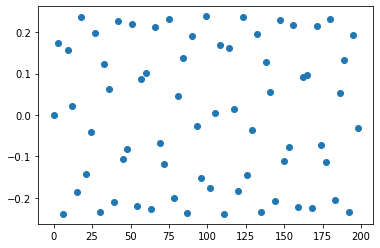

length of x is:  67
length of y is:  67


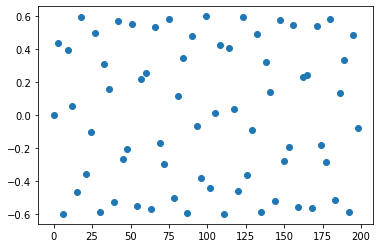

length of x is:  67
length of y is:  67


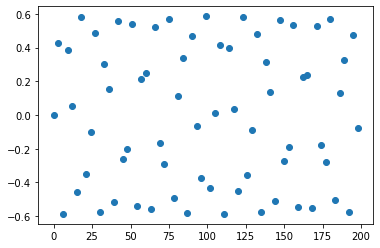

length of x is:  67
length of y is:  67


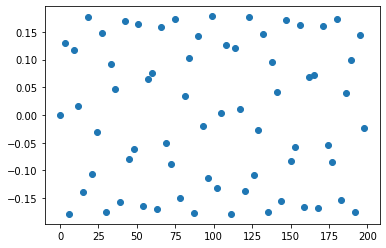

length of x is:  67
length of y is:  67


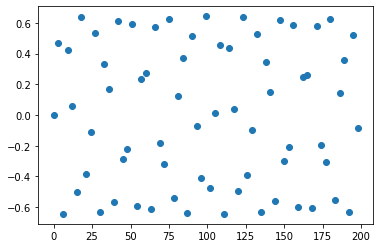

length of x is:  67
length of y is:  67


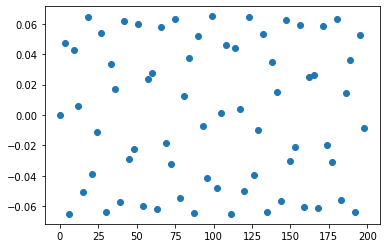

length of x is:  67
length of y is:  67


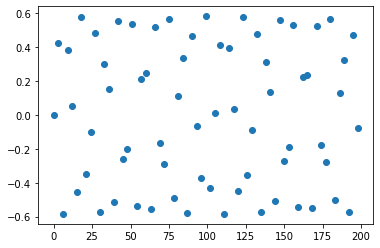

length of x is:  67
length of y is:  67


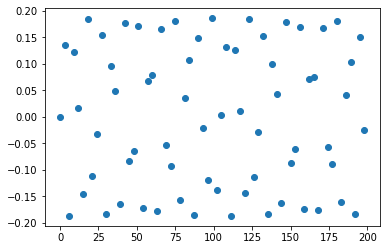

length of x is:  67
length of y is:  67


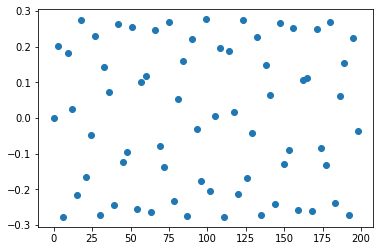

length of x is:  67
length of y is:  67


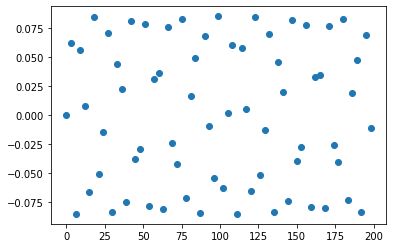

length of x is:  67
length of y is:  67


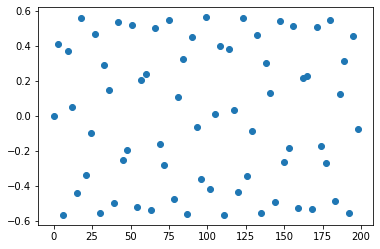

length of x is:  67
length of y is:  67


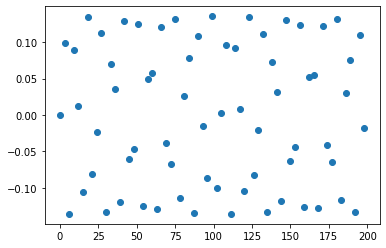

length of x is:  67
length of y is:  67


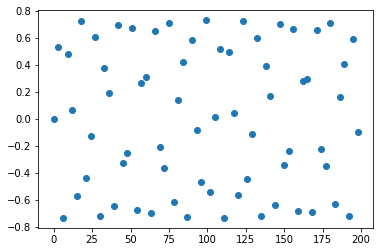

length of x is:  67
length of y is:  67


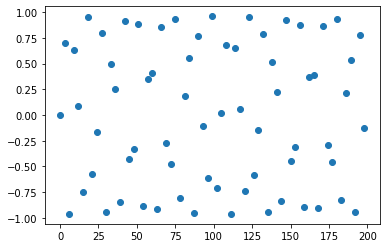

length of x is:  67
length of y is:  67


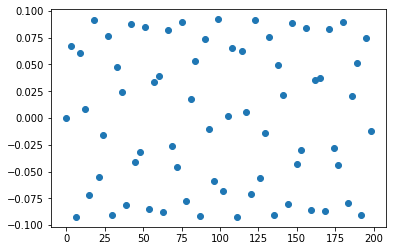

length of x is:  67
length of y is:  67


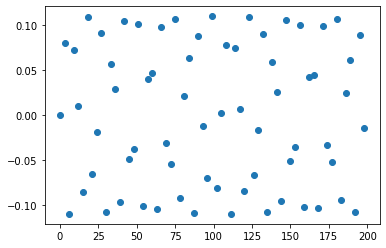

length of x is:  67
length of y is:  67


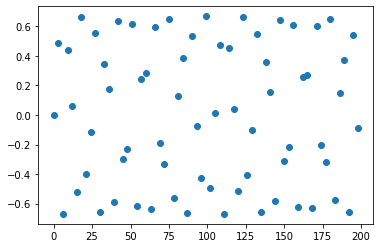

length of x is:  67
length of y is:  67


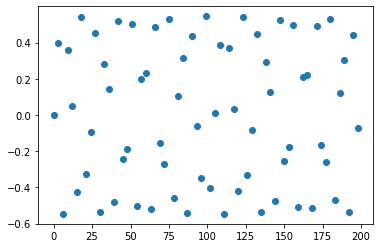

length of x is:  67
length of y is:  67


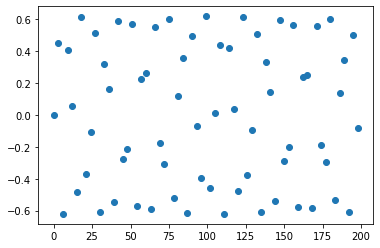

length of x is:  67
length of y is:  67


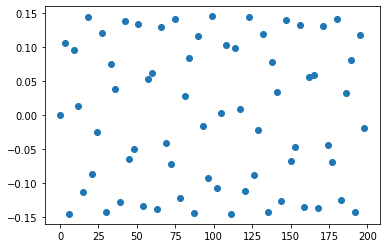

length of x is:  67
length of y is:  67


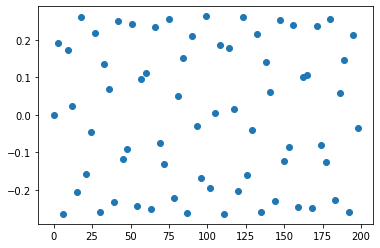

length of x is:  67
length of y is:  67


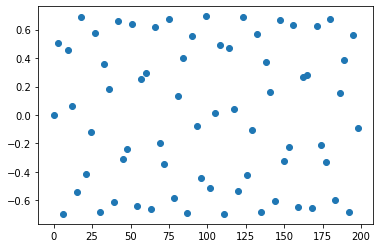

length of x is:  67
length of y is:  67


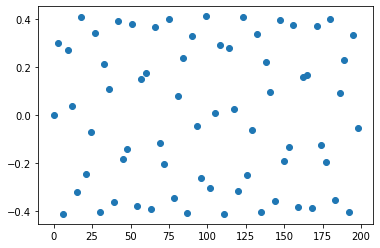

length of x is:  67
length of y is:  67


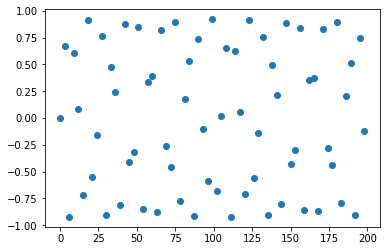

length of x is:  67
length of y is:  67


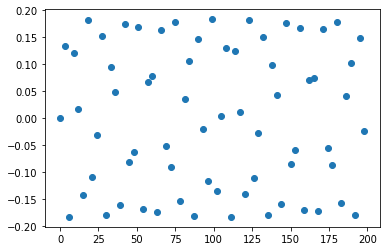

length of x is:  67
length of y is:  67


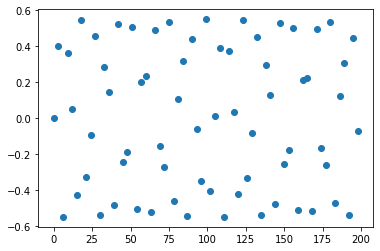

length of x is:  67
length of y is:  67


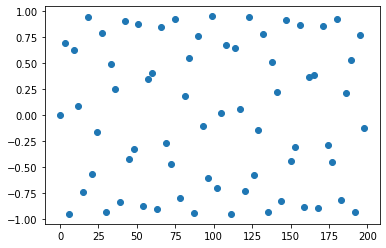

length of x is:  67
length of y is:  67


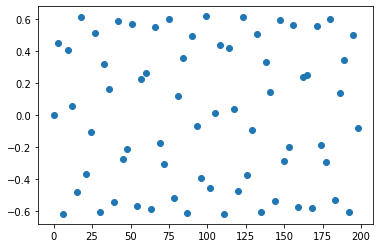

length of x is:  67
length of y is:  67


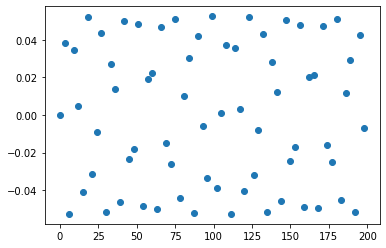

length of x is:  67
length of y is:  67


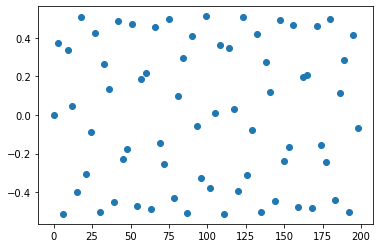

length of x is:  67
length of y is:  67


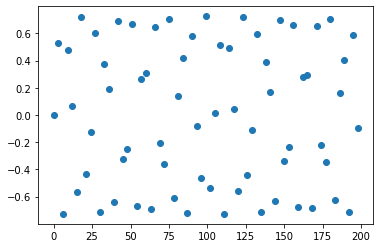

length of x is:  67
length of y is:  67


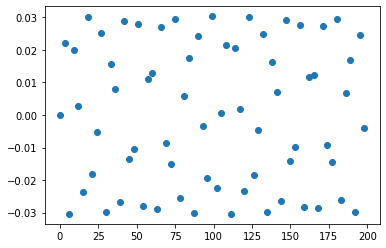

length of x is:  67
length of y is:  67


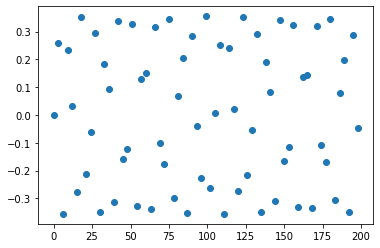

length of x is:  67
length of y is:  67


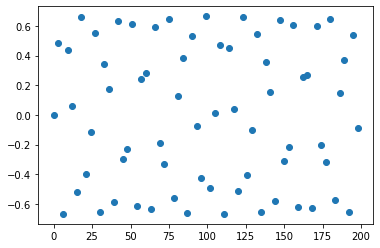

length of x is:  67
length of y is:  67


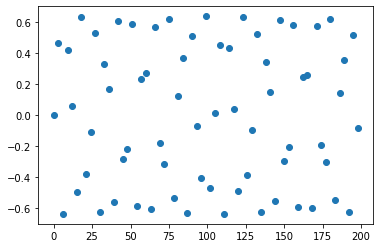

length of x is:  67
length of y is:  67


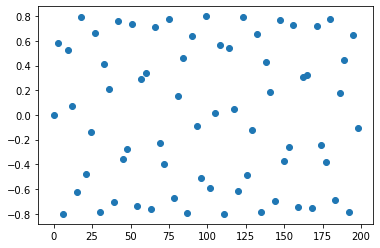

length of x is:  67
length of y is:  67


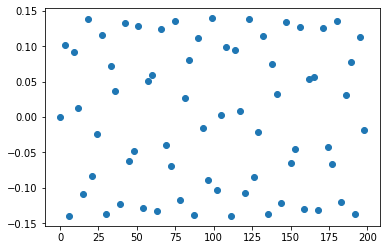

length of x is:  67
length of y is:  67


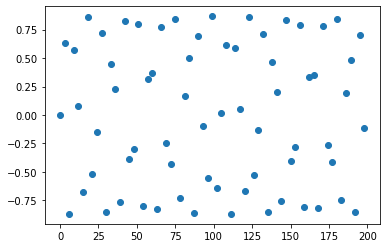

length of x is:  67
length of y is:  67


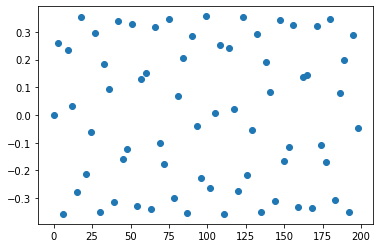

length of x is:  67
length of y is:  67


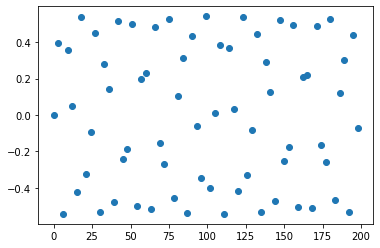

length of x is:  67
length of y is:  67


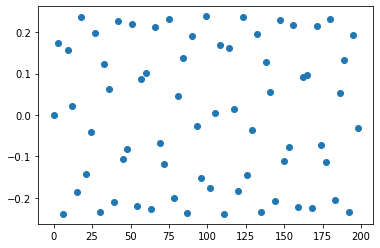

length of x is:  67
length of y is:  67


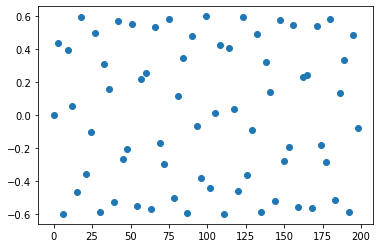

length of x is:  67
length of y is:  67


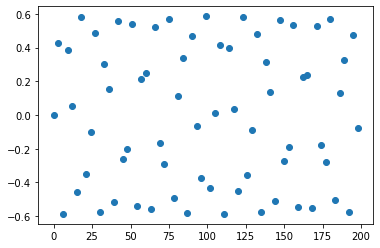

length of x is:  67
length of y is:  67


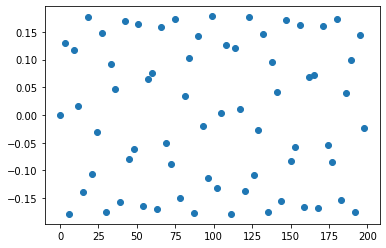

length of x is:  67
length of y is:  67


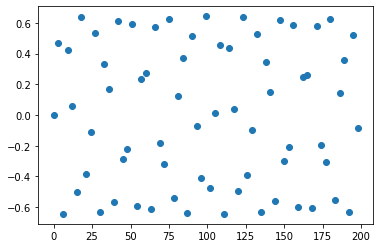

length of x is:  67
length of y is:  67


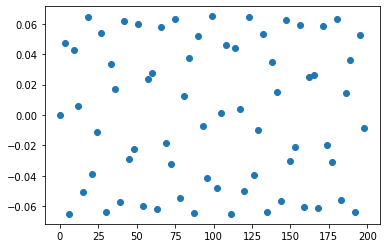

length of x is:  67
length of y is:  67


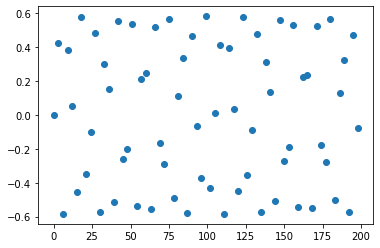

length of x is:  67
length of y is:  67


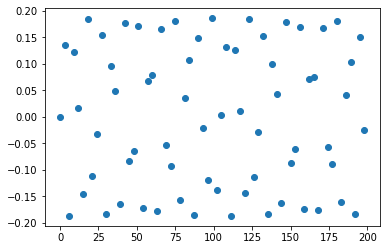

length of x is:  67
length of y is:  67


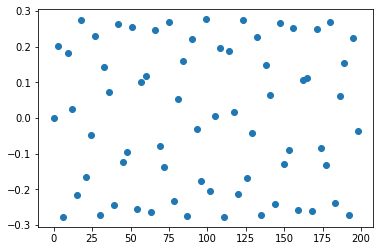

length of x is:  67
length of y is:  67


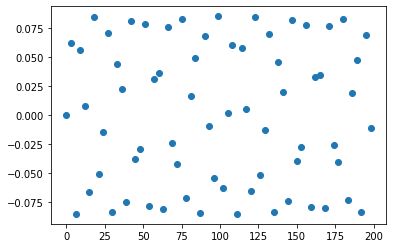

length of x is:  67
length of y is:  67


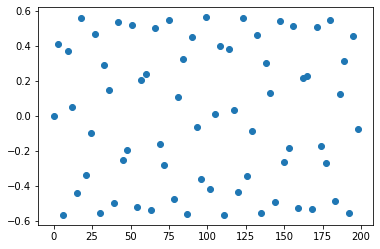

length of x is:  67
length of y is:  67


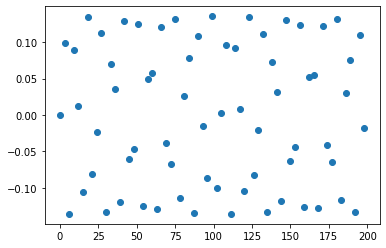

length of x is:  67
length of y is:  67


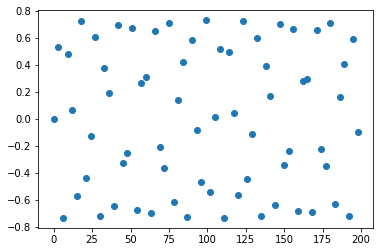

length of x is:  67
length of y is:  67


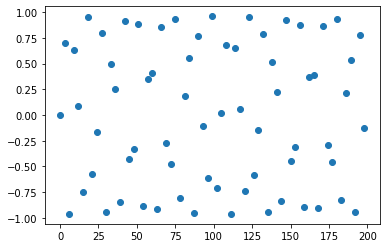

length of x is:  67
length of y is:  67


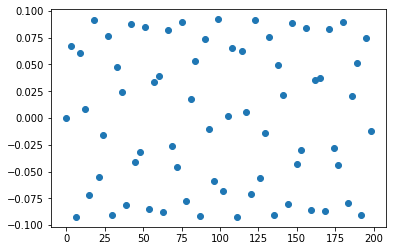

length of x is:  67
length of y is:  67


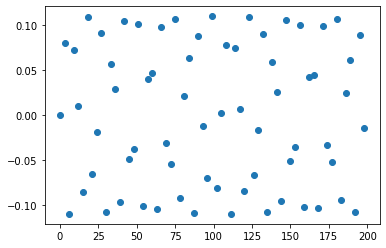

length of x is:  67
length of y is:  67


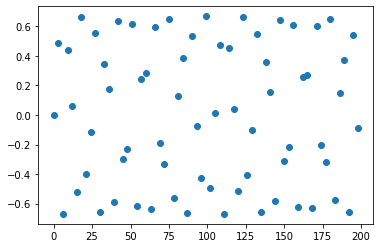

length of x is:  67
length of y is:  67


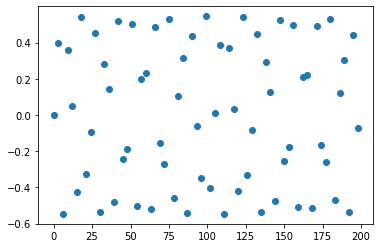

length of x is:  67
length of y is:  67


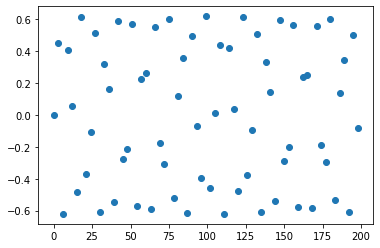

length of x is:  67
length of y is:  67


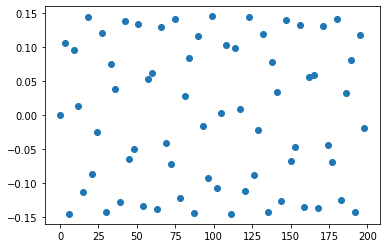

length of x is:  67
length of y is:  67


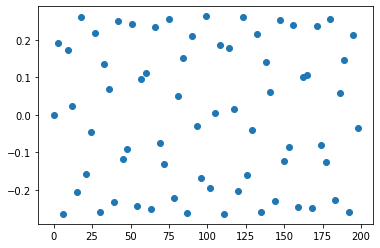

length of x is:  67
length of y is:  67


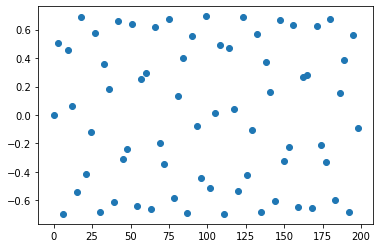

length of x is:  67
length of y is:  67


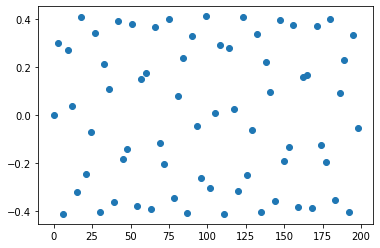

length of x is:  67
length of y is:  67


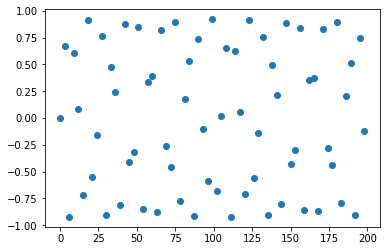

length of x is:  67
length of y is:  67


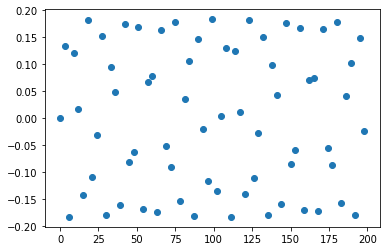

length of x is:  67
length of y is:  67


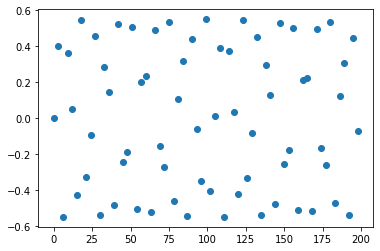

length of x is:  67
length of y is:  67


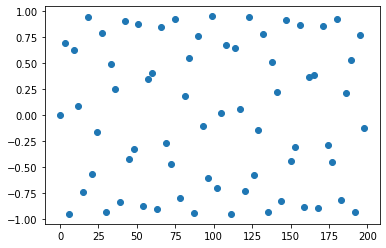

length of x is:  67
length of y is:  67


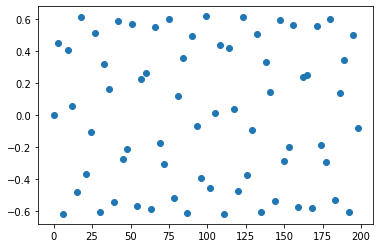

length of x is:  67
length of y is:  67


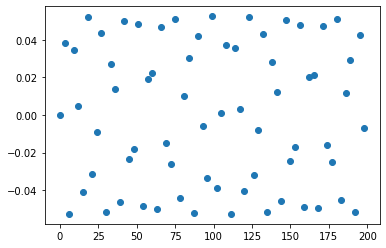

length of x is:  67
length of y is:  67


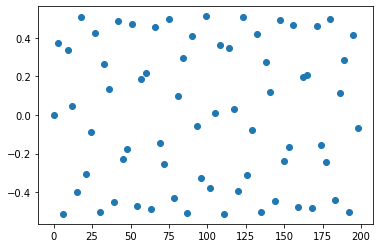

length of x is:  67
length of y is:  67


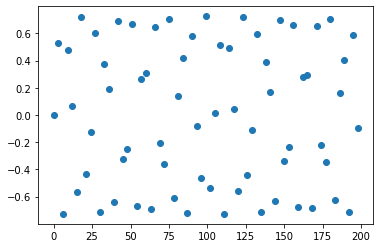

length of x is:  67
length of y is:  67


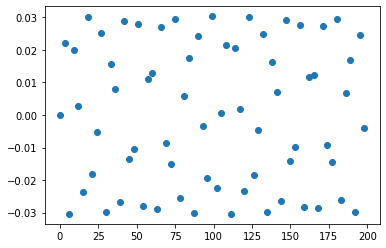

length of x is:  67
length of y is:  67


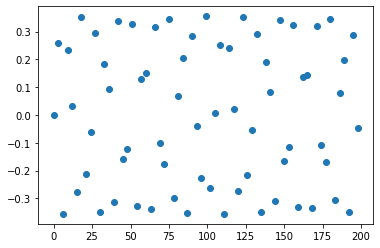

length of x is:  67
length of y is:  67


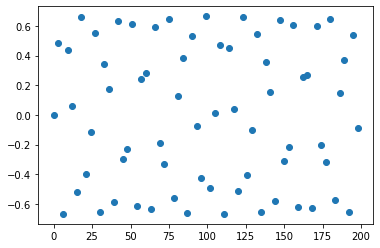

length of x is:  67
length of y is:  67


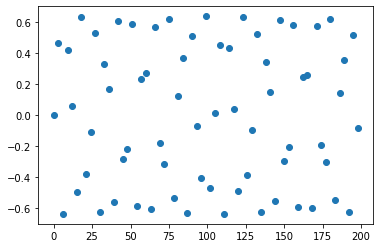

length of x is:  67
length of y is:  67


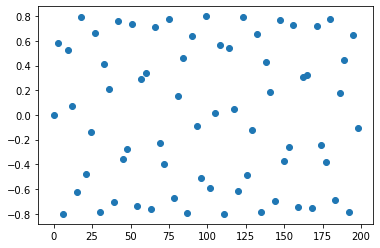

length of x is:  67
length of y is:  67


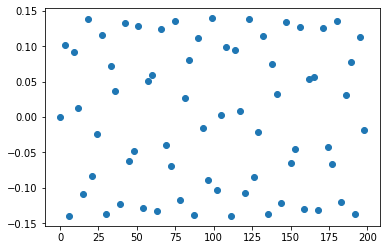

length of x is:  67
length of y is:  67


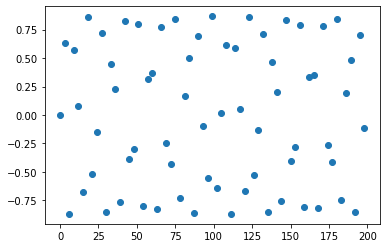

length of x is:  67
length of y is:  67


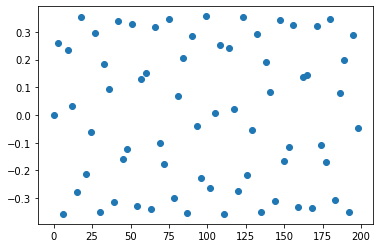

length of x is:  67
length of y is:  67


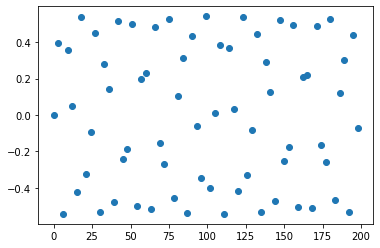

length of x is:  67
length of y is:  67


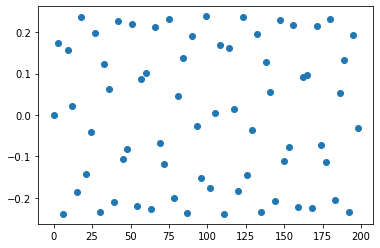

length of x is:  67
length of y is:  67


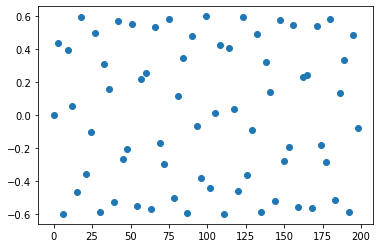

length of x is:  67
length of y is:  67


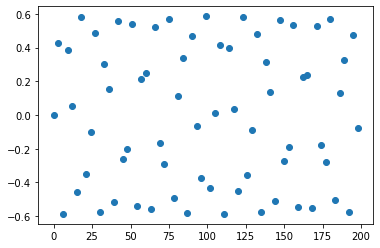

length of x is:  67
length of y is:  67


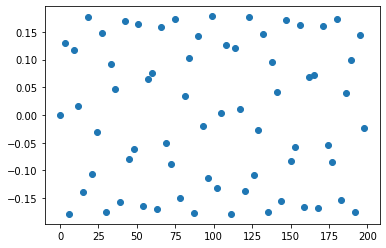

length of x is:  67
length of y is:  67


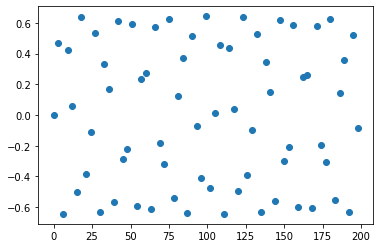

length of x is:  67
length of y is:  67


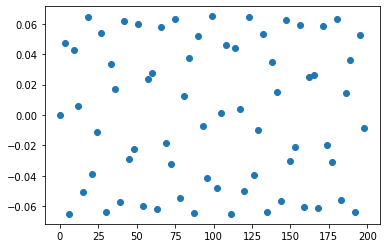

length of x is:  67
length of y is:  67


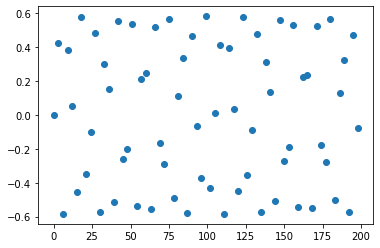

length of x is:  67
length of y is:  67


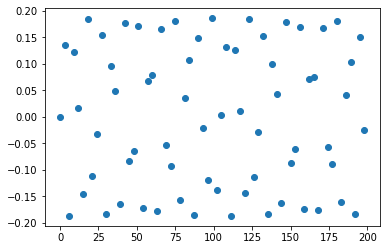

length of x is:  67
length of y is:  67


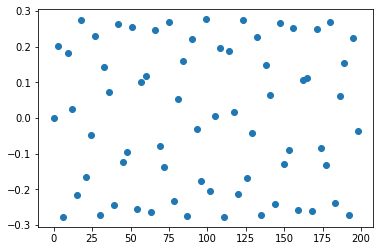

length of x is:  67
length of y is:  67


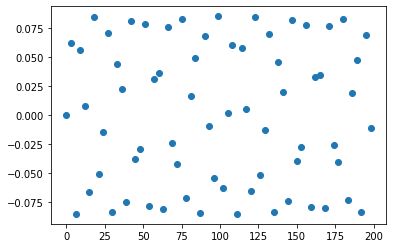

length of x is:  67
length of y is:  67


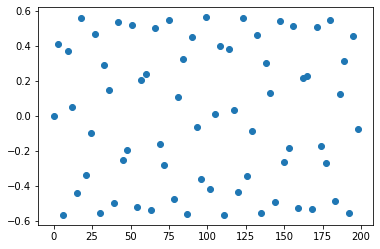

length of x is:  67
length of y is:  67


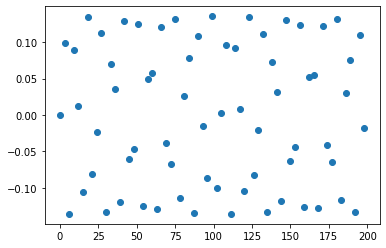

length of x is:  67
length of y is:  67


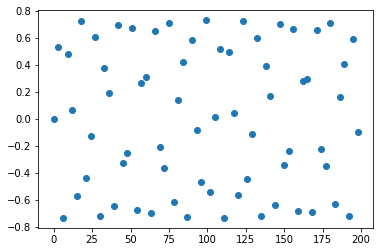

length of x is:  67
length of y is:  67


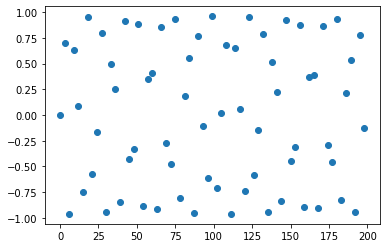

length of x is:  67
length of y is:  67


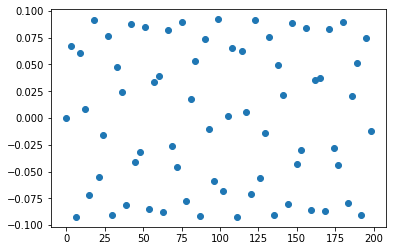

length of x is:  67
length of y is:  67


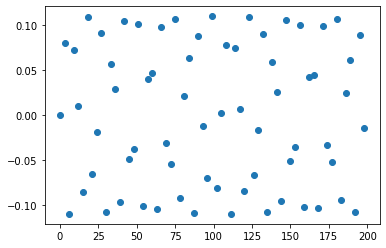

length of x is:  67
length of y is:  67


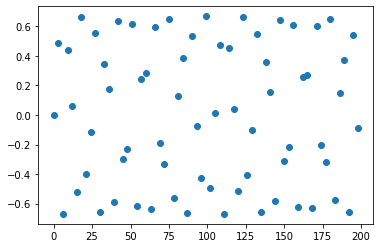

length of x is:  67
length of y is:  67


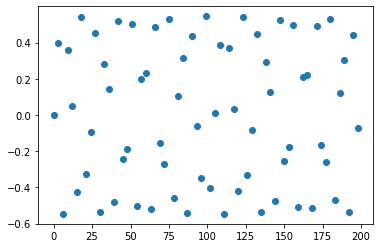

length of x is:  67
length of y is:  67


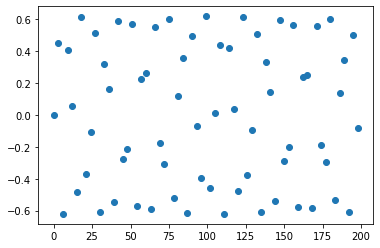

length of x is:  67
length of y is:  67


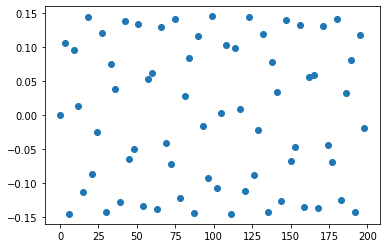

length of x is:  67
length of y is:  67


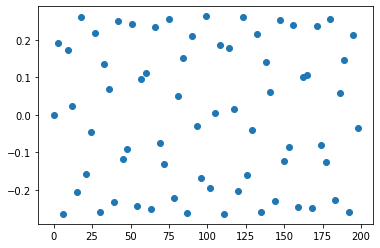

length of x is:  67
length of y is:  67


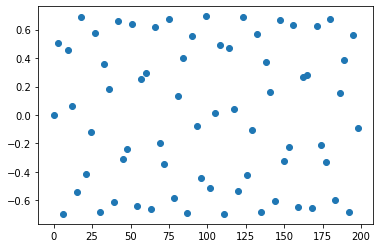

length of x is:  67
length of y is:  67


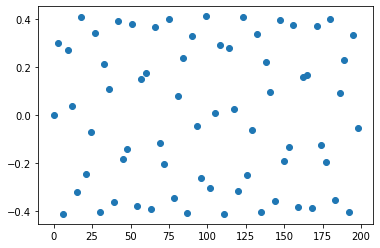

length of x is:  67
length of y is:  67


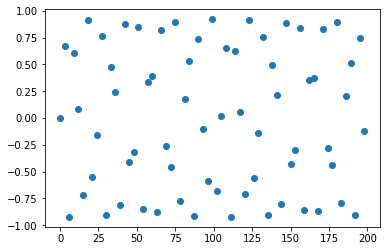

length of x is:  67
length of y is:  67


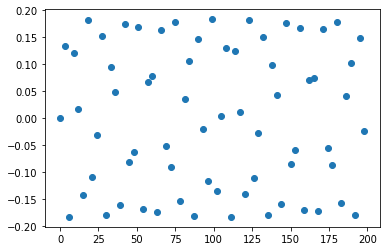

length of x is:  67
length of y is:  67


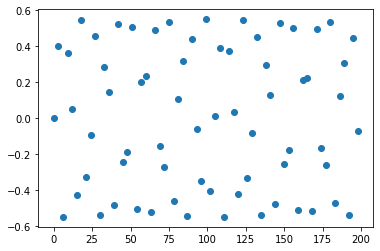

length of x is:  67
length of y is:  67


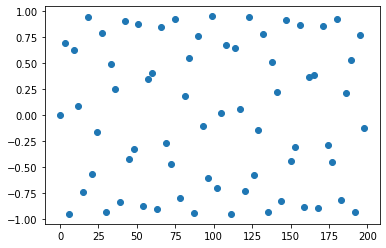

length of x is:  67
length of y is:  67


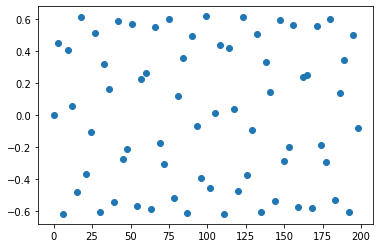

length of x is:  67
length of y is:  67


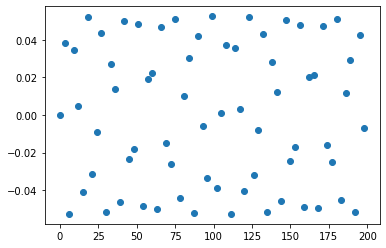

length of x is:  67
length of y is:  67


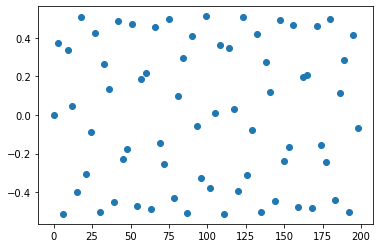

length of x is:  67
length of y is:  67


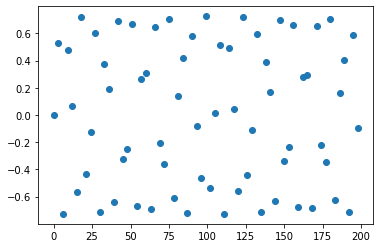

length of x is:  67
length of y is:  67


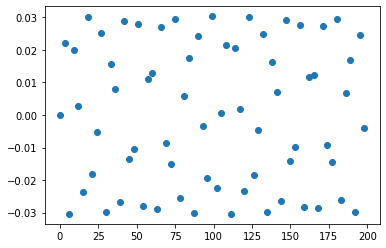

length of x is:  67
length of y is:  67


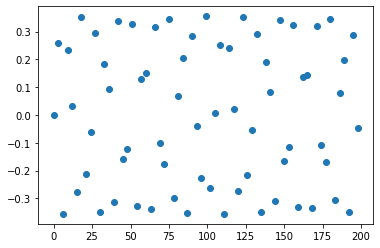

length of x is:  67
length of y is:  67


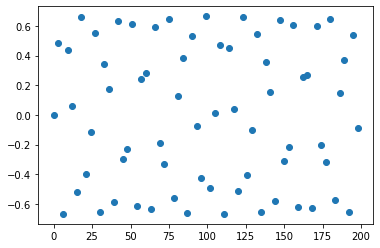

length of x is:  67
length of y is:  67


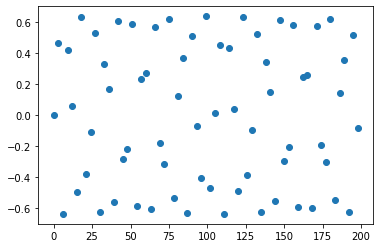

length of x is:  67
length of y is:  67


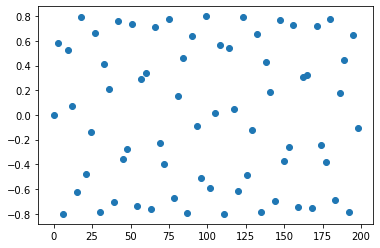

length of x is:  67
length of y is:  67


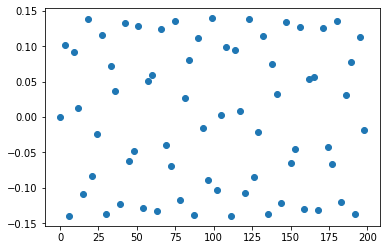

length of x is:  67
length of y is:  67


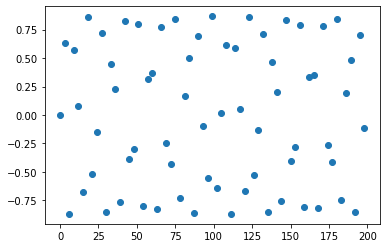

length of x is:  67
length of y is:  67


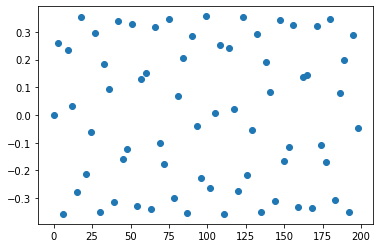

length of x is:  67
length of y is:  67


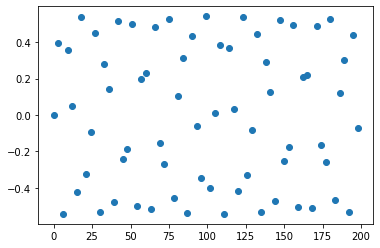

length of x is:  67
length of y is:  67


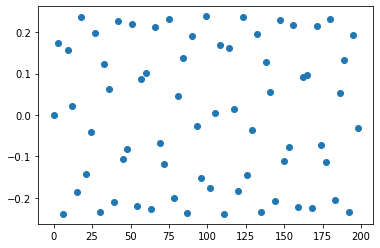

length of x is:  67
length of y is:  67


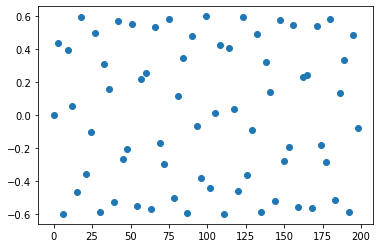

length of x is:  67
length of y is:  67


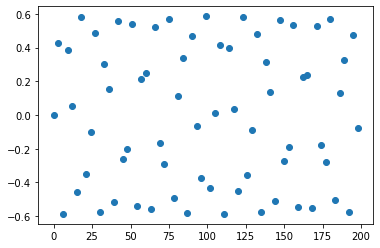

length of x is:  67
length of y is:  67


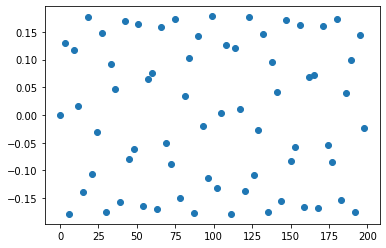

length of x is:  67
length of y is:  67


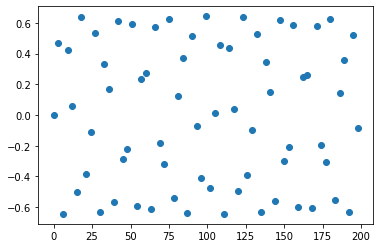

length of x is:  67
length of y is:  67


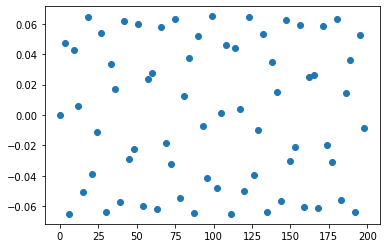

length of x is:  67
length of y is:  67


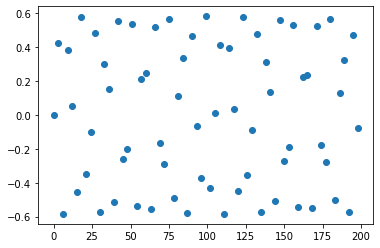

length of x is:  67
length of y is:  67


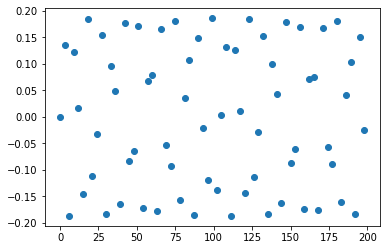

length of x is:  67
length of y is:  67


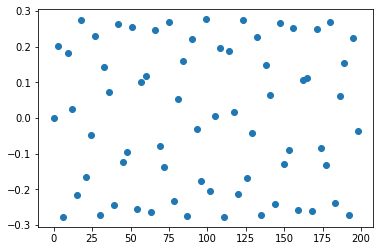

length of x is:  67
length of y is:  67


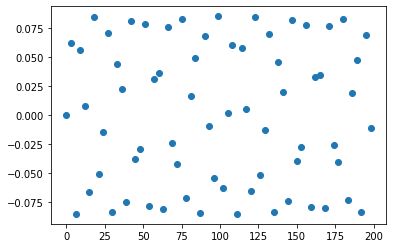

length of x is:  67
length of y is:  67


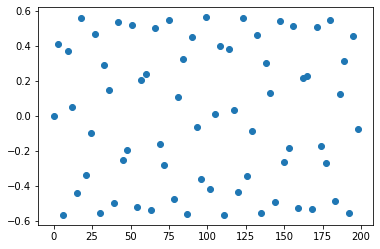

length of x is:  67
length of y is:  67


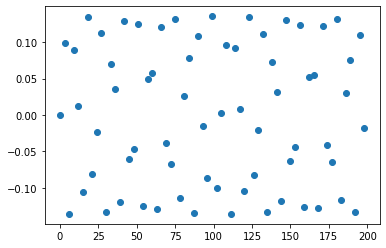

length of x is:  67
length of y is:  67


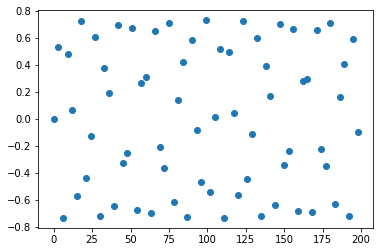

length of x is:  67
length of y is:  67


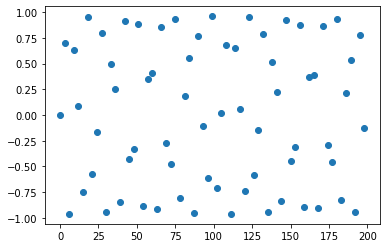

length of x is:  67
length of y is:  67


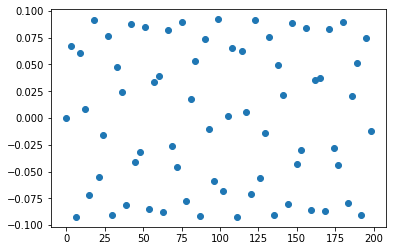

length of x is:  67
length of y is:  67


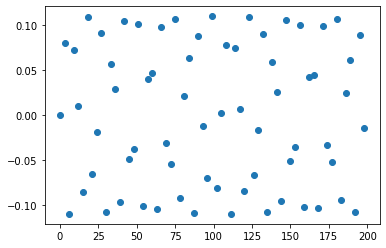

length of x is:  67
length of y is:  67


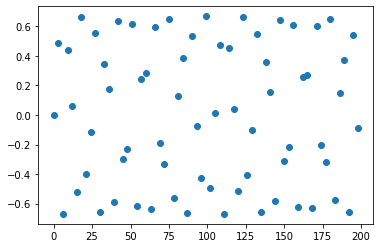

length of x is:  67
length of y is:  67


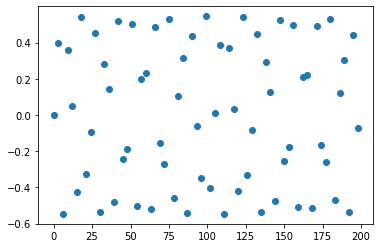

length of x is:  67
length of y is:  67


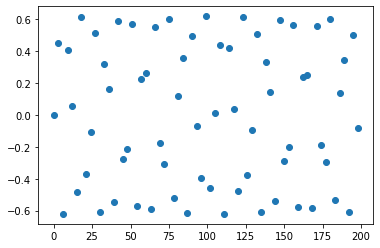

length of x is:  67
length of y is:  67


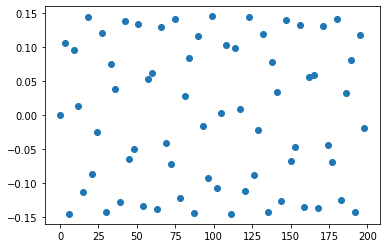

length of x is:  67
length of y is:  67


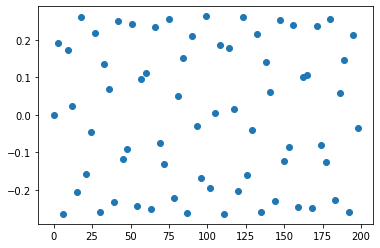

length of x is:  67
length of y is:  67


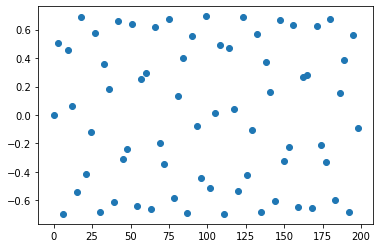

length of x is:  67
length of y is:  67


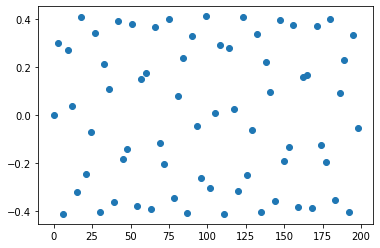

length of x is:  67
length of y is:  67


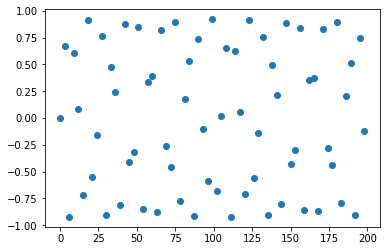

length of x is:  67
length of y is:  67


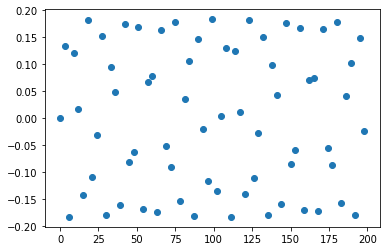

length of x is:  67
length of y is:  67


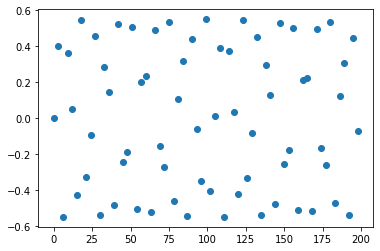

length of x is:  67
length of y is:  67


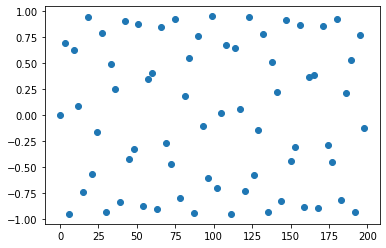

length of x is:  67
length of y is:  67


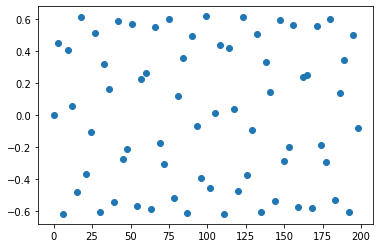

length of x is:  67
length of y is:  67


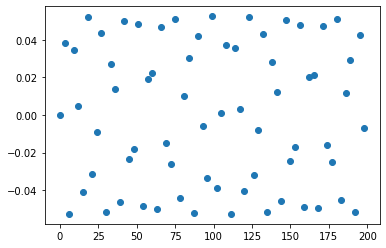

length of x is:  67
length of y is:  67


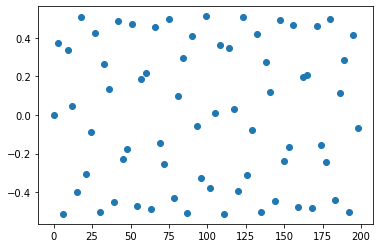

length of x is:  67
length of y is:  67


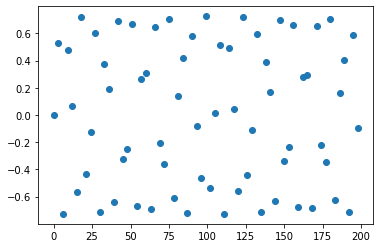

length of x is:  67
length of y is:  67


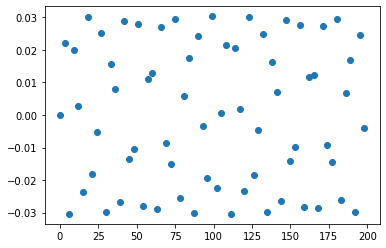

length of x is:  67
length of y is:  67


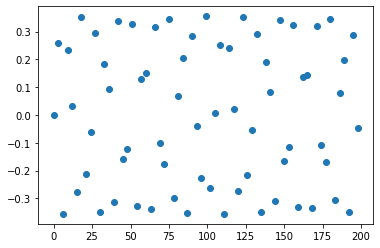

length of x is:  67
length of y is:  67


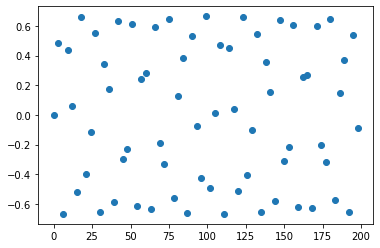

length of x is:  67
length of y is:  67


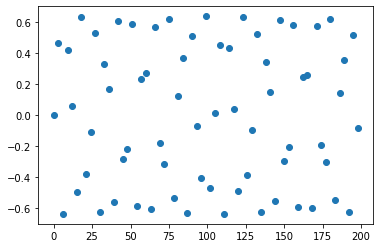

length of x is:  67
length of y is:  67


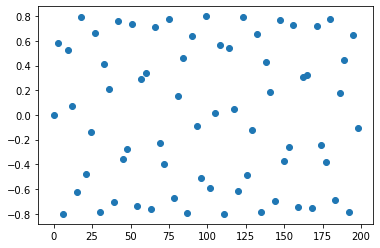

length of x is:  67
length of y is:  67


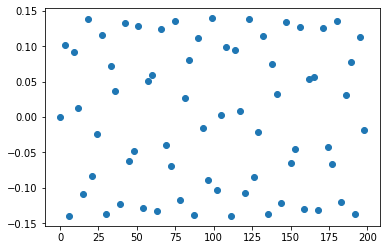

length of x is:  67
length of y is:  67


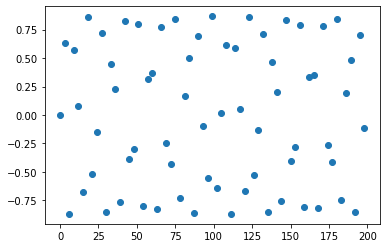

length of x is:  67
length of y is:  67


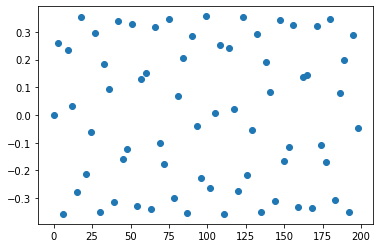

length of x is:  67
length of y is:  67


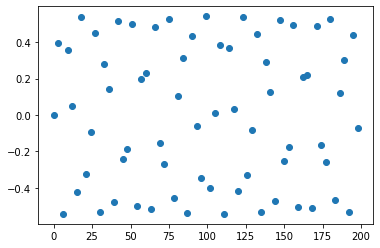

length of x is:  67
length of y is:  67


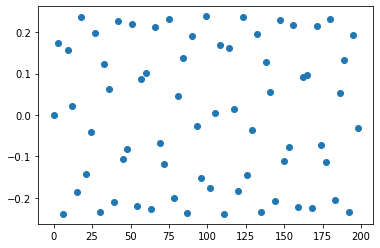

length of x is:  67
length of y is:  67


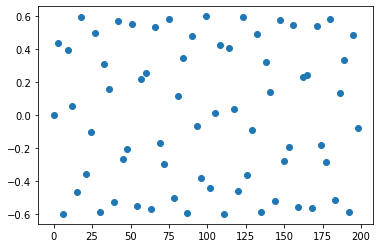

length of x is:  67
length of y is:  67


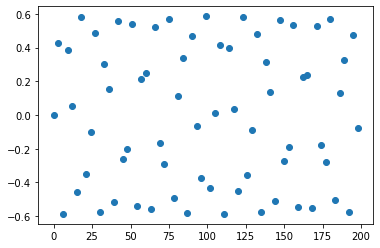

length of x is:  67
length of y is:  67


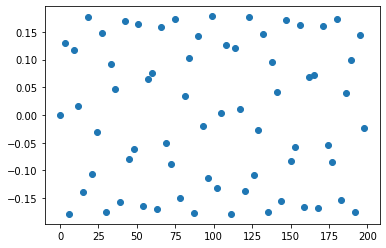

length of x is:  67
length of y is:  67


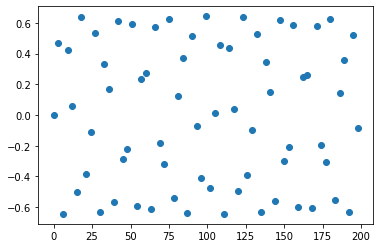

length of x is:  67
length of y is:  67


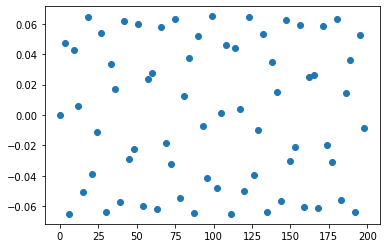

length of x is:  67
length of y is:  67


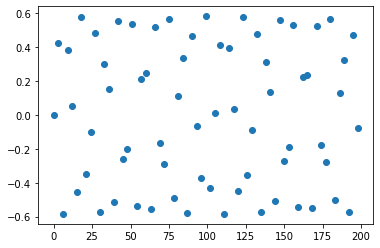

length of x is:  67
length of y is:  67


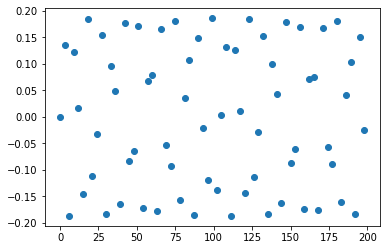

length of x is:  67
length of y is:  67


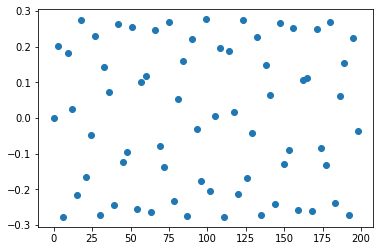

length of x is:  67
length of y is:  67


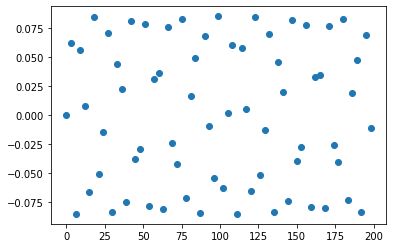

length of x is:  67
length of y is:  67


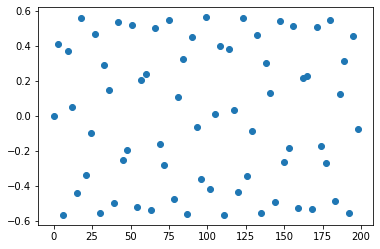

length of x is:  67
length of y is:  67


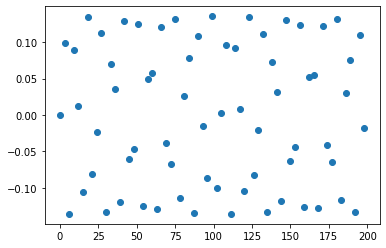

length of x is:  67
length of y is:  67


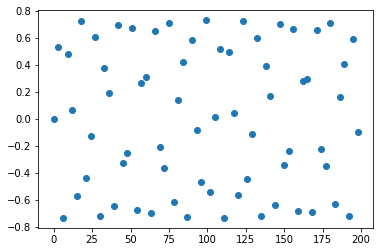

length of x is:  67
length of y is:  67


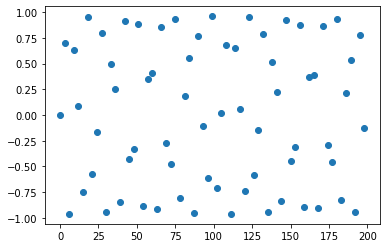

length of x is:  67
length of y is:  67


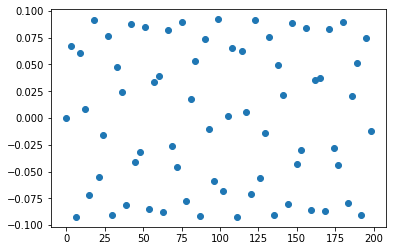

length of x is:  67
length of y is:  67


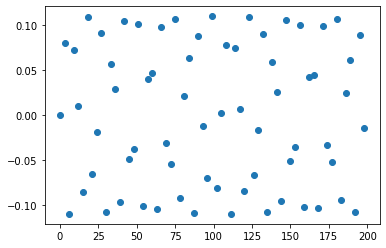

length of x is:  67
length of y is:  67


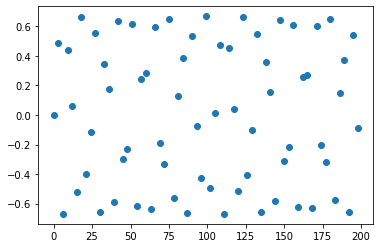

length of x is:  67
length of y is:  67


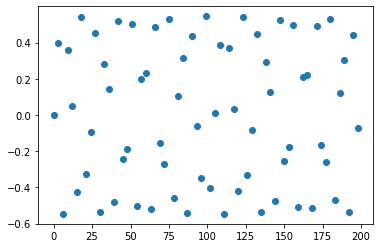

length of x is:  67
length of y is:  67


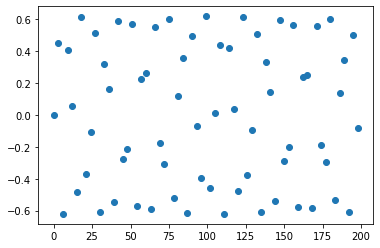

length of x is:  67
length of y is:  67


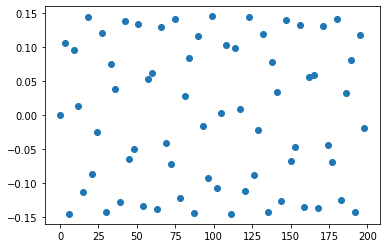

length of x is:  67
length of y is:  67


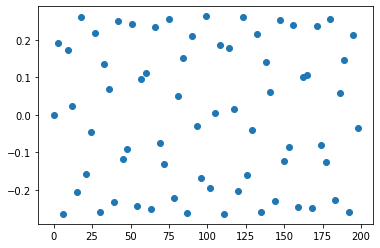

length of x is:  67
length of y is:  67


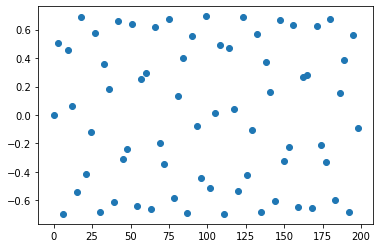

length of x is:  67
length of y is:  67


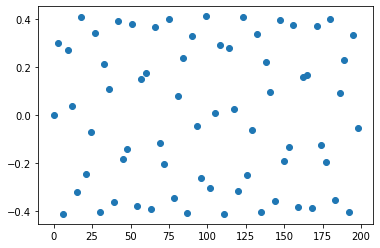

length of x is:  67
length of y is:  67


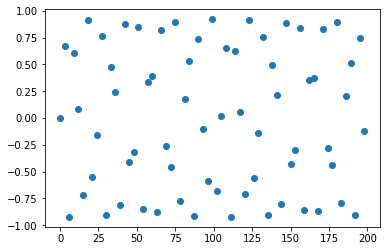

length of x is:  67
length of y is:  67


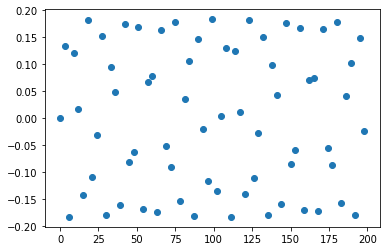

length of x is:  67
length of y is:  67


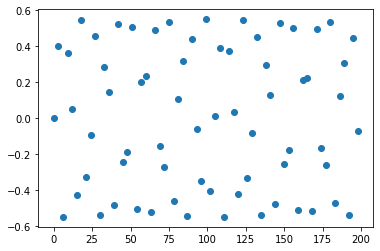

length of x is:  67
length of y is:  67


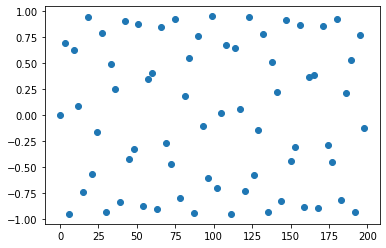

length of x is:  67
length of y is:  67


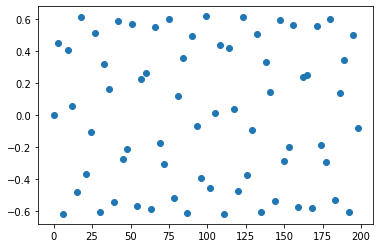

length of x is:  67
length of y is:  67


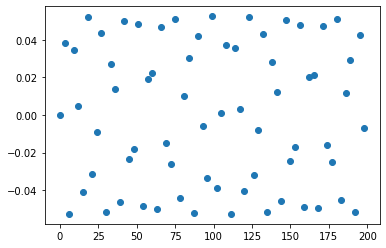

length of x is:  67
length of y is:  67


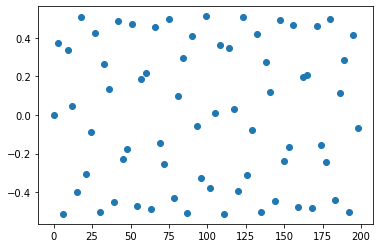

length of x is:  67
length of y is:  67


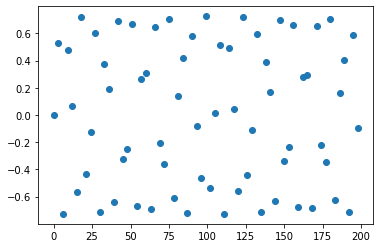

length of x is:  67
length of y is:  67


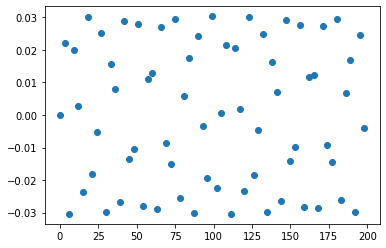

length of x is:  67
length of y is:  67


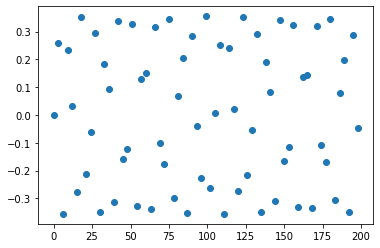

length of x is:  67
length of y is:  67


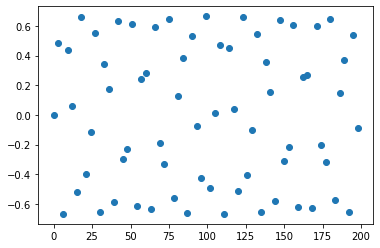

length of x is:  67
length of y is:  67


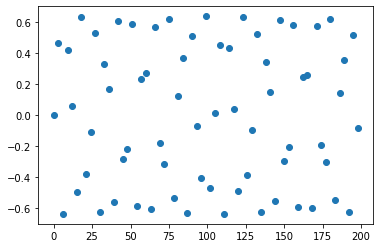

length of x is:  67
length of y is:  67


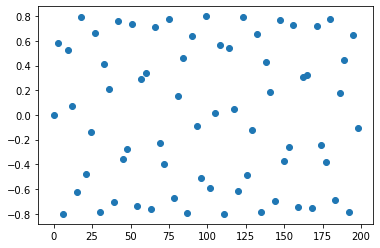

length of x is:  67
length of y is:  67


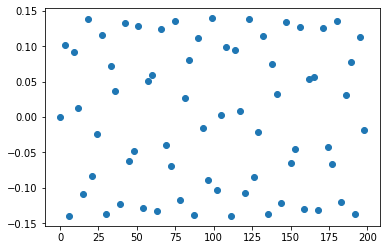

length of x is:  67
length of y is:  67


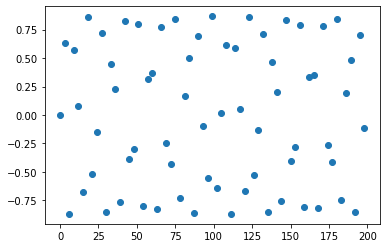

length of x is:  67
length of y is:  67


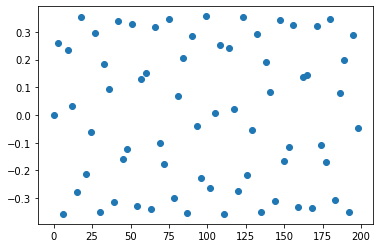

length of x is:  67
length of y is:  67


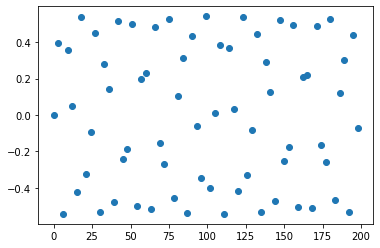

length of x is:  67
length of y is:  67


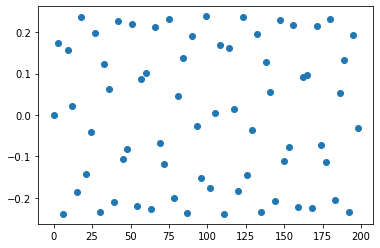

length of x is:  67
length of y is:  67


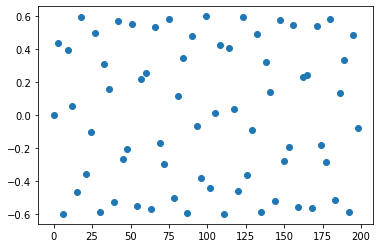

length of x is:  67
length of y is:  67


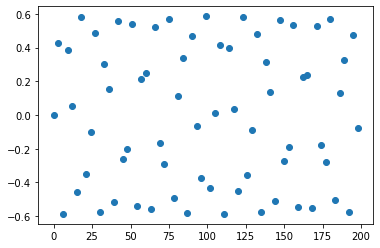

length of x is:  67
length of y is:  67


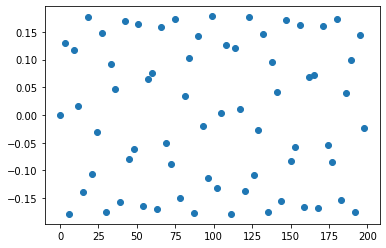

length of x is:  67
length of y is:  67


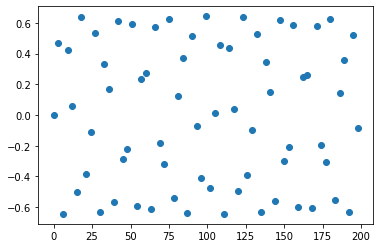

length of x is:  67
length of y is:  67


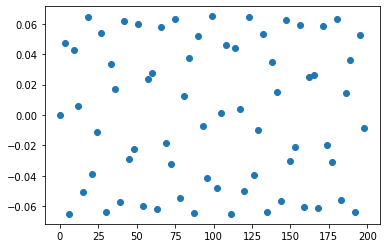

length of x is:  67
length of y is:  67


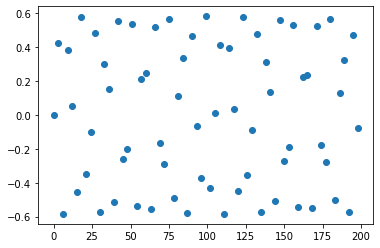

length of x is:  67
length of y is:  67


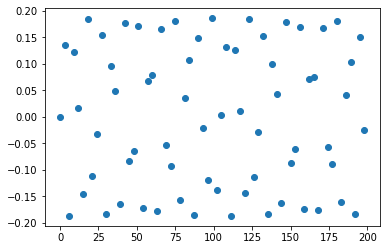

length of x is:  67
length of y is:  67


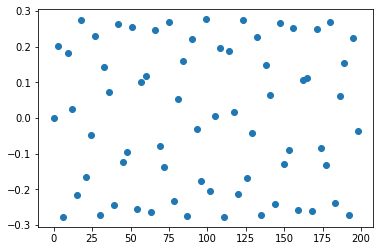

length of x is:  67
length of y is:  67


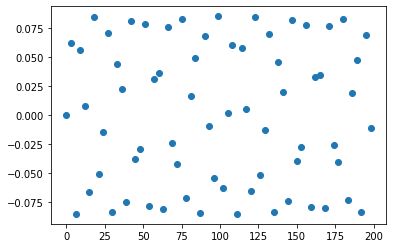

length of x is:  67
length of y is:  67


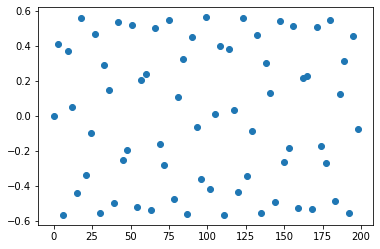

length of x is:  67
length of y is:  67


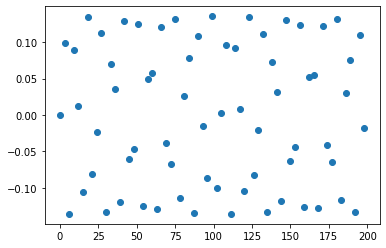

length of x is:  67
length of y is:  67


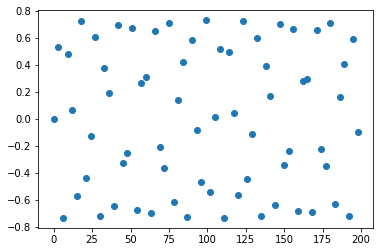

length of x is:  67
length of y is:  67


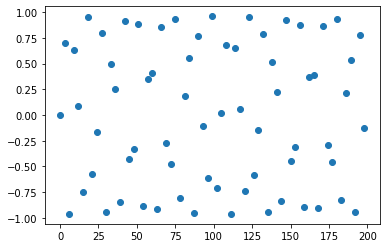

length of x is:  67
length of y is:  67


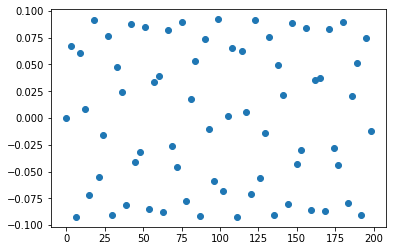

length of x is:  67
length of y is:  67


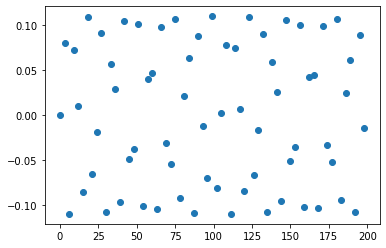

length of x is:  67
length of y is:  67


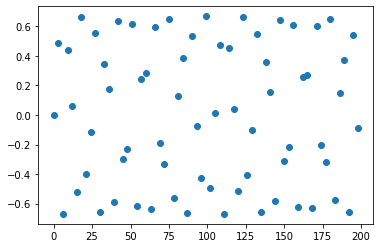

length of x is:  67
length of y is:  67


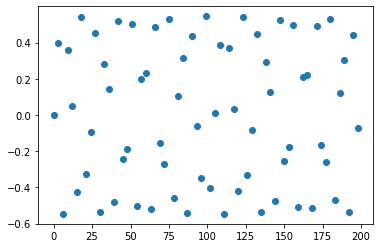

length of x is:  67
length of y is:  67


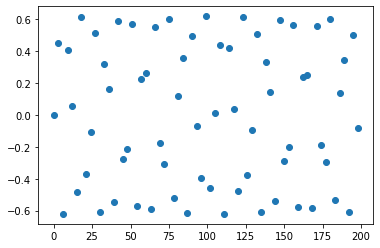

length of x is:  67
length of y is:  67


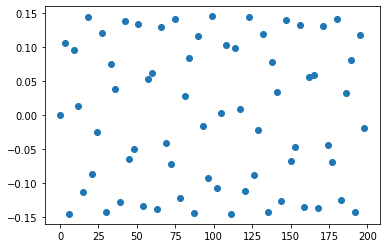

length of x is:  67
length of y is:  67


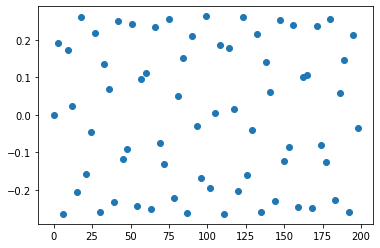

length of x is:  67
length of y is:  67


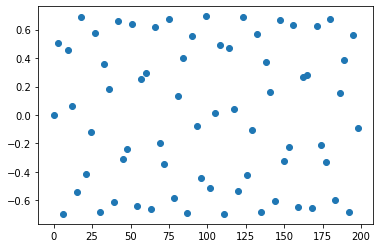

length of x is:  67
length of y is:  67


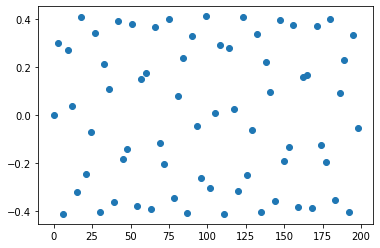

length of x is:  67
length of y is:  67


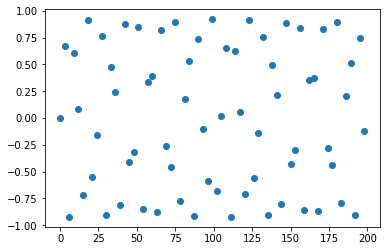

length of x is:  67
length of y is:  67


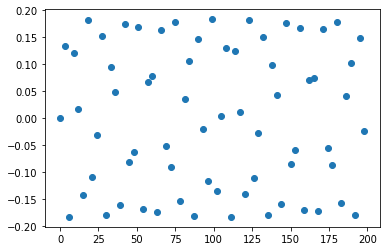

length of x is:  67
length of y is:  67


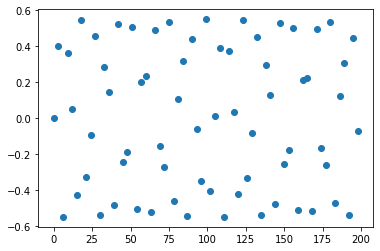

length of x is:  67
length of y is:  67


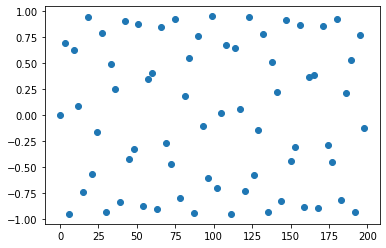

length of x is:  67
length of y is:  67


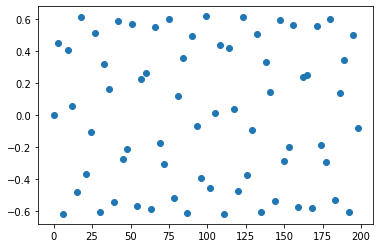

length of x is:  67
length of y is:  67


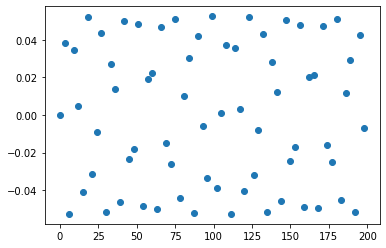

length of x is:  67
length of y is:  67


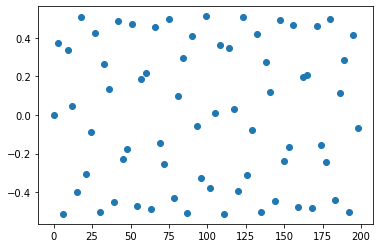

length of x is:  67
length of y is:  67


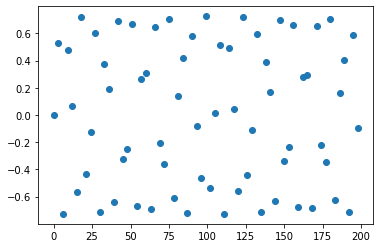

length of x is:  67
length of y is:  67


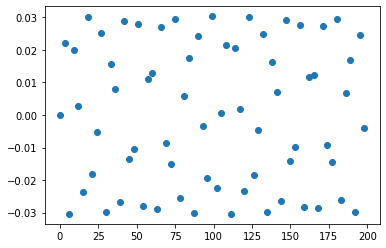

length of x is:  67
length of y is:  67


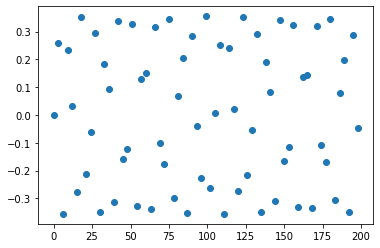

length of x is:  67
length of y is:  67


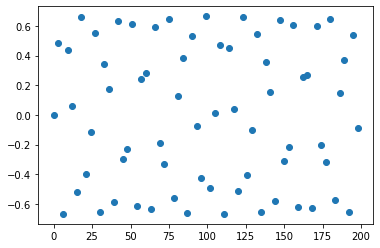

length of x is:  67
length of y is:  67


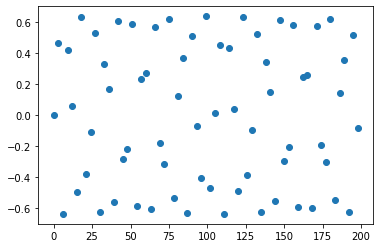

length of x is:  67
length of y is:  67


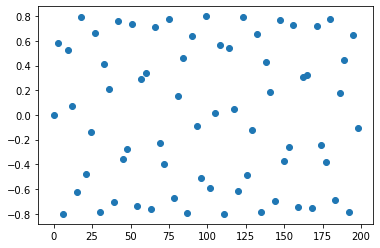

length of x is:  67
length of y is:  67


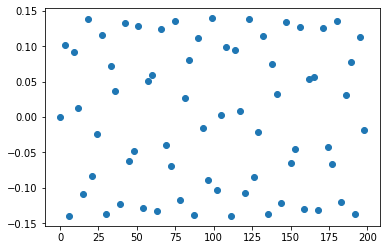

length of x is:  67
length of y is:  67


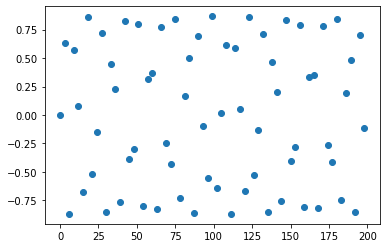

length of x is:  67
length of y is:  67


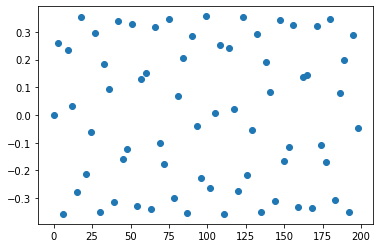

length of x is:  67
length of y is:  67


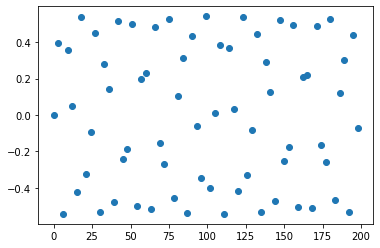

length of x is:  67
length of y is:  67


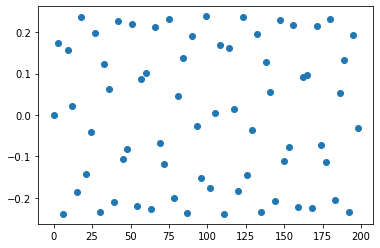

length of x is:  67
length of y is:  67


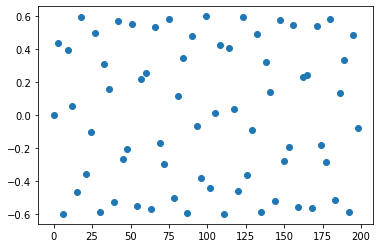

length of x is:  67
length of y is:  67


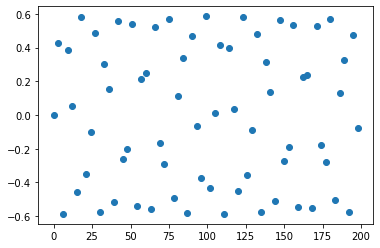

length of x is:  67
length of y is:  67


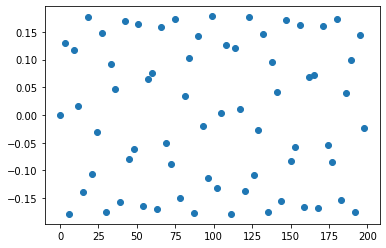

length of x is:  67
length of y is:  67


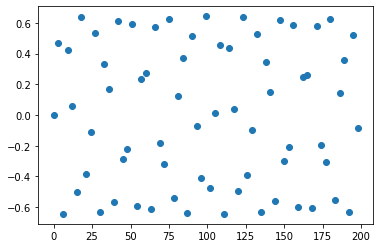

length of x is:  67
length of y is:  67


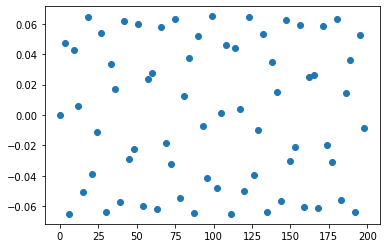

length of x is:  67
length of y is:  67


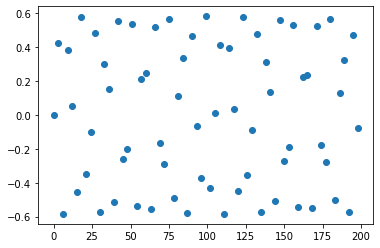

length of x is:  67
length of y is:  67


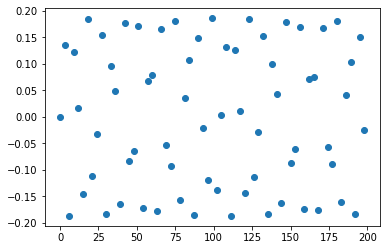

length of x is:  67
length of y is:  67


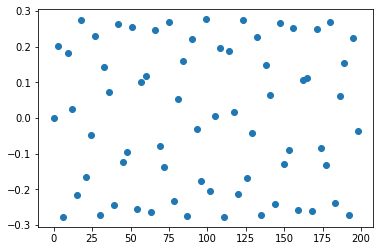

length of x is:  67
length of y is:  67


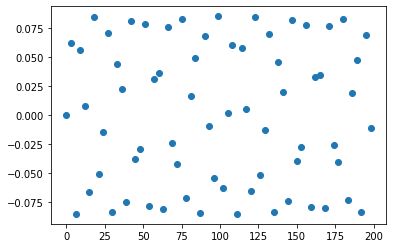

length of x is:  67
length of y is:  67


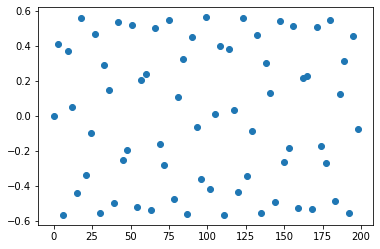

length of x is:  67
length of y is:  67


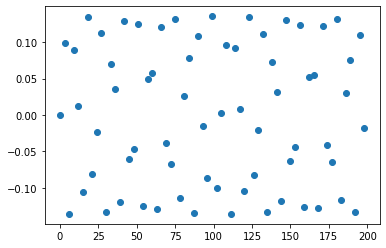

length of x is:  67
length of y is:  67


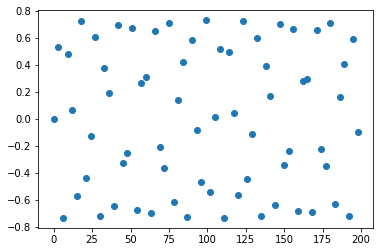

length of x is:  67
length of y is:  67


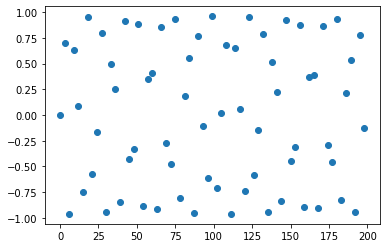

length of x is:  67
length of y is:  67


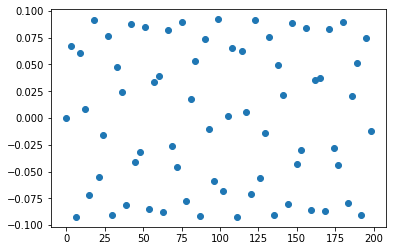

length of x is:  67
length of y is:  67


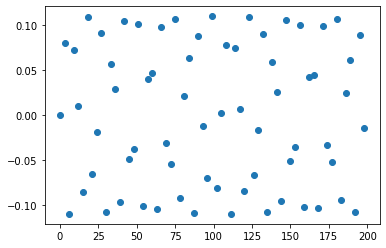

length of x is:  67
length of y is:  67


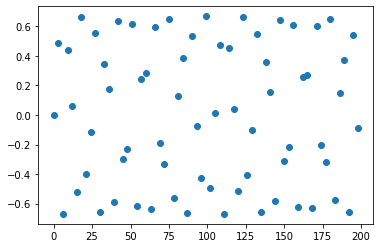

length of x is:  67
length of y is:  67


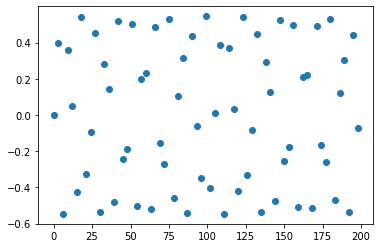

length of x is:  67
length of y is:  67


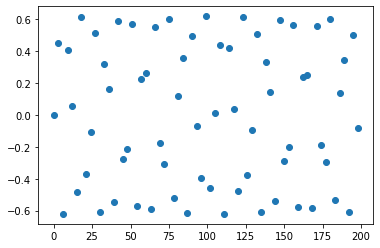

length of x is:  67
length of y is:  67


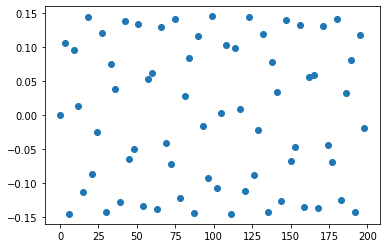

length of x is:  67
length of y is:  67


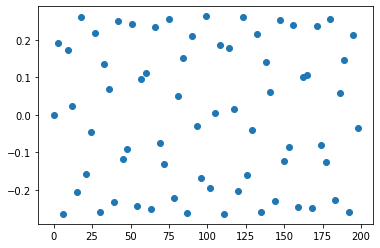

length of x is:  67
length of y is:  67


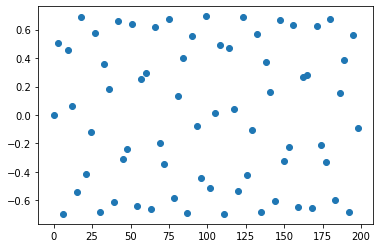

length of x is:  67
length of y is:  67


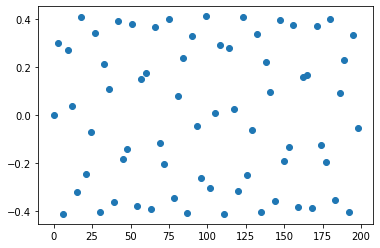

length of x is:  67
length of y is:  67


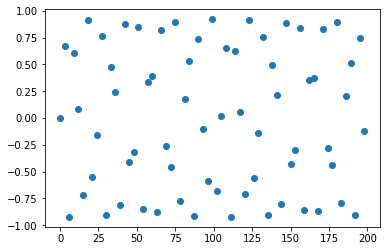

length of x is:  67
length of y is:  67


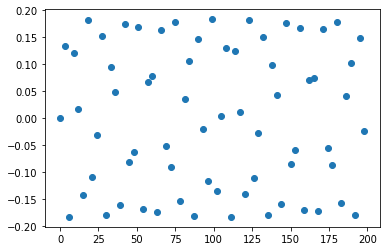

length of x is:  67
length of y is:  67


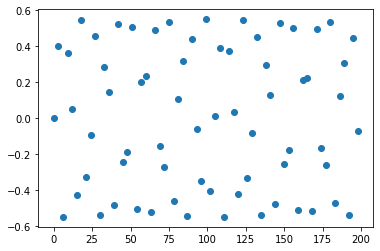

length of x is:  67
length of y is:  67


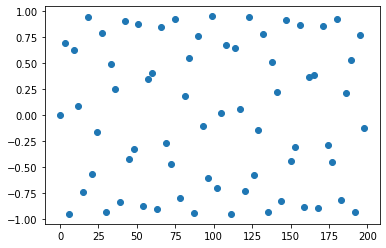

length of x is:  67
length of y is:  67


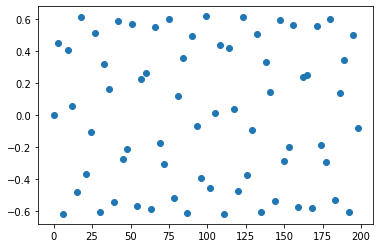

length of x is:  67
length of y is:  67


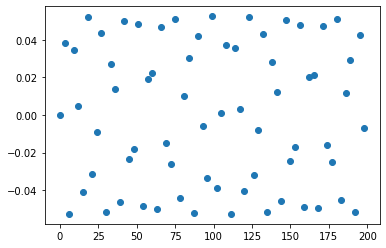

length of x is:  67
length of y is:  67


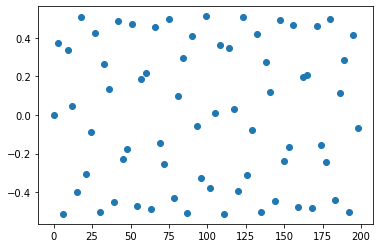

length of x is:  67
length of y is:  67


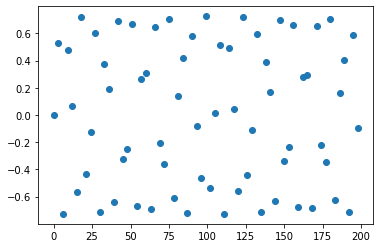

length of x is:  67
length of y is:  67


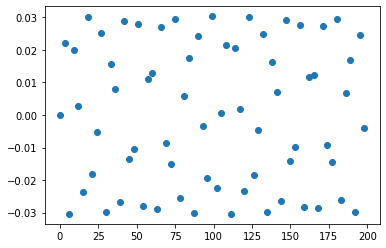

length of x is:  67
length of y is:  67


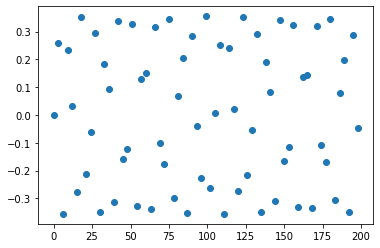

length of x is:  67
length of y is:  67


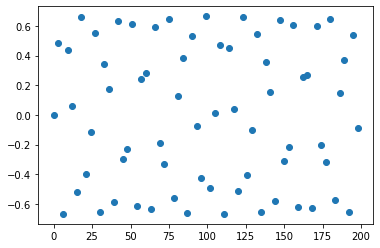

length of x is:  67
length of y is:  67


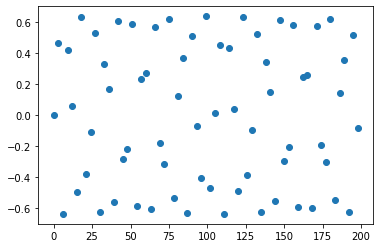

length of x is:  67
length of y is:  67


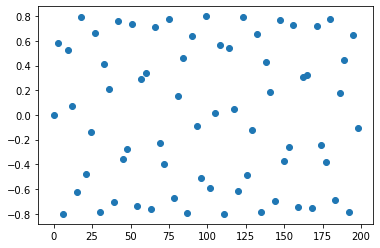

length of x is:  67
length of y is:  67


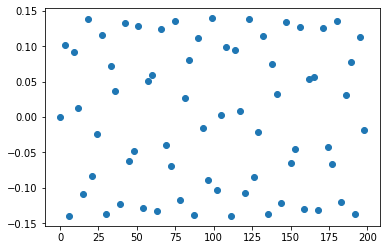

length of x is:  67
length of y is:  67


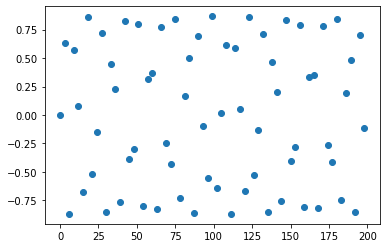

length of x is:  67
length of y is:  67


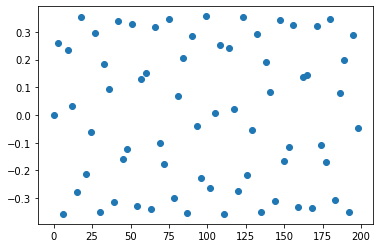

length of x is:  67
length of y is:  67


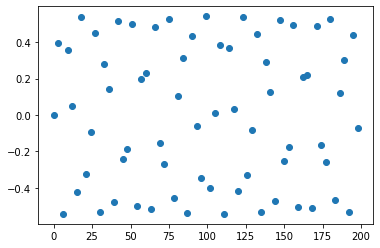

length of x is:  67
length of y is:  67


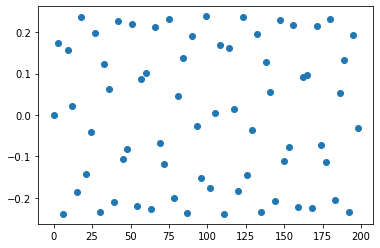

length of x is:  67
length of y is:  67


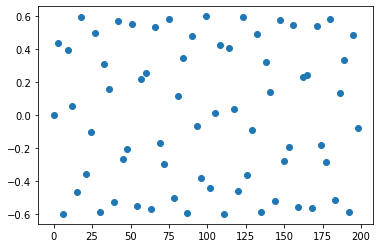

length of x is:  67
length of y is:  67


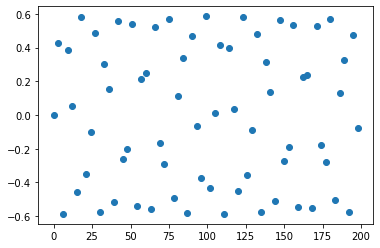

length of x is:  67
length of y is:  67


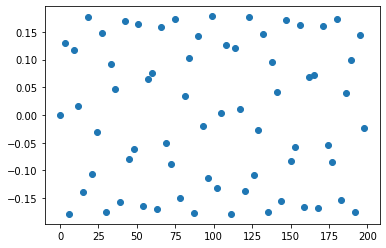

length of x is:  67
length of y is:  67


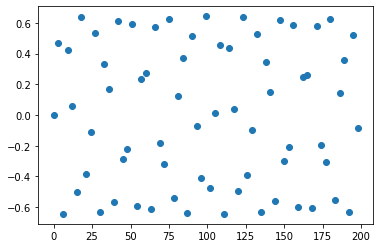

length of x is:  67
length of y is:  67


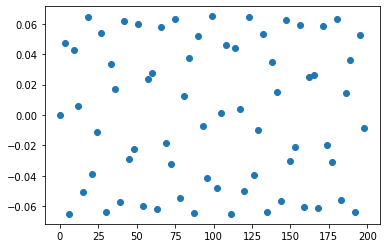

length of x is:  67
length of y is:  67


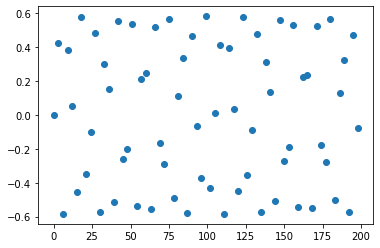

length of x is:  67
length of y is:  67


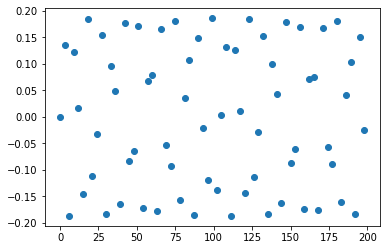

length of x is:  67
length of y is:  67


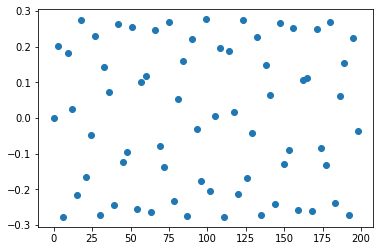

length of x is:  67
length of y is:  67


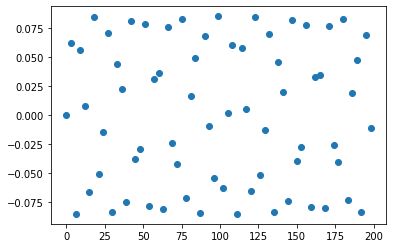

length of x is:  67
length of y is:  67


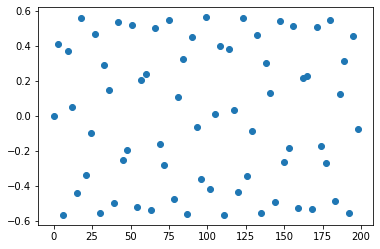

length of x is:  67
length of y is:  67


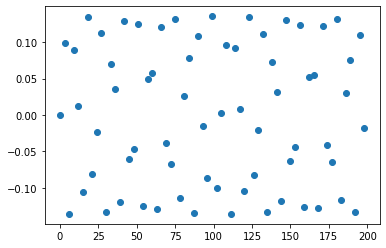

length of x is:  67
length of y is:  67


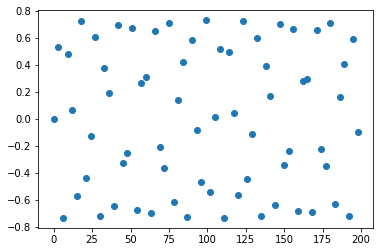

length of x is:  67
length of y is:  67


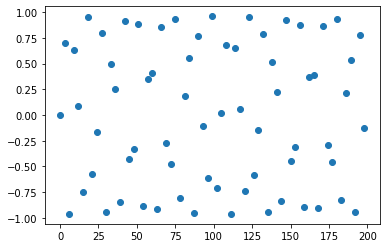

length of x is:  67
length of y is:  67


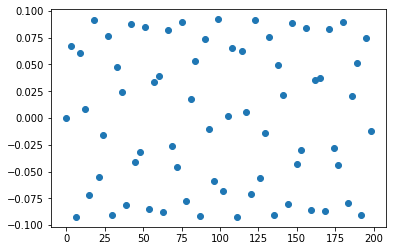

length of x is:  67
length of y is:  67


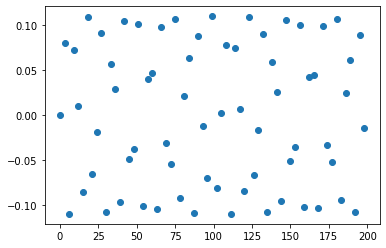

length of x is:  67
length of y is:  67


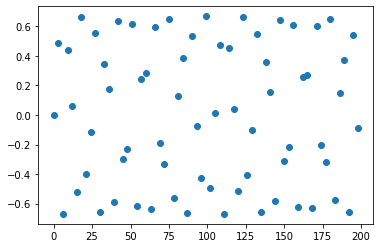

length of x is:  67
length of y is:  67


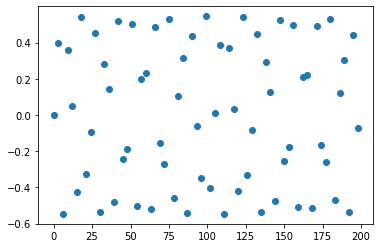

length of x is:  67
length of y is:  67


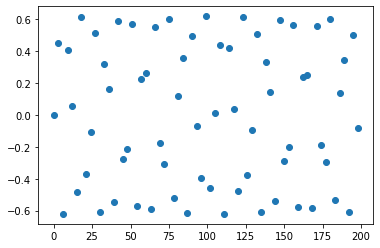

length of x is:  67
length of y is:  67


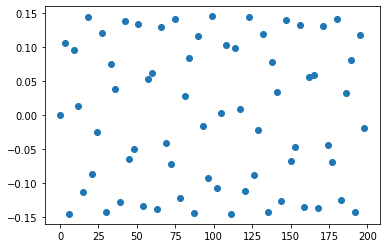

length of x is:  67
length of y is:  67


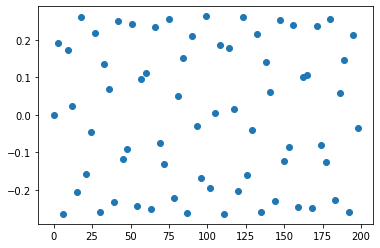

length of x is:  67
length of y is:  67


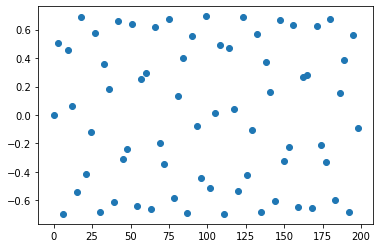

length of x is:  67
length of y is:  67


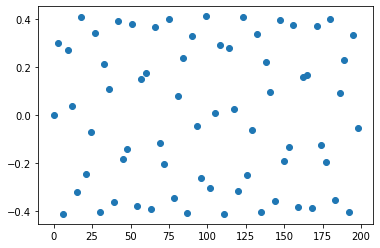

length of x is:  67
length of y is:  67


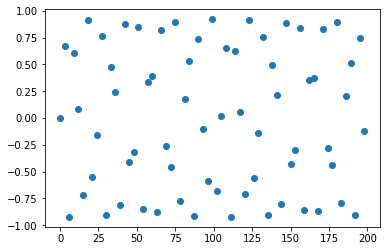

length of x is:  67
length of y is:  67


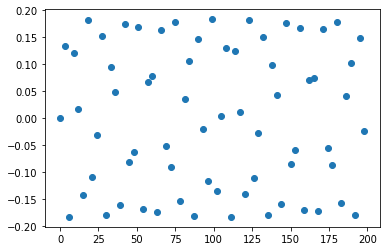

length of x is:  67
length of y is:  67


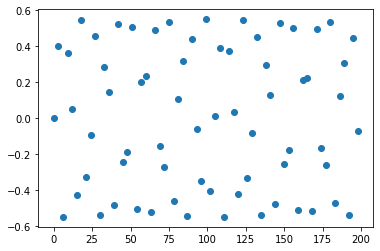

length of x is:  67
length of y is:  67


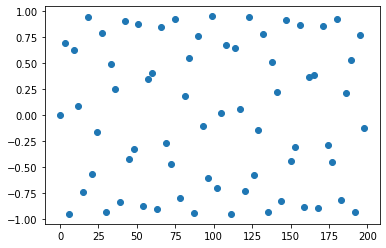

length of x is:  67
length of y is:  67


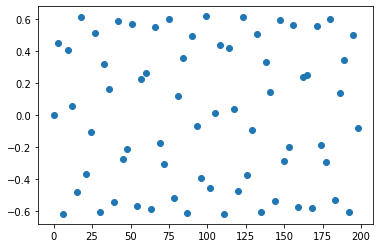

length of x is:  67
length of y is:  67


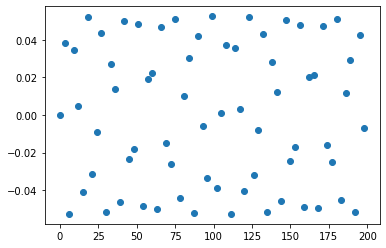

length of x is:  67
length of y is:  67


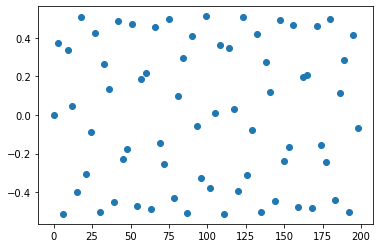

length of x is:  67
length of y is:  67


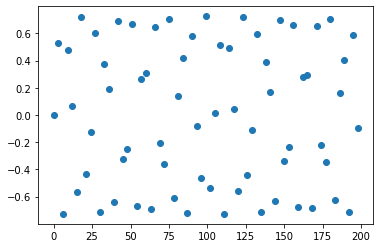

length of x is:  67
length of y is:  67


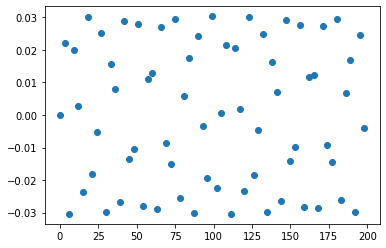

length of x is:  67
length of y is:  67


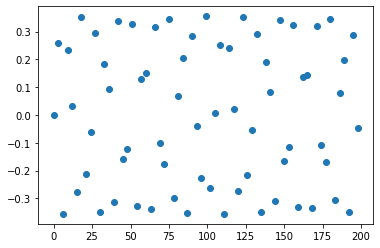

length of x is:  67
length of y is:  67


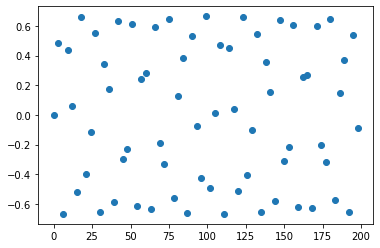

length of x is:  67
length of y is:  67


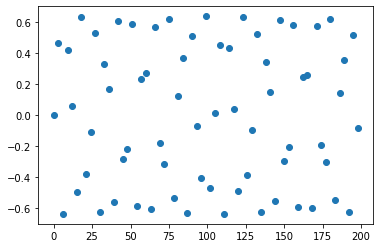

length of x is:  67
length of y is:  67


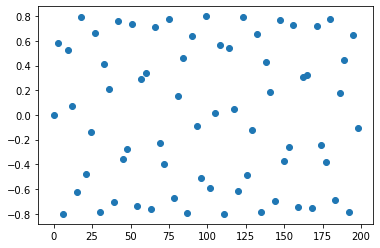

length of x is:  67
length of y is:  67


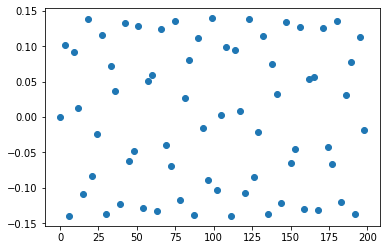

length of x is:  67
length of y is:  67


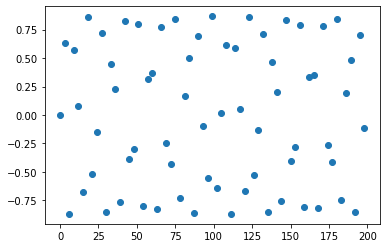

length of x is:  67
length of y is:  67


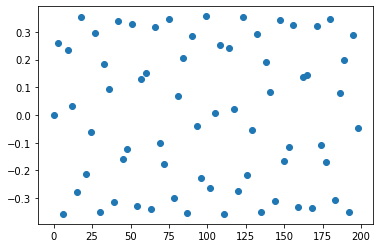

length of x is:  67
length of y is:  67


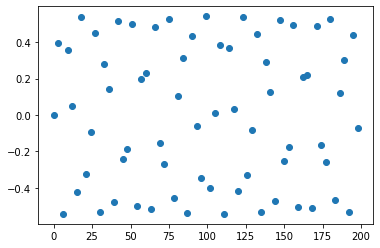

length of x is:  67
length of y is:  67


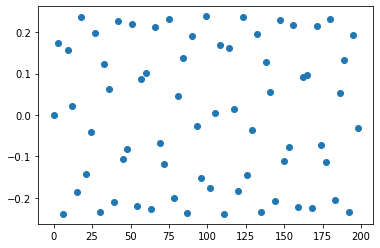

length of x is:  67
length of y is:  67


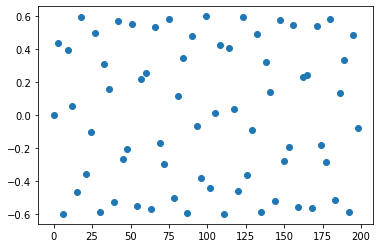

length of x is:  67
length of y is:  67


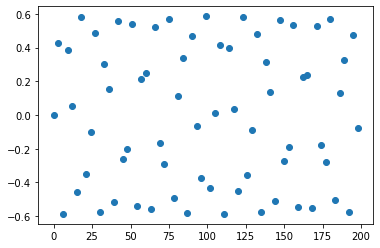

length of x is:  67
length of y is:  67


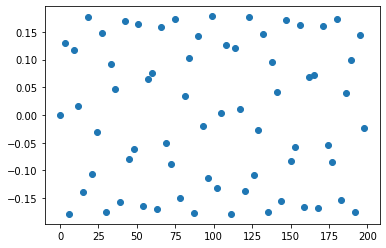

length of x is:  67
length of y is:  67


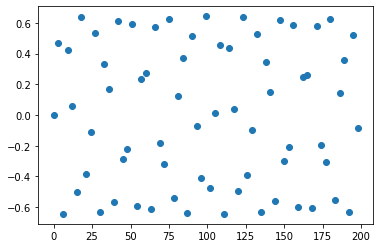

length of x is:  67
length of y is:  67


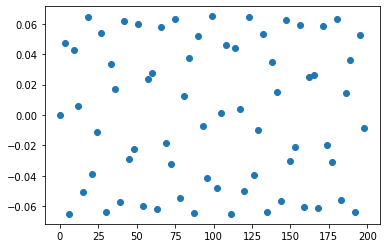

length of x is:  67
length of y is:  67


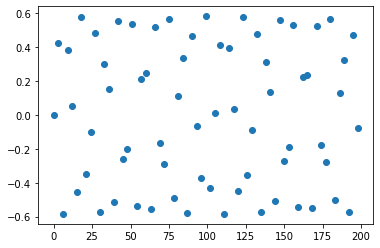

length of x is:  67
length of y is:  67


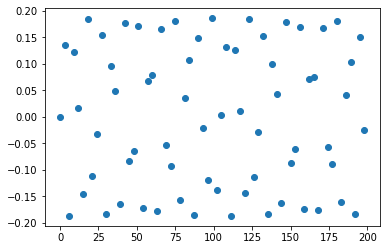

length of x is:  67
length of y is:  67


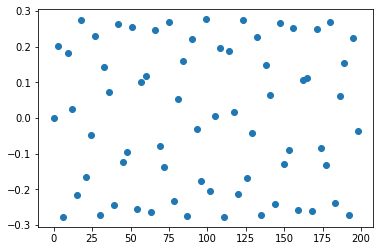

length of x is:  67
length of y is:  67


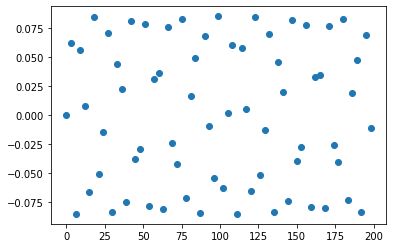

length of x is:  67
length of y is:  67


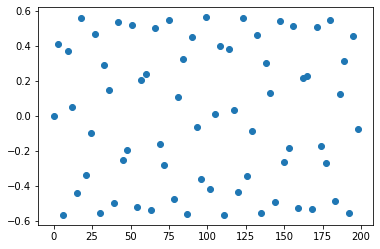

length of x is:  67
length of y is:  67


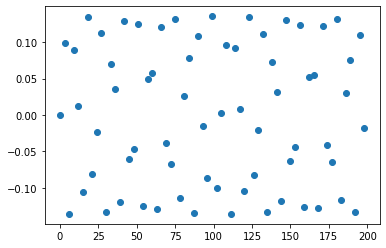

length of x is:  67
length of y is:  67


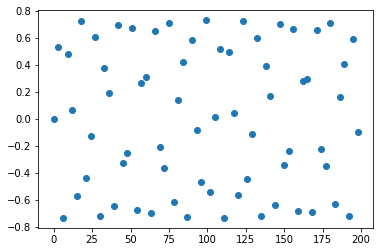

length of x is:  67
length of y is:  67


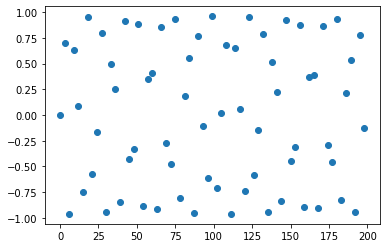

length of x is:  67
length of y is:  67


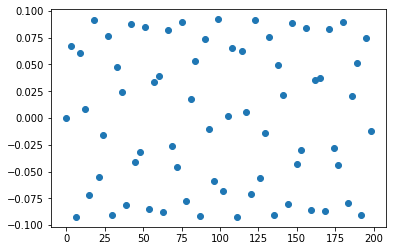

length of x is:  67
length of y is:  67


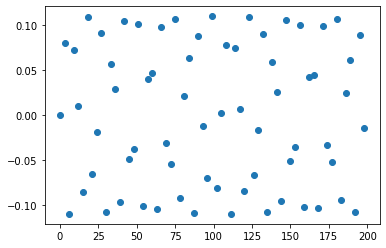

length of x is:  67
length of y is:  67


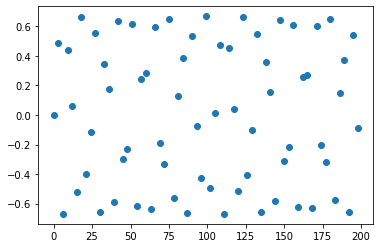

length of x is:  67
length of y is:  67


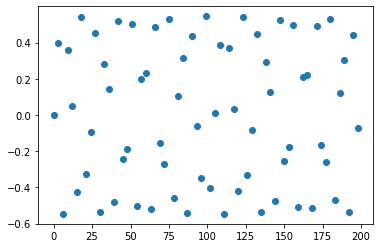

length of x is:  67
length of y is:  67


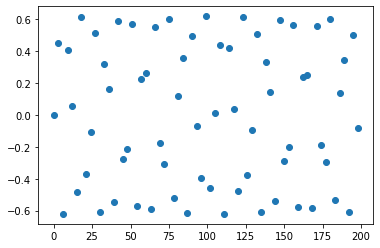

length of x is:  67
length of y is:  67


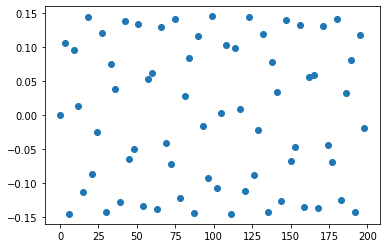

length of x is:  67
length of y is:  67


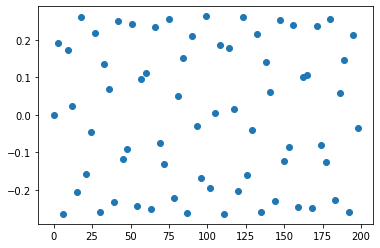

length of x is:  67
length of y is:  67


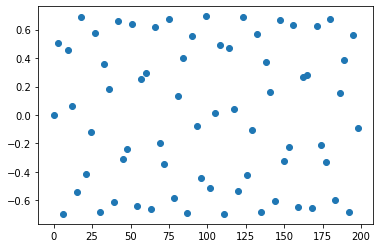

length of x is:  67
length of y is:  67


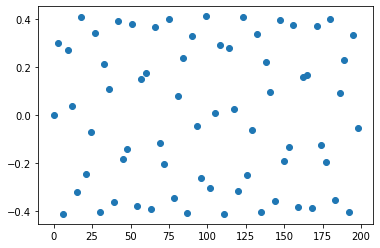

length of x is:  67
length of y is:  67


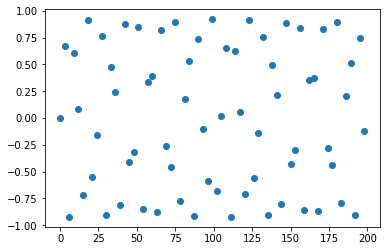

length of x is:  67
length of y is:  67


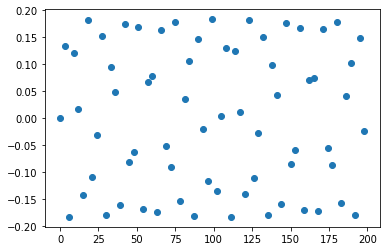

length of x is:  67
length of y is:  67


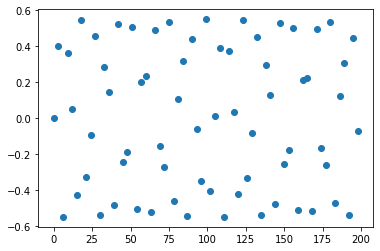

length of x is:  67
length of y is:  67


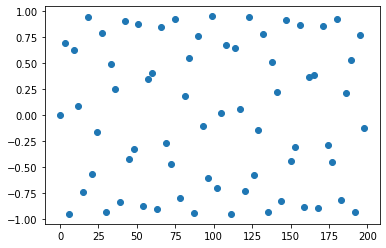

length of x is:  67
length of y is:  67


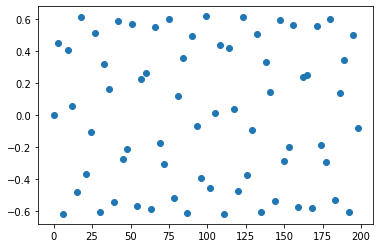

length of x is:  67
length of y is:  67


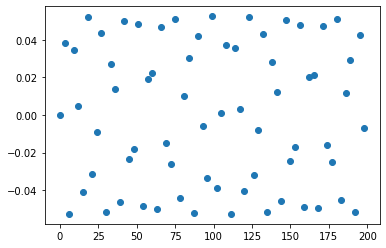

length of x is:  67
length of y is:  67


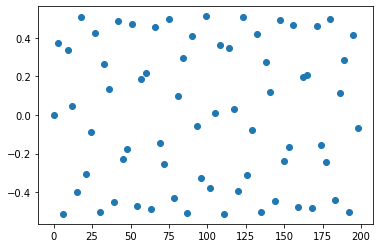

length of x is:  67
length of y is:  67


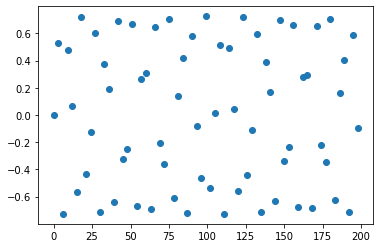

length of x is:  67
length of y is:  67


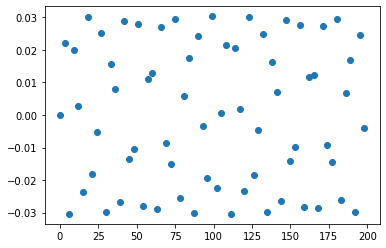

length of x is:  67
length of y is:  67


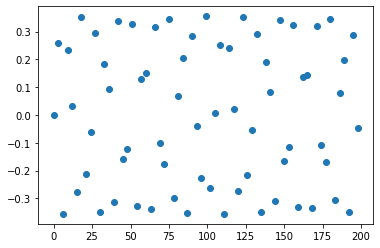

length of x is:  67
length of y is:  67


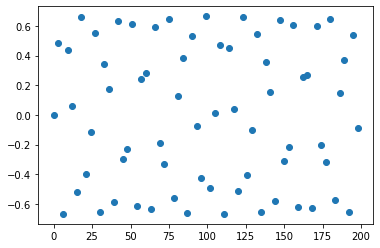

length of x is:  67
length of y is:  67


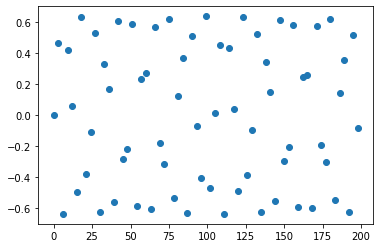

length of x is:  67
length of y is:  67


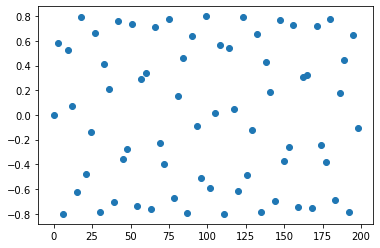

length of x is:  67
length of y is:  67


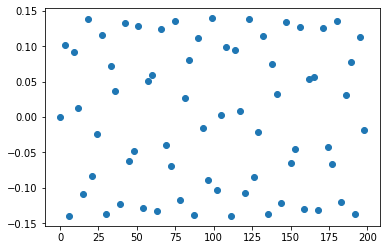

length of x is:  67
length of y is:  67


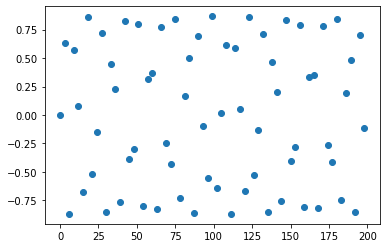

length of x is:  67
length of y is:  67


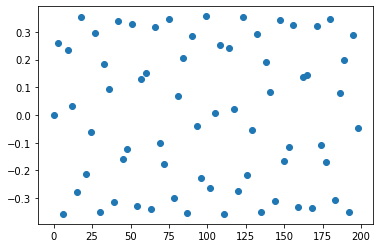

length of x is:  67
length of y is:  67


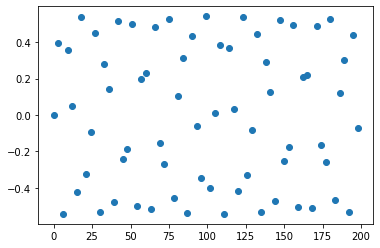

length of x is:  67
length of y is:  67


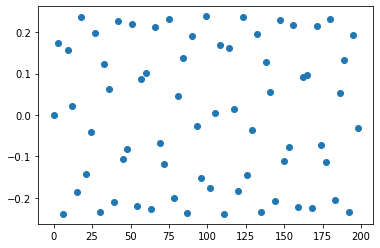

length of x is:  67
length of y is:  67


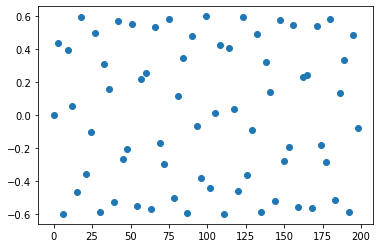

length of x is:  67
length of y is:  67


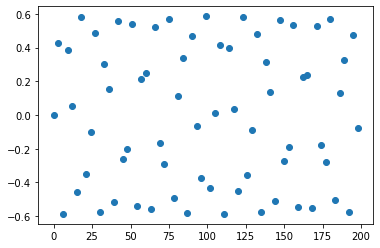

length of x is:  67
length of y is:  67


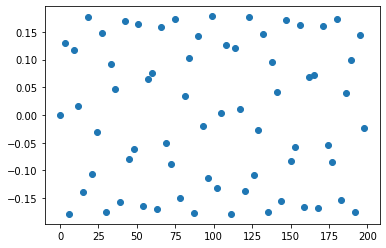

length of x is:  67
length of y is:  67


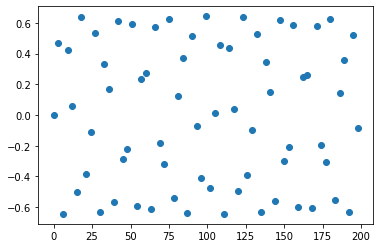

length of x is:  67
length of y is:  67


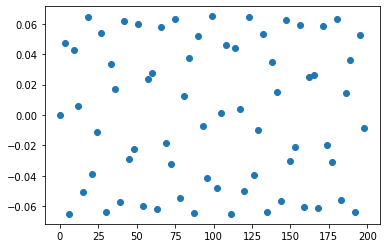

length of x is:  67
length of y is:  67


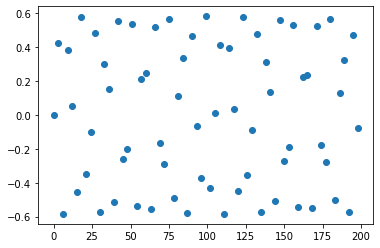

length of x is:  67
length of y is:  67


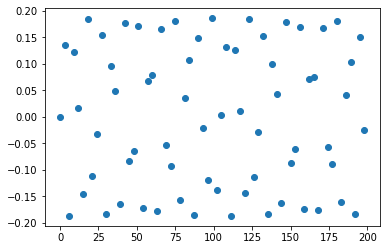

length of x is:  67
length of y is:  67


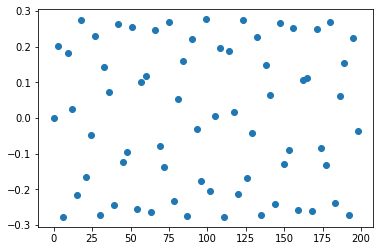

length of x is:  67
length of y is:  67


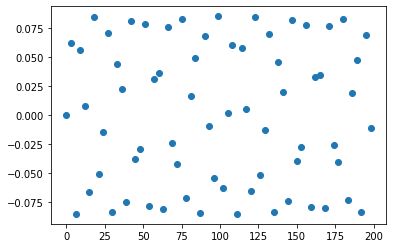

length of x is:  67
length of y is:  67


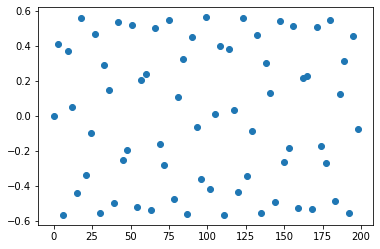

length of x is:  67
length of y is:  67


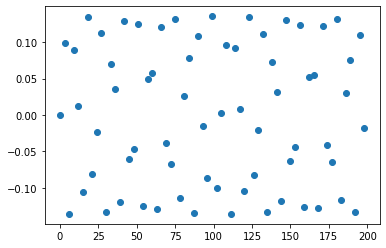

length of x is:  67
length of y is:  67


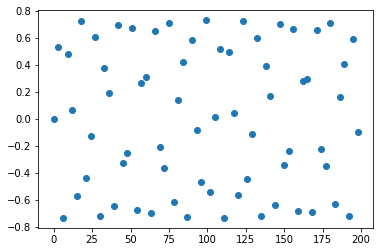

length of x is:  67
length of y is:  67


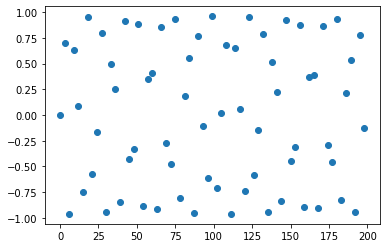

length of x is:  67
length of y is:  67


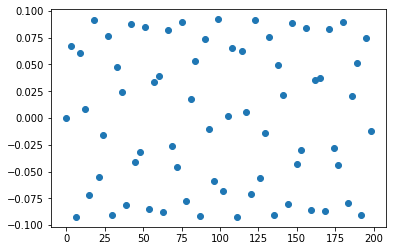

length of x is:  67
length of y is:  67


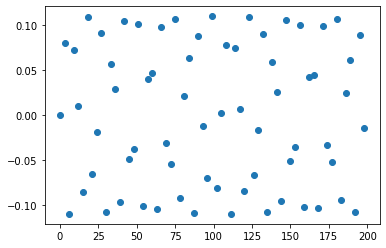

length of x is:  67
length of y is:  67


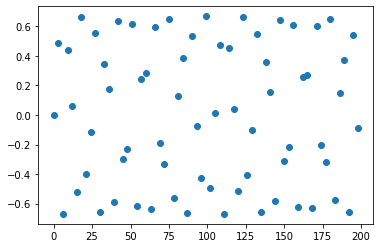

length of x is:  67
length of y is:  67


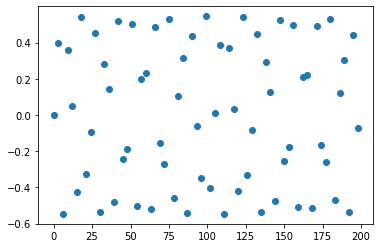

length of x is:  67
length of y is:  67


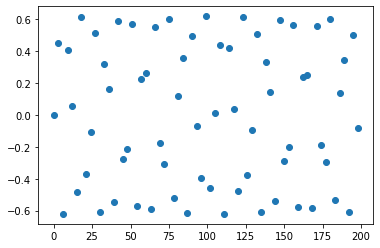

length of x is:  67
length of y is:  67


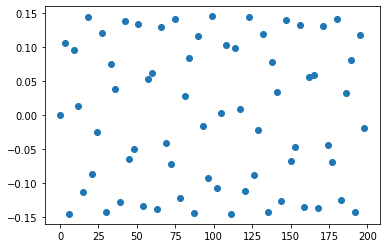

length of x is:  67
length of y is:  67


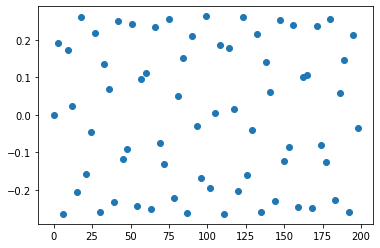

length of x is:  67
length of y is:  67


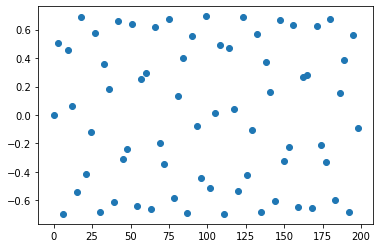

length of x is:  67
length of y is:  67


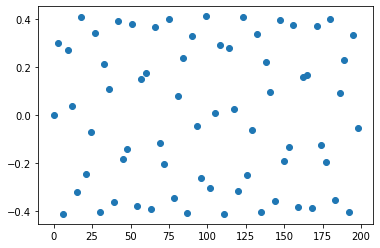

length of x is:  67
length of y is:  67


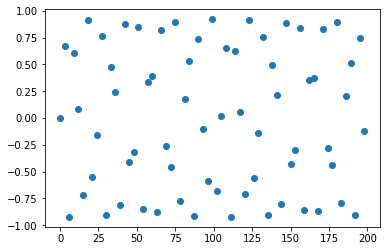

length of x is:  67
length of y is:  67


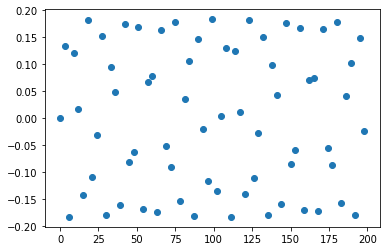

length of x is:  67
length of y is:  67


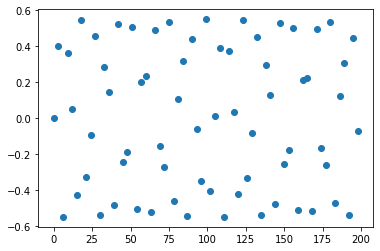

length of x is:  67
length of y is:  67


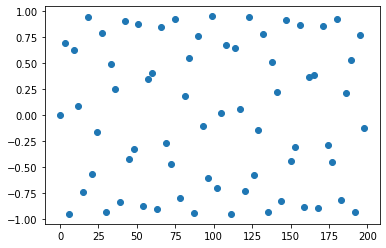

length of x is:  67
length of y is:  67


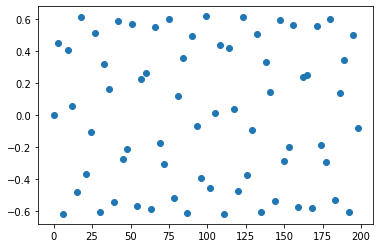

length of x is:  67
length of y is:  67


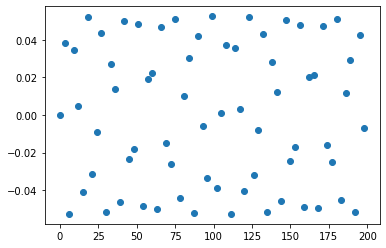

length of x is:  67
length of y is:  67


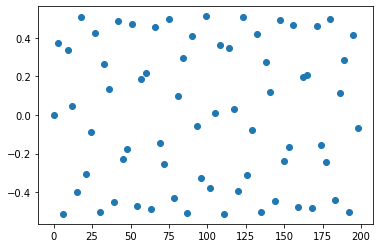

length of x is:  67
length of y is:  67


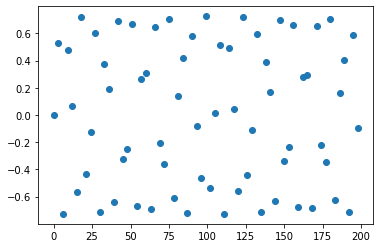

length of x is:  67
length of y is:  67


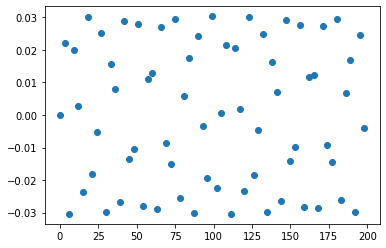

length of x is:  67
length of y is:  67


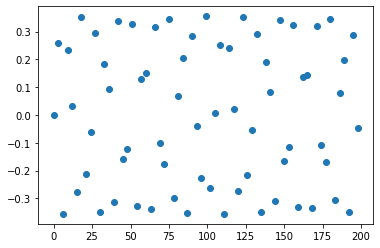

length of x is:  67
length of y is:  67


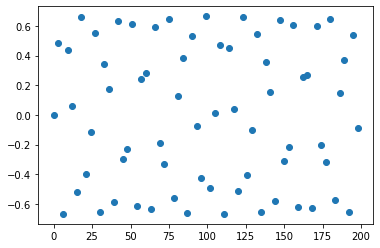

length of x is:  67
length of y is:  67


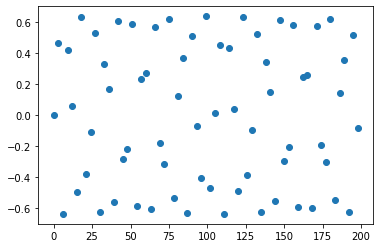

length of x is:  67
length of y is:  67


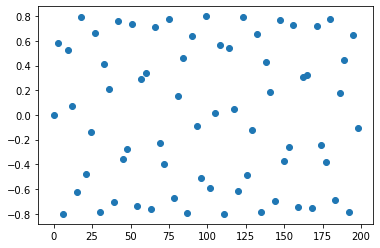

length of x is:  67
length of y is:  67


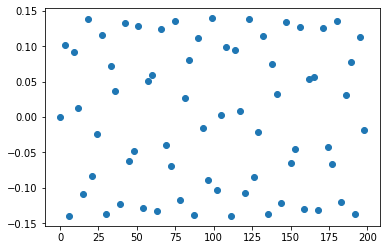

length of x is:  67
length of y is:  67


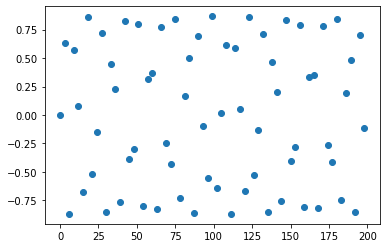

length of x is:  67
length of y is:  67


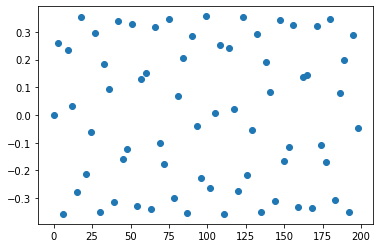

length of x is:  67
length of y is:  67


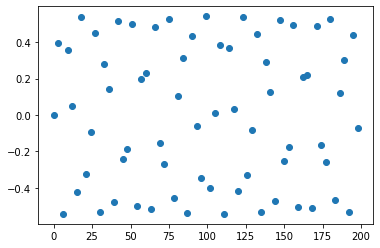

length of x is:  67
length of y is:  67


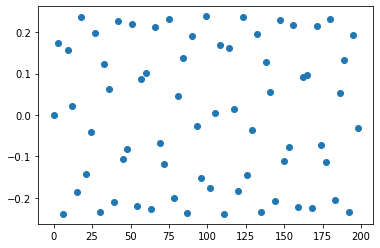

length of x is:  67
length of y is:  67


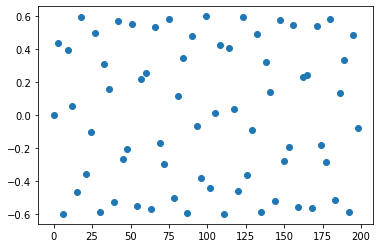

length of x is:  67
length of y is:  67


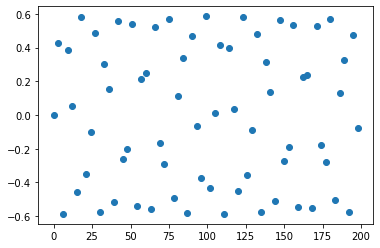

length of x is:  67
length of y is:  67


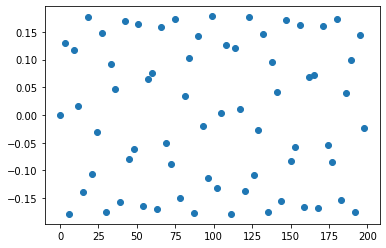

length of x is:  67
length of y is:  67


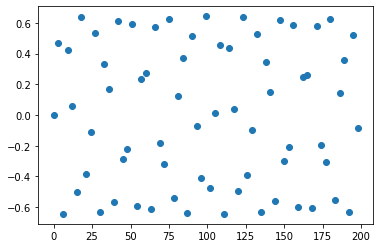

length of x is:  67
length of y is:  67


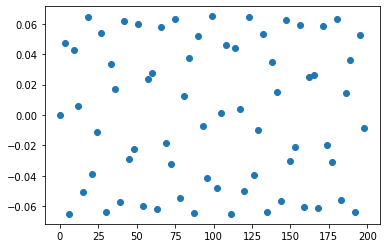

length of x is:  67
length of y is:  67


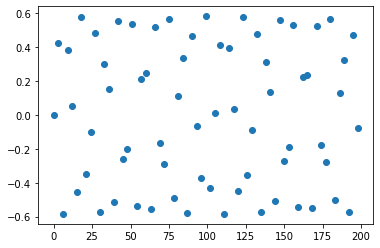

length of x is:  67
length of y is:  67


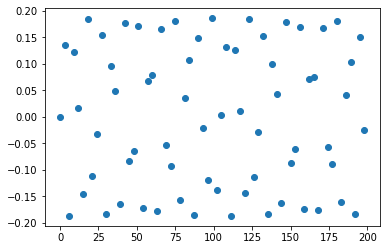

length of x is:  67
length of y is:  67


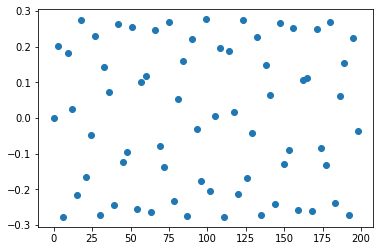

length of x is:  67
length of y is:  67


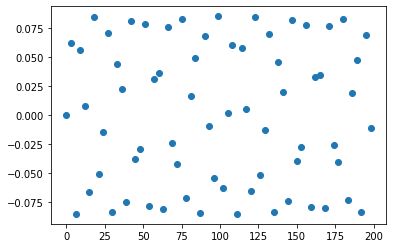

length of x is:  67
length of y is:  67


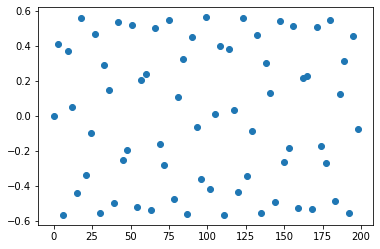

length of x is:  67
length of y is:  67


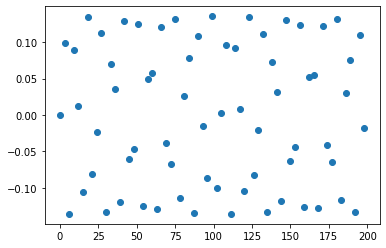

length of x is:  67
length of y is:  67


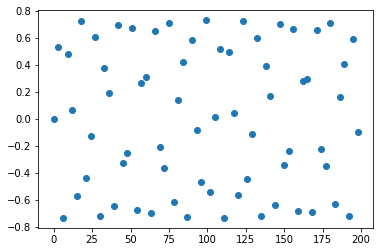

length of x is:  67
length of y is:  67


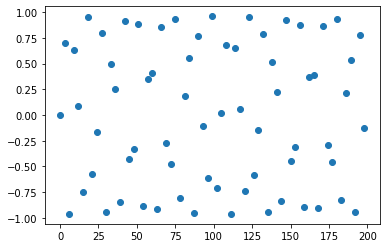

length of x is:  67
length of y is:  67


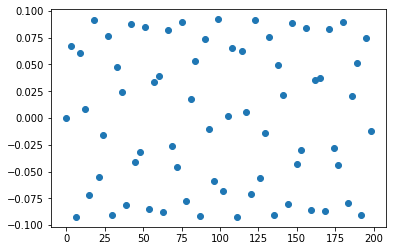

length of x is:  67
length of y is:  67


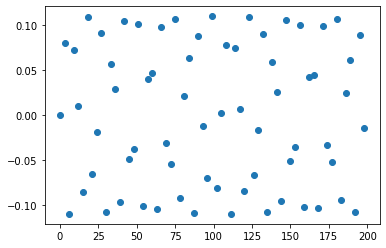

length of x is:  67
length of y is:  67


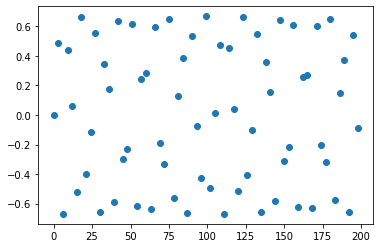

length of x is:  67
length of y is:  67


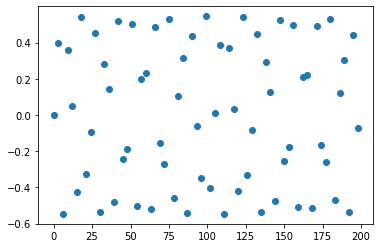

length of x is:  67
length of y is:  67


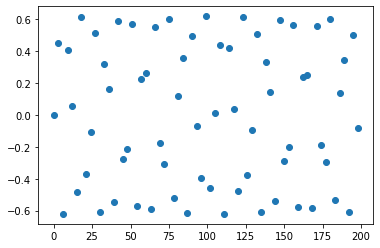

length of x is:  67
length of y is:  67


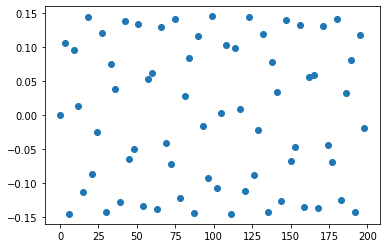

length of x is:  67
length of y is:  67


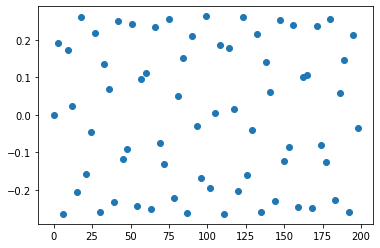

length of x is:  67
length of y is:  67


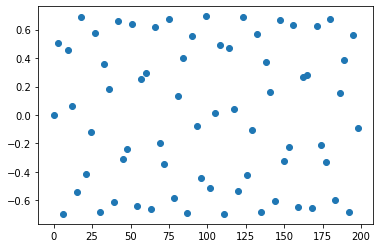

length of x is:  67
length of y is:  67


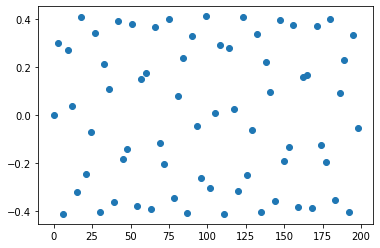

length of x is:  67
length of y is:  67


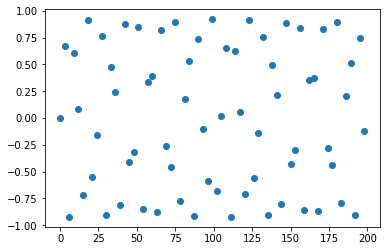

length of x is:  67
length of y is:  67


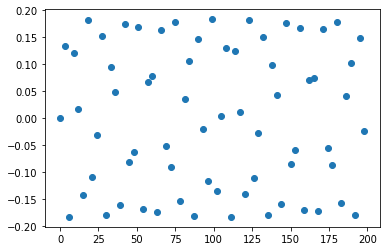

length of x is:  67
length of y is:  67


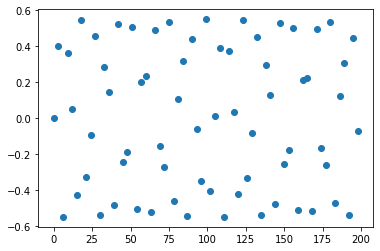

length of x is:  67
length of y is:  67


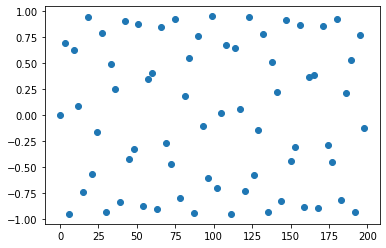

length of x is:  67
length of y is:  67


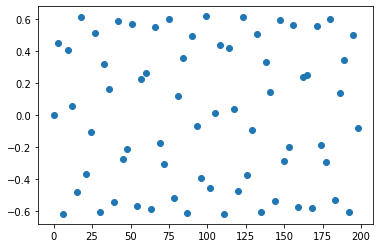

length of x is:  67
length of y is:  67


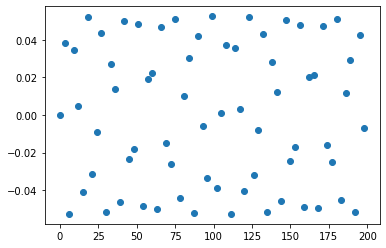

length of x is:  67
length of y is:  67


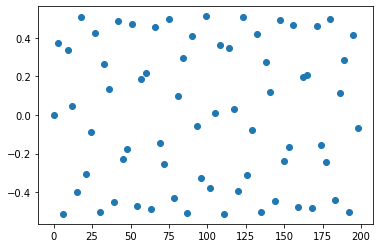

length of x is:  67
length of y is:  67


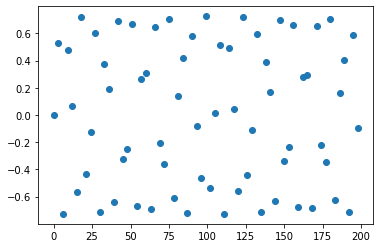

length of x is:  67
length of y is:  67


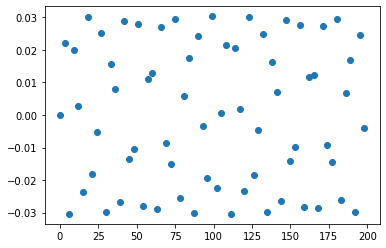

length of x is:  67
length of y is:  67


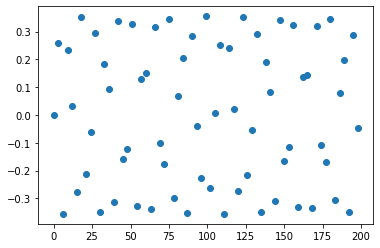

length of x is:  67
length of y is:  67


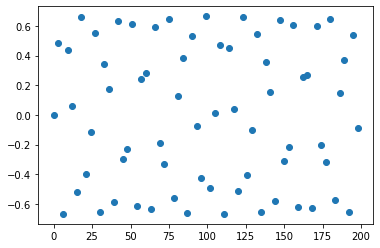

length of x is:  67
length of y is:  67


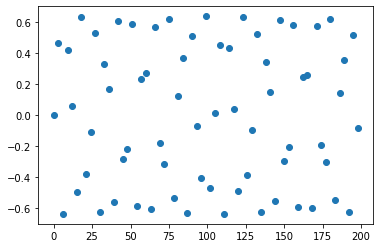

length of x is:  67
length of y is:  67


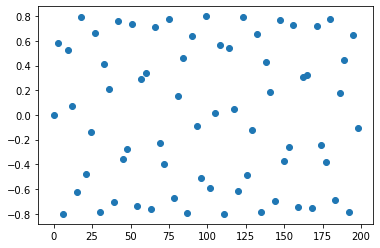

length of x is:  67
length of y is:  67


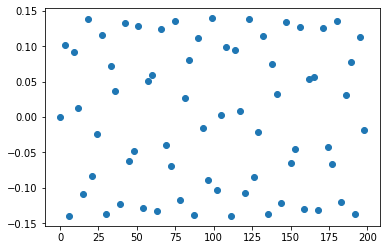

length of x is:  67
length of y is:  67


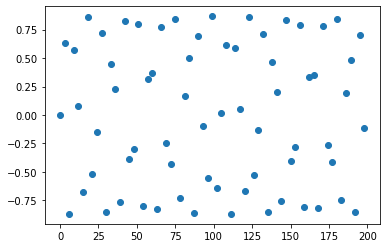

length of x is:  67
length of y is:  67


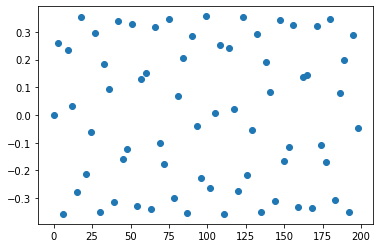

length of x is:  67
length of y is:  67


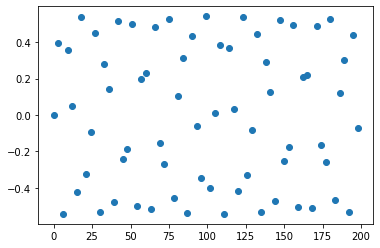

length of x is:  67
length of y is:  67


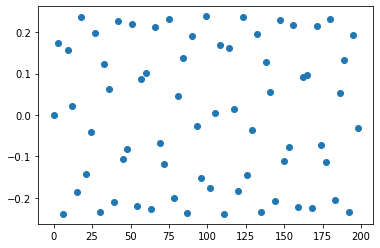

length of x is:  67
length of y is:  67


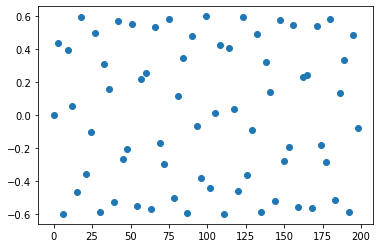

length of x is:  67
length of y is:  67


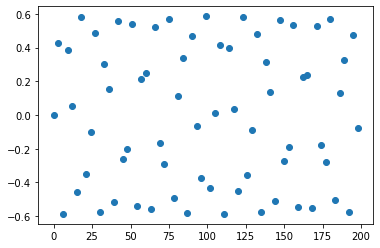

length of x is:  67
length of y is:  67


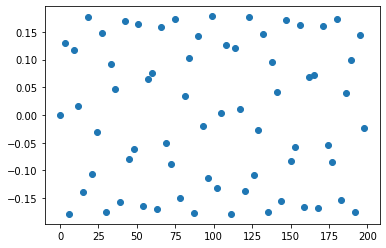

length of x is:  67
length of y is:  67


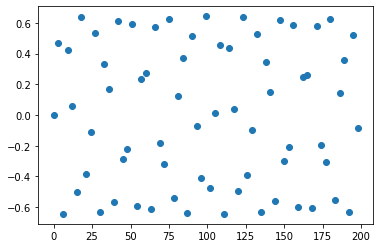

length of x is:  67
length of y is:  67


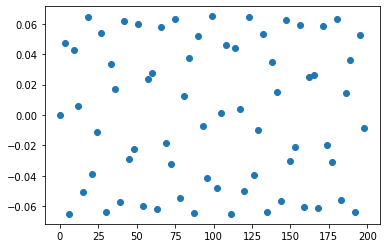

length of x is:  67
length of y is:  67


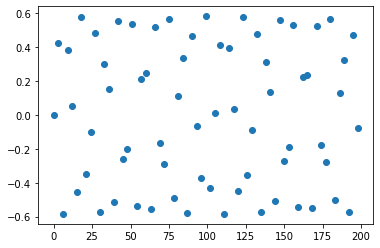

length of x is:  67
length of y is:  67


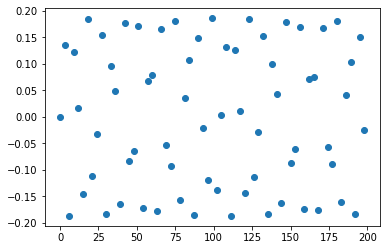

length of x is:  67
length of y is:  67


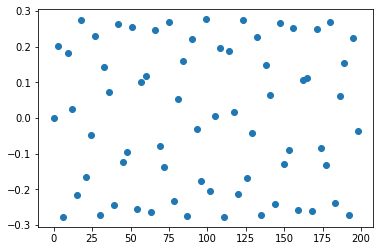

length of x is:  67
length of y is:  67


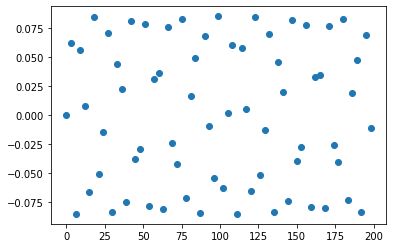

length of x is:  67
length of y is:  67


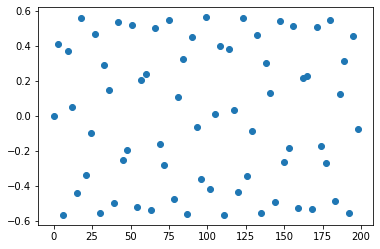

length of x is:  67
length of y is:  67


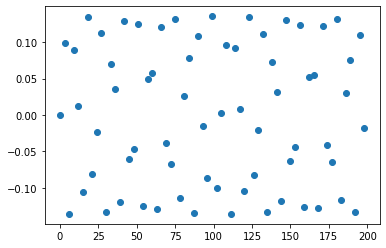

length of x is:  67
length of y is:  67


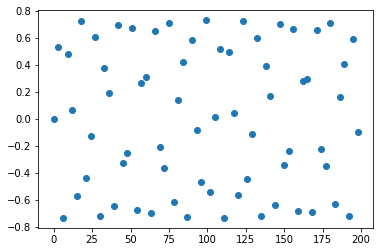

length of x is:  67
length of y is:  67


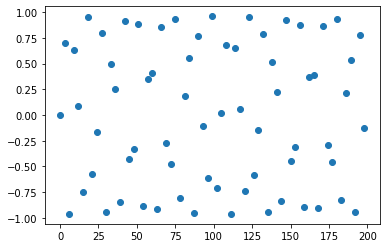

length of x is:  67
length of y is:  67


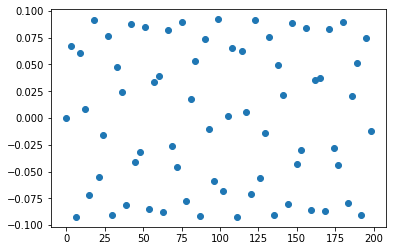

length of x is:  67
length of y is:  67


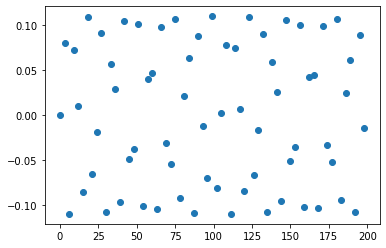

length of x is:  67
length of y is:  67


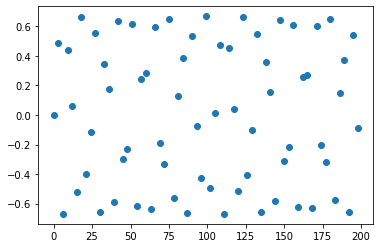

length of x is:  67
length of y is:  67


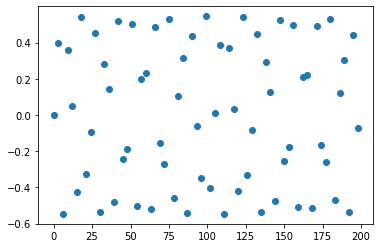

length of x is:  67
length of y is:  67


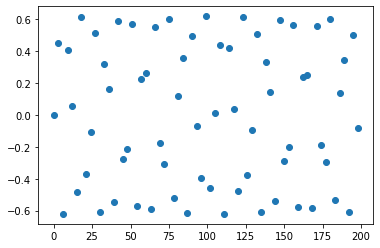

length of x is:  67
length of y is:  67


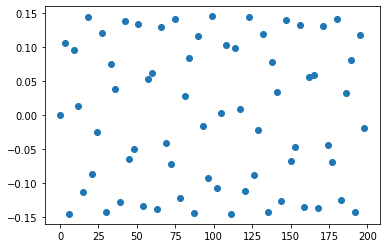

length of x is:  67
length of y is:  67


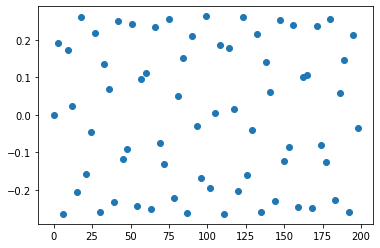

length of x is:  67
length of y is:  67


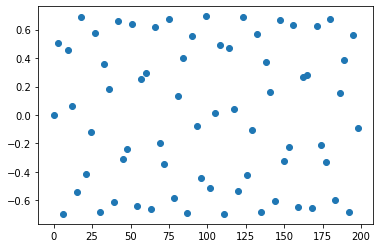

length of x is:  67
length of y is:  67


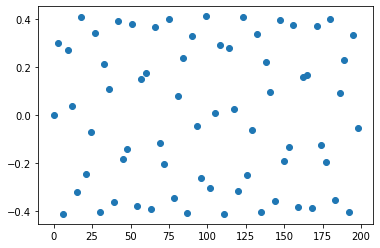

length of x is:  67
length of y is:  67


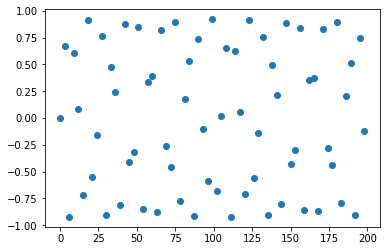

length of x is:  67
length of y is:  67


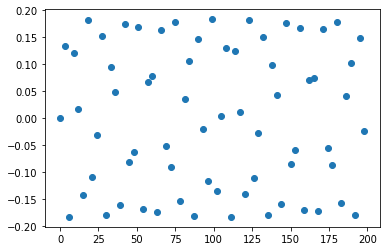

length of x is:  67
length of y is:  67


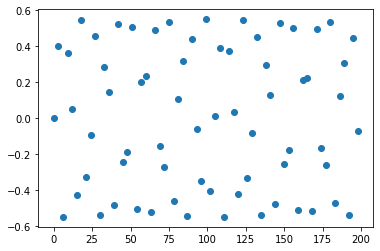

length of x is:  67
length of y is:  67


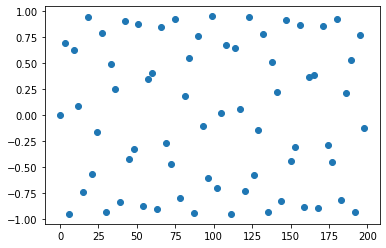

length of x is:  67
length of y is:  67


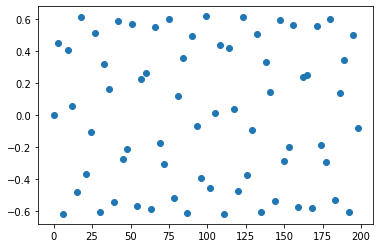

length of x is:  67
length of y is:  67


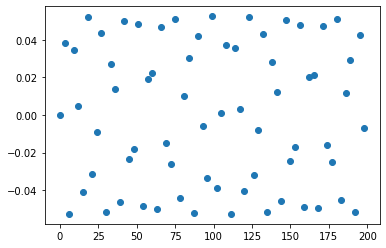

length of x is:  67
length of y is:  67


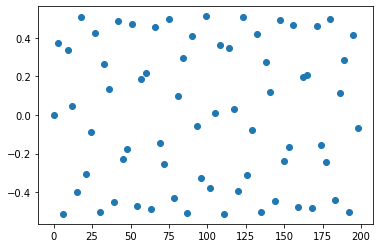

length of x is:  67
length of y is:  67


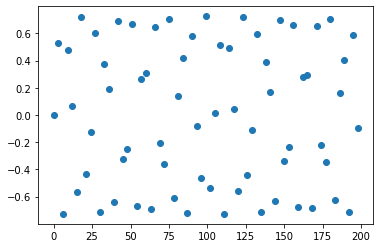

length of x is:  67
length of y is:  67


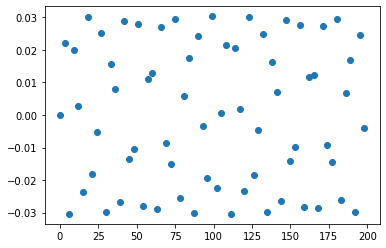

length of x is:  67
length of y is:  67


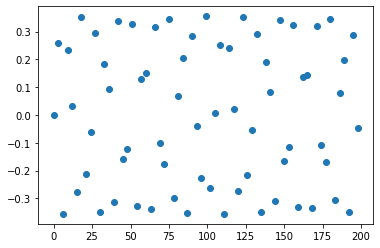

length of x is:  67
length of y is:  67


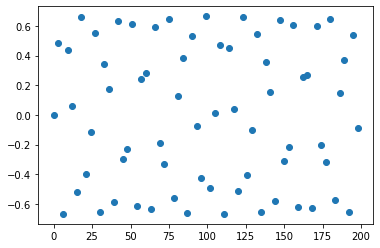

length of x is:  67
length of y is:  67


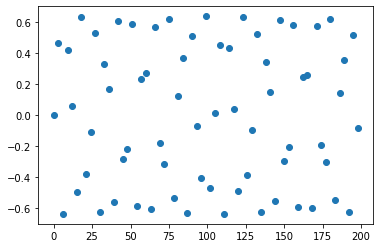

length of x is:  67
length of y is:  67


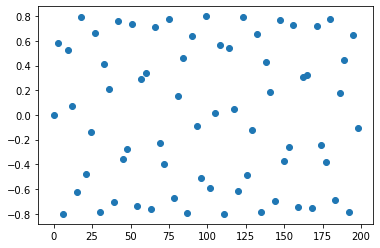

length of x is:  67
length of y is:  67


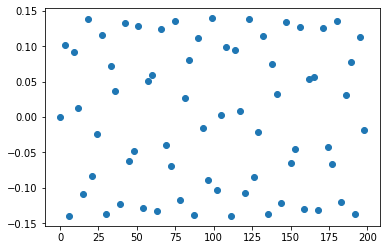

length of x is:  67
length of y is:  67


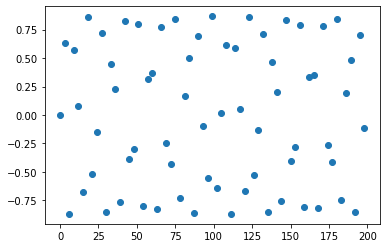

length of x is:  67
length of y is:  67


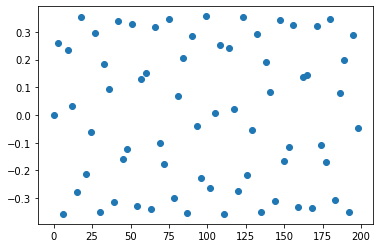

length of x is:  67
length of y is:  67


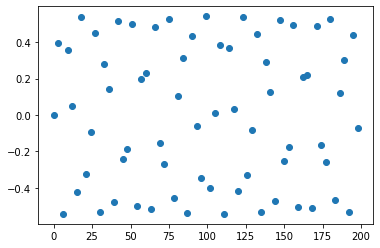

length of x is:  67
length of y is:  67


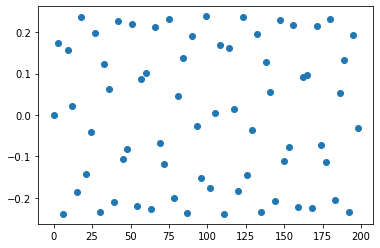

length of x is:  67
length of y is:  67


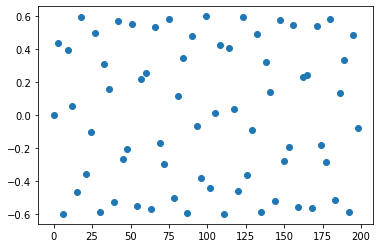

length of x is:  67
length of y is:  67


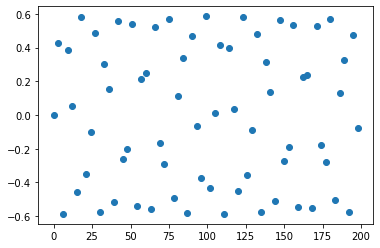

length of x is:  67
length of y is:  67


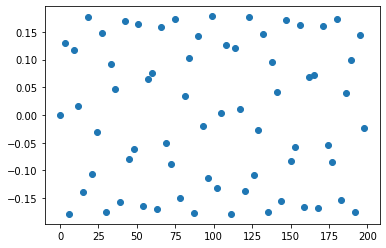

length of x is:  67
length of y is:  67


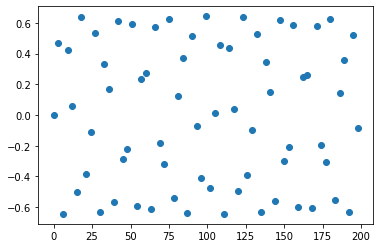

length of x is:  67
length of y is:  67


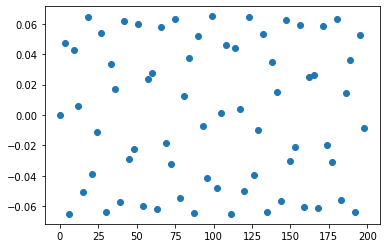

length of x is:  67
length of y is:  67


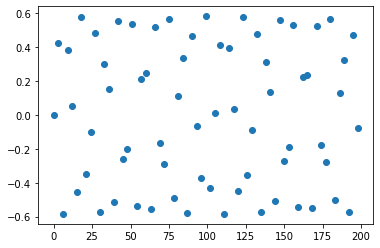

length of x is:  67
length of y is:  67


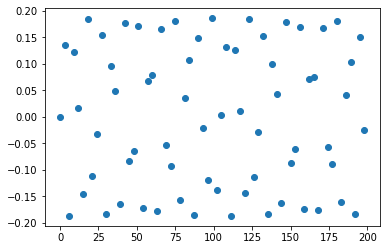

length of x is:  67
length of y is:  67


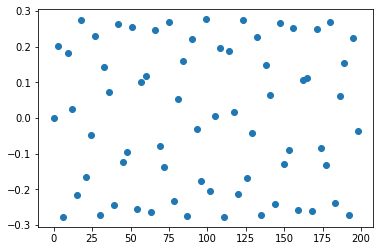

length of x is:  67
length of y is:  67


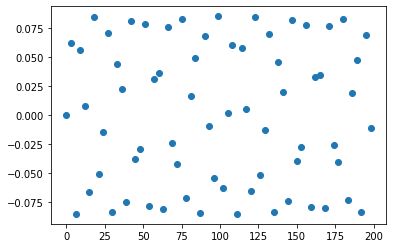

length of x is:  67
length of y is:  67


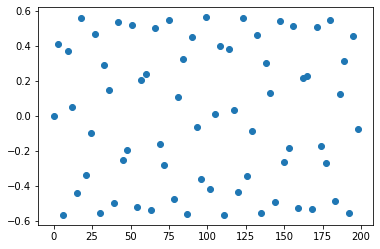

length of x is:  67
length of y is:  67


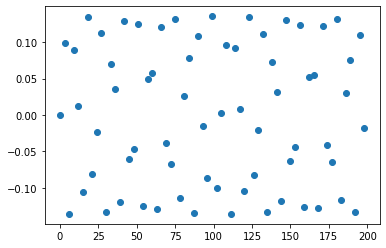

length of x is:  67
length of y is:  67


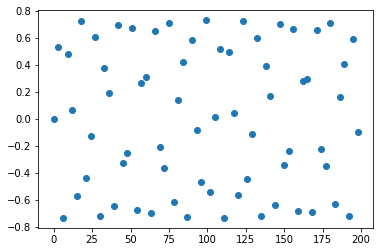

length of x is:  67
length of y is:  67


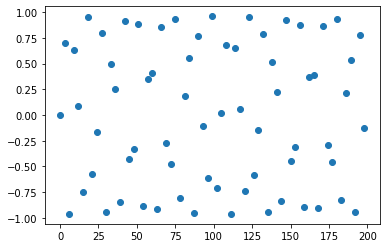

length of x is:  67
length of y is:  67


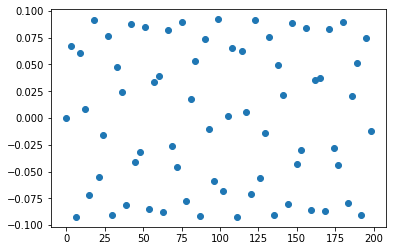

length of x is:  67
length of y is:  67


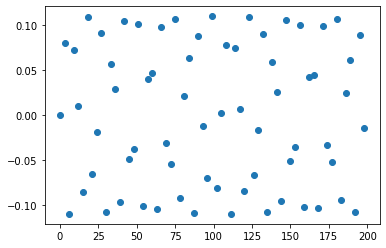

length of x is:  67
length of y is:  67


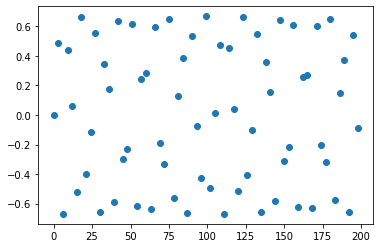

length of x is:  67
length of y is:  67


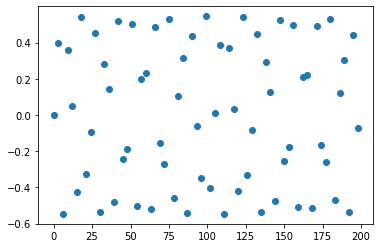

length of x is:  67
length of y is:  67


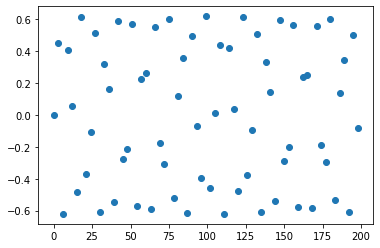

length of x is:  67
length of y is:  67


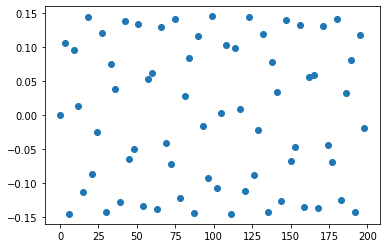

length of x is:  67
length of y is:  67


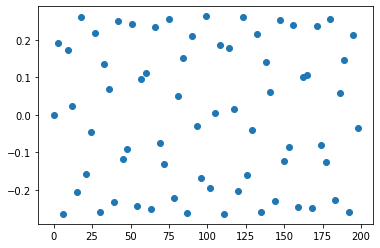

length of x is:  67
length of y is:  67


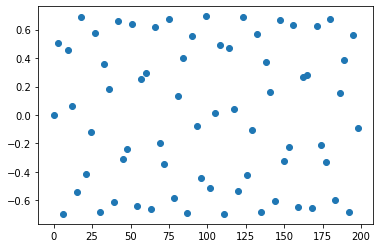

length of x is:  67
length of y is:  67


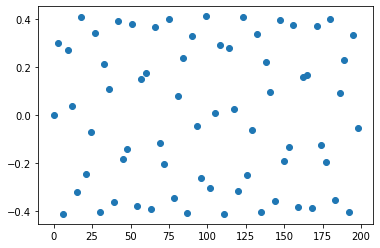

length of x is:  67
length of y is:  67


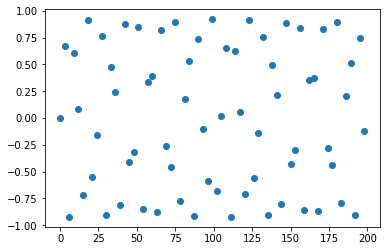

length of x is:  67
length of y is:  67


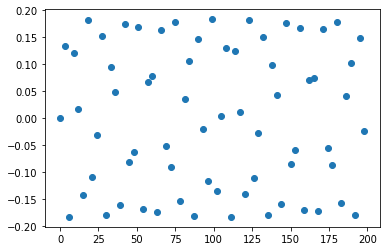

length of x is:  67
length of y is:  67


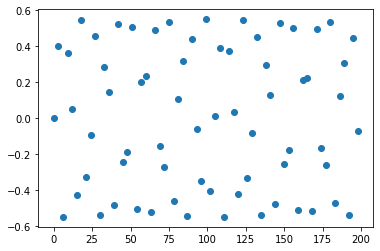

length of x is:  67
length of y is:  67


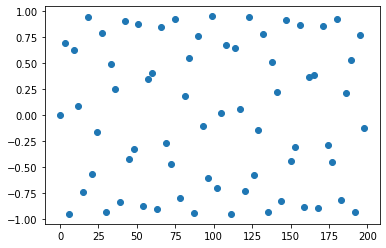

length of x is:  67
length of y is:  67


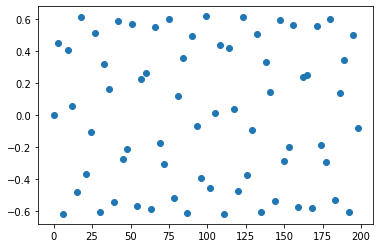

length of x is:  67
length of y is:  67


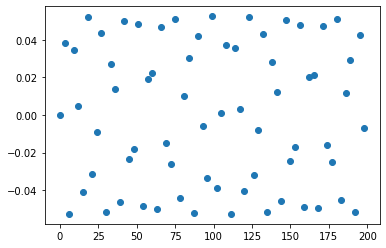

length of x is:  67
length of y is:  67


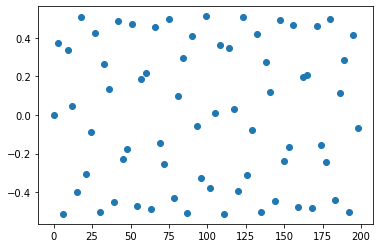

length of x is:  67
length of y is:  67


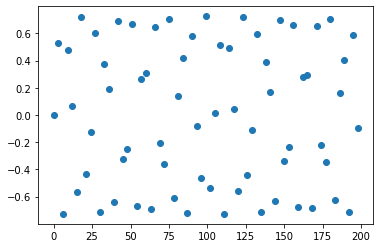

length of x is:  67
length of y is:  67


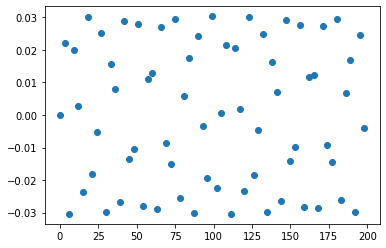

length of x is:  67
length of y is:  67


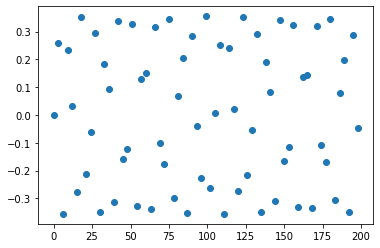

length of x is:  67
length of y is:  67


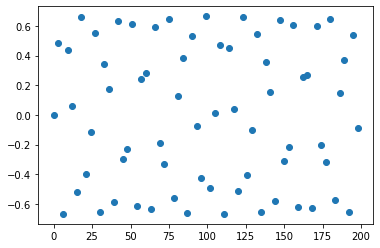

length of x is:  67
length of y is:  67


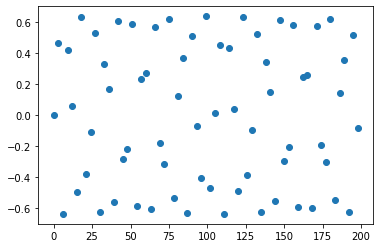

length of x is:  67
length of y is:  67


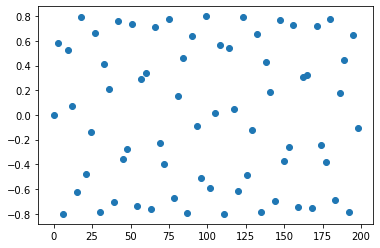

length of x is:  67
length of y is:  67


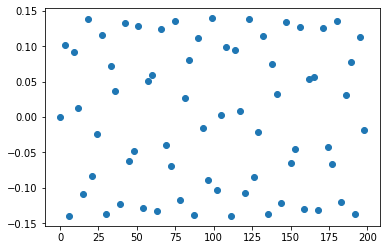

length of x is:  67
length of y is:  67


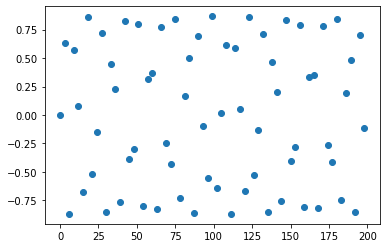

length of x is:  67
length of y is:  67


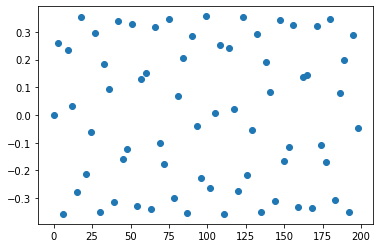

length of x is:  67
length of y is:  67


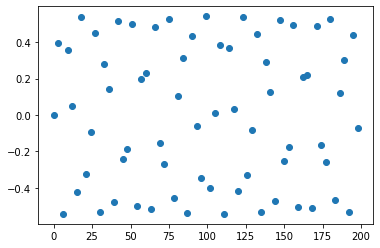

length of x is:  67
length of y is:  67


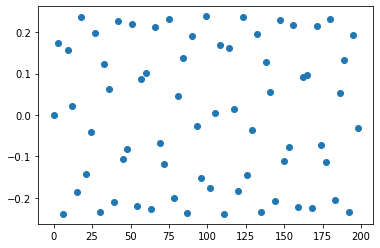

length of x is:  67
length of y is:  67


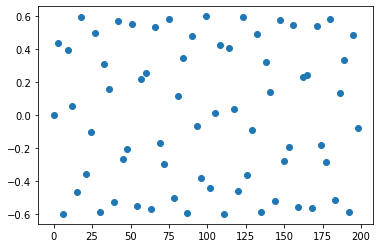

length of x is:  67
length of y is:  67


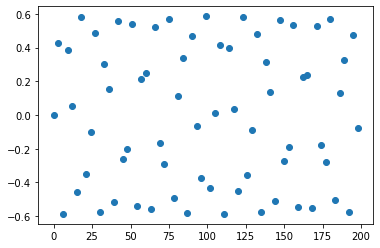

length of x is:  67
length of y is:  67


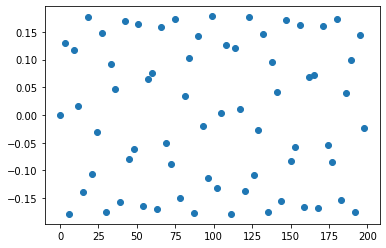

length of x is:  67
length of y is:  67


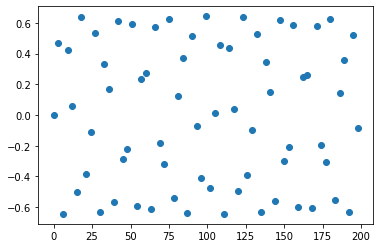

length of x is:  67
length of y is:  67


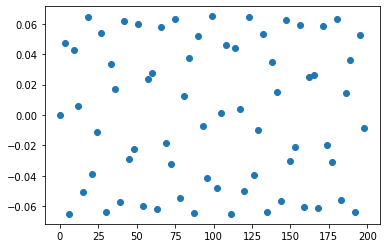

length of x is:  67
length of y is:  67


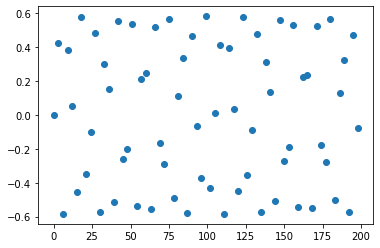

length of x is:  67
length of y is:  67


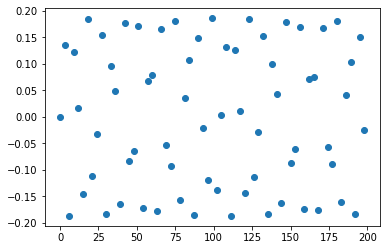

length of x is:  67
length of y is:  67


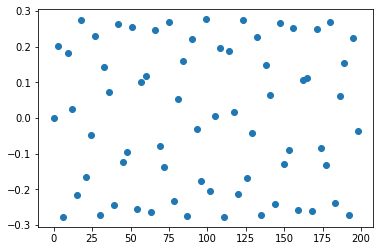

length of x is:  67
length of y is:  67


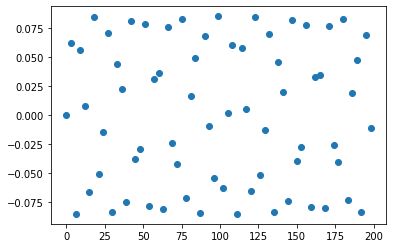

length of x is:  67
length of y is:  67


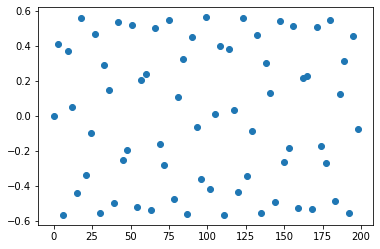

length of x is:  67
length of y is:  67


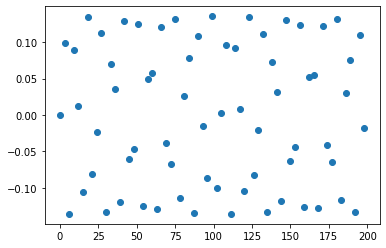

length of x is:  67
length of y is:  67


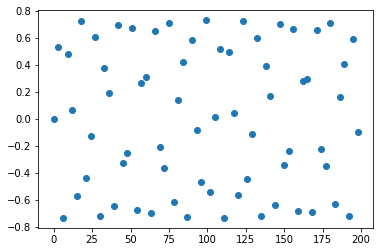

length of x is:  67
length of y is:  67


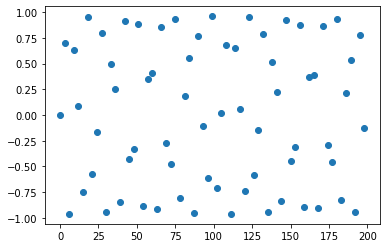

length of x is:  67
length of y is:  67


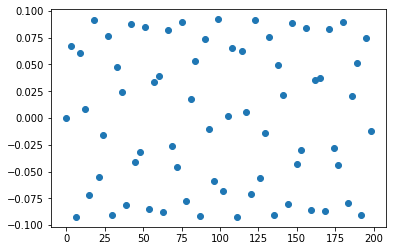

length of x is:  67
length of y is:  67


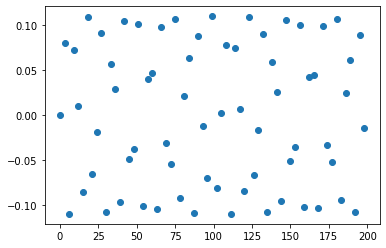

length of x is:  67
length of y is:  67


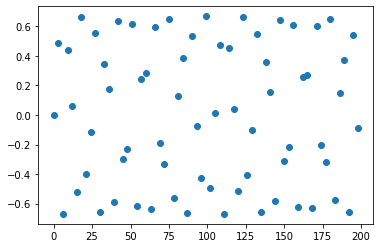

length of x is:  67
length of y is:  67


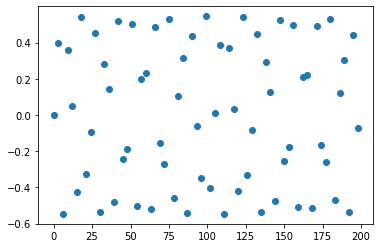

length of x is:  67
length of y is:  67


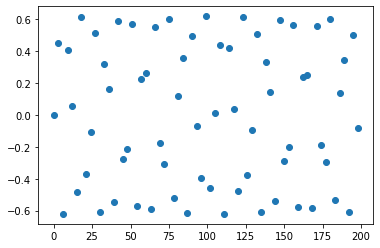

length of x is:  67
length of y is:  67


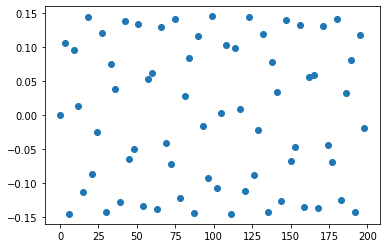

length of x is:  67
length of y is:  67


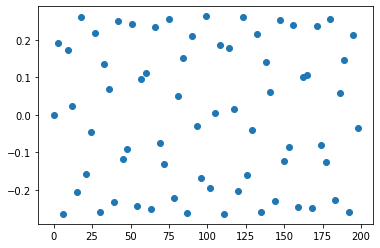

length of x is:  67
length of y is:  67


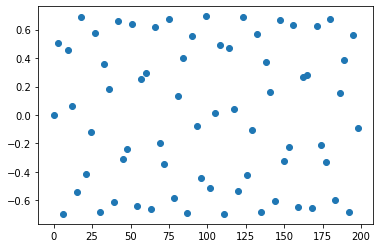

length of x is:  67
length of y is:  67


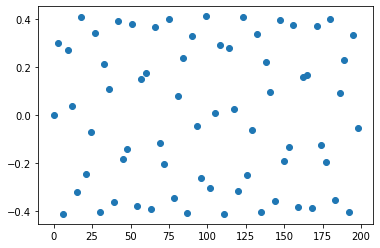

length of x is:  67
length of y is:  67


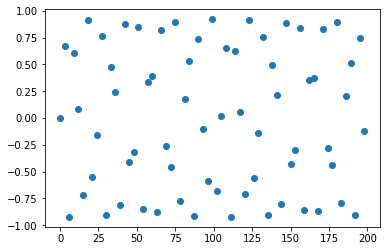

length of x is:  67
length of y is:  67


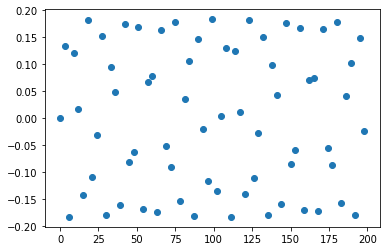

length of x is:  67
length of y is:  67


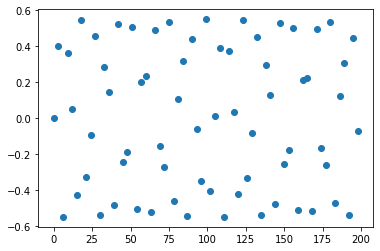

length of x is:  67
length of y is:  67


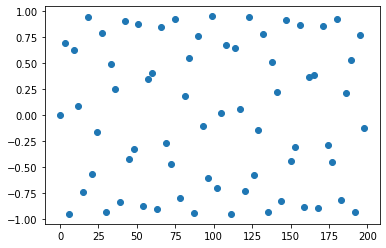

length of x is:  67
length of y is:  67


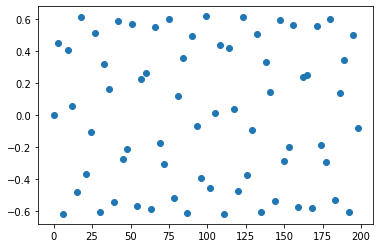

length of x is:  67
length of y is:  67


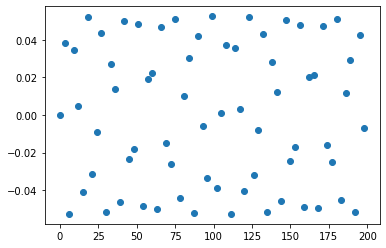

length of x is:  67
length of y is:  67


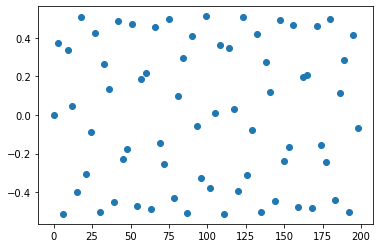

length of x is:  67
length of y is:  67


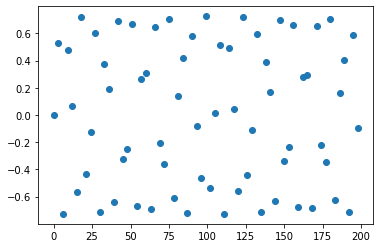

length of x is:  67
length of y is:  67


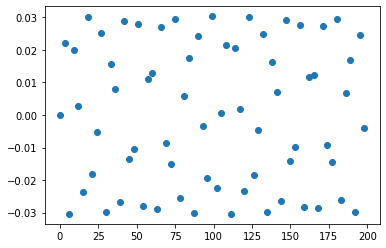

length of x is:  67
length of y is:  67


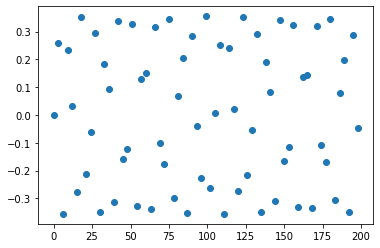

length of x is:  67
length of y is:  67


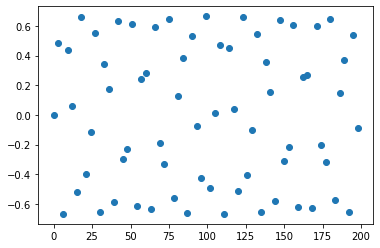

length of x is:  67
length of y is:  67


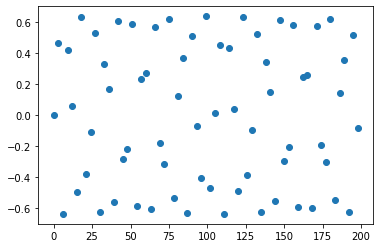

length of x is:  67
length of y is:  67


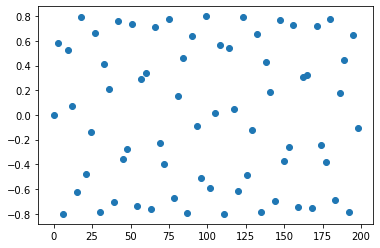

length of x is:  67
length of y is:  67


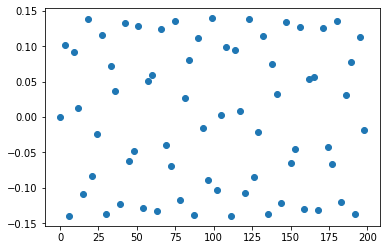

length of x is:  67
length of y is:  67


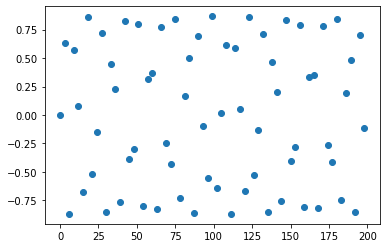

length of x is:  67
length of y is:  67


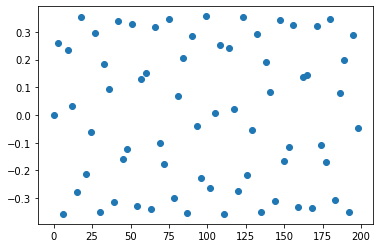

length of x is:  67
length of y is:  67


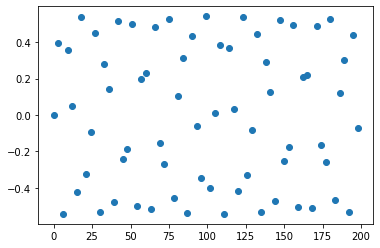

length of x is:  67
length of y is:  67


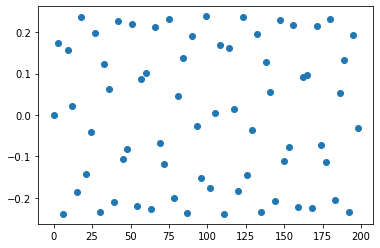

length of x is:  67
length of y is:  67


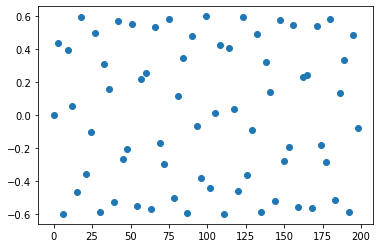

length of x is:  67
length of y is:  67


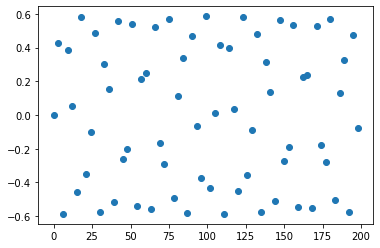

length of x is:  67
length of y is:  67


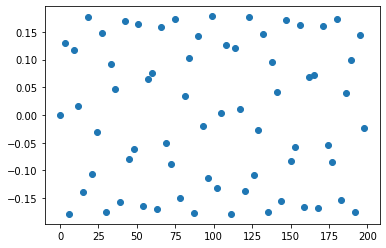

length of x is:  67
length of y is:  67


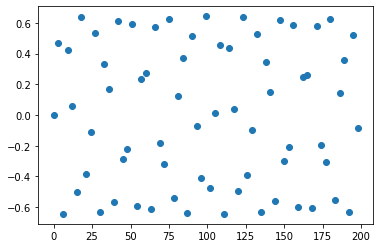

length of x is:  67
length of y is:  67


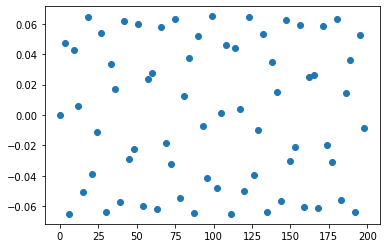

length of x is:  67
length of y is:  67


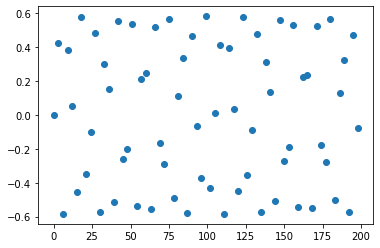

length of x is:  67
length of y is:  67


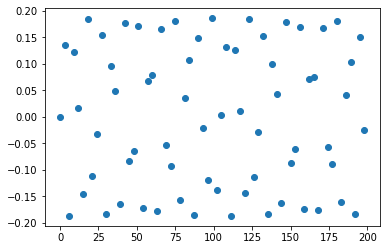

length of x is:  67
length of y is:  67


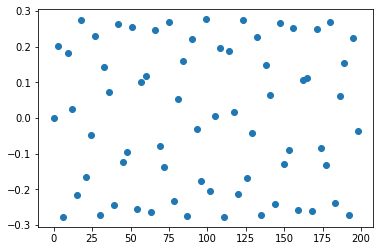

length of x is:  67
length of y is:  67


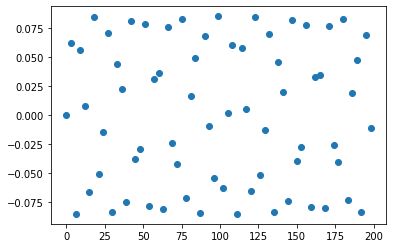

length of x is:  67
length of y is:  67


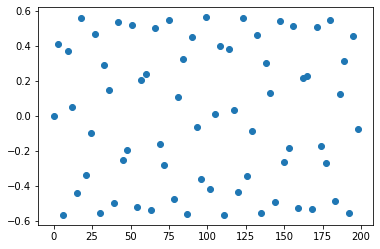

length of x is:  67
length of y is:  67


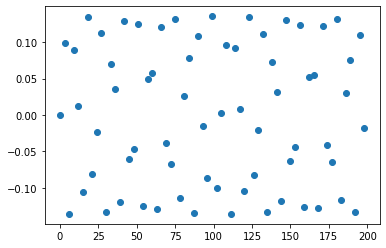

length of x is:  67
length of y is:  67


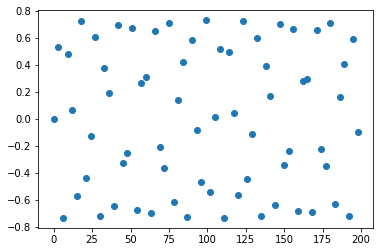

length of x is:  67
length of y is:  67


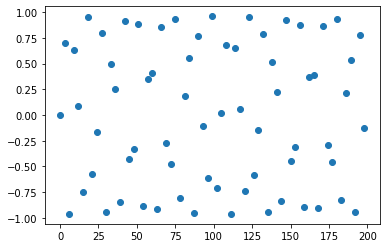

length of x is:  67
length of y is:  67


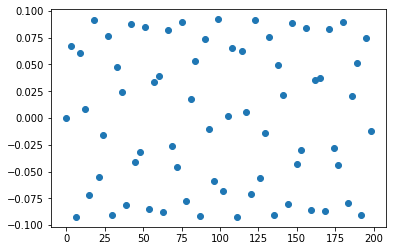

length of x is:  67
length of y is:  67


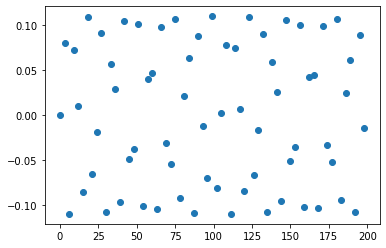

length of x is:  67
length of y is:  67


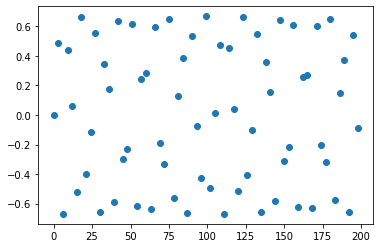

length of x is:  67
length of y is:  67


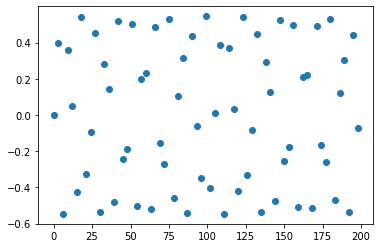

length of x is:  67
length of y is:  67


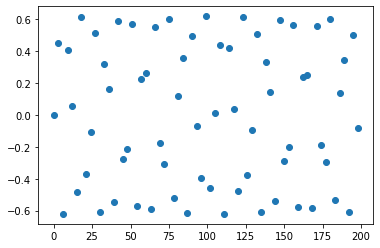

length of x is:  67
length of y is:  67


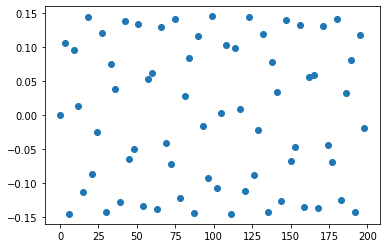

length of x is:  67
length of y is:  67


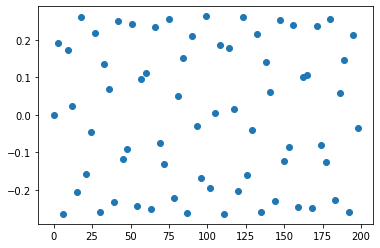

length of x is:  67
length of y is:  67


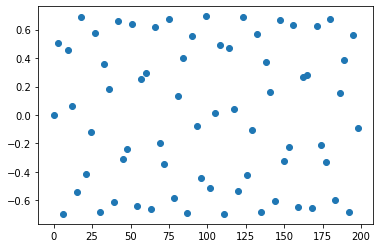

length of x is:  67
length of y is:  67


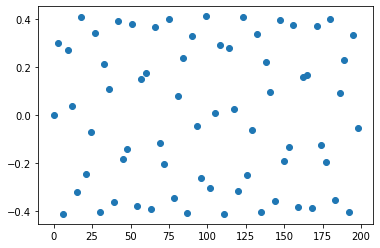

length of x is:  67
length of y is:  67


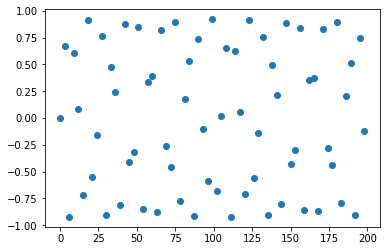

length of x is:  67
length of y is:  67


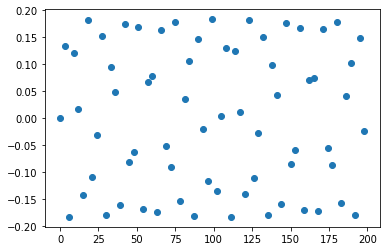

length of x is:  67
length of y is:  67


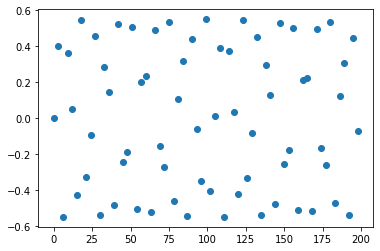

length of x is:  67
length of y is:  67


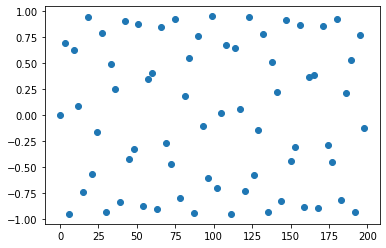

length of x is:  67
length of y is:  67


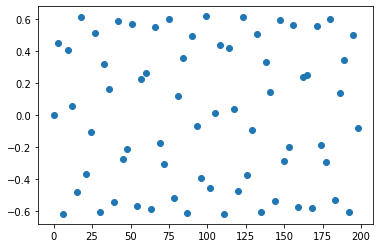

length of x is:  67
length of y is:  67


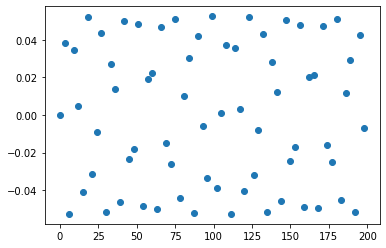

length of x is:  67
length of y is:  67


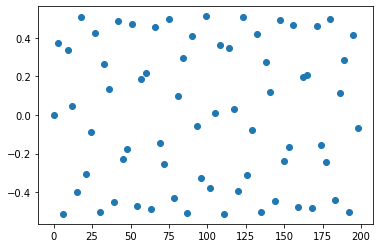

length of x is:  67
length of y is:  67


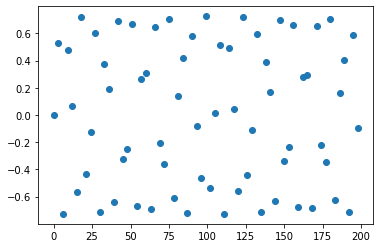

length of x is:  67
length of y is:  67


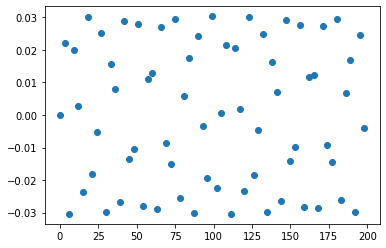

length of x is:  67
length of y is:  67


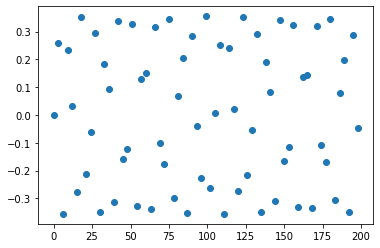

length of x is:  67
length of y is:  67


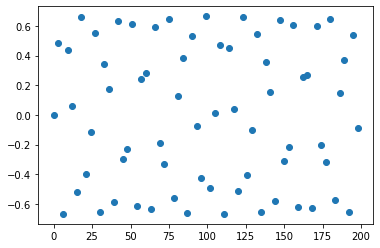

length of x is:  67
length of y is:  67


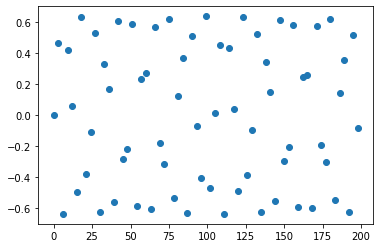

length of x is:  67
length of y is:  67


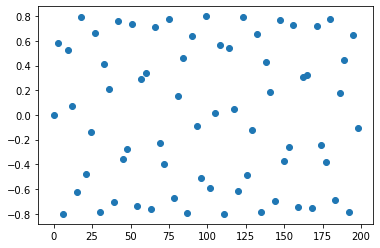

length of x is:  67
length of y is:  67


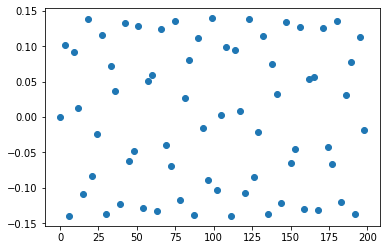

length of x is:  67
length of y is:  67


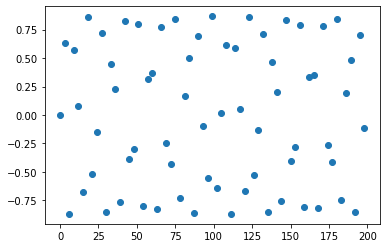

length of x is:  67
length of y is:  67


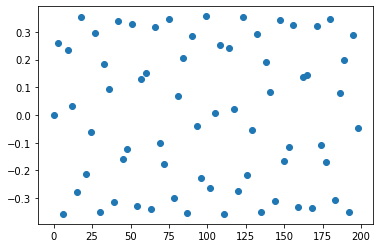

length of x is:  67
length of y is:  67


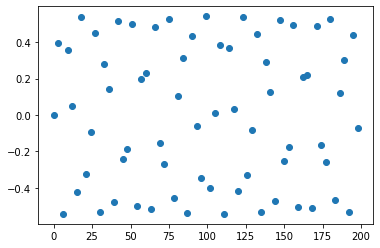

length of x is:  67
length of y is:  67


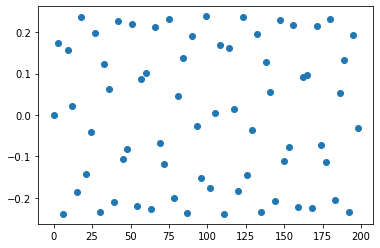

length of x is:  67
length of y is:  67


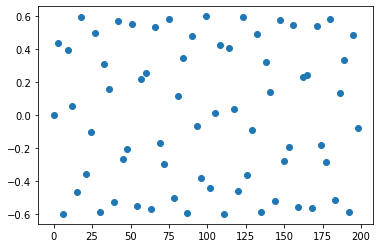

length of x is:  67
length of y is:  67


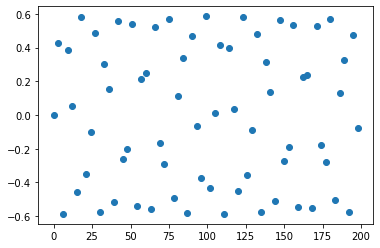

length of x is:  67
length of y is:  67


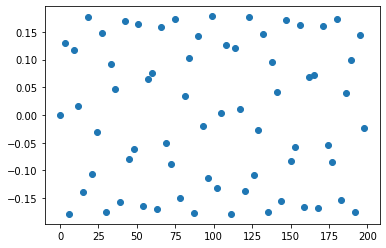

length of x is:  67
length of y is:  67


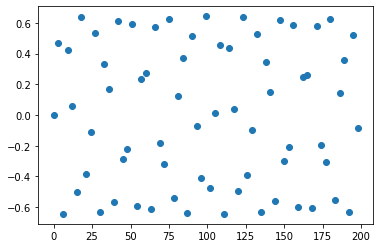

length of x is:  67
length of y is:  67


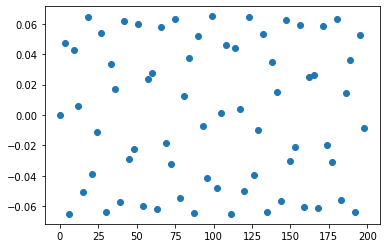

length of x is:  67
length of y is:  67


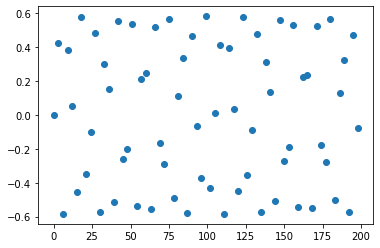

length of x is:  67
length of y is:  67


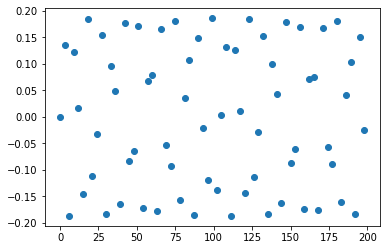

length of x is:  67
length of y is:  67


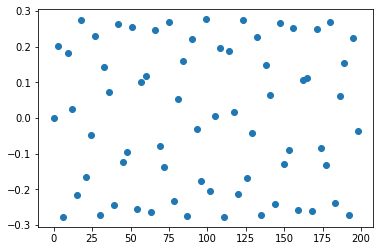

length of x is:  67
length of y is:  67


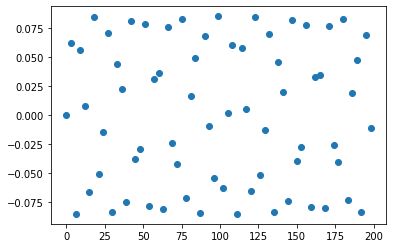

length of x is:  67
length of y is:  67


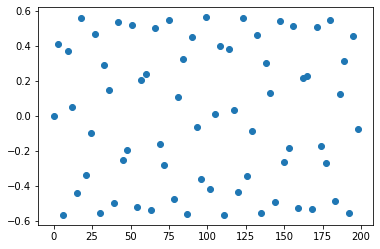

length of x is:  67
length of y is:  67


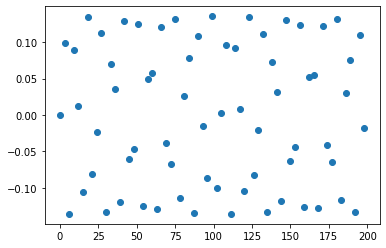

length of x is:  67
length of y is:  67


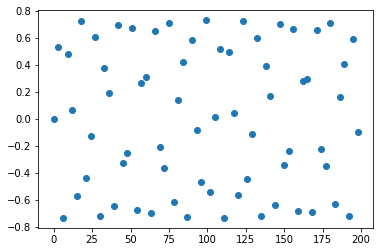

length of x is:  67
length of y is:  67


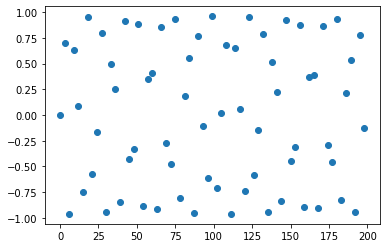

length of x is:  67
length of y is:  67


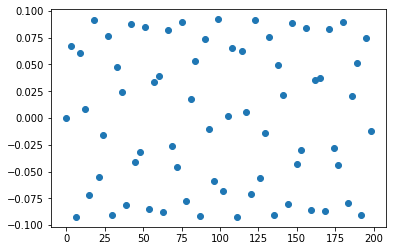

length of x is:  67
length of y is:  67


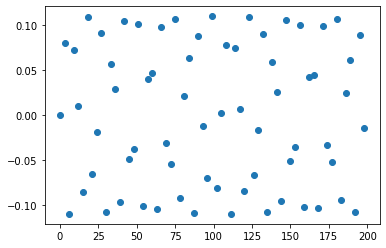

length of x is:  67
length of y is:  67


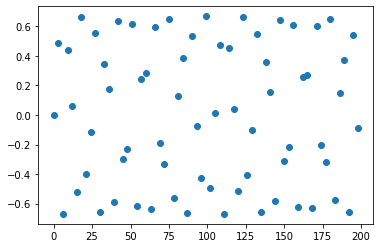

length of x is:  67
length of y is:  67


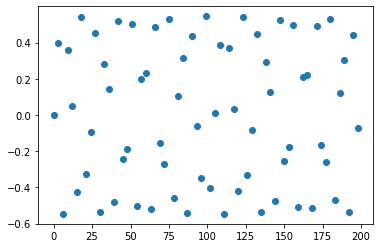

length of x is:  67
length of y is:  67


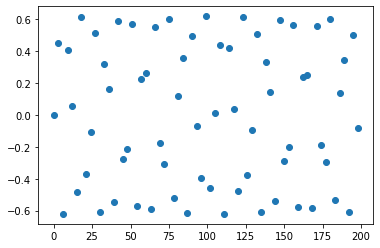

length of x is:  67
length of y is:  67


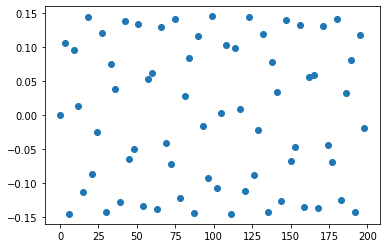

length of x is:  67
length of y is:  67


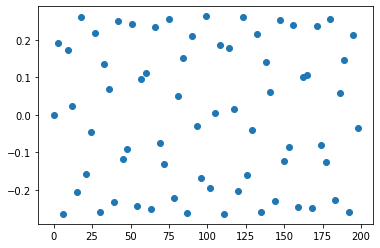

length of x is:  67
length of y is:  67


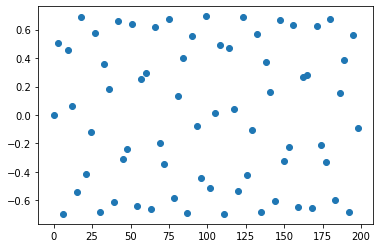

length of x is:  67
length of y is:  67


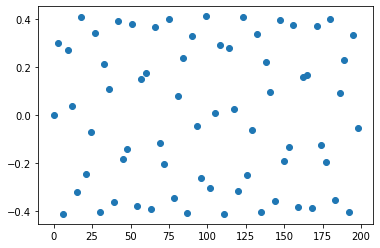

length of x is:  67
length of y is:  67


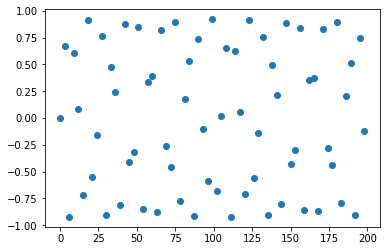

length of x is:  67
length of y is:  67


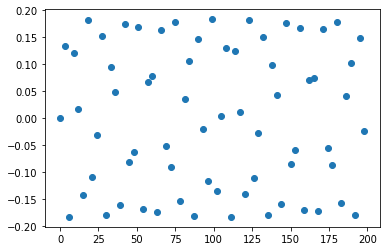

length of x is:  67
length of y is:  67


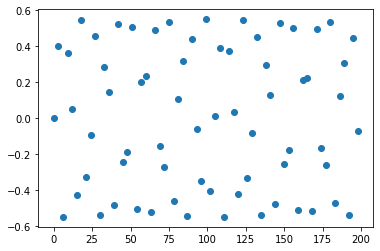

length of x is:  67
length of y is:  67


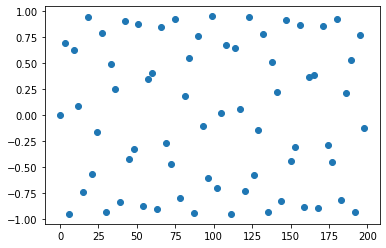

length of x is:  67
length of y is:  67


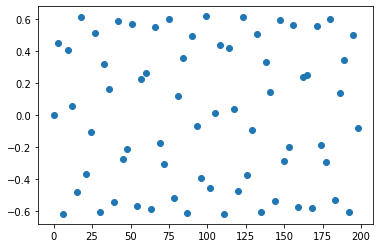

length of x is:  67
length of y is:  67


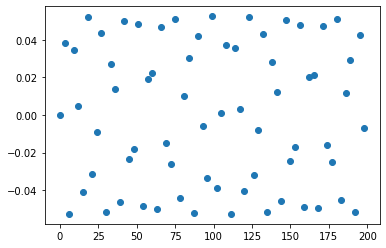

length of x is:  67
length of y is:  67


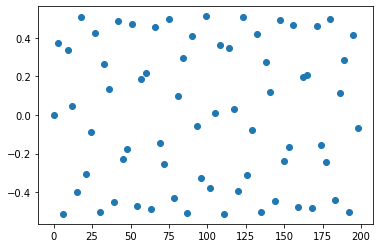

length of x is:  67
length of y is:  67


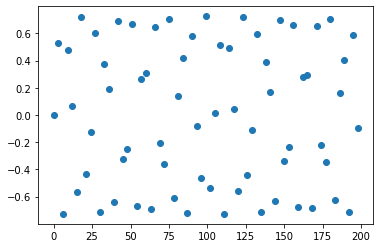

length of x is:  67
length of y is:  67


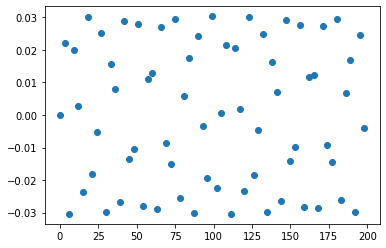

length of x is:  67
length of y is:  67


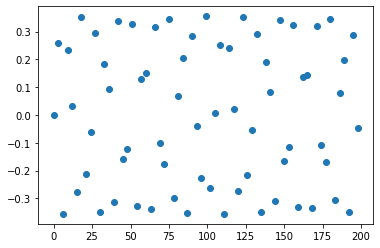

length of x is:  67
length of y is:  67


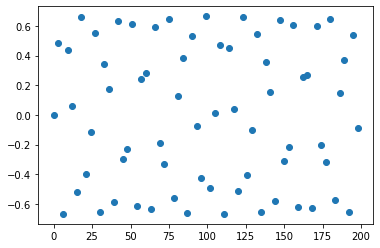

length of x is:  67
length of y is:  67


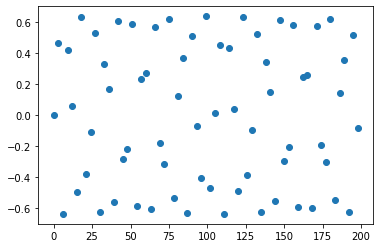

length of x is:  67
length of y is:  67


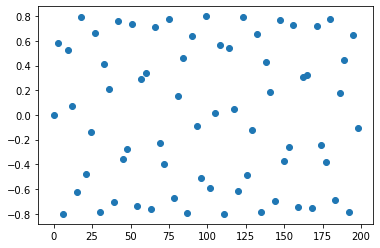

length of x is:  67
length of y is:  67


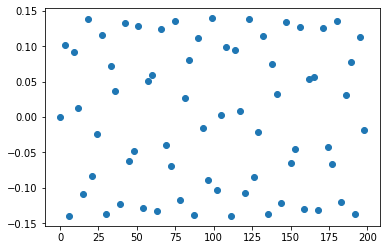

length of x is:  67
length of y is:  67


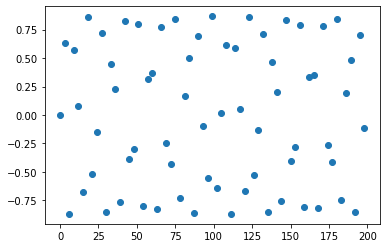

length of x is:  67
length of y is:  67


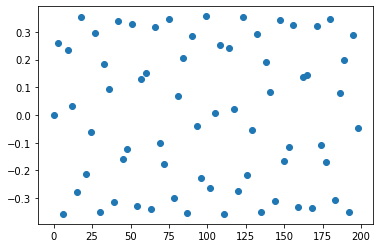

length of x is:  67
length of y is:  67


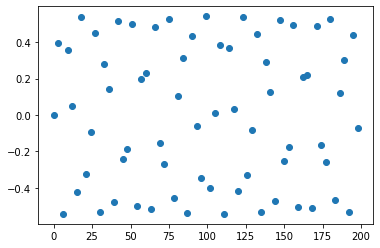

length of x is:  67
length of y is:  67


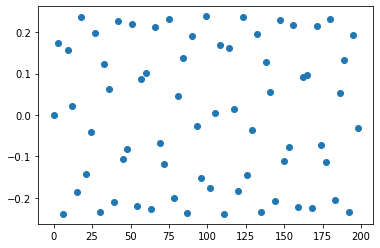

length of x is:  67
length of y is:  67


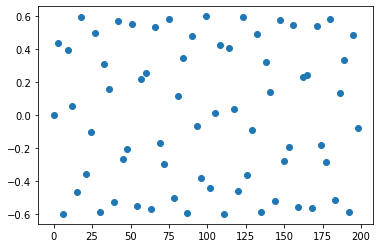

length of x is:  67
length of y is:  67


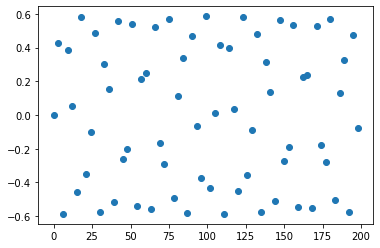

length of x is:  67
length of y is:  67


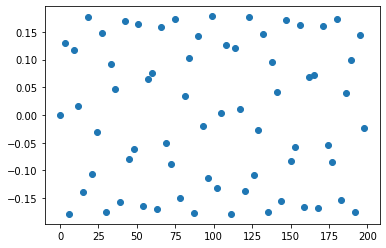

length of x is:  67
length of y is:  67


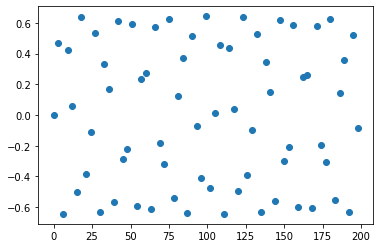

length of x is:  67
length of y is:  67


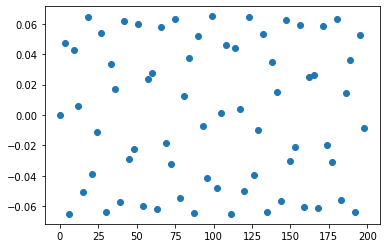

length of x is:  67
length of y is:  67


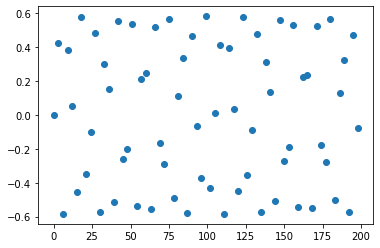

length of x is:  67
length of y is:  67


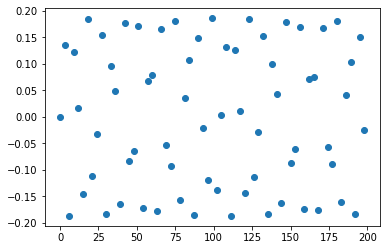

length of x is:  67
length of y is:  67


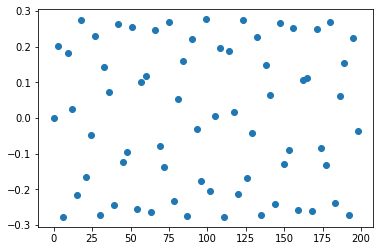

length of x is:  67
length of y is:  67


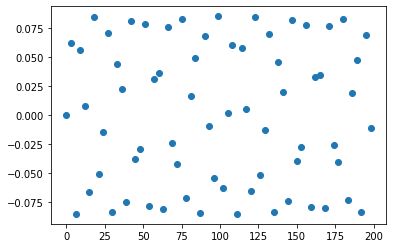

length of x is:  67
length of y is:  67


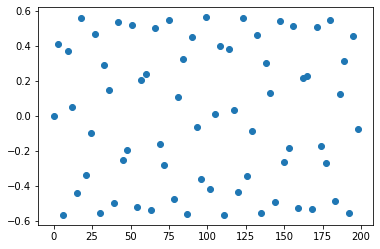

length of x is:  67
length of y is:  67


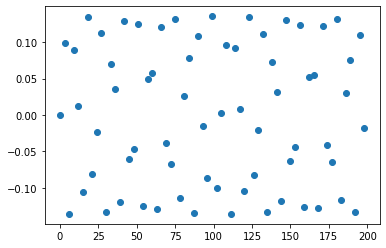

length of x is:  67
length of y is:  67


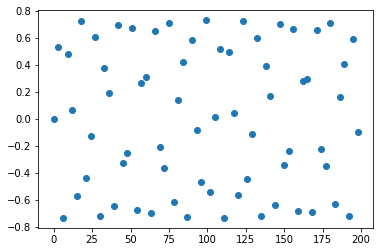

length of x is:  67
length of y is:  67


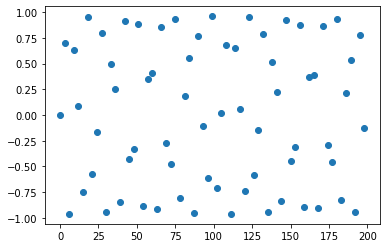

length of x is:  67
length of y is:  67


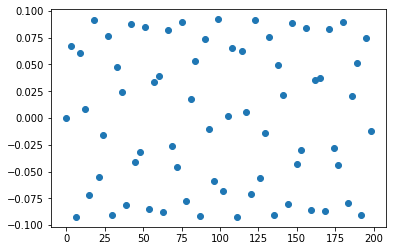

length of x is:  67
length of y is:  67


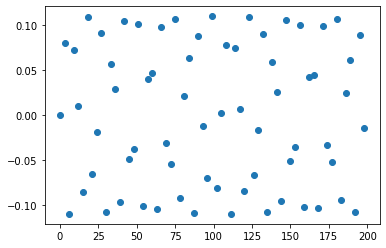

length of x is:  67
length of y is:  67


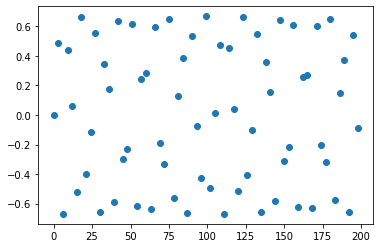

length of x is:  67
length of y is:  67


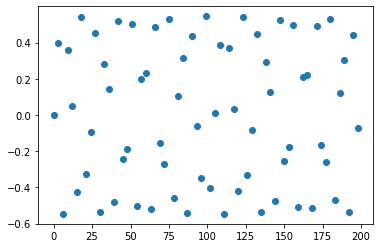

length of x is:  67
length of y is:  67


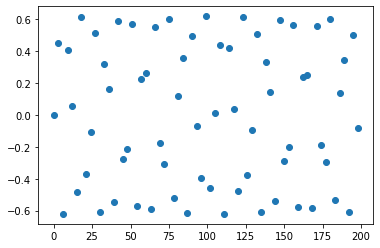

length of x is:  67
length of y is:  67


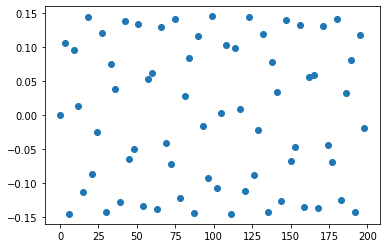

length of x is:  67
length of y is:  67


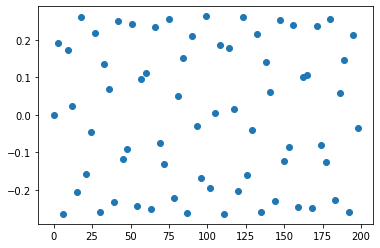

length of x is:  67
length of y is:  67


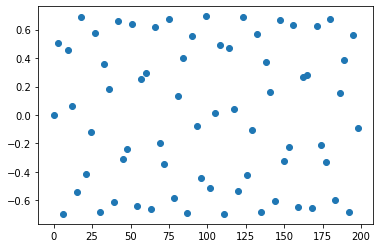

length of x is:  67
length of y is:  67


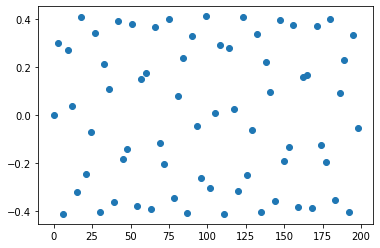

length of x is:  67
length of y is:  67


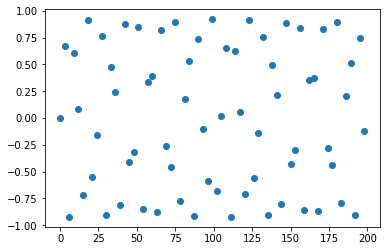

length of x is:  67
length of y is:  67


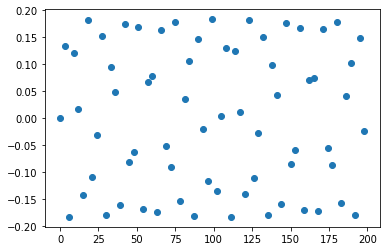

length of x is:  67
length of y is:  67


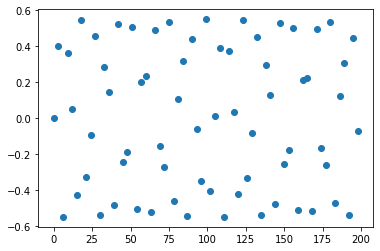

length of x is:  67
length of y is:  67


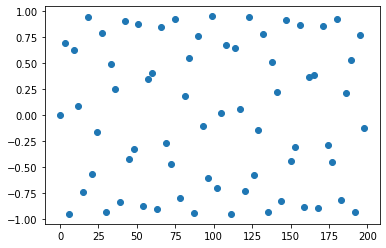

length of x is:  67
length of y is:  67


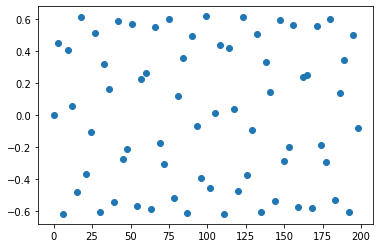

length of x is:  67
length of y is:  67


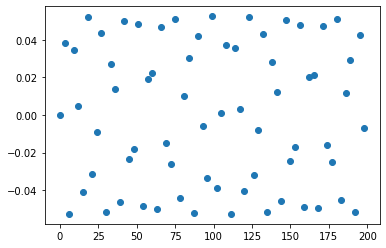

length of x is:  67
length of y is:  67


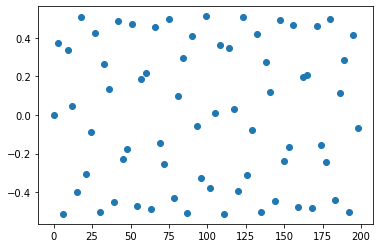

length of x is:  67
length of y is:  67


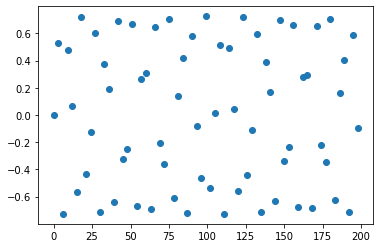

length of x is:  67
length of y is:  67


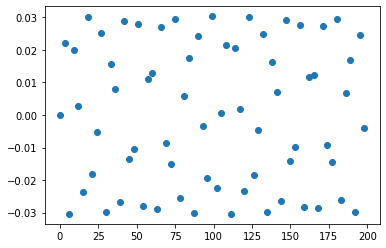

length of x is:  67
length of y is:  67


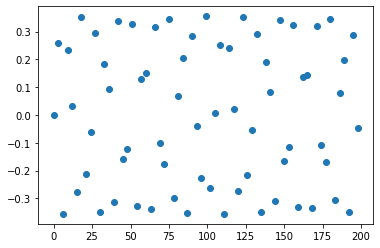

length of x is:  67
length of y is:  67


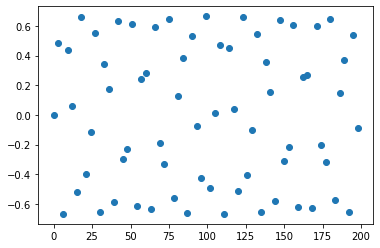

length of x is:  67
length of y is:  67


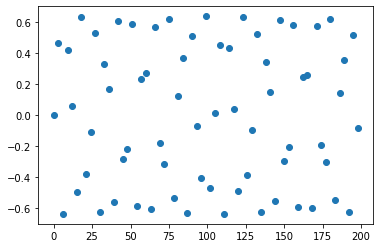

length of x is:  67
length of y is:  67


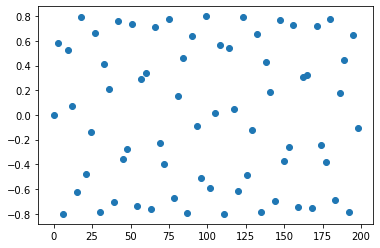

length of x is:  67
length of y is:  67


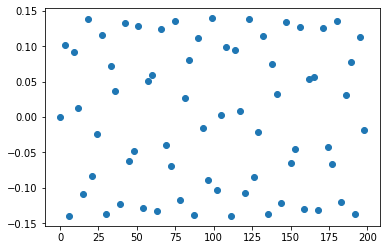

length of x is:  67
length of y is:  67


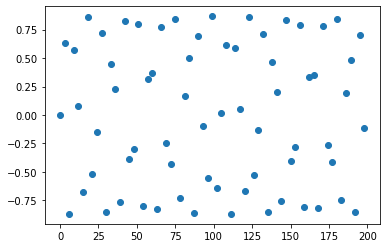

length of x is:  67
length of y is:  67


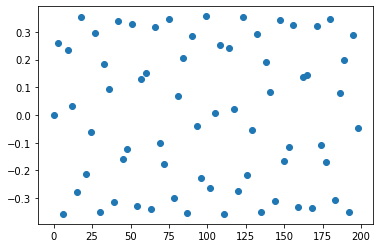

length of x is:  67
length of y is:  67


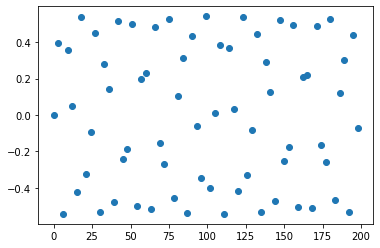

length of x is:  67
length of y is:  67


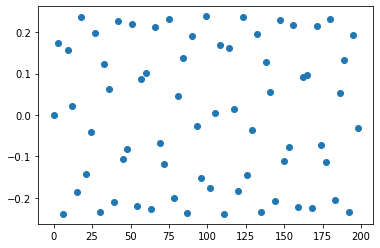

length of x is:  67
length of y is:  67


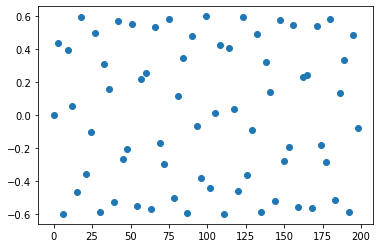

length of x is:  67
length of y is:  67


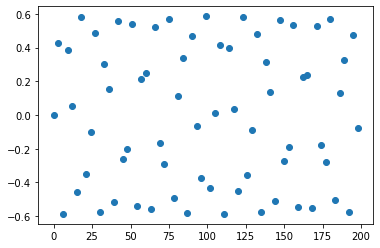

length of x is:  67
length of y is:  67


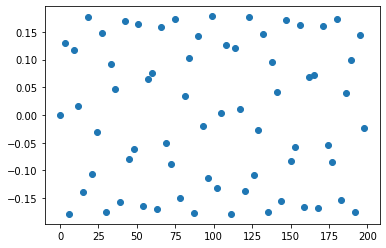

length of x is:  67
length of y is:  67


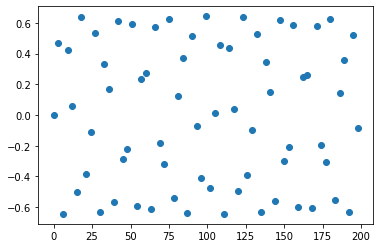

length of x is:  67
length of y is:  67


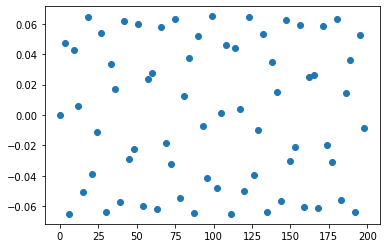

length of x is:  67
length of y is:  67


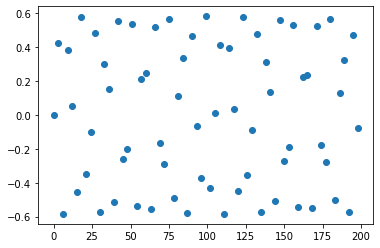

length of x is:  67
length of y is:  67


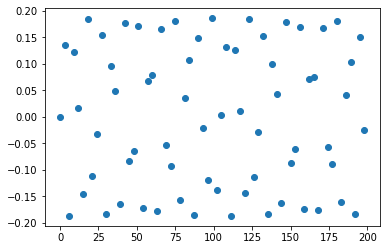

length of x is:  67
length of y is:  67


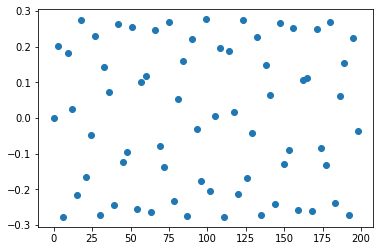

length of x is:  67
length of y is:  67


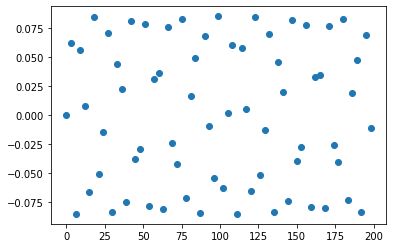

length of x is:  67
length of y is:  67


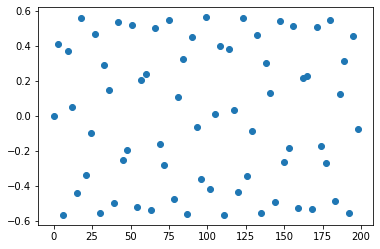

length of x is:  67
length of y is:  67


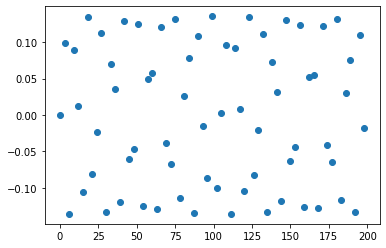

length of x is:  67
length of y is:  67


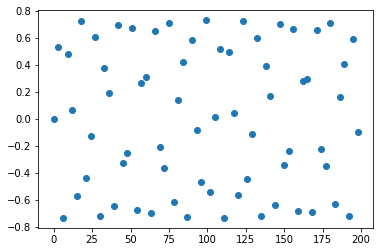

length of x is:  67
length of y is:  67


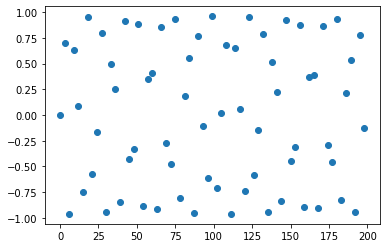

length of x is:  67
length of y is:  67


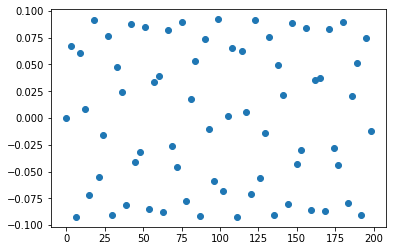

length of x is:  67
length of y is:  67


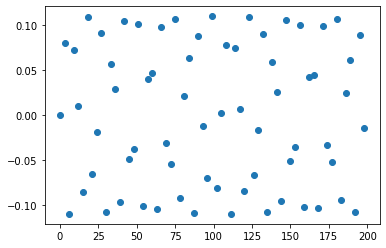

length of x is:  67
length of y is:  67


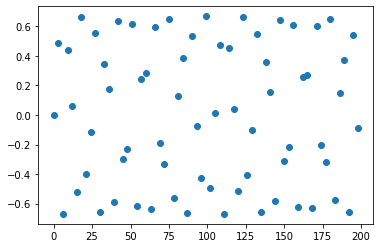

length of x is:  67
length of y is:  67


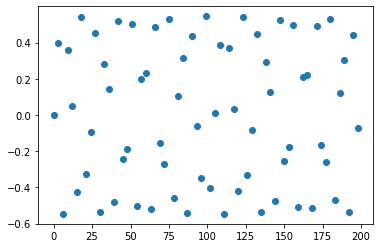

length of x is:  67
length of y is:  67


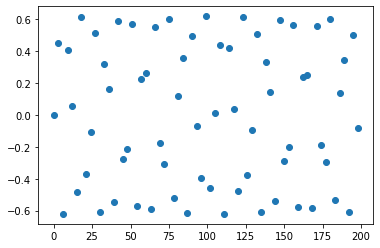

length of x is:  67
length of y is:  67


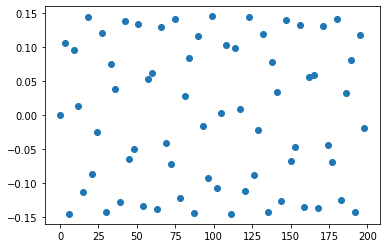

length of x is:  67
length of y is:  67


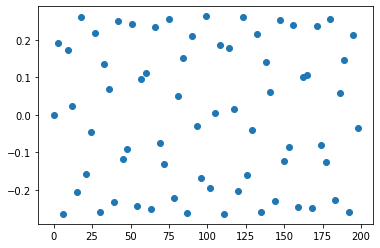

length of x is:  67
length of y is:  67


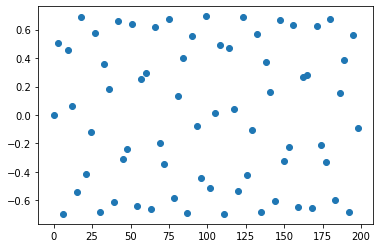

length of x is:  67
length of y is:  67


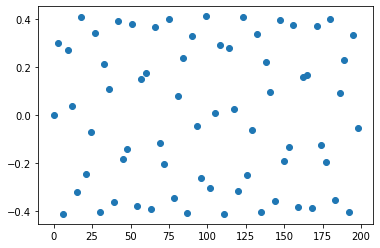

length of x is:  67
length of y is:  67


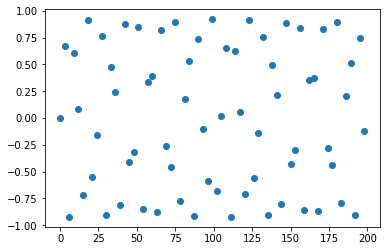

length of x is:  67
length of y is:  67


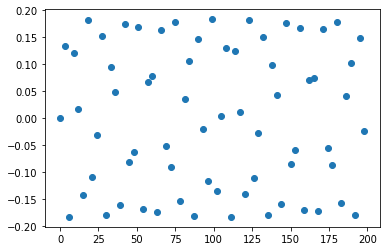

length of x is:  67
length of y is:  67


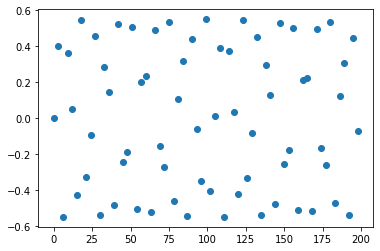

length of x is:  67
length of y is:  67


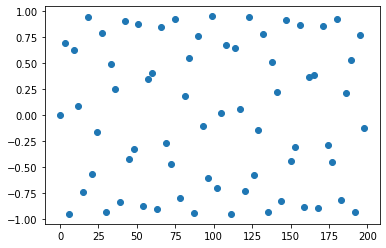

length of x is:  67
length of y is:  67


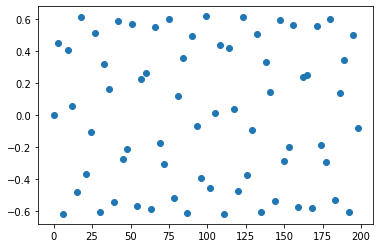

length of x is:  67
length of y is:  67


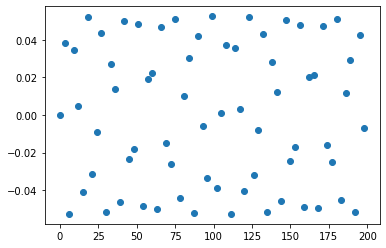

length of x is:  67
length of y is:  67


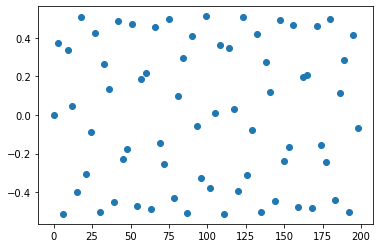

length of x is:  67
length of y is:  67


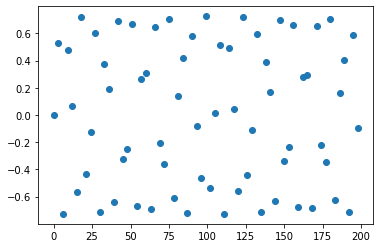

length of x is:  67
length of y is:  67


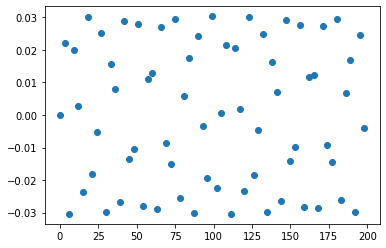

length of x is:  67
length of y is:  67


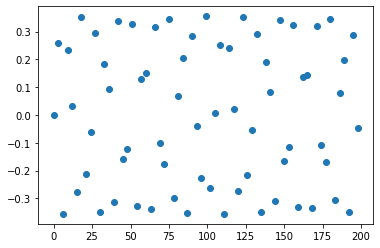

length of x is:  67
length of y is:  67


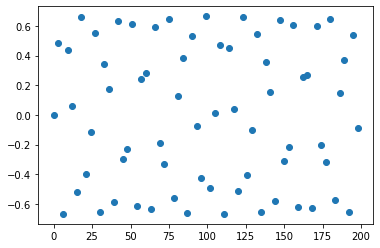

length of x is:  67
length of y is:  67


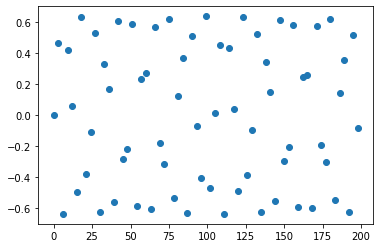

length of x is:  67
length of y is:  67


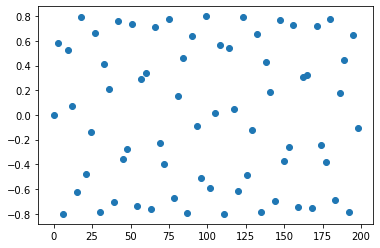

length of x is:  67
length of y is:  67


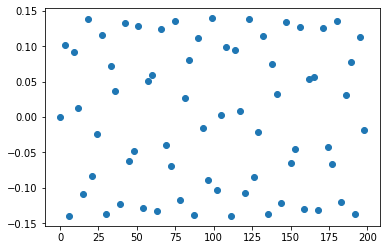

length of x is:  67
length of y is:  67


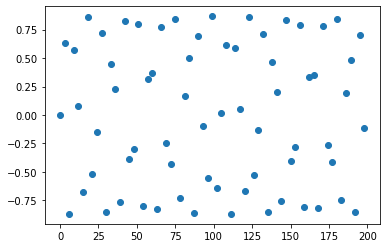

length of x is:  67
length of y is:  67


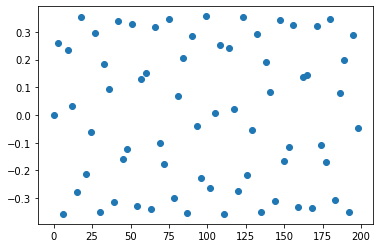

length of x is:  67
length of y is:  67


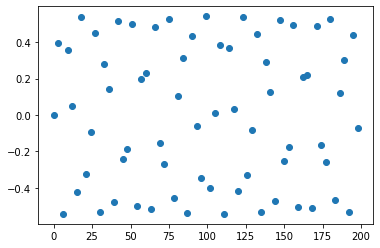

length of x is:  67
length of y is:  67


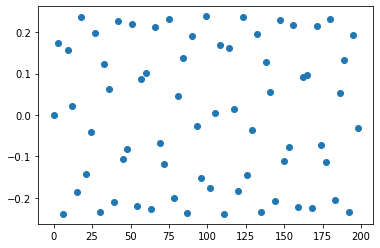

length of x is:  67
length of y is:  67


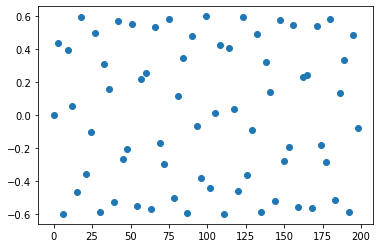

length of x is:  67
length of y is:  67


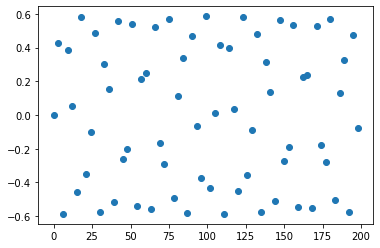

length of x is:  67
length of y is:  67


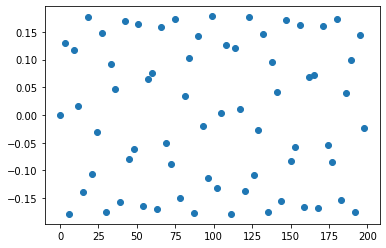

length of x is:  67
length of y is:  67


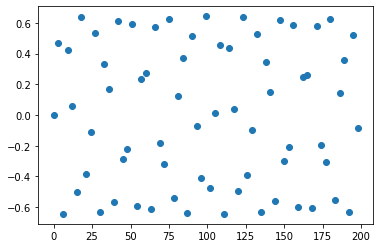

length of x is:  67
length of y is:  67


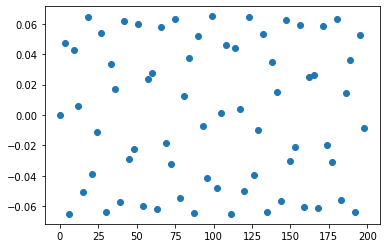

length of x is:  67
length of y is:  67


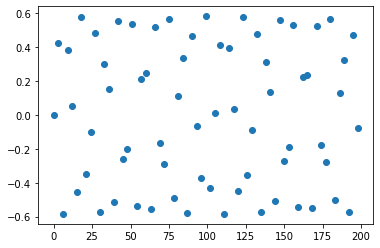

length of x is:  67
length of y is:  67


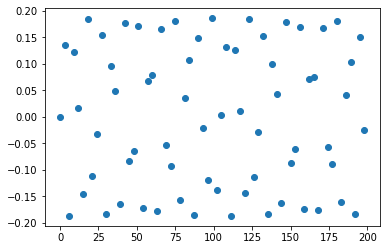

length of x is:  67
length of y is:  67


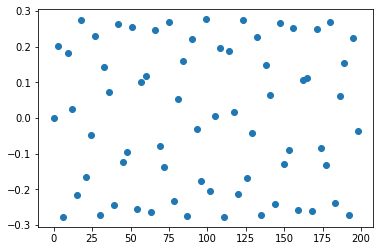

length of x is:  67
length of y is:  67


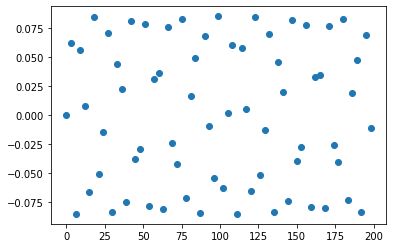

length of x is:  67
length of y is:  67


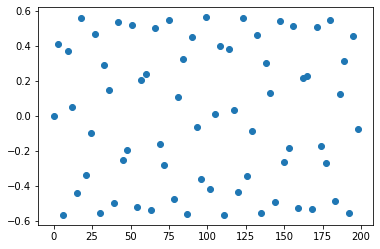

length of x is:  67
length of y is:  67


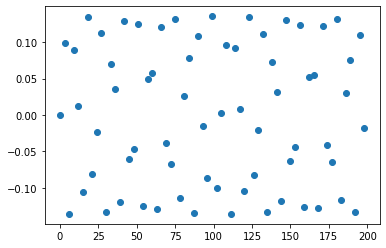

length of x is:  67
length of y is:  67


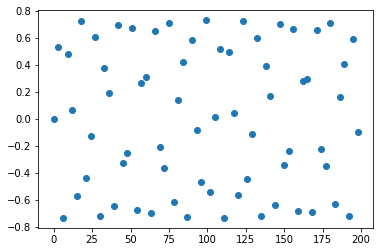

length of x is:  67
length of y is:  67


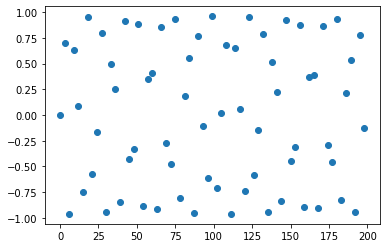

length of x is:  67
length of y is:  67


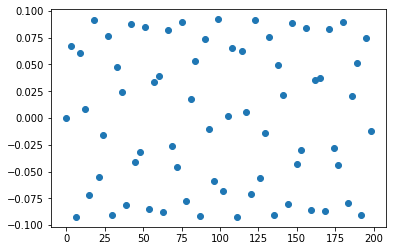

length of x is:  67
length of y is:  67


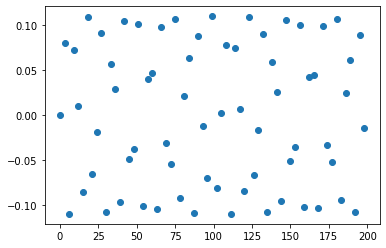

length of x is:  67
length of y is:  67


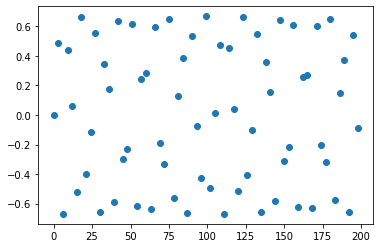

length of x is:  67
length of y is:  67


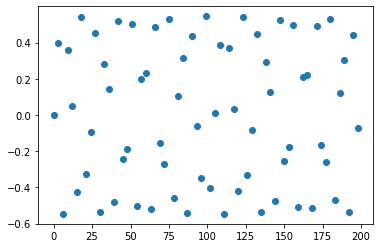

length of x is:  67
length of y is:  67


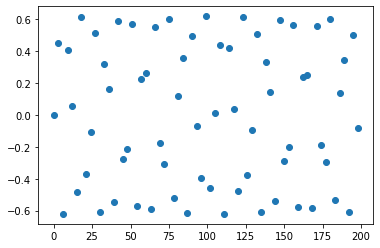

length of x is:  67
length of y is:  67


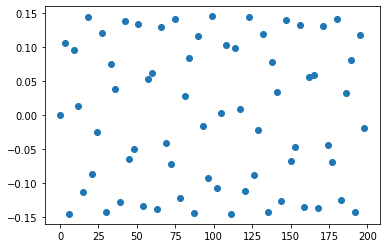

length of x is:  67
length of y is:  67


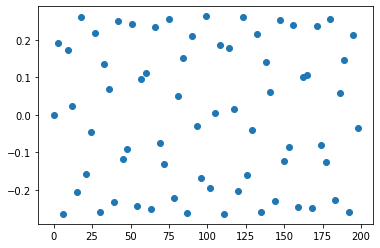

length of x is:  67
length of y is:  67


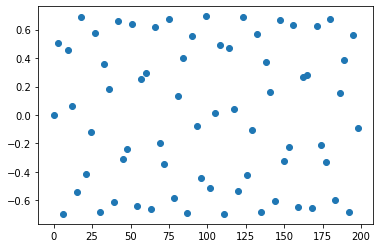

length of x is:  67
length of y is:  67


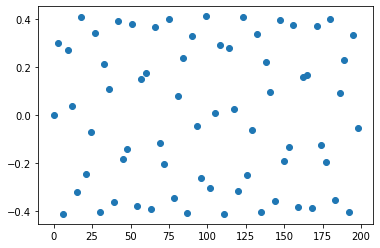

length of x is:  67
length of y is:  67


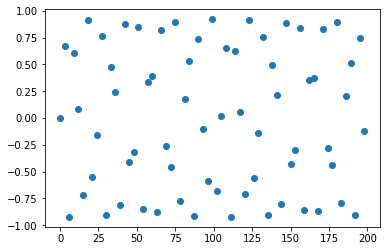

length of x is:  67
length of y is:  67


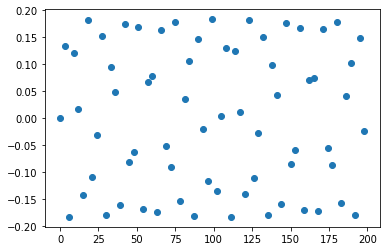

length of x is:  67
length of y is:  67


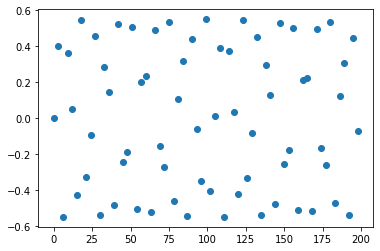

length of x is:  67
length of y is:  67


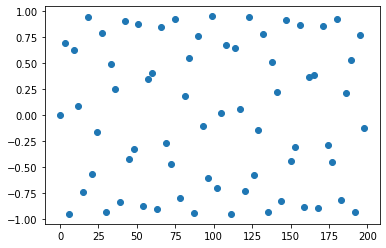

length of x is:  67
length of y is:  67


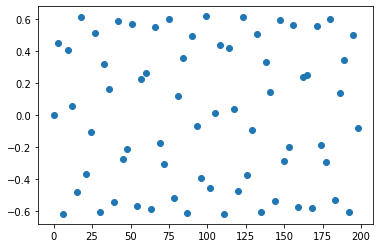

length of x is:  67
length of y is:  67


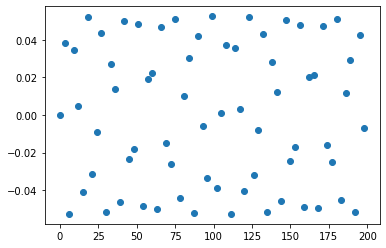

length of x is:  67
length of y is:  67


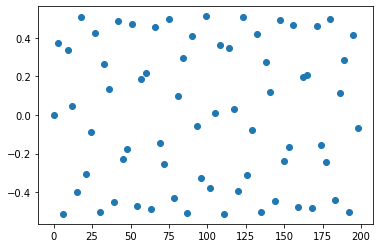

length of x is:  67
length of y is:  67


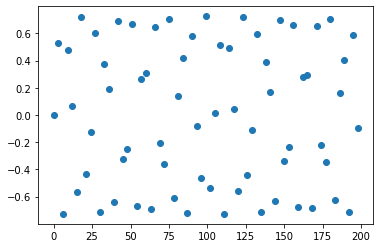

length of x is:  67
length of y is:  67


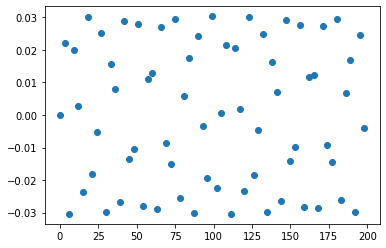

length of x is:  67
length of y is:  67


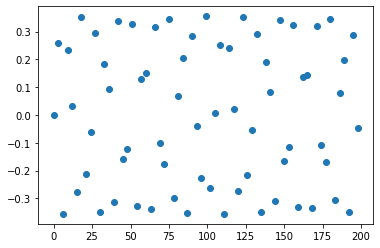

length of x is:  67
length of y is:  67


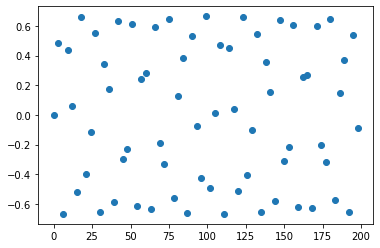

length of x is:  67
length of y is:  67


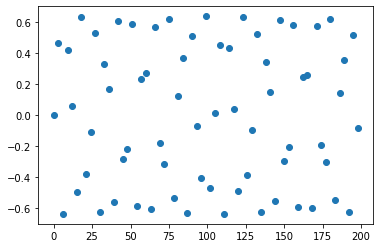

length of x is:  67
length of y is:  67


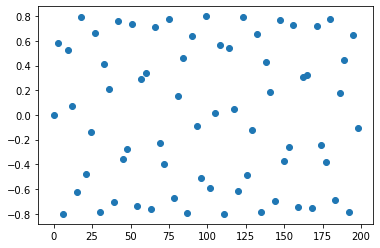

length of x is:  67
length of y is:  67


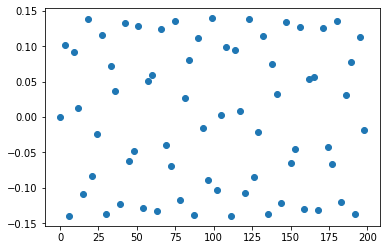

length of x is:  67
length of y is:  67


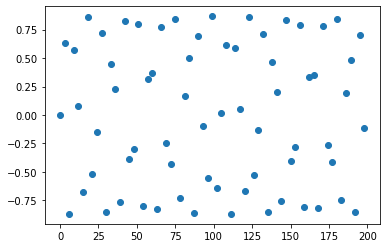

length of x is:  67
length of y is:  67


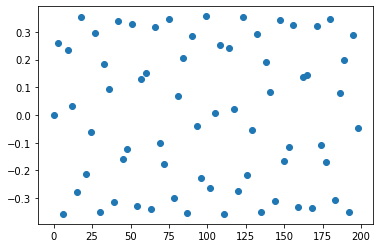

length of x is:  67
length of y is:  67


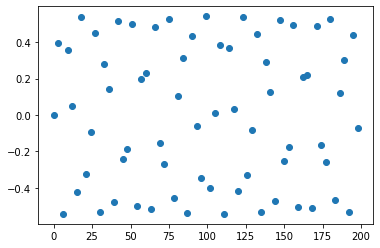

length of x is:  67
length of y is:  67


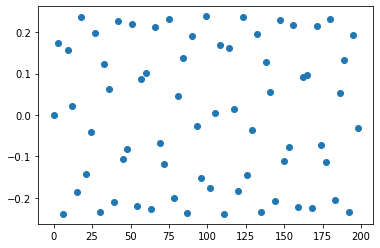

length of x is:  67
length of y is:  67


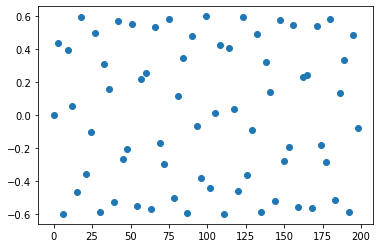

length of x is:  67
length of y is:  67


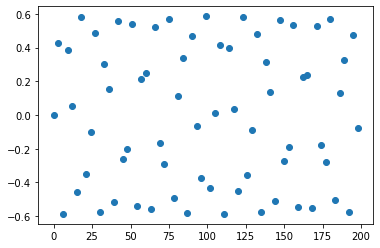

length of x is:  67
length of y is:  67


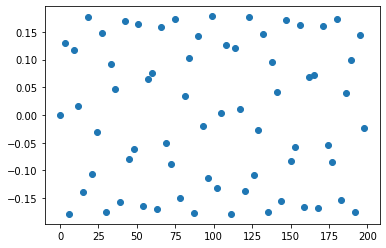

length of x is:  67
length of y is:  67


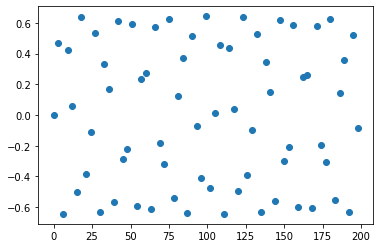

length of x is:  67
length of y is:  67


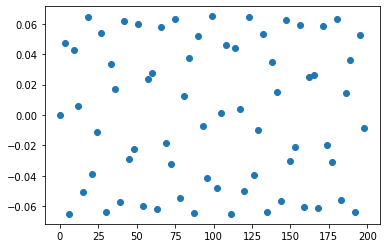

length of x is:  67
length of y is:  67


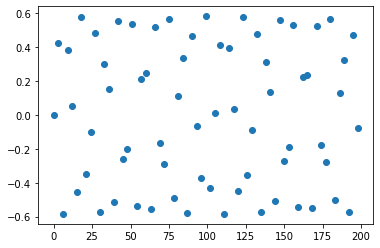

length of x is:  67
length of y is:  67


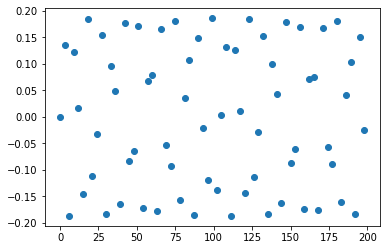

length of x is:  67
length of y is:  67


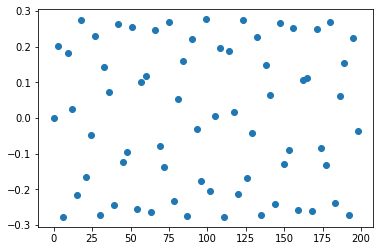

length of x is:  67
length of y is:  67


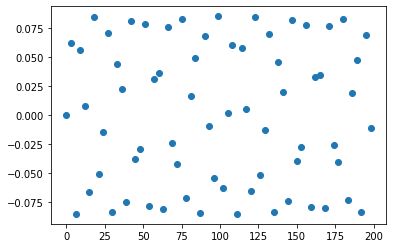

length of x is:  67
length of y is:  67


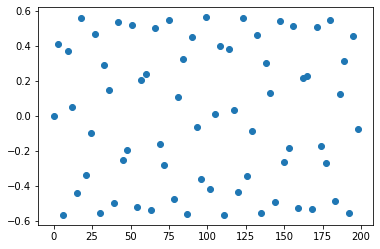

length of x is:  67
length of y is:  67


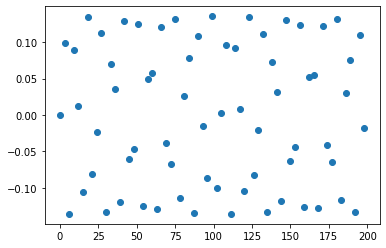

length of x is:  67
length of y is:  67


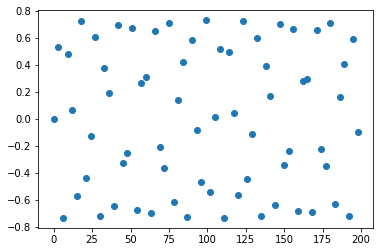

length of x is:  67
length of y is:  67


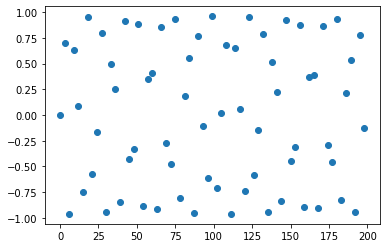

length of x is:  67
length of y is:  67


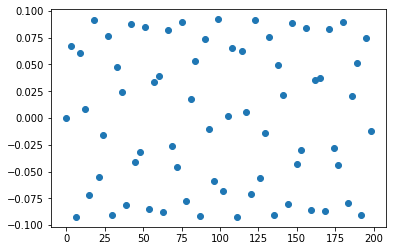

length of x is:  67
length of y is:  67


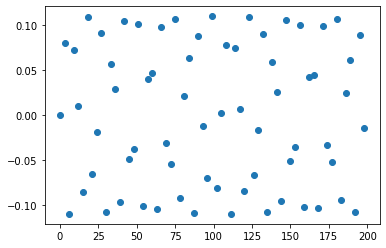

length of x is:  67
length of y is:  67


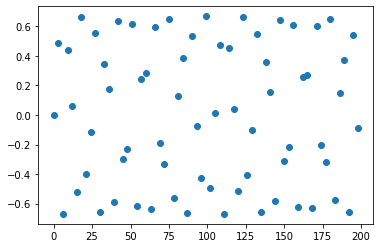

length of x is:  67
length of y is:  67


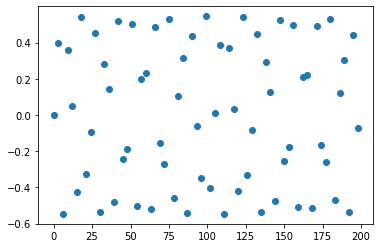

length of x is:  67
length of y is:  67


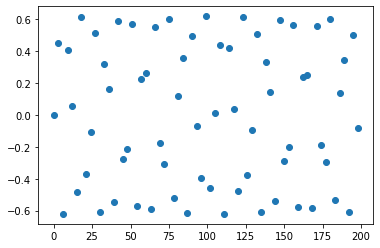

length of x is:  67
length of y is:  67


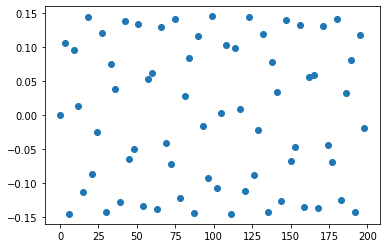

length of x is:  67
length of y is:  67


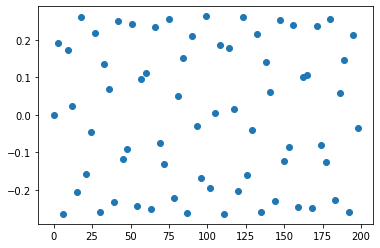

length of x is:  67
length of y is:  67


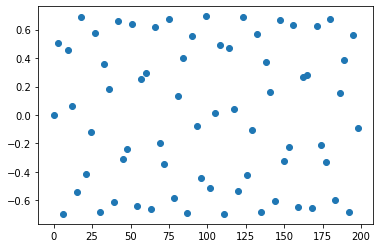

length of x is:  67
length of y is:  67


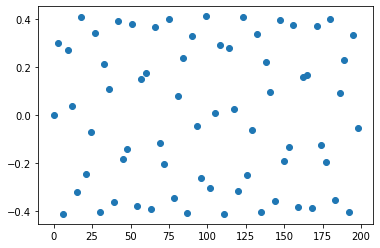

length of x is:  67
length of y is:  67


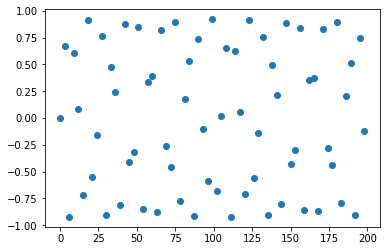

length of x is:  67
length of y is:  67


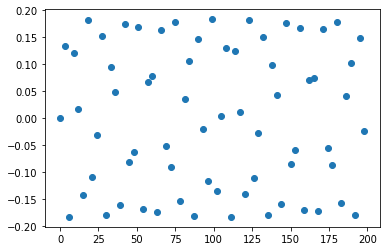

length of x is:  67
length of y is:  67


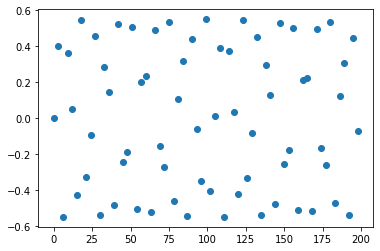

length of x is:  67
length of y is:  67


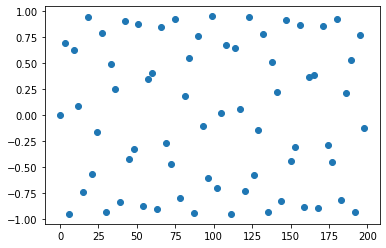

length of x is:  67
length of y is:  67


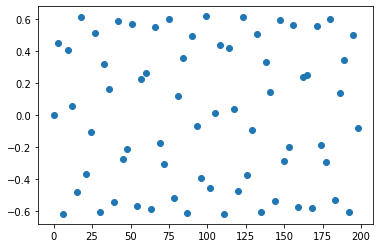

length of x is:  67
length of y is:  67


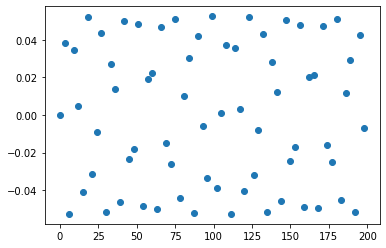

length of x is:  67
length of y is:  67


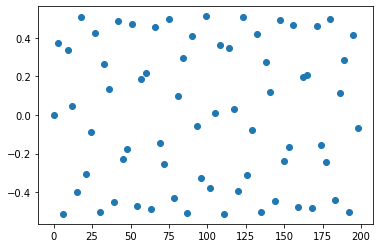

length of x is:  67
length of y is:  67


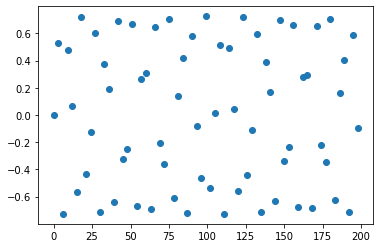

length of x is:  67
length of y is:  67


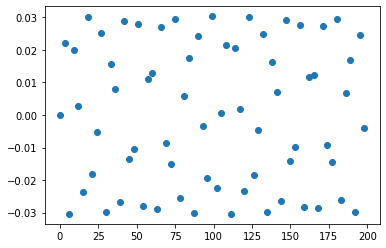

length of x is:  67
length of y is:  67


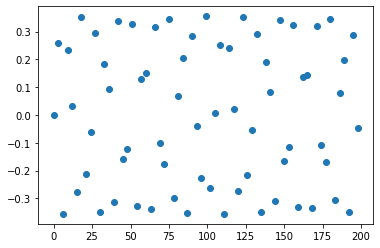

length of x is:  67
length of y is:  67


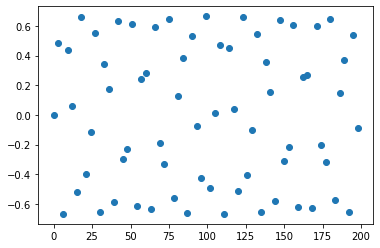

length of x is:  67
length of y is:  67


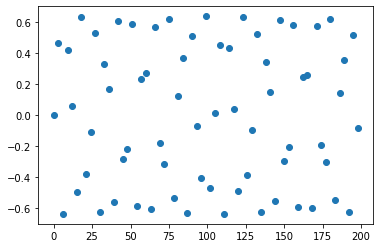

length of x is:  67
length of y is:  67


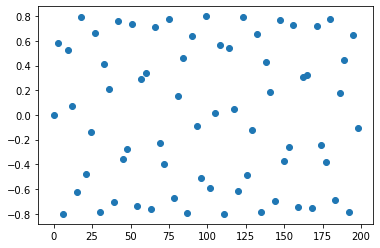

length of x is:  67
length of y is:  67


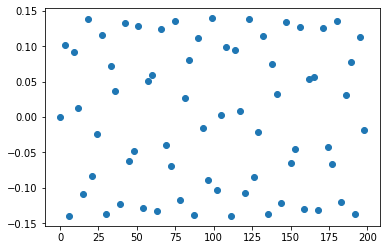

length of x is:  67
length of y is:  67


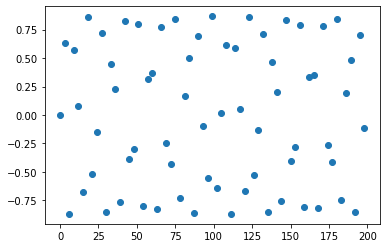

length of x is:  67
length of y is:  67


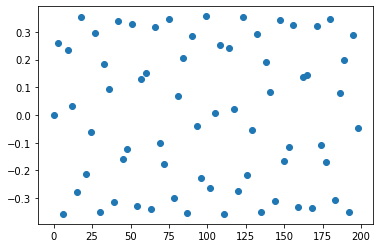

length of x is:  67
length of y is:  67


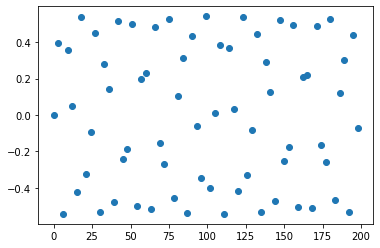

length of x is:  67
length of y is:  67


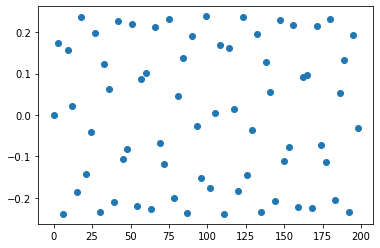

length of x is:  67
length of y is:  67


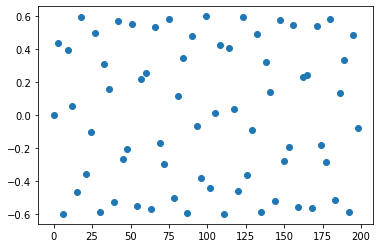

length of x is:  67
length of y is:  67


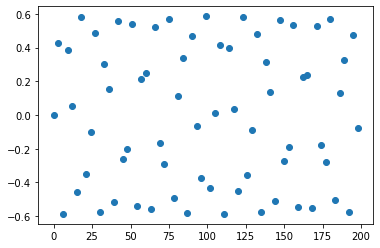

length of x is:  67
length of y is:  67


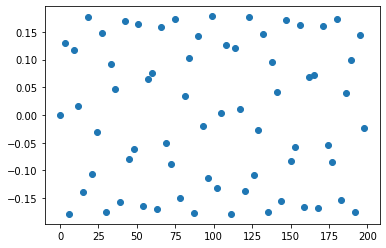

length of x is:  67
length of y is:  67


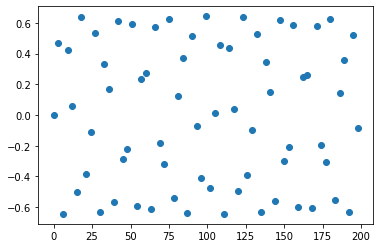

length of x is:  67
length of y is:  67


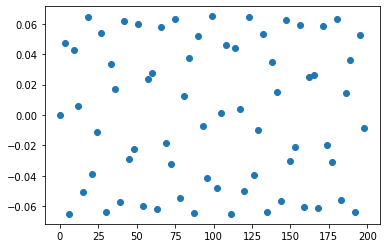

length of x is:  67
length of y is:  67


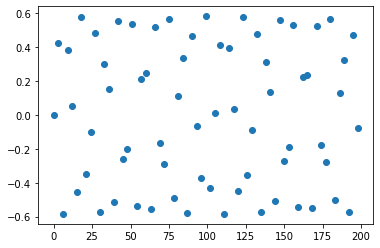

length of x is:  67
length of y is:  67


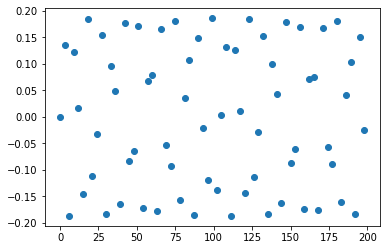

length of x is:  67
length of y is:  67


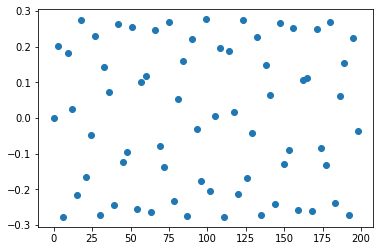

length of x is:  67
length of y is:  67


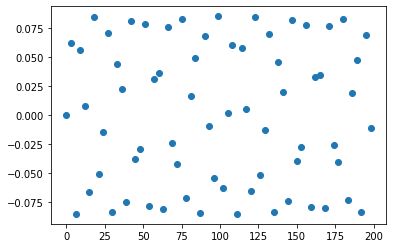

length of x is:  67
length of y is:  67


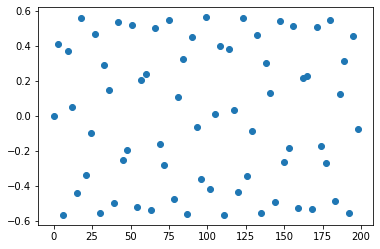

length of x is:  67
length of y is:  67


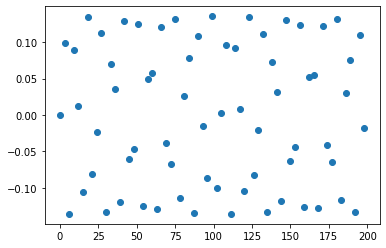

length of x is:  67
length of y is:  67


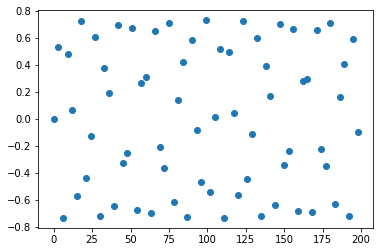

length of x is:  67
length of y is:  67


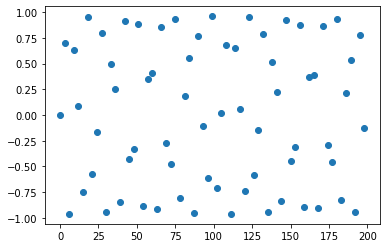

length of x is:  67
length of y is:  67


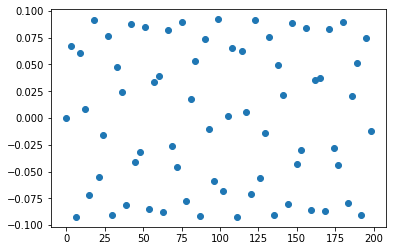

length of x is:  67
length of y is:  67


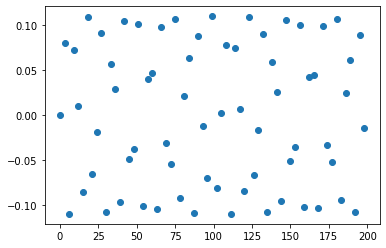

length of x is:  67
length of y is:  67


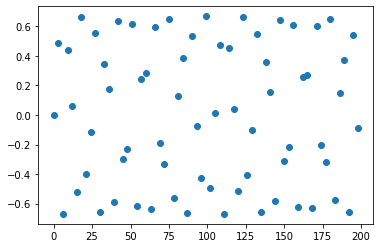

length of x is:  67
length of y is:  67


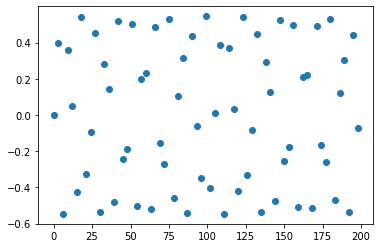

length of x is:  67
length of y is:  67


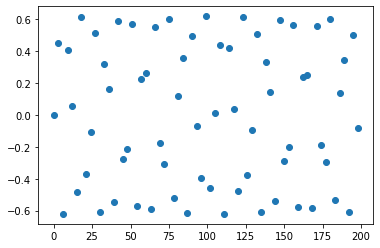

length of x is:  67
length of y is:  67


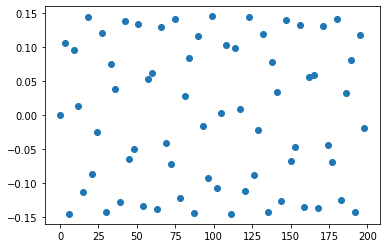

length of x is:  67
length of y is:  67


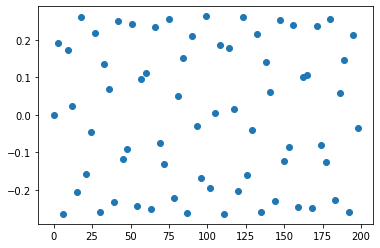

length of x is:  67
length of y is:  67


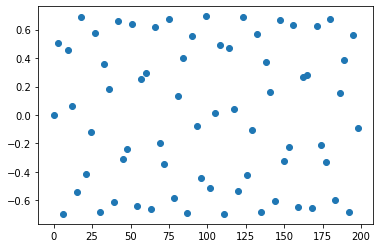

length of x is:  67
length of y is:  67


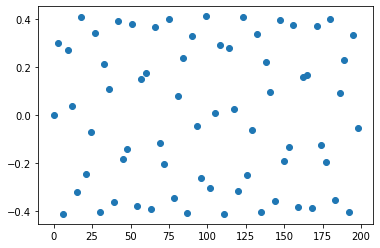

length of x is:  67
length of y is:  67


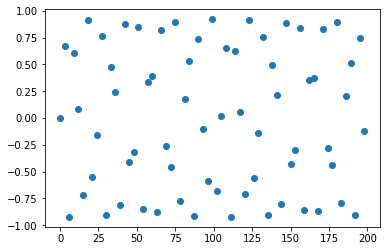

length of x is:  67
length of y is:  67


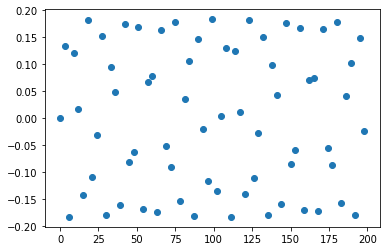

length of x is:  67
length of y is:  67


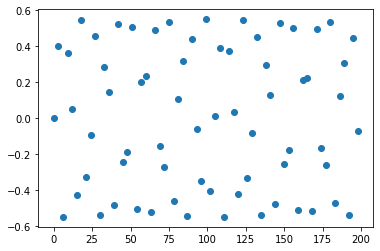

length of x is:  67
length of y is:  67


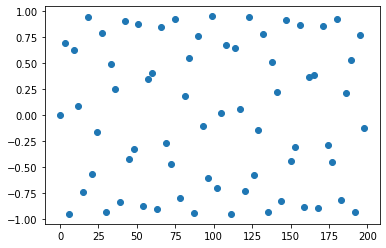

length of x is:  67
length of y is:  67


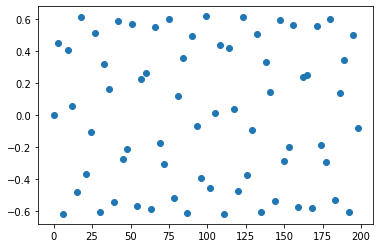

length of x is:  67
length of y is:  67


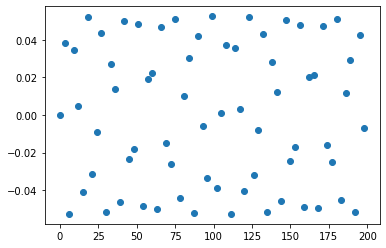

length of x is:  67
length of y is:  67


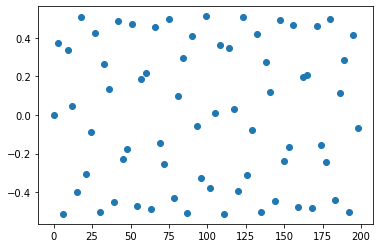

length of x is:  67
length of y is:  67


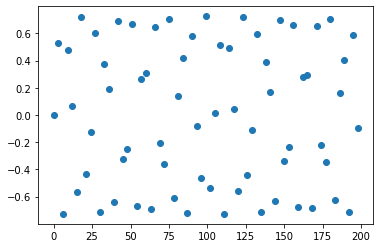

length of x is:  67
length of y is:  67


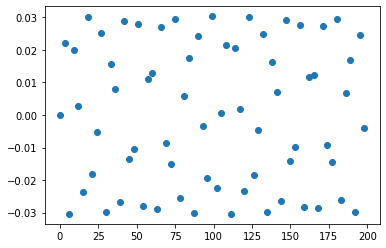

length of x is:  67
length of y is:  67


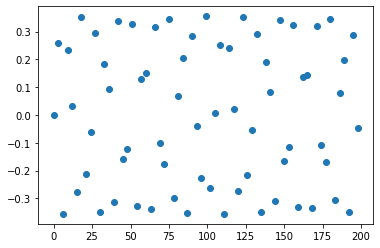

length of x is:  67
length of y is:  67


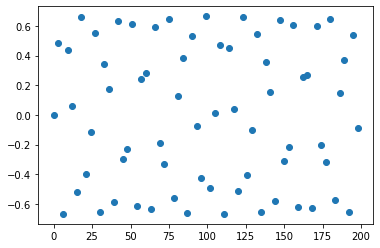

length of x is:  67
length of y is:  67


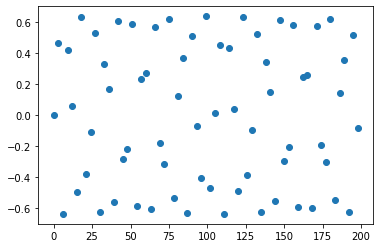

length of x is:  67
length of y is:  67


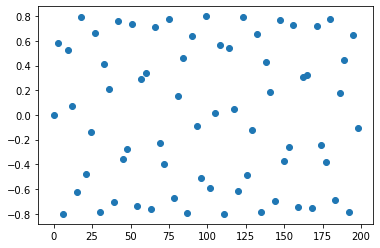

length of x is:  67
length of y is:  67


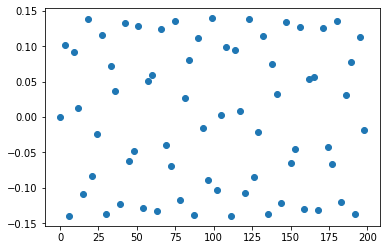

length of x is:  67
length of y is:  67


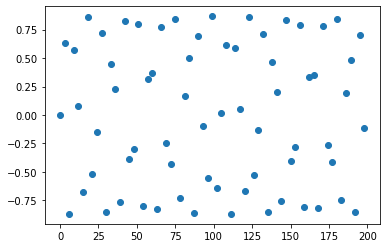

length of x is:  67
length of y is:  67


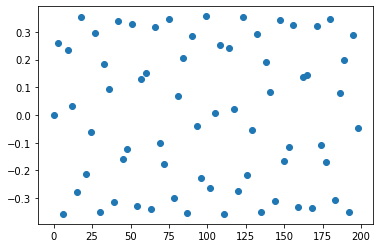

length of x is:  67
length of y is:  67


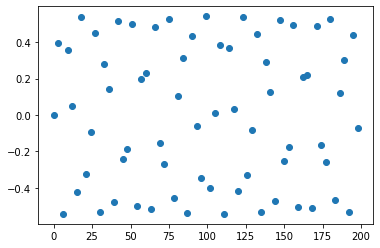

length of x is:  67
length of y is:  67


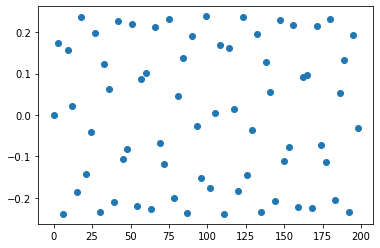

length of x is:  67
length of y is:  67


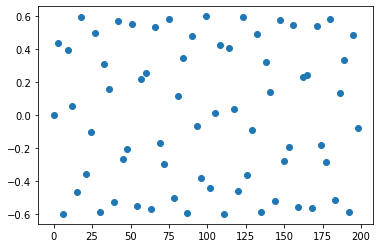

length of x is:  67
length of y is:  67


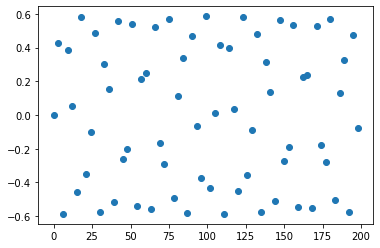

length of x is:  67
length of y is:  67


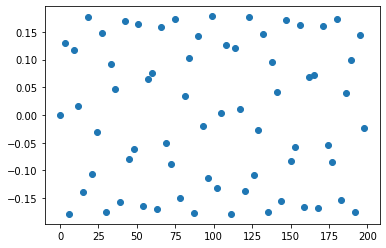

length of x is:  67
length of y is:  67


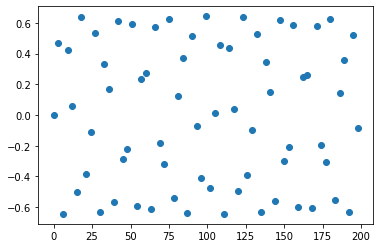

length of x is:  67
length of y is:  67


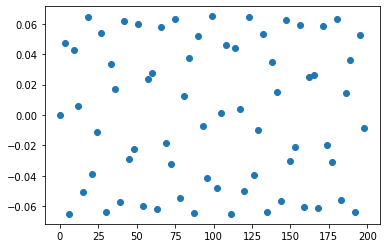

length of x is:  67
length of y is:  67


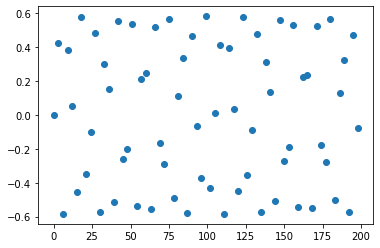

length of x is:  67
length of y is:  67


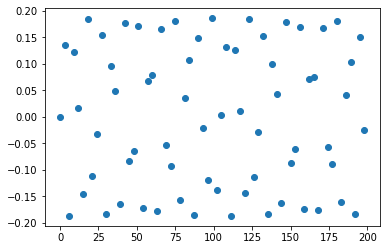

length of x is:  67
length of y is:  67


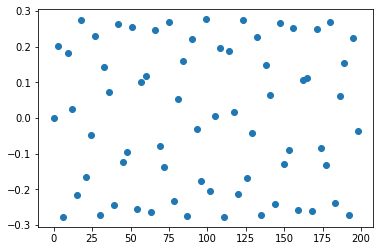

length of x is:  67
length of y is:  67


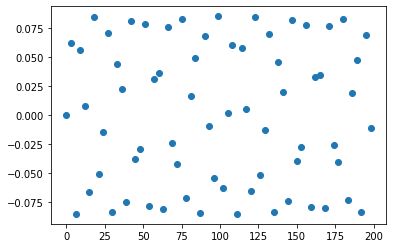

length of x is:  67
length of y is:  67


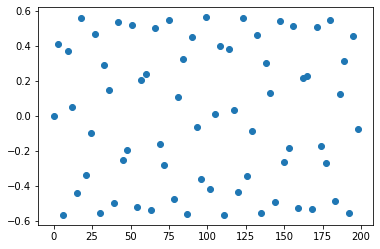

length of x is:  67
length of y is:  67


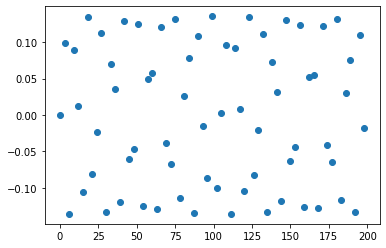

length of x is:  67
length of y is:  67


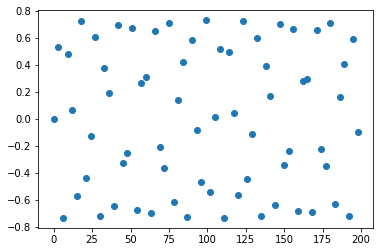

length of x is:  67
length of y is:  67


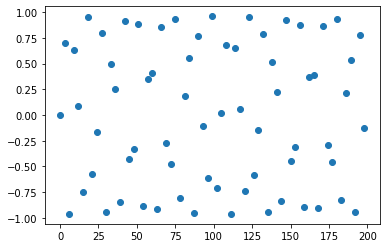

length of x is:  67
length of y is:  67


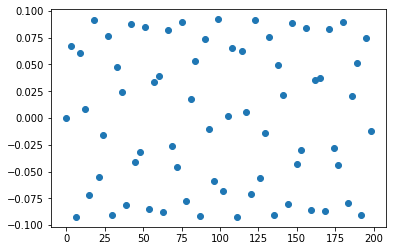

length of x is:  67
length of y is:  67


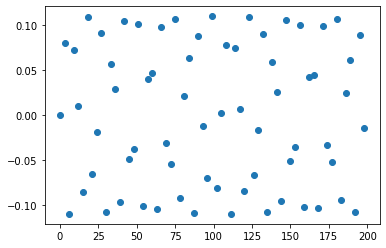

length of x is:  67
length of y is:  67


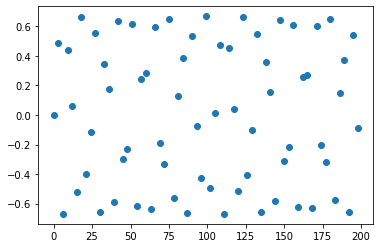

length of x is:  67
length of y is:  67


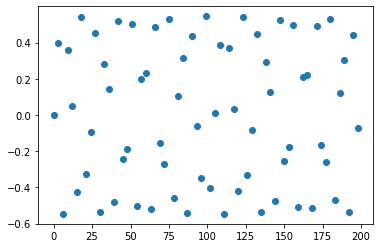

length of x is:  67
length of y is:  67


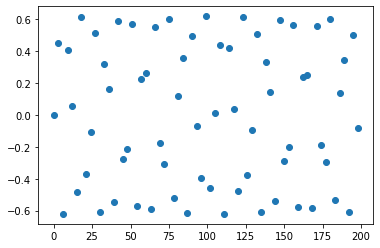

length of x is:  67
length of y is:  67


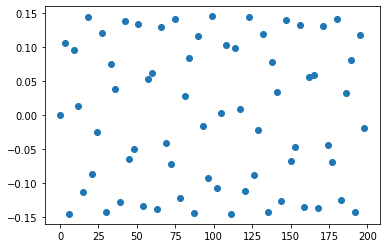

length of x is:  67
length of y is:  67


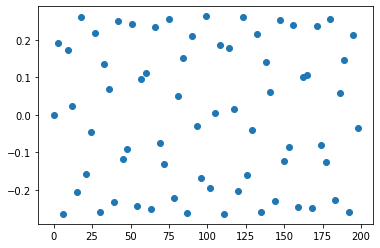

length of x is:  67
length of y is:  67


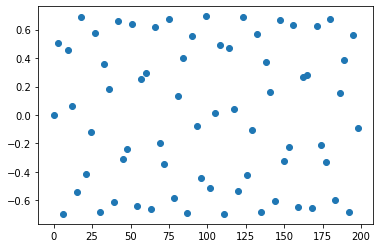

length of x is:  67
length of y is:  67


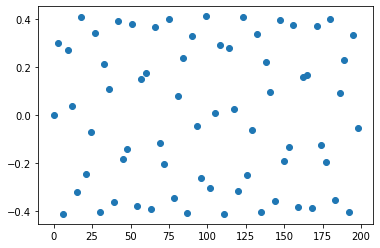

length of x is:  67
length of y is:  67


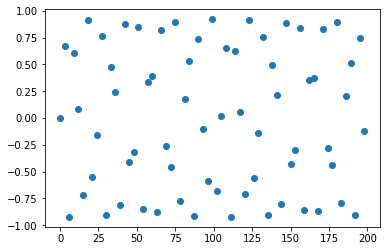

length of x is:  67
length of y is:  67


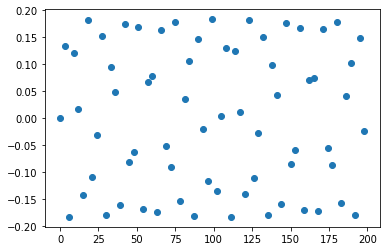

length of x is:  67
length of y is:  67


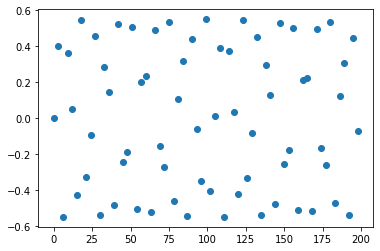

length of x is:  67
length of y is:  67


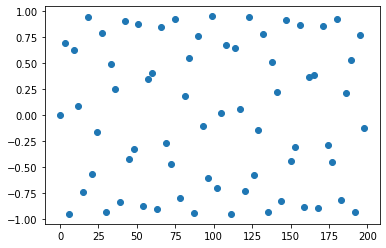

length of x is:  67
length of y is:  67


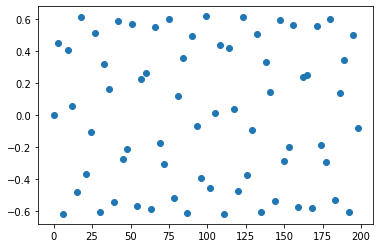

length of x is:  67
length of y is:  67


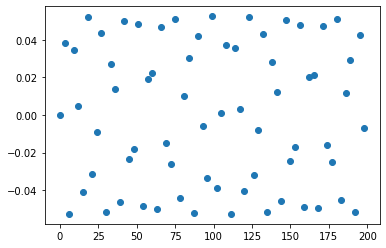

length of x is:  67
length of y is:  67


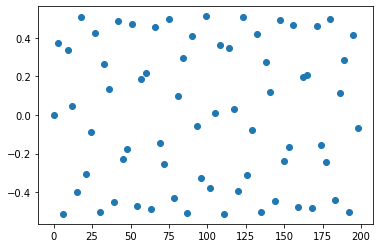

length of x is:  67
length of y is:  67


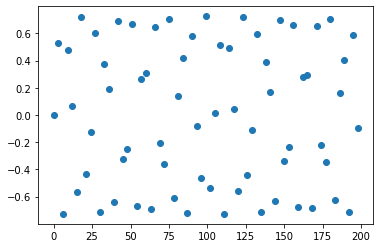

length of x is:  67
length of y is:  67


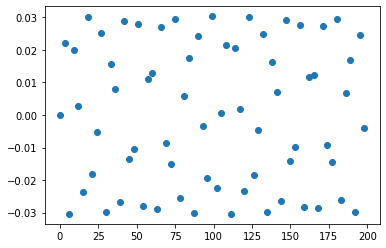

length of x is:  67
length of y is:  67


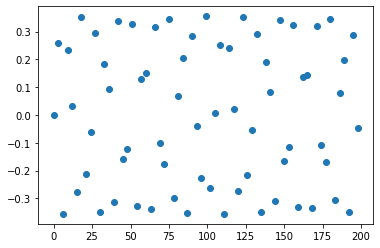

length of x is:  67
length of y is:  67


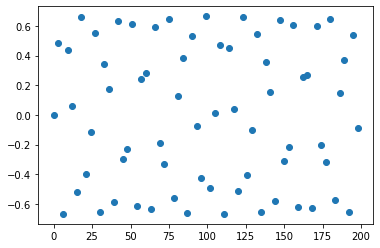

length of x is:  67
length of y is:  67


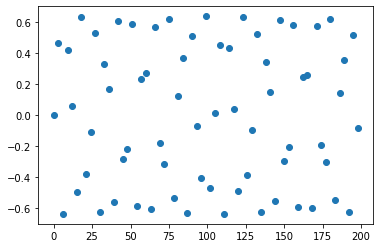

length of x is:  67
length of y is:  67


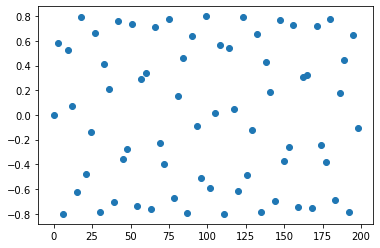

length of x is:  67
length of y is:  67


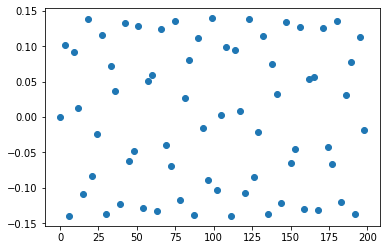

length of x is:  67
length of y is:  67


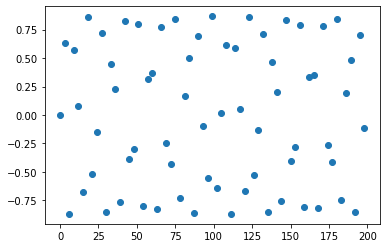

length of x is:  67
length of y is:  67


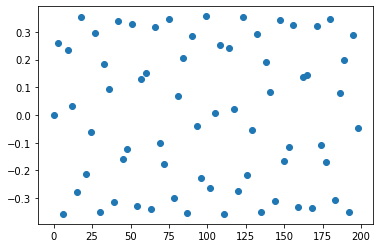

length of x is:  67
length of y is:  67


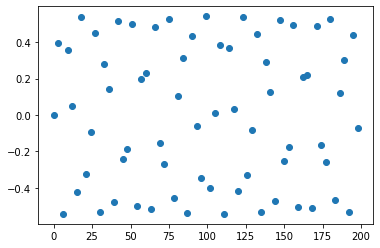

length of x is:  67
length of y is:  67


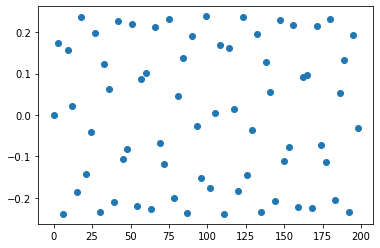

length of x is:  67
length of y is:  67


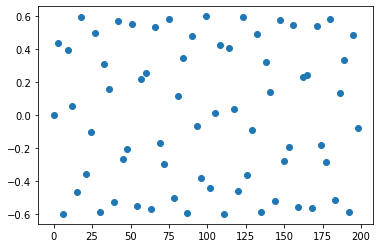

length of x is:  67
length of y is:  67


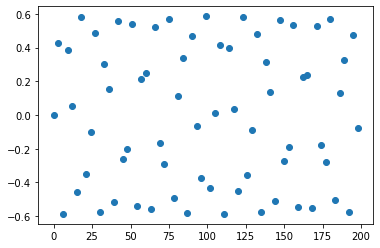

length of x is:  67
length of y is:  67


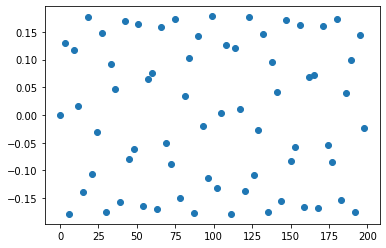

length of x is:  67
length of y is:  67


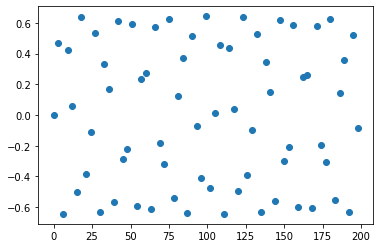

length of x is:  67
length of y is:  67


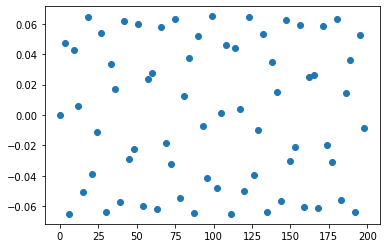

length of x is:  67
length of y is:  67


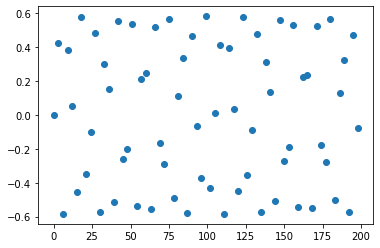

length of x is:  67
length of y is:  67


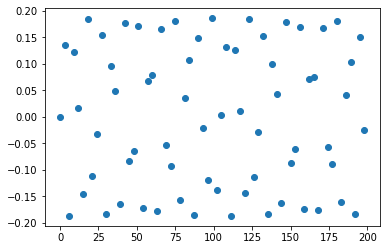

length of x is:  67
length of y is:  67


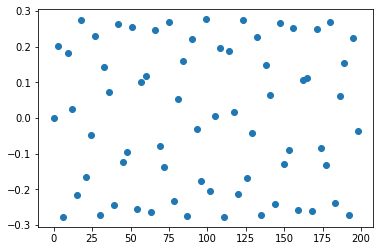

length of x is:  67
length of y is:  67


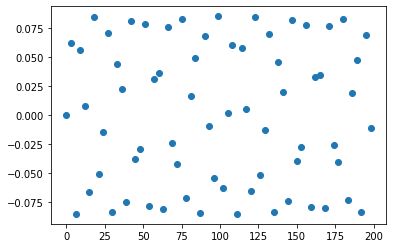

length of x is:  67
length of y is:  67


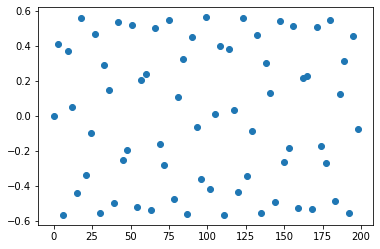

length of x is:  67
length of y is:  67


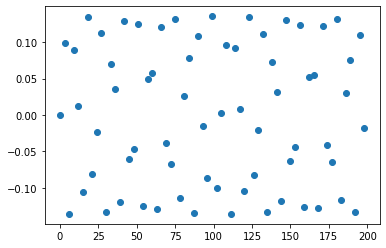

length of x is:  67
length of y is:  67


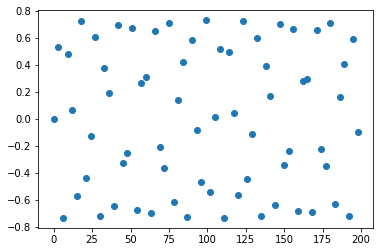

length of x is:  67
length of y is:  67


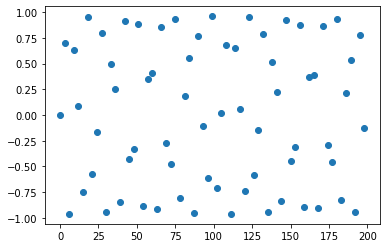

length of x is:  67
length of y is:  67


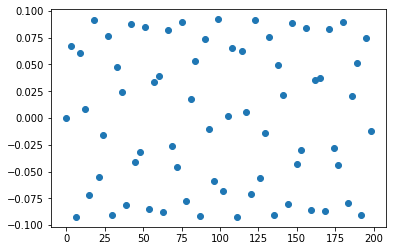

length of x is:  67
length of y is:  67


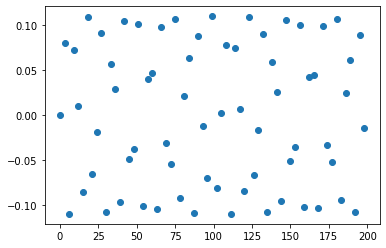

length of x is:  67
length of y is:  67


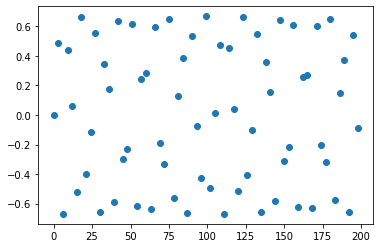

length of x is:  67
length of y is:  67


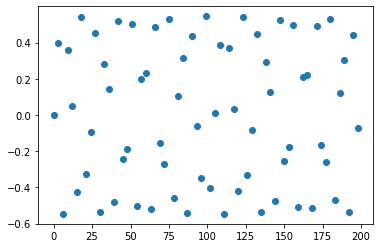

length of x is:  67
length of y is:  67


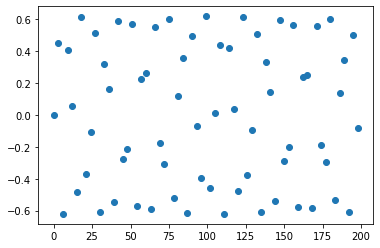

length of x is:  67
length of y is:  67


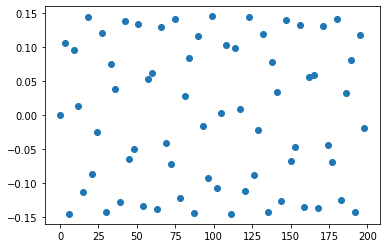

length of x is:  67
length of y is:  67


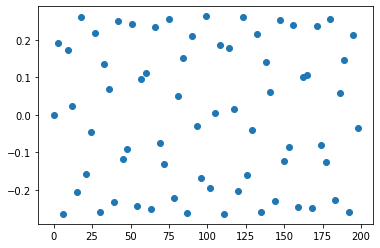

length of x is:  67
length of y is:  67


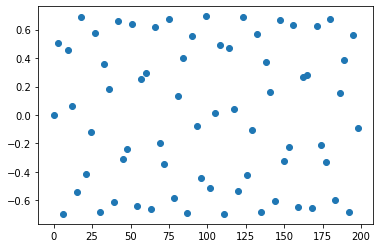

length of x is:  67
length of y is:  67


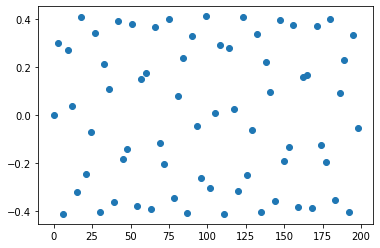

length of x is:  67
length of y is:  67


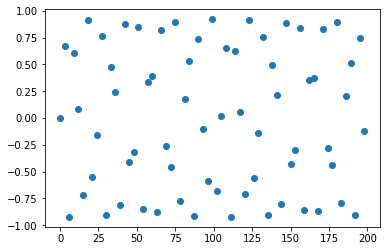

length of x is:  67
length of y is:  67


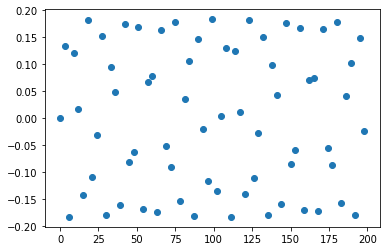

length of x is:  67
length of y is:  67


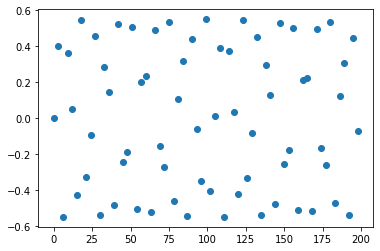

length of x is:  67
length of y is:  67


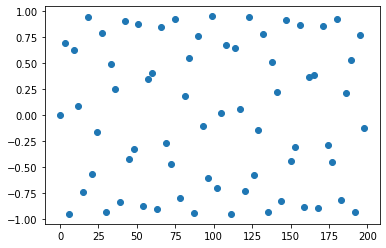

length of x is:  67
length of y is:  67


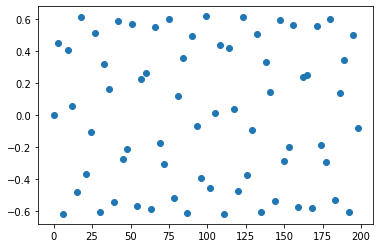

length of x is:  67
length of y is:  67


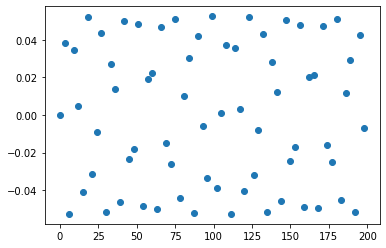

length of x is:  67
length of y is:  67


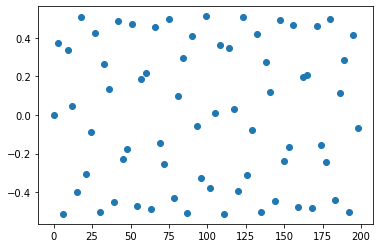

length of x is:  67
length of y is:  67


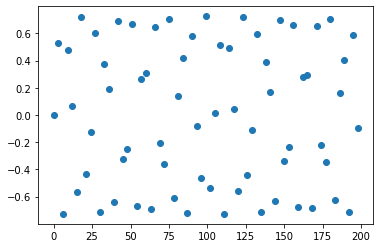

length of x is:  67
length of y is:  67


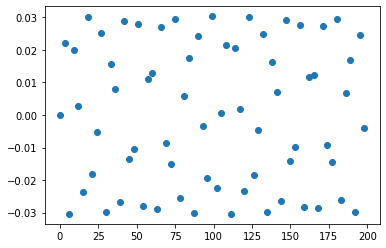

length of x is:  67
length of y is:  67


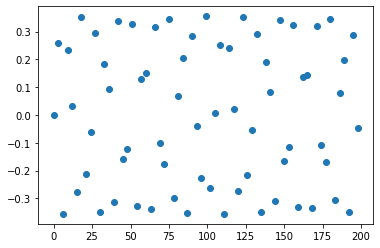

length of x is:  67
length of y is:  67


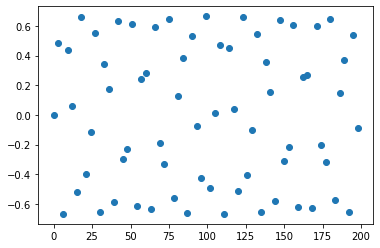

length of x is:  67
length of y is:  67


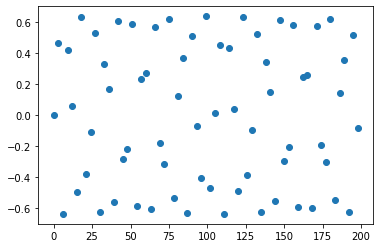

length of x is:  67
length of y is:  67


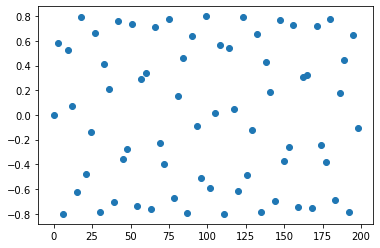

length of x is:  67
length of y is:  67


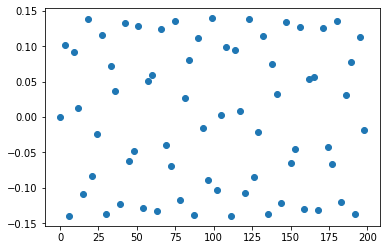

length of x is:  67
length of y is:  67


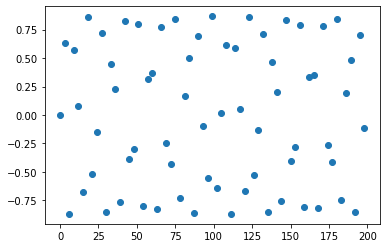

length of x is:  67
length of y is:  67


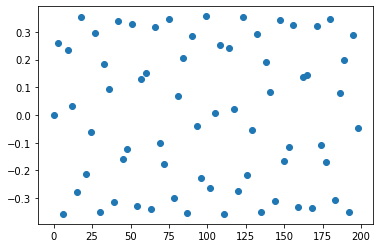

length of x is:  67
length of y is:  67


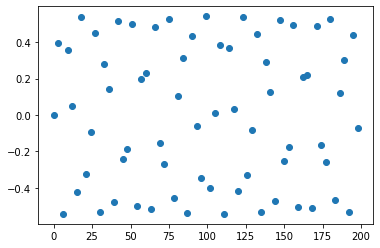

length of x is:  67
length of y is:  67


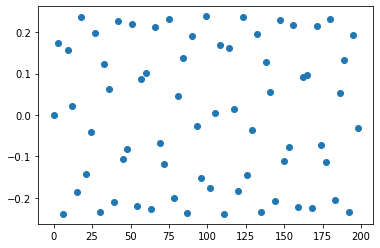

length of x is:  67
length of y is:  67


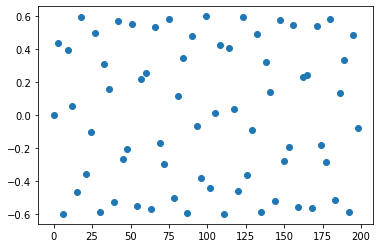

length of x is:  67
length of y is:  67


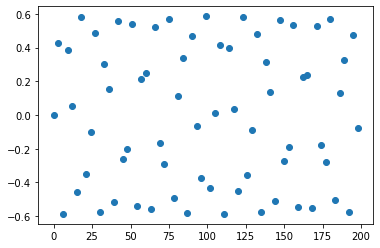

length of x is:  67
length of y is:  67


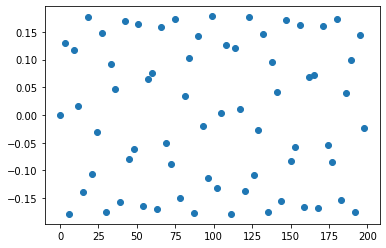

length of x is:  67
length of y is:  67


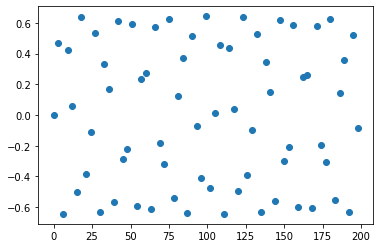

length of x is:  67
length of y is:  67


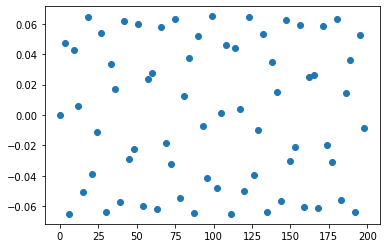

length of x is:  67
length of y is:  67


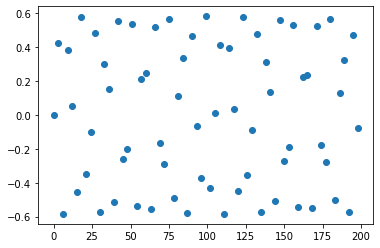

length of x is:  67
length of y is:  67


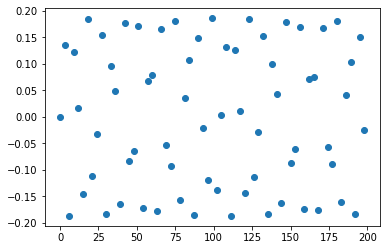

length of x is:  67
length of y is:  67


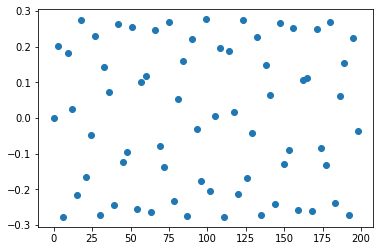

length of x is:  67
length of y is:  67


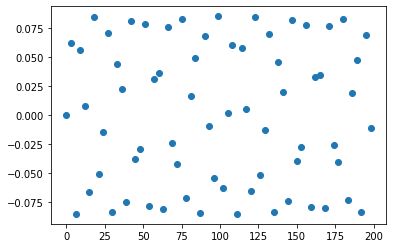

length of x is:  67
length of y is:  67


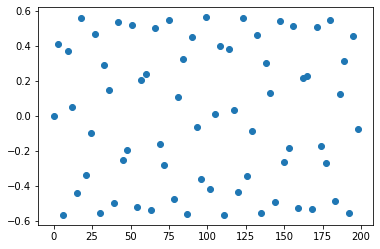

length of x is:  67
length of y is:  67


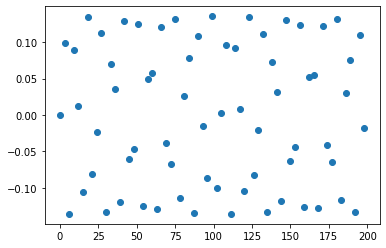

length of x is:  67
length of y is:  67


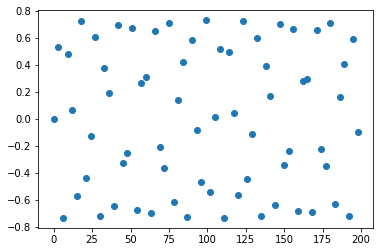

length of x is:  67
length of y is:  67


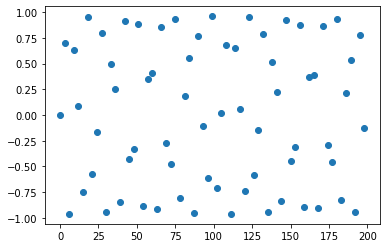

length of x is:  67
length of y is:  67


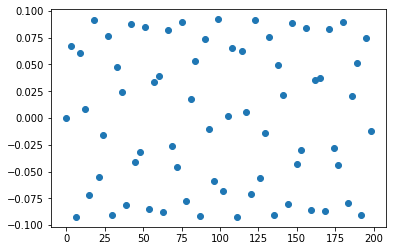

length of x is:  67
length of y is:  67


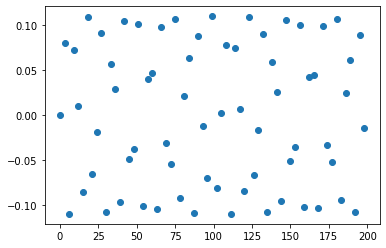

length of x is:  67
length of y is:  67


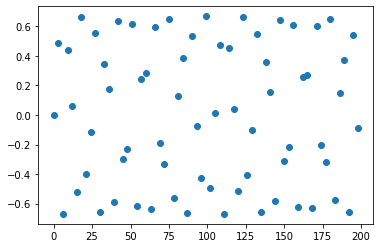

length of x is:  67
length of y is:  67


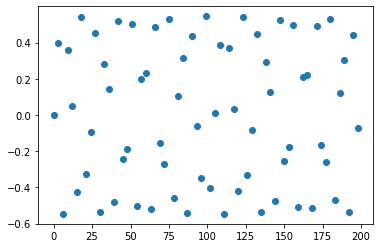

length of x is:  67
length of y is:  67


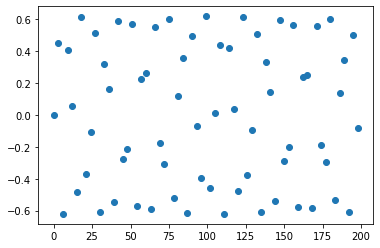

length of x is:  67
length of y is:  67


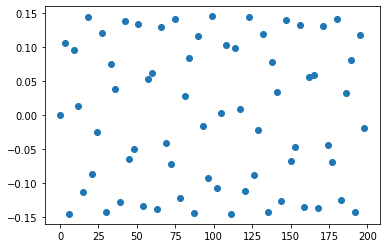

length of x is:  67
length of y is:  67


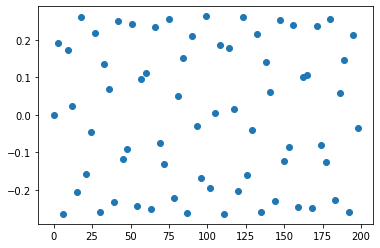

length of x is:  67
length of y is:  67


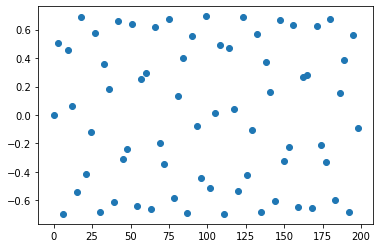

length of x is:  67
length of y is:  67


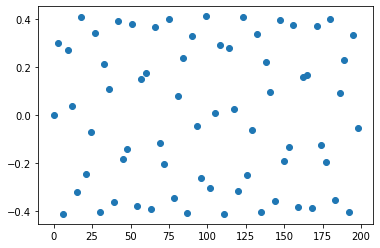

length of x is:  67
length of y is:  67


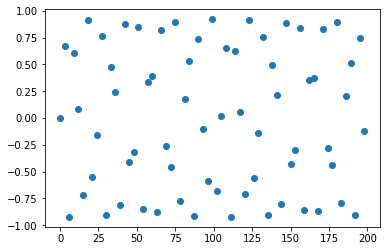

length of x is:  67
length of y is:  67


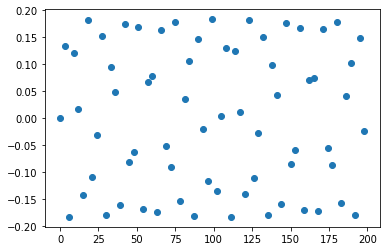

length of x is:  67
length of y is:  67


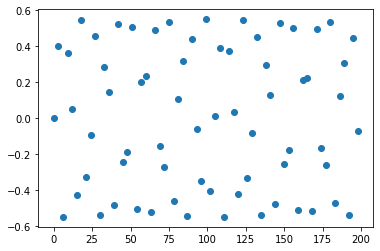

length of x is:  67
length of y is:  67


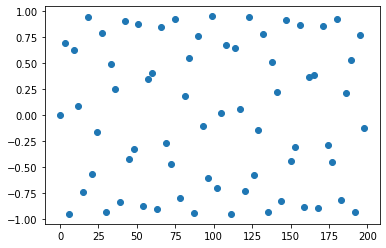

length of x is:  67
length of y is:  67


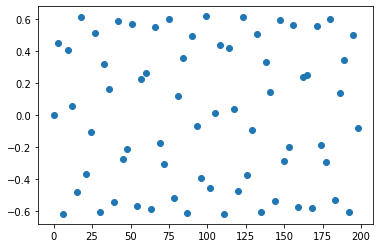

length of x is:  67
length of y is:  67


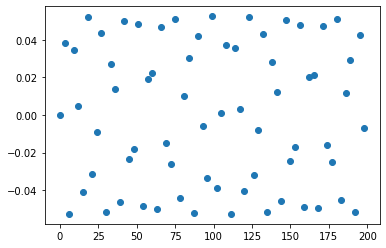

length of x is:  67
length of y is:  67


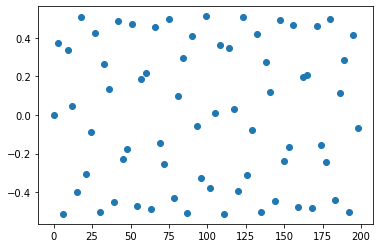

length of x is:  67
length of y is:  67


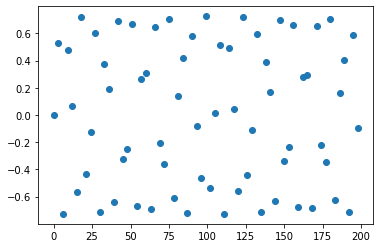

length of x is:  67
length of y is:  67


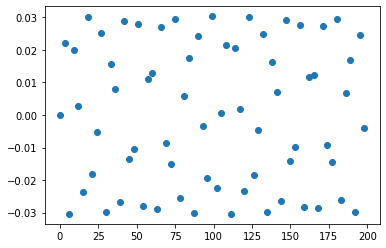

length of x is:  67
length of y is:  67


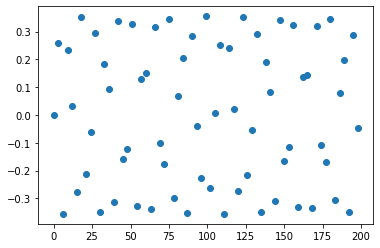

length of x is:  67
length of y is:  67


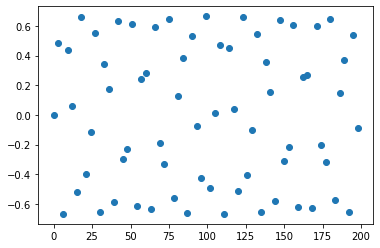

length of x is:  67
length of y is:  67


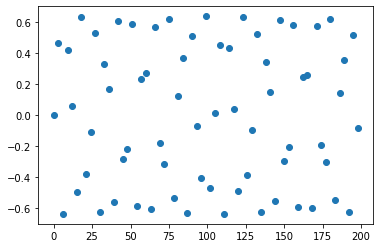

length of x is:  67
length of y is:  67


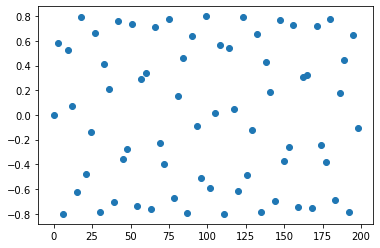

length of x is:  67
length of y is:  67


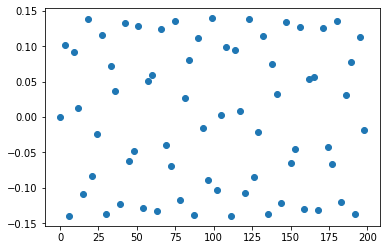

length of x is:  67
length of y is:  67


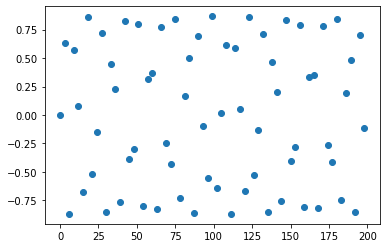

length of x is:  67
length of y is:  67


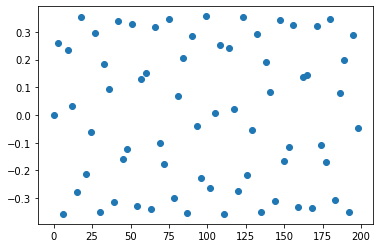

length of x is:  67
length of y is:  67


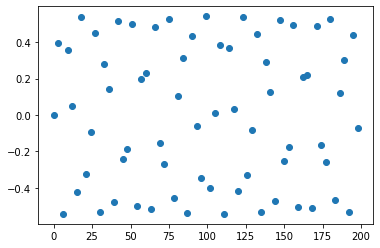

length of x is:  67
length of y is:  67


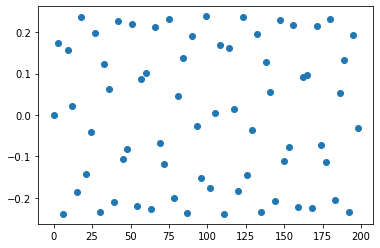

length of x is:  67
length of y is:  67


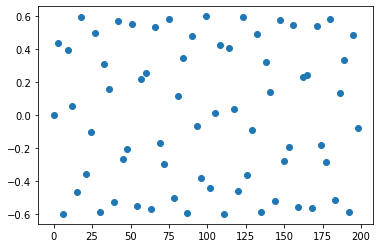

length of x is:  67
length of y is:  67


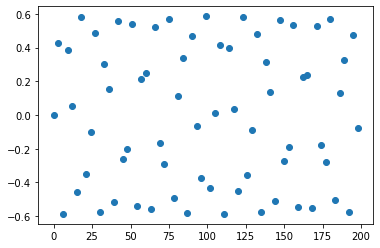

length of x is:  67
length of y is:  67


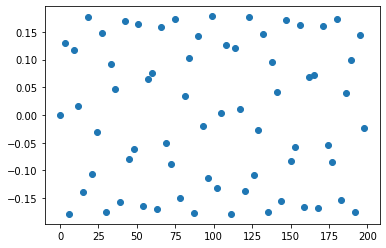

length of x is:  67
length of y is:  67


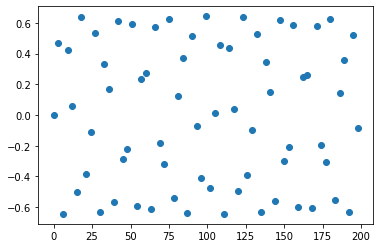

length of x is:  67
length of y is:  67


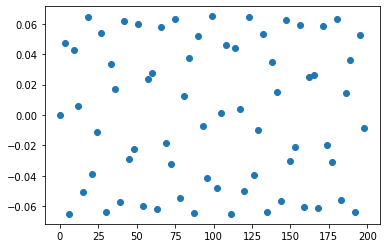

length of x is:  67
length of y is:  67


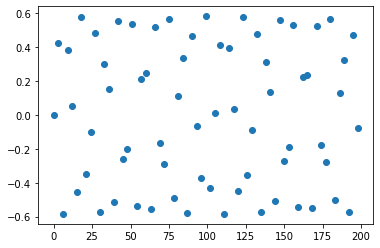

length of x is:  67
length of y is:  67


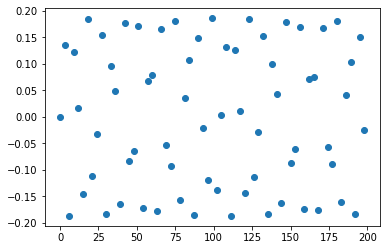

length of x is:  67
length of y is:  67


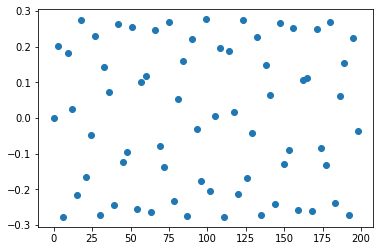

length of x is:  67
length of y is:  67


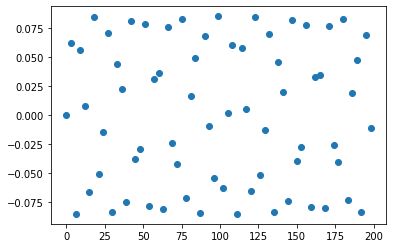

length of x is:  67
length of y is:  67


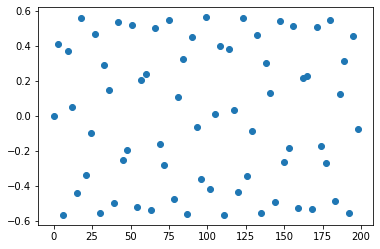

length of x is:  67
length of y is:  67


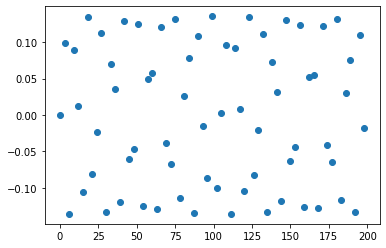

length of x is:  67
length of y is:  67


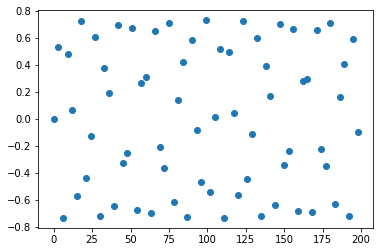

length of x is:  67
length of y is:  67


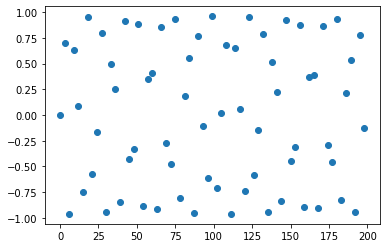

length of x is:  67
length of y is:  67


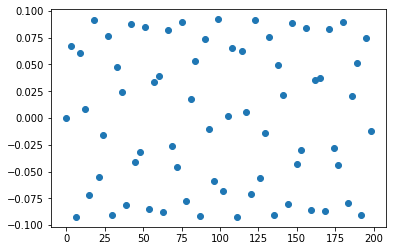

length of x is:  67
length of y is:  67


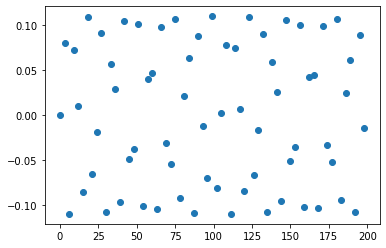

length of x is:  67
length of y is:  67


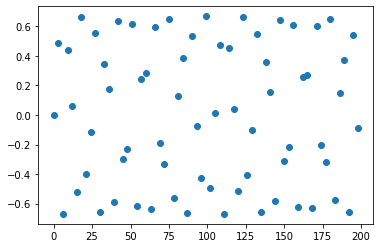

length of x is:  67
length of y is:  67


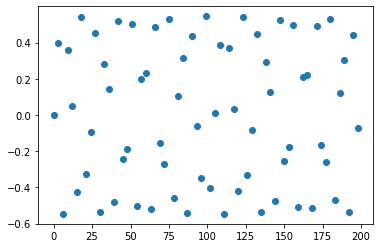

length of x is:  67
length of y is:  67


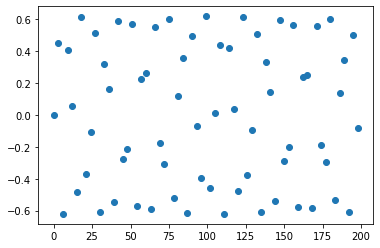

length of x is:  67
length of y is:  67


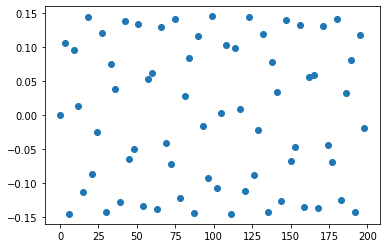

length of x is:  67
length of y is:  67


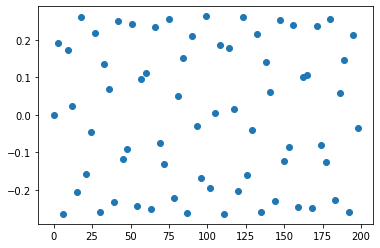

length of x is:  67
length of y is:  67


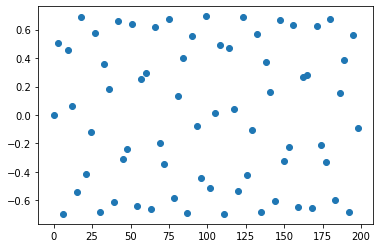

length of x is:  67
length of y is:  67


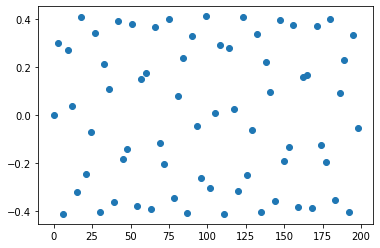

length of x is:  67
length of y is:  67


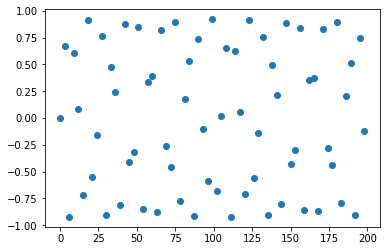

length of x is:  67
length of y is:  67


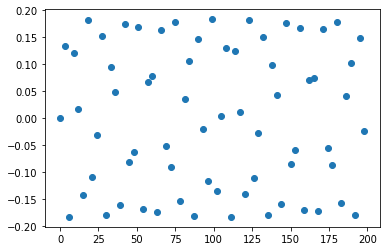

length of x is:  67
length of y is:  67


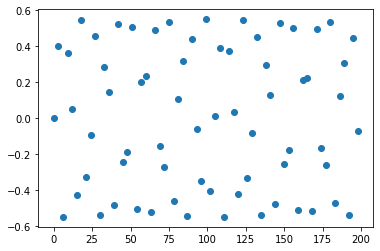

length of x is:  67
length of y is:  67


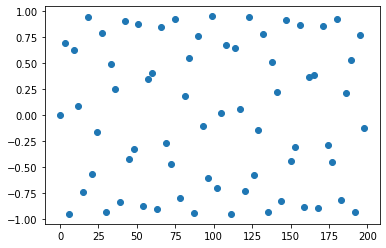

length of x is:  67
length of y is:  67


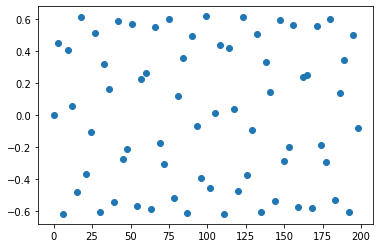

length of x is:  67
length of y is:  67


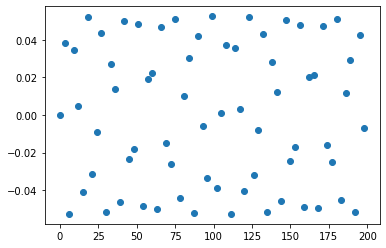

length of x is:  67
length of y is:  67


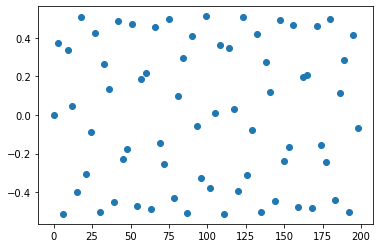

length of x is:  67
length of y is:  67


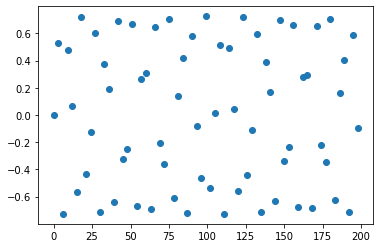

length of x is:  67
length of y is:  67


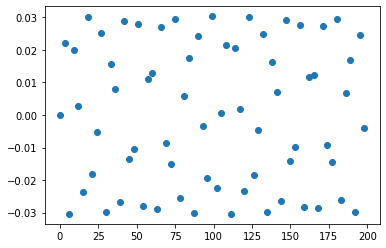

length of x is:  67
length of y is:  67


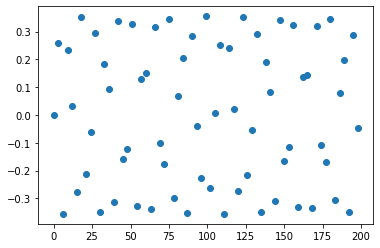

length of x is:  67
length of y is:  67


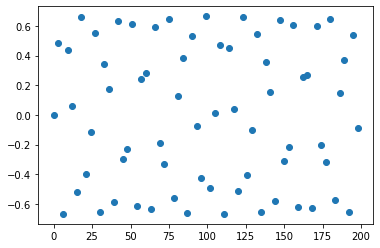

length of x is:  67
length of y is:  67


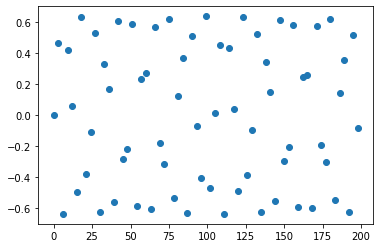

length of x is:  67
length of y is:  67


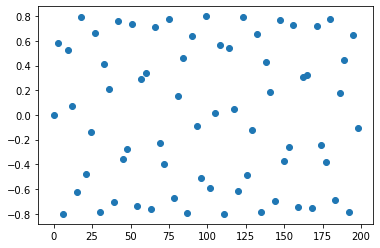

length of x is:  67
length of y is:  67


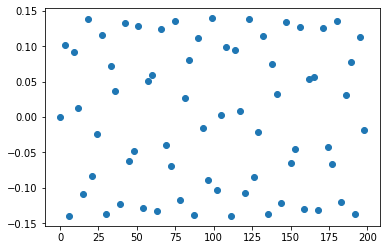

length of x is:  67
length of y is:  67


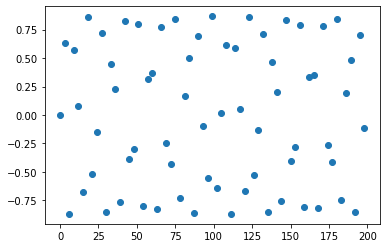

length of x is:  67
length of y is:  67


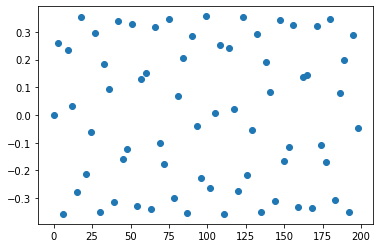

length of x is:  67
length of y is:  67


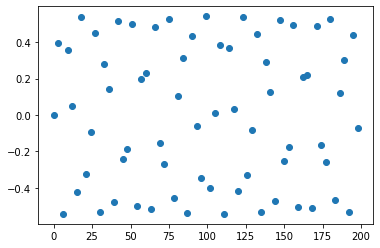

length of x is:  67
length of y is:  67


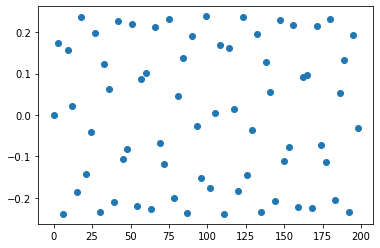

length of x is:  67
length of y is:  67


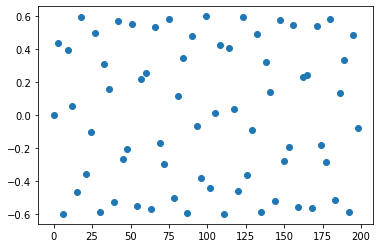

length of x is:  67
length of y is:  67


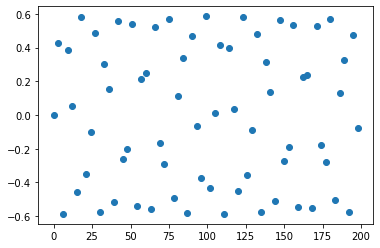

length of x is:  67
length of y is:  67


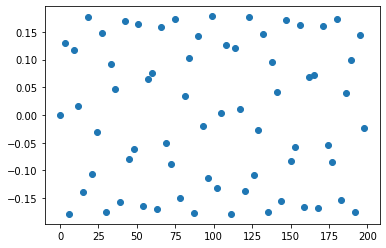

length of x is:  67
length of y is:  67


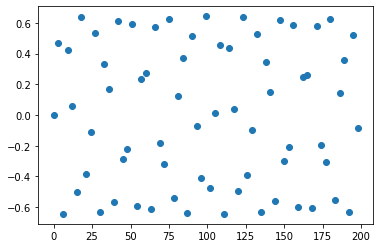

length of x is:  67
length of y is:  67


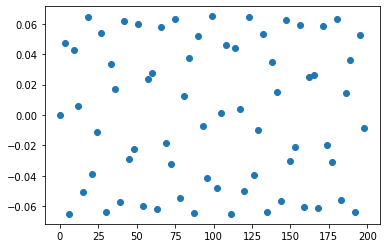

length of x is:  67
length of y is:  67


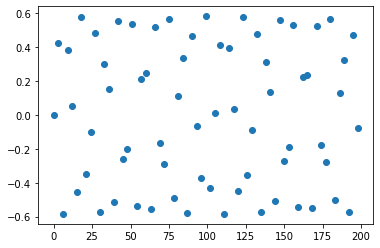

length of x is:  67
length of y is:  67


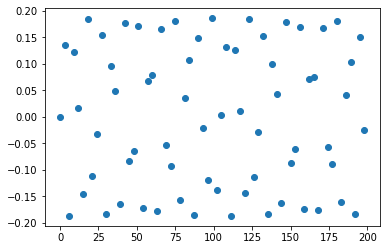

length of x is:  67
length of y is:  67


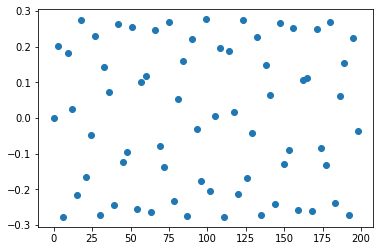

length of x is:  67
length of y is:  67


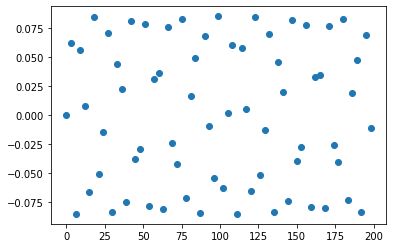

length of x is:  67
length of y is:  67


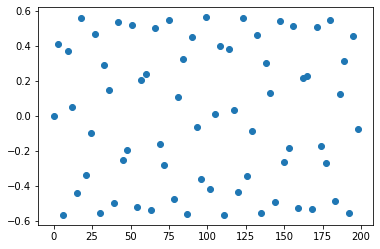

length of x is:  67
length of y is:  67


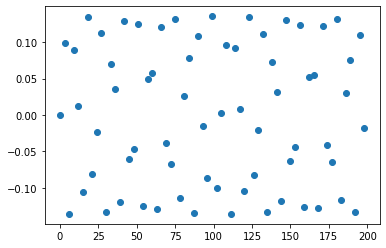

length of x is:  67
length of y is:  67


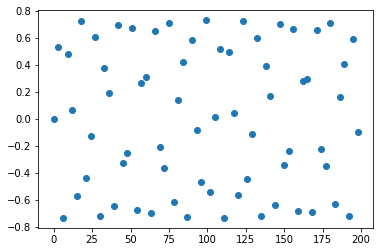

length of x is:  67
length of y is:  67


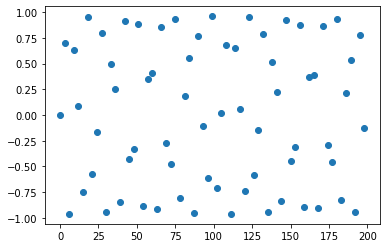

length of x is:  67
length of y is:  67


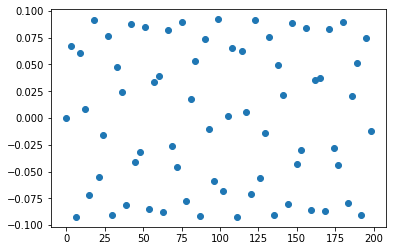

length of x is:  67
length of y is:  67


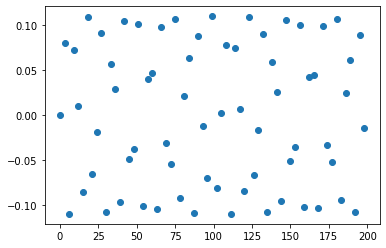

length of x is:  67
length of y is:  67


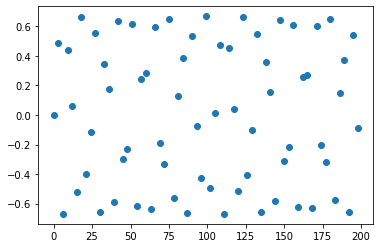

length of x is:  67
length of y is:  67


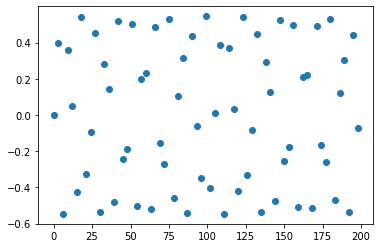

length of x is:  67
length of y is:  67


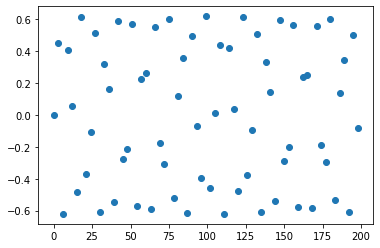

length of x is:  67
length of y is:  67


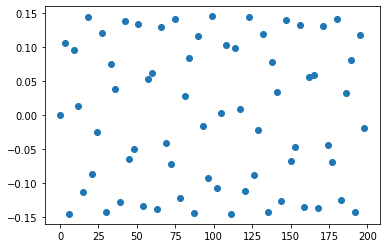

length of x is:  67
length of y is:  67


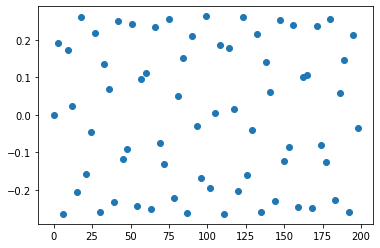

length of x is:  67
length of y is:  67


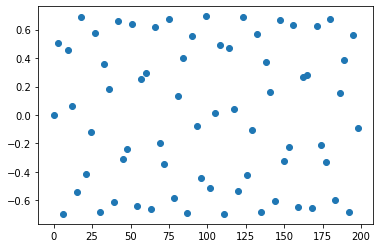

length of x is:  67
length of y is:  67


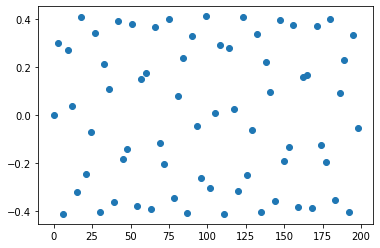

length of x is:  67
length of y is:  67


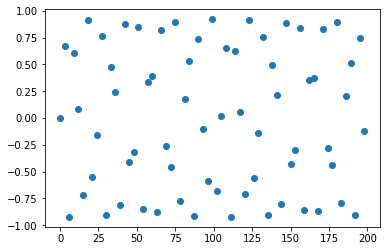

length of x is:  67
length of y is:  67


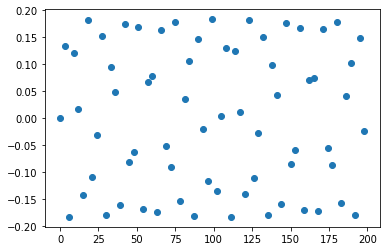

length of x is:  67
length of y is:  67


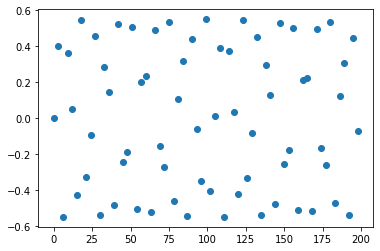

length of x is:  67
length of y is:  67


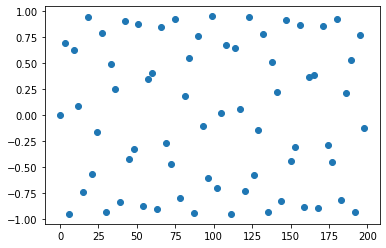

length of x is:  67
length of y is:  67


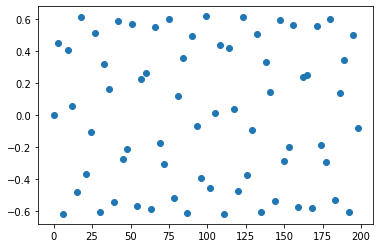

length of x is:  67
length of y is:  67


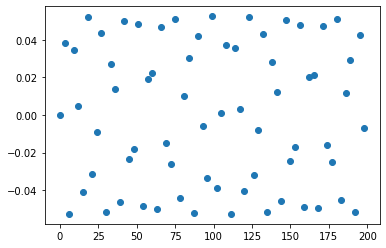

length of x is:  67
length of y is:  67


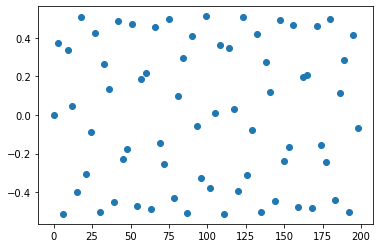

length of x is:  67
length of y is:  67


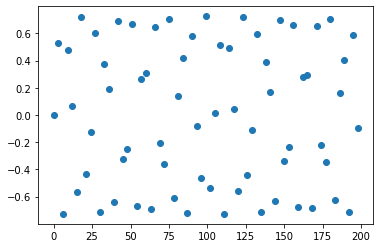

length of x is:  67
length of y is:  67


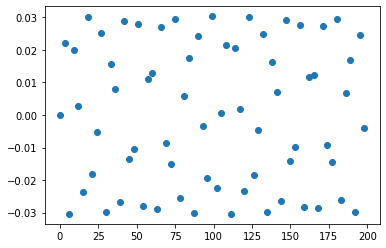

length of x is:  67
length of y is:  67


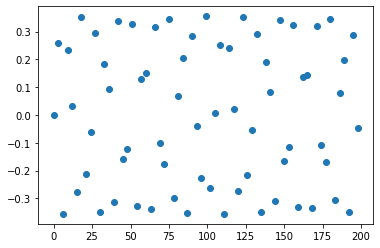

length of x is:  67
length of y is:  67


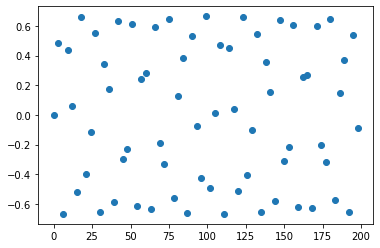

length of x is:  67
length of y is:  67


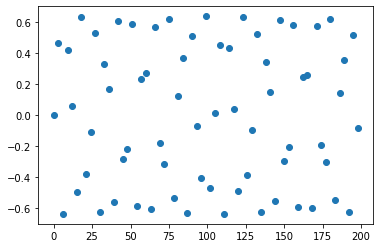

length of x is:  67
length of y is:  67


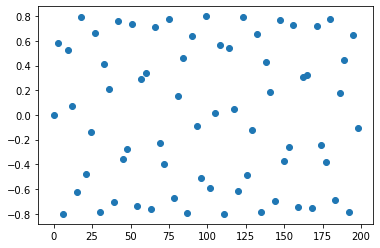

length of x is:  67
length of y is:  67


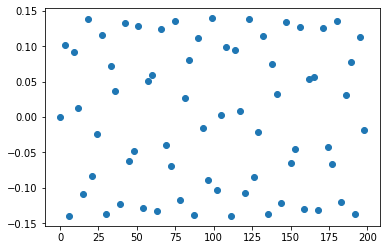

length of x is:  67
length of y is:  67


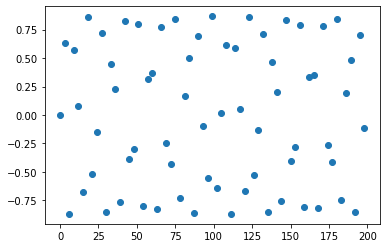

length of x is:  67
length of y is:  67


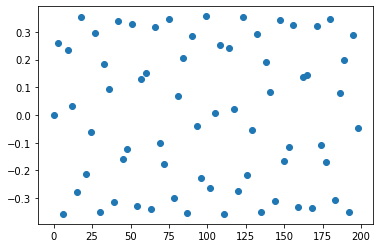

length of x is:  67
length of y is:  67


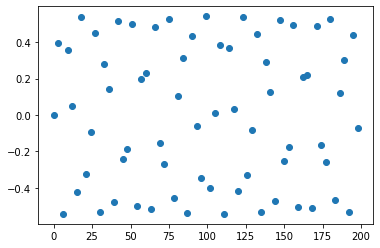

length of x is:  67
length of y is:  67


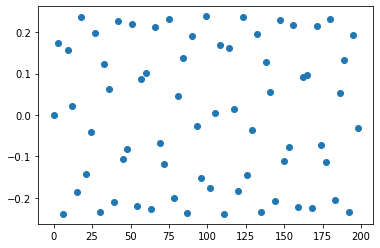

length of x is:  67
length of y is:  67


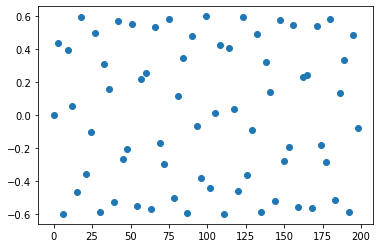

length of x is:  67
length of y is:  67


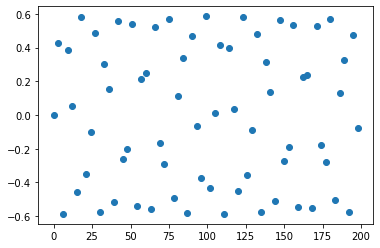

length of x is:  67
length of y is:  67


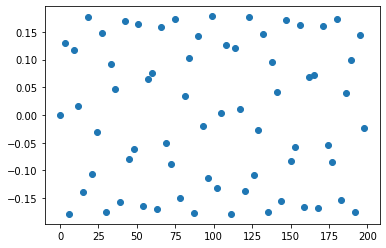

length of x is:  67
length of y is:  67


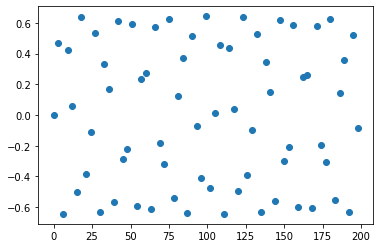

length of x is:  67
length of y is:  67


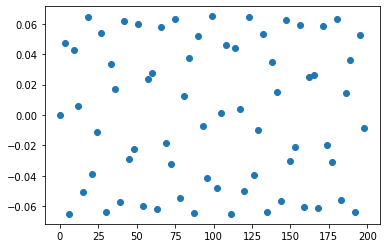

length of x is:  67
length of y is:  67


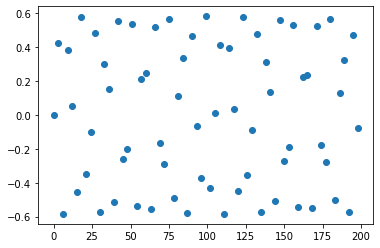

length of x is:  67
length of y is:  67


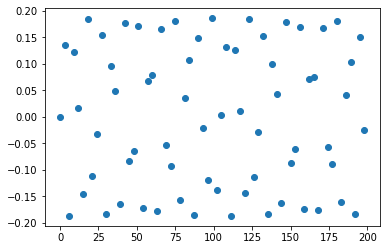

length of x is:  67
length of y is:  67


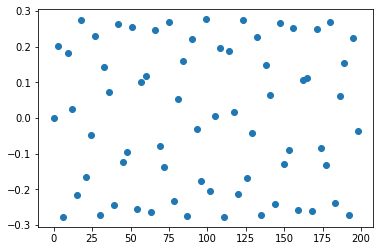

length of x is:  67
length of y is:  67


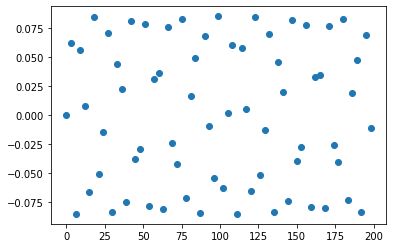

length of x is:  67
length of y is:  67


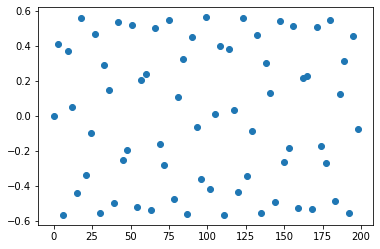

length of x is:  67
length of y is:  67


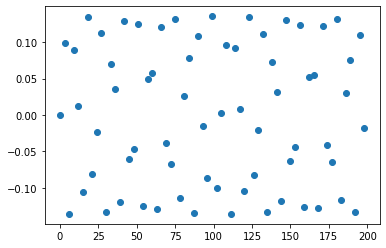

length of x is:  67
length of y is:  67


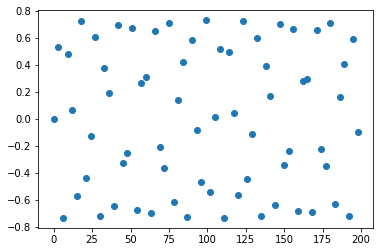

length of x is:  67
length of y is:  67


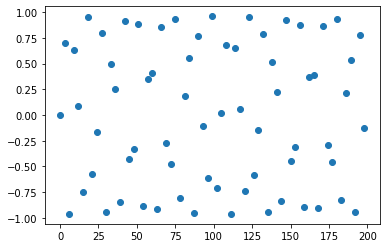

length of x is:  67
length of y is:  67


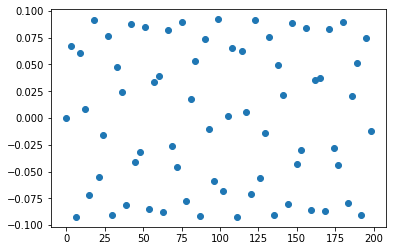

length of x is:  67
length of y is:  67


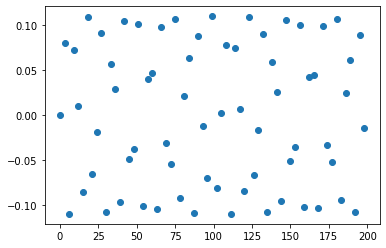

length of x is:  67
length of y is:  67


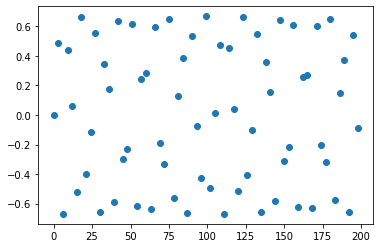

length of x is:  67
length of y is:  67


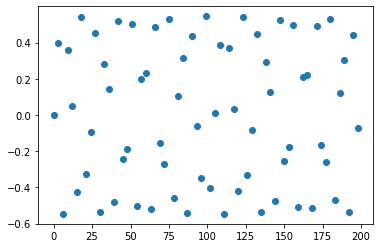

length of x is:  67
length of y is:  67


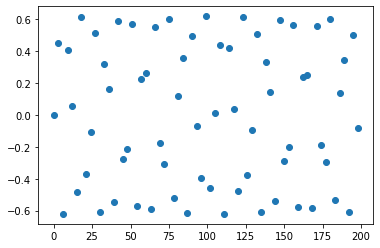

length of x is:  67
length of y is:  67


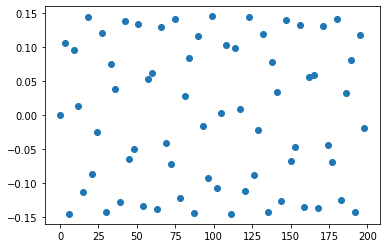

length of x is:  67
length of y is:  67


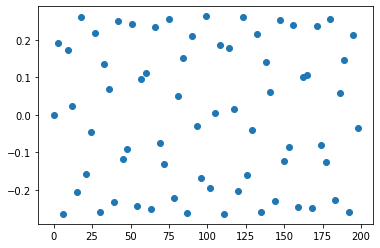

length of x is:  67
length of y is:  67


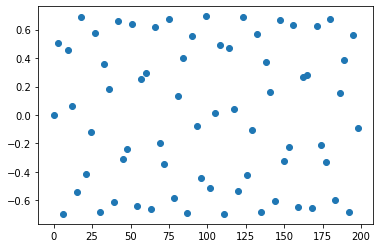

length of x is:  67
length of y is:  67


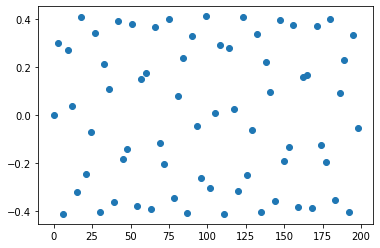

length of x is:  67
length of y is:  67


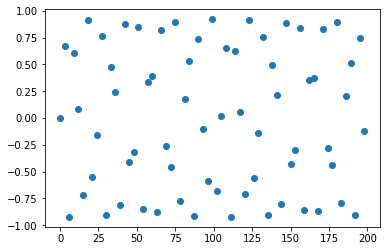

length of x is:  67
length of y is:  67


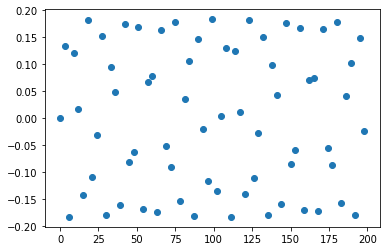

length of x is:  67
length of y is:  67


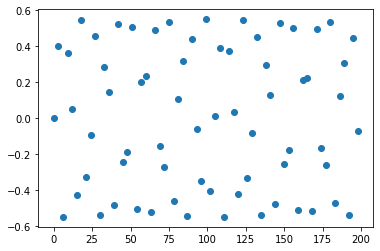

length of x is:  67
length of y is:  67


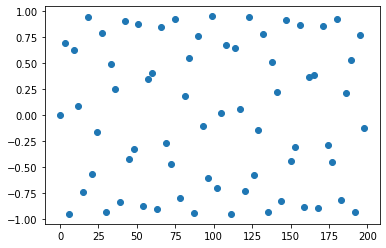

length of x is:  67
length of y is:  67


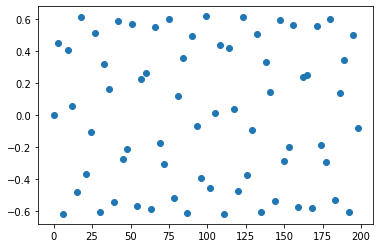

length of x is:  67
length of y is:  67


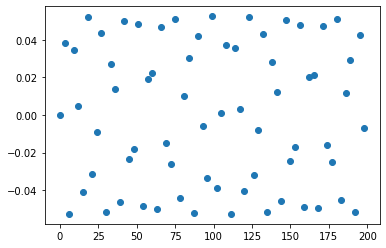

length of x is:  67
length of y is:  67


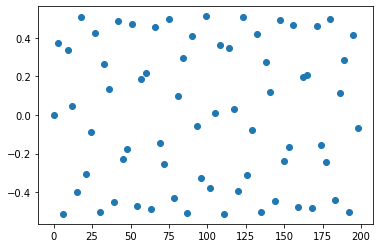

length of x is:  67
length of y is:  67


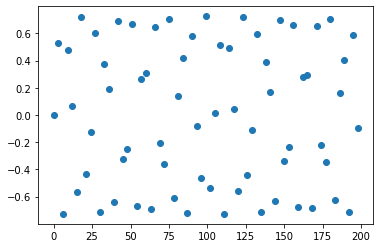

length of x is:  67
length of y is:  67


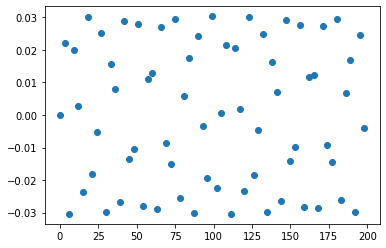

length of x is:  67
length of y is:  67


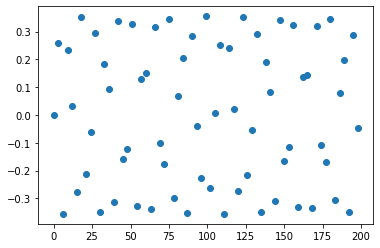

length of x is:  67
length of y is:  67


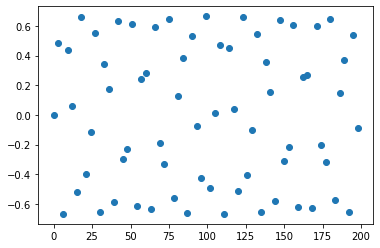

length of x is:  67
length of y is:  67


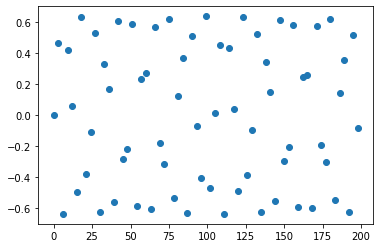

length of x is:  67
length of y is:  67


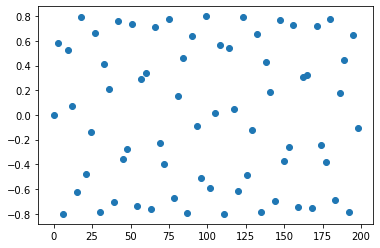

length of x is:  67
length of y is:  67


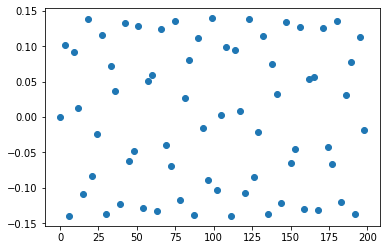

length of x is:  67
length of y is:  67


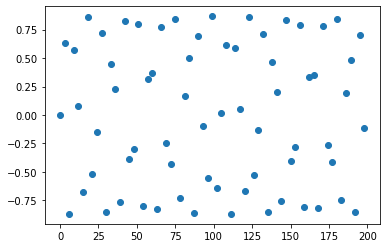

length of x is:  67
length of y is:  67


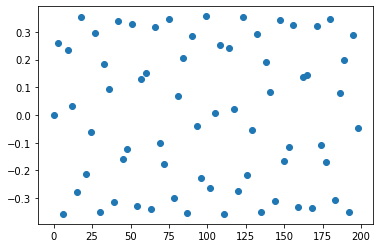

length of x is:  67
length of y is:  67


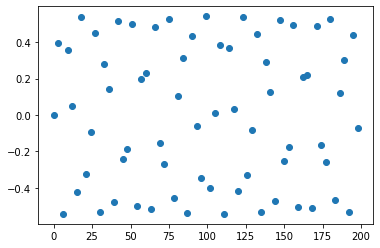

length of x is:  67
length of y is:  67


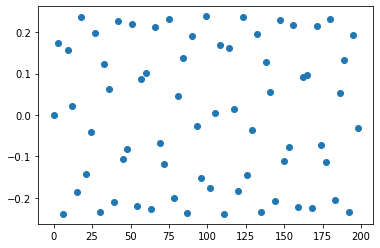

length of x is:  67
length of y is:  67


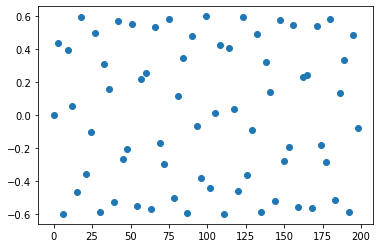

length of x is:  67
length of y is:  67


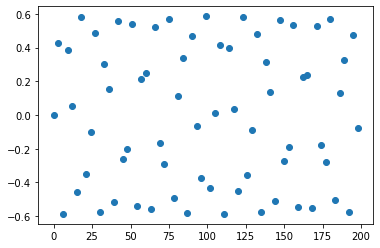

length of x is:  67
length of y is:  67


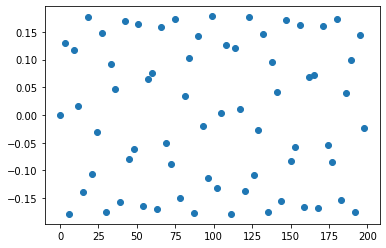

length of x is:  67
length of y is:  67


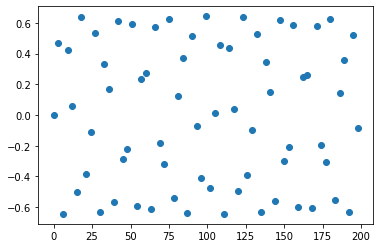

length of x is:  67
length of y is:  67


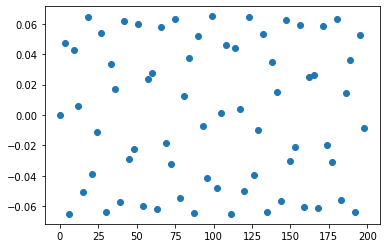

length of x is:  67
length of y is:  67


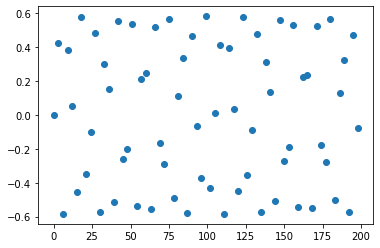

length of x is:  67
length of y is:  67


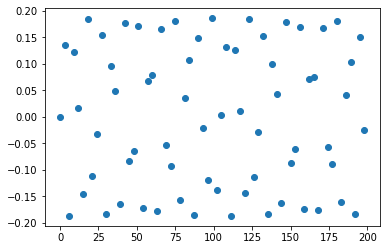

length of x is:  67
length of y is:  67


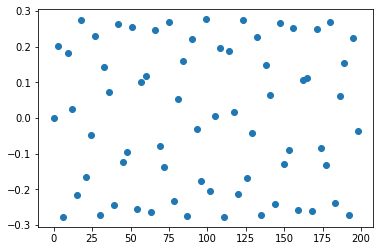

length of x is:  67
length of y is:  67


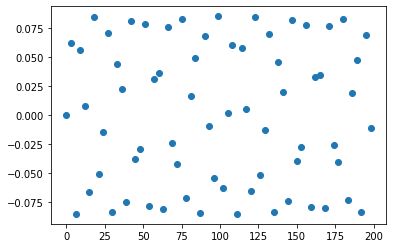

length of x is:  67
length of y is:  67


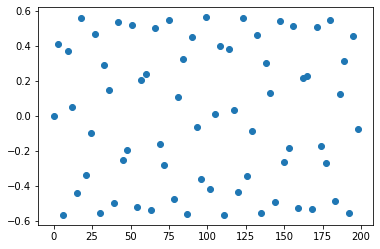

length of x is:  67
length of y is:  67


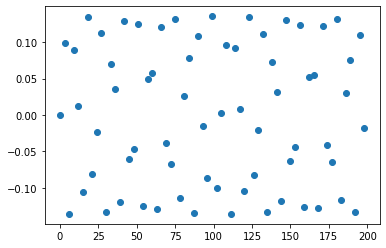

length of x is:  67
length of y is:  67


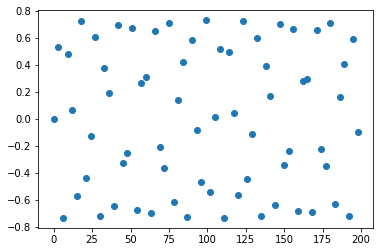

length of x is:  67
length of y is:  67


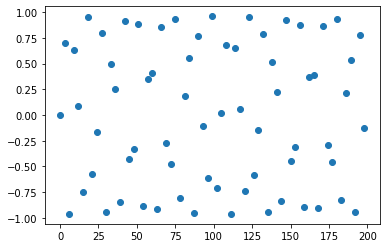

length of x is:  67
length of y is:  67


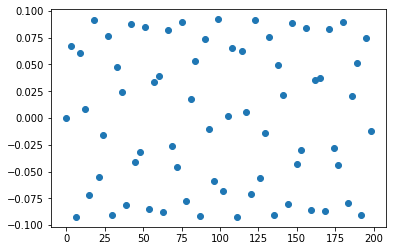

length of x is:  67
length of y is:  67


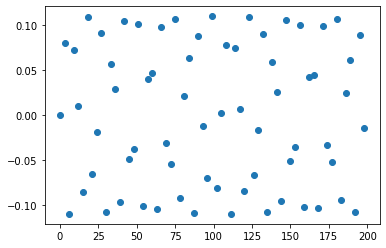

length of x is:  67
length of y is:  67


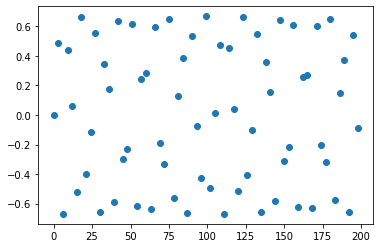

length of x is:  67
length of y is:  67


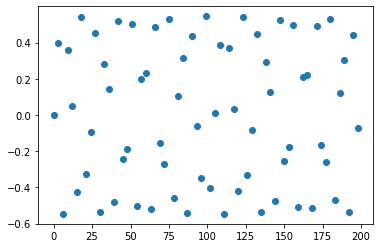

length of x is:  67
length of y is:  67


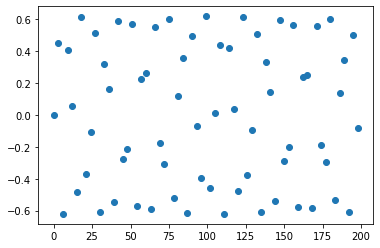

length of x is:  67
length of y is:  67


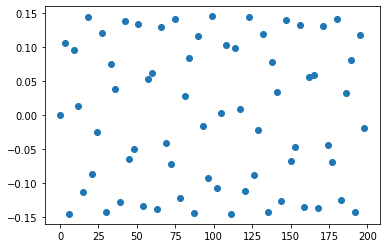

length of x is:  67
length of y is:  67


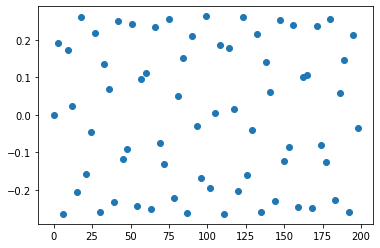

length of x is:  67
length of y is:  67


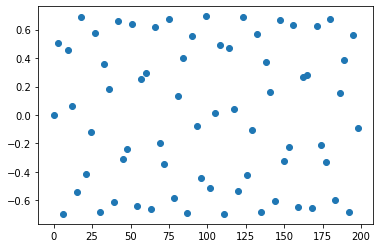

length of x is:  67
length of y is:  67


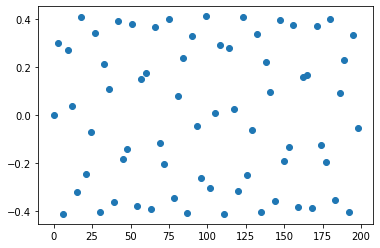

length of x is:  67
length of y is:  67


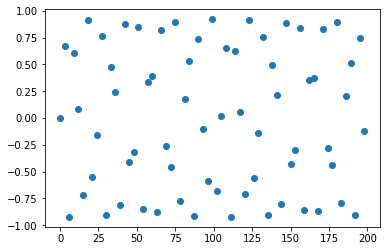

length of x is:  67
length of y is:  67


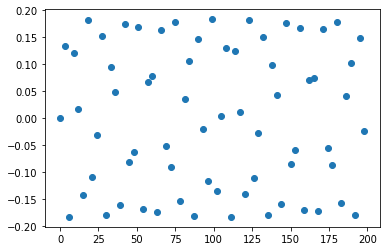

length of x is:  67
length of y is:  67


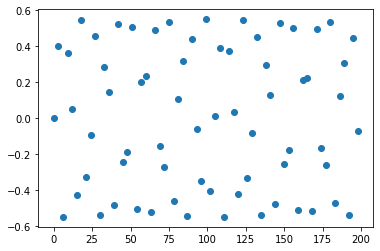

length of x is:  67
length of y is:  67


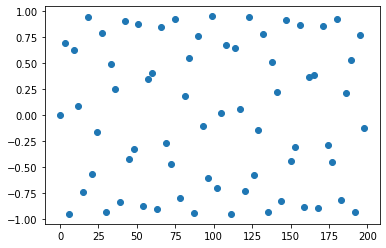

length of x is:  67
length of y is:  67


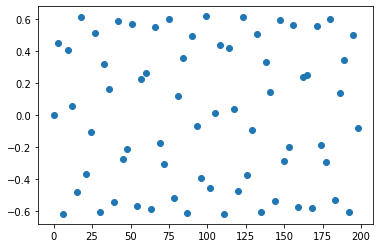

length of x is:  67
length of y is:  67


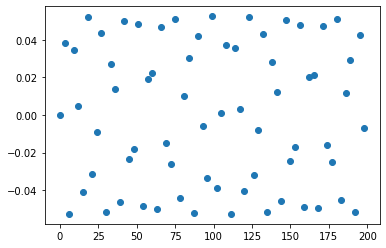

length of x is:  67
length of y is:  67


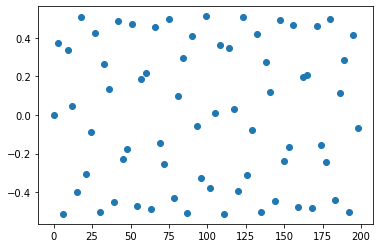

length of x is:  67
length of y is:  67


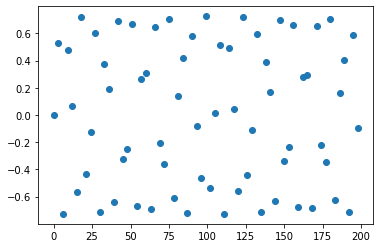

length of x is:  67
length of y is:  67


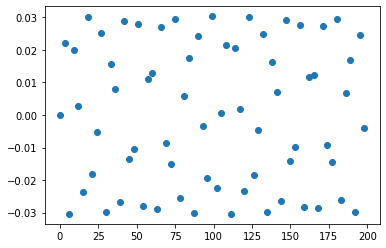

length of x is:  67
length of y is:  67


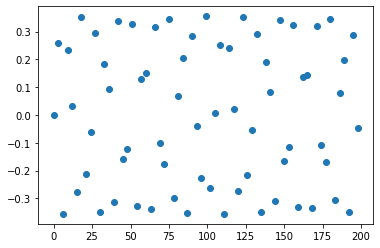

length of x is:  67
length of y is:  67


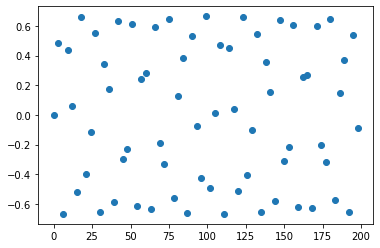

length of x is:  67
length of y is:  67


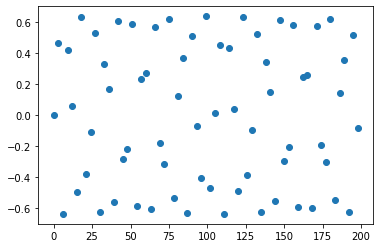

length of x is:  67
length of y is:  67


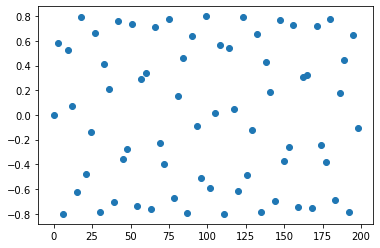

length of x is:  67
length of y is:  67


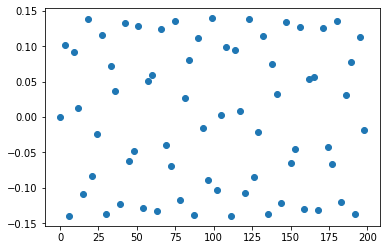

length of x is:  67
length of y is:  67


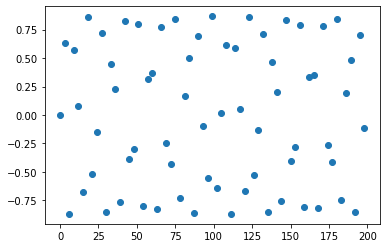

length of x is:  67
length of y is:  67


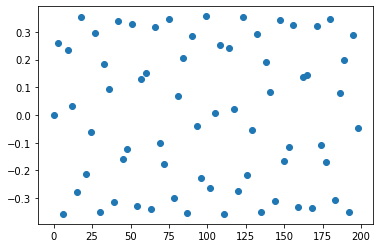

length of x is:  67
length of y is:  67


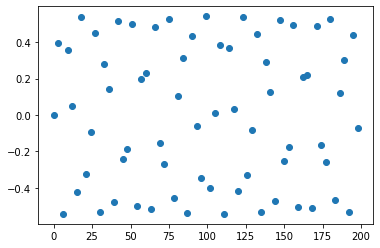

length of x is:  67
length of y is:  67


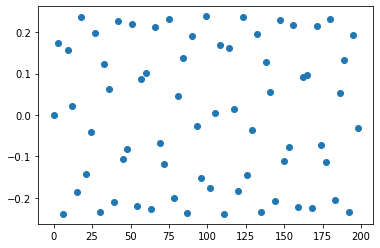

length of x is:  67
length of y is:  67


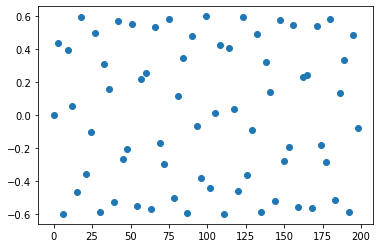

length of x is:  67
length of y is:  67


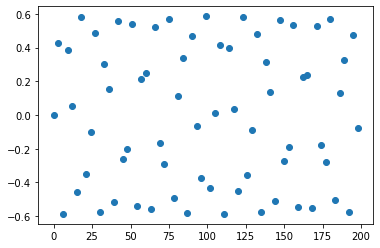

length of x is:  67
length of y is:  67


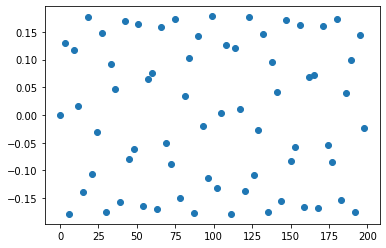

length of x is:  67
length of y is:  67


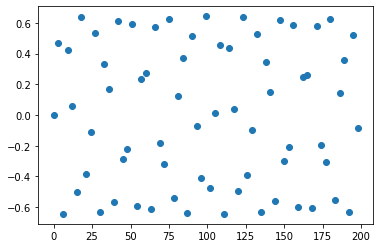

length of x is:  67
length of y is:  67


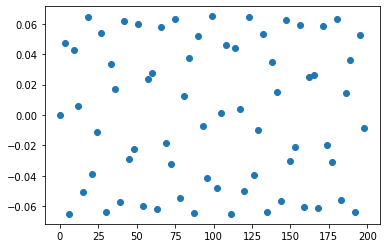

length of x is:  67
length of y is:  67


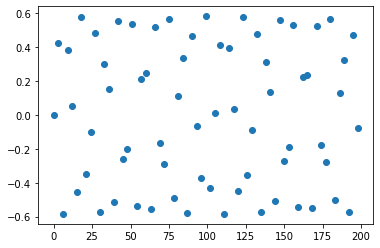

length of x is:  67
length of y is:  67


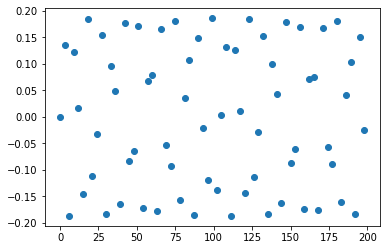

length of x is:  67
length of y is:  67


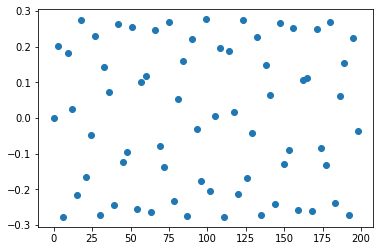

length of x is:  67
length of y is:  67


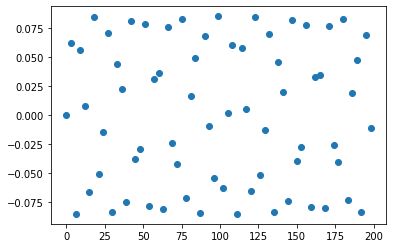

length of x is:  67
length of y is:  67


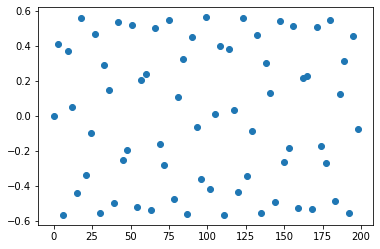

length of x is:  67
length of y is:  67


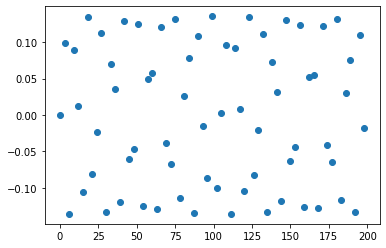

length of x is:  67
length of y is:  67


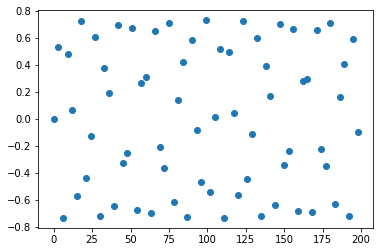

length of x is:  67
length of y is:  67


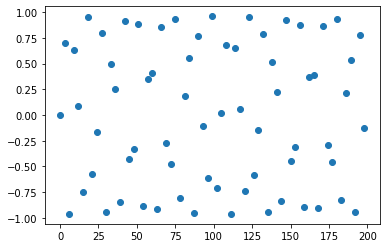

length of x is:  67
length of y is:  67


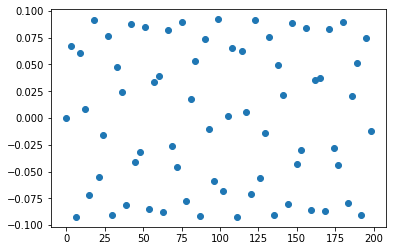

length of x is:  67
length of y is:  67


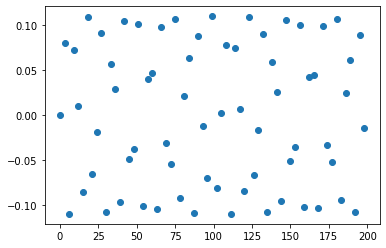

length of x is:  67
length of y is:  67


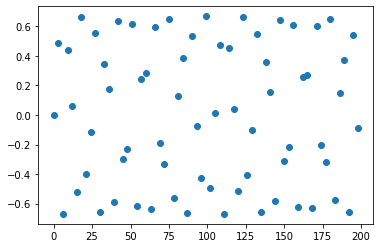

length of x is:  67
length of y is:  67


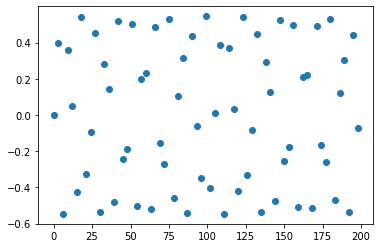

length of x is:  67
length of y is:  67


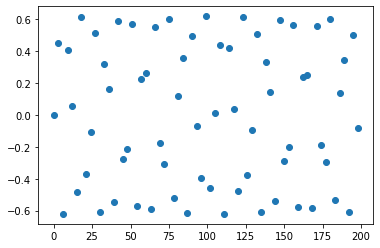

length of x is:  67
length of y is:  67


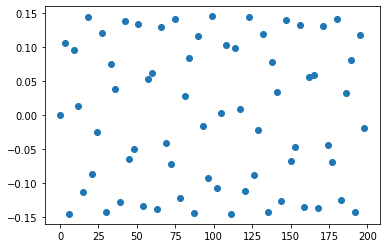

length of x is:  67
length of y is:  67


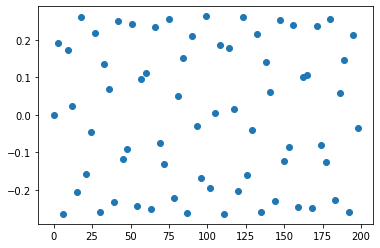

length of x is:  67
length of y is:  67


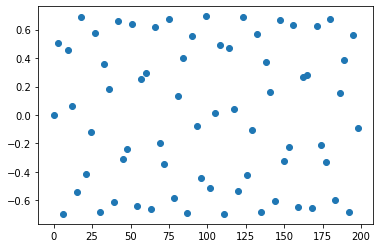

length of x is:  67
length of y is:  67


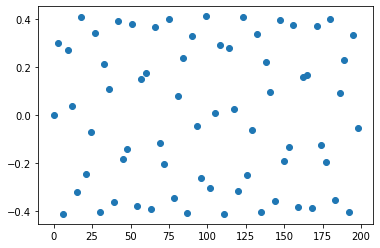

length of x is:  67
length of y is:  67


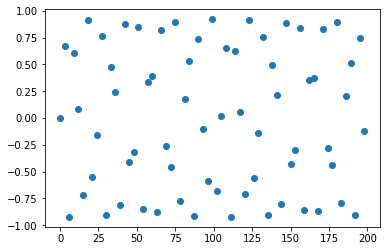

length of x is:  67
length of y is:  67


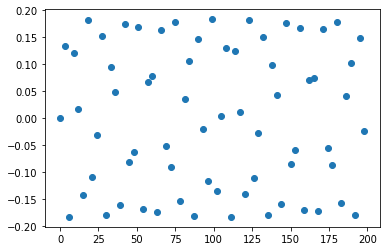

length of x is:  67
length of y is:  67


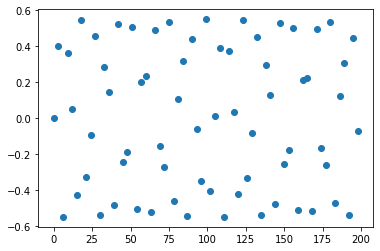

length of x is:  67
length of y is:  67


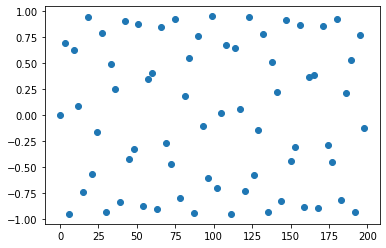

length of x is:  67
length of y is:  67


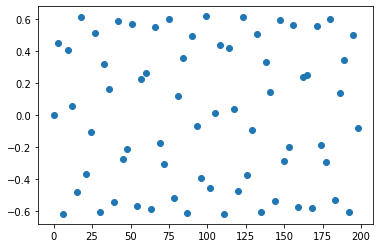

length of x is:  67
length of y is:  67


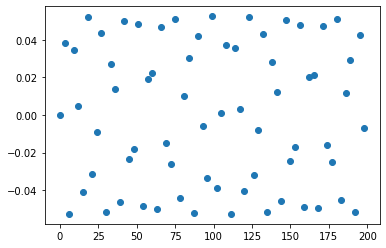

length of x is:  67
length of y is:  67


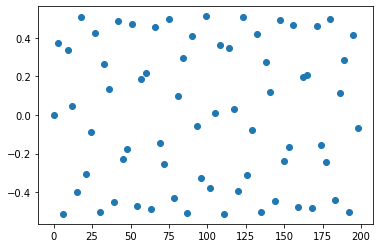

length of x is:  67
length of y is:  67


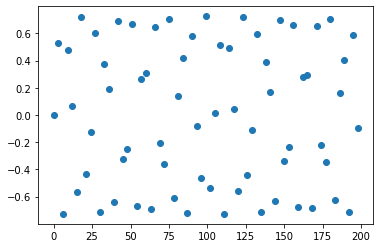

length of x is:  67
length of y is:  67


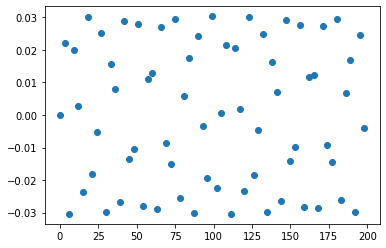

length of x is:  67
length of y is:  67


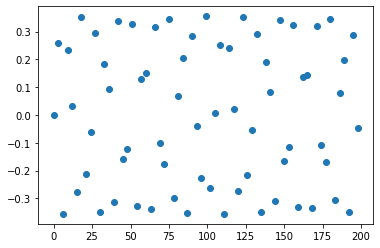

length of x is:  67
length of y is:  67


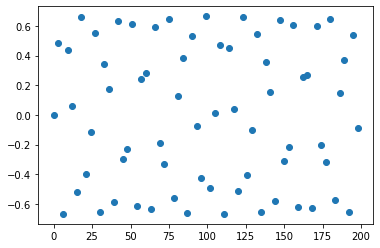

length of x is:  67
length of y is:  67


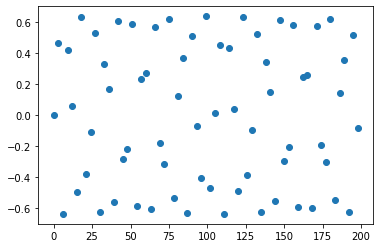

length of x is:  67
length of y is:  67


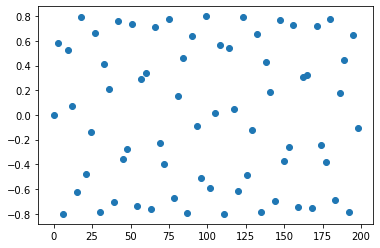

length of x is:  67
length of y is:  67


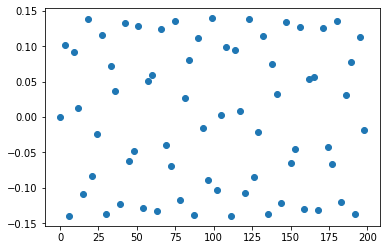

length of x is:  67
length of y is:  67


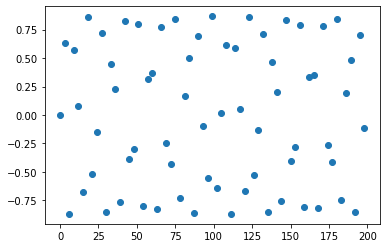

length of x is:  67
length of y is:  67


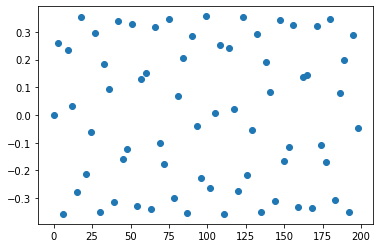

length of x is:  67
length of y is:  67


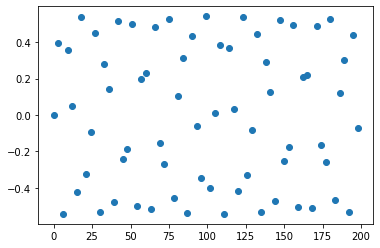

length of x is:  67
length of y is:  67


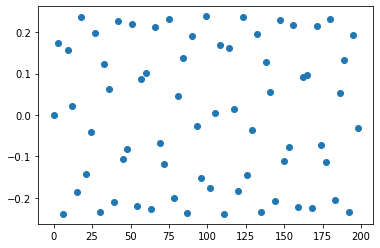

length of x is:  67
length of y is:  67


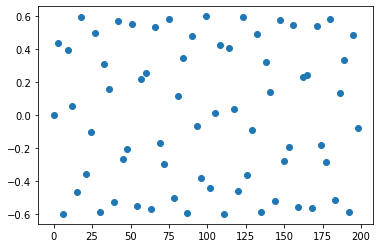

length of x is:  67
length of y is:  67


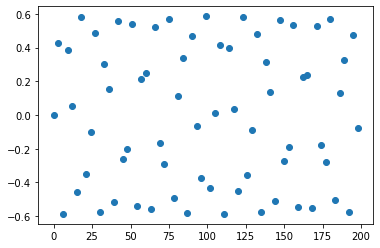

length of x is:  67
length of y is:  67


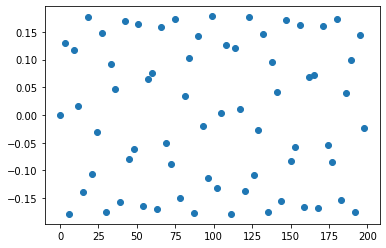

length of x is:  67
length of y is:  67


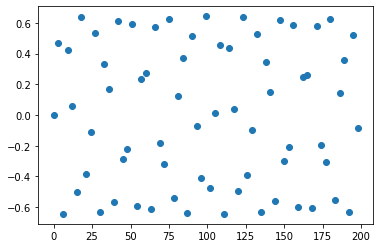

length of x is:  67
length of y is:  67


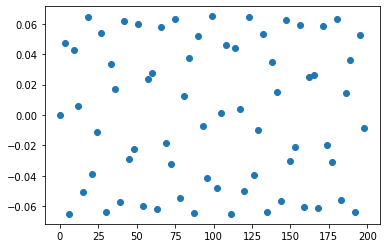

length of x is:  67
length of y is:  67


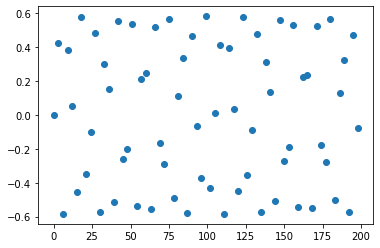

length of x is:  67
length of y is:  67


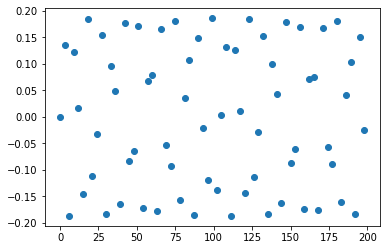

length of x is:  67
length of y is:  67


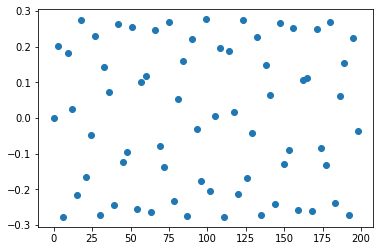

length of x is:  67
length of y is:  67


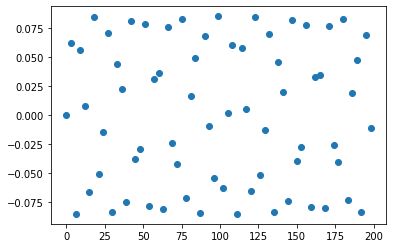

length of x is:  67
length of y is:  67


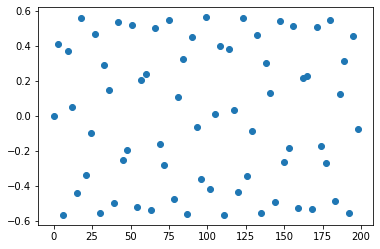

length of x is:  67
length of y is:  67


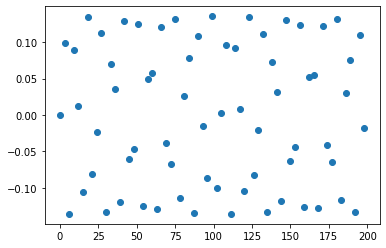

In [ ]:
import matplotlib.pyplot as plt
x = []
y = []
for i in range(0,200):
  if (i%3 == 0):
    x.append(i)

for i in P:
  for j in A:
    tempY = np.sin(np.array(x)*2*np.pi/i);
    new_tempY = tempY.tolist()
    y = [k * float(j) for k in new_tempY]
    print ("length of x is: ", len(x))
    print ("length of y is: ", len(y))
    #print (x)
    #print (y)
    plt.scatter(x,y)
    plt.show()


Genertaing an anomaly (white noise)

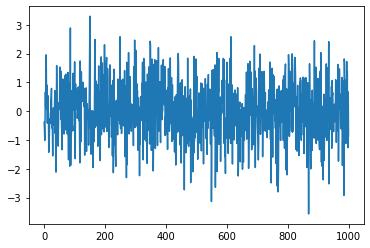

In [ ]:
import numpy
import matplotlib.pyplot as plt

mean = 0
std = 1
num_samples = 1000
samples = numpy.random.normal(mean, std, size=num_samples)

plt.plot(samples)
plt.show()

Plotting an anomaly - tan curves

(-5.0, 5.0)

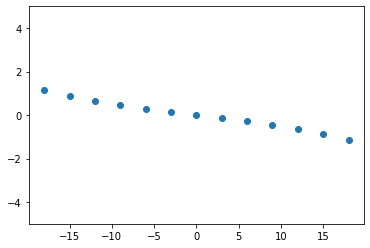

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
x = []
for i in range(-20,20):
    if (i%3 == 0):
      x.append(i)
plt.scatter(x, np.tan(x))
plt.ylim(-5, 5)

generating a randomly sampled tan curve to add as an anomaly at the end of my list of persistence diagrams so that I can see if isolation forest applied to my distance matrix can detect this as an outlier

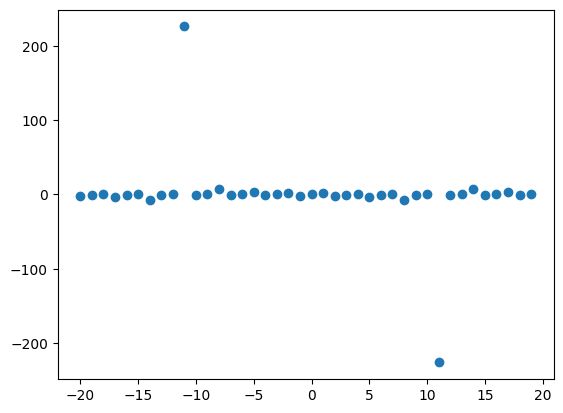

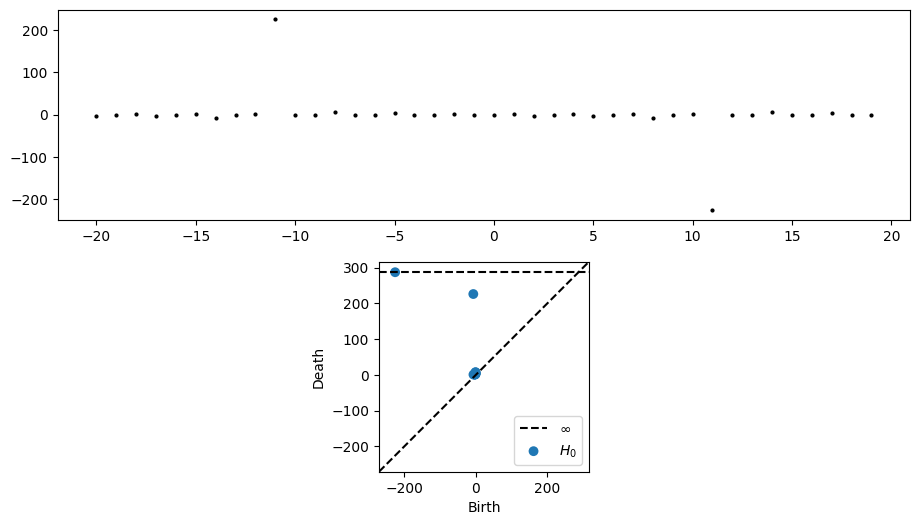

[[  -6.79971123    0.64836085]
 [  -3.49391556    0.85599339]
 [  -3.3805151     0.87144798]
 [  -2.23716092    1.13731372]
 [  -2.18503976    1.1578213 ]
 [  -1.55740774    1.55740774]
 [  -1.1578213     2.18503976]
 [  -0.87144798    3.3805151 ]
 [  -0.85599339    3.49391556]
 [  -0.64836085    6.79971123]
 [  -1.13731372    7.24460649]
 [  -7.24460649  225.95085144]
 [-225.95085144           inf]]


In [ ]:
"""
!pip install ripser
!pip install persim
!pip install scipy
"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import sparse
from ripser import ripser
from persim import plot_diagrams

x = []
for i in range(-20,20):
  if (i%1 == 0):
    x.append(i)
plt.scatter(x, np.tan(x))
npts = len(x)
y = np.tan(x)
I = np.arange(npts - 1)
J = np.arange(1, npts)
V = np.maximum(y[0: -1], y[1::])
# Add vertex birth times along the diagonal of the distance matrix
I = np.concatenate((I, np.arange(npts)))
J = np.concatenate((J, np.arange(npts)))
V = np.concatenate((V, y))
# Create the sparse distance matrix
D = sparse.coo_matrix((V, (I, J)), shape = (npts, npts)).tocsr()
dgm0 = ripser(D, maxdim = 0, distance_matrix = True)['dgms'][0]
dgm0 = dgm0[dgm0[:, 1] - dgm0[:, 0] > 1e-3, :]
allgrid = np.unique(dgm0.flatten())
allgrid = allgrid[allgrid < np.inf]
xs = np.unique(dgm0[:, 0])
ys = np.unique(dgm0[:, 1])
ys = ys[ys < np.inf]
fig, ax = plt.subplots(2, 1, figsize = (11, 6))
ax[0].scatter(x, y, marker = 'o', c = 'k', s = 4)
plot_diagrams(dgm0, size = 50, ax = ax[1])
plt.show()
print (dgm0)

Generating an anomaly- - points on a circle

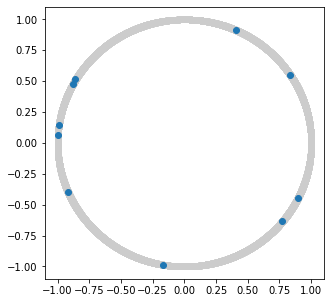

In [ ]:
randProba = lambda a: a/sum(a)
npoints = 5000 # points to chose from
r = 1 # radius of the circle

plt.figure(figsize=(5,5))
t = np.linspace(0, 2*np.pi, npoints, endpoint=False)
x = r * np.cos(t)
y = r * np.sin(t)
plt.scatter(x, y, c='0.8')

n = 10 # number of points to chose
t = np.linspace(0, 2*np.pi, npoints, endpoint=False)[np.random.choice(range(npoints), n, replace=False, p=randProba(np.random.random(npoints)))]
x = r * np.cos(t)
y = r * np.sin(t)

plt.scatter(x, y)

generating a random anomaly - random noise

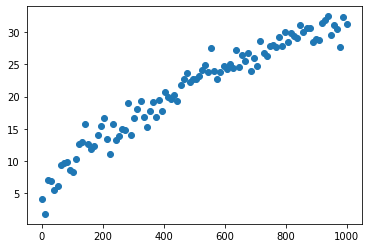

In [ ]:
# Function to calculate the power-law with constants a and b
def power_law(x, a, b):
    return a*np.power(x, b)

x_dummy = np.linspace(start=1, stop=1000, num=100)
y_dummy = power_law(x_dummy, 1, 0.5)
# Add noise from a Gaussian distribution
noise = 1.5*np.random.normal(size=y_dummy.size)
y_dummy = y_dummy + noise

plt.scatter(x_dummy, y_dummy)

Generating an anomaly - gaussian distribution

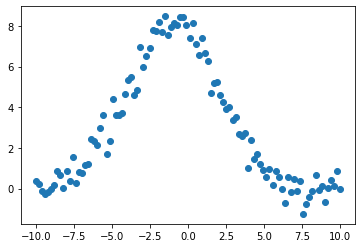

In [ ]:
# Function to calculate the Gaussian with constants a, b, and c
def gaussian(x, a, b, c):
    return a*np.exp(-np.power(x - b, 2)/(2*np.power(c, 2)))
# Generate dummy dataset
x_dummy = np.linspace(start=-10, stop=10, num=100)
y_dummy = gaussian(x_dummy, 8, -1, 3)
# Add noise from a Gaussian distribution
noise = 0.5*np.random.normal(size=y_dummy.size)
y_dummy = y_dummy + noise

plt.scatter(x_dummy, y_dummy)

The first 2 blocks of code I use to generate my P and A values using a uniform distribution. In the third block of code, I plot the values for a specific A and P value. I show the underlying sine curve. In the last block of code, I use my random A and P values to generate about 1400 graphs, with each graph having 100 points. These also have an underlying sine curve but i have not shown it in the last block of code.